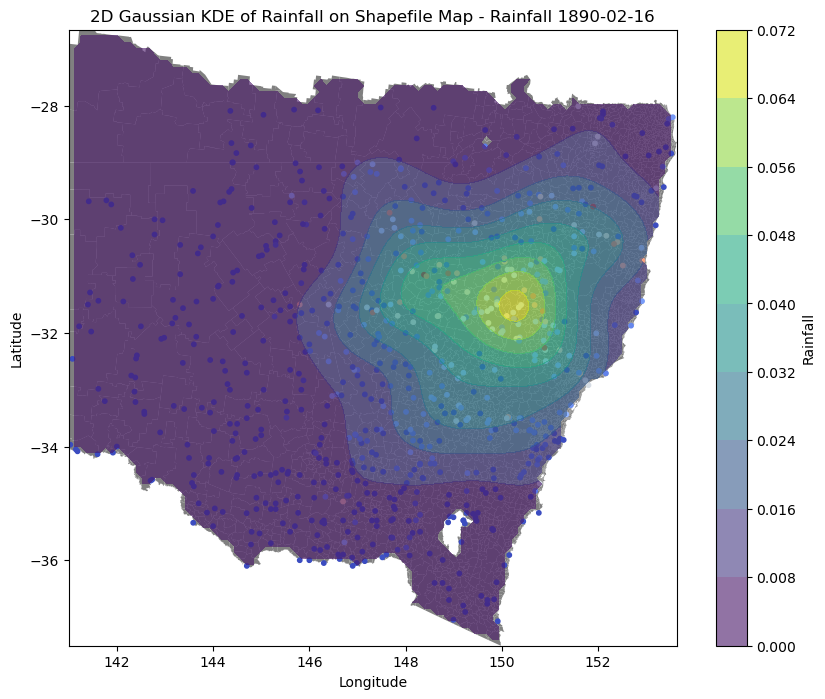

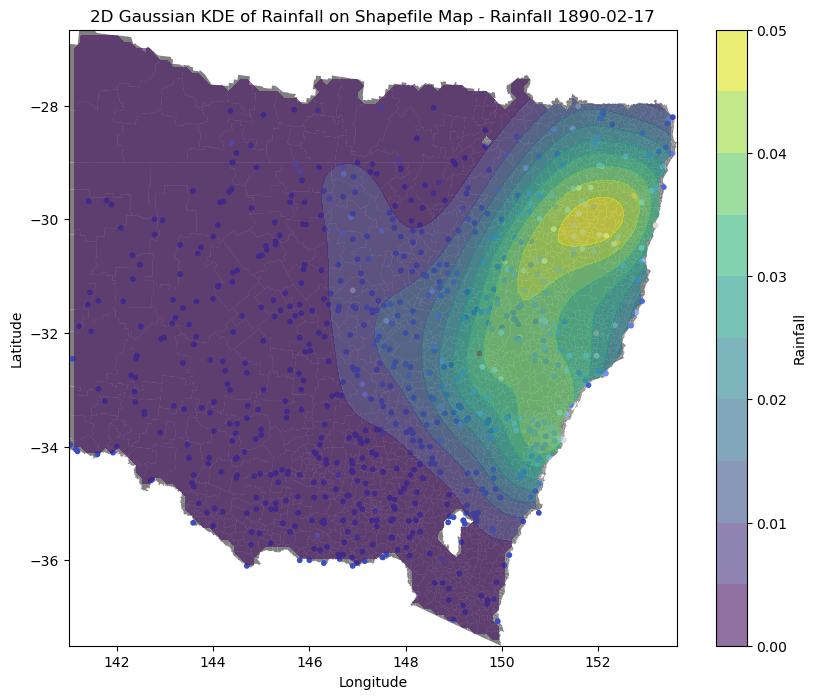

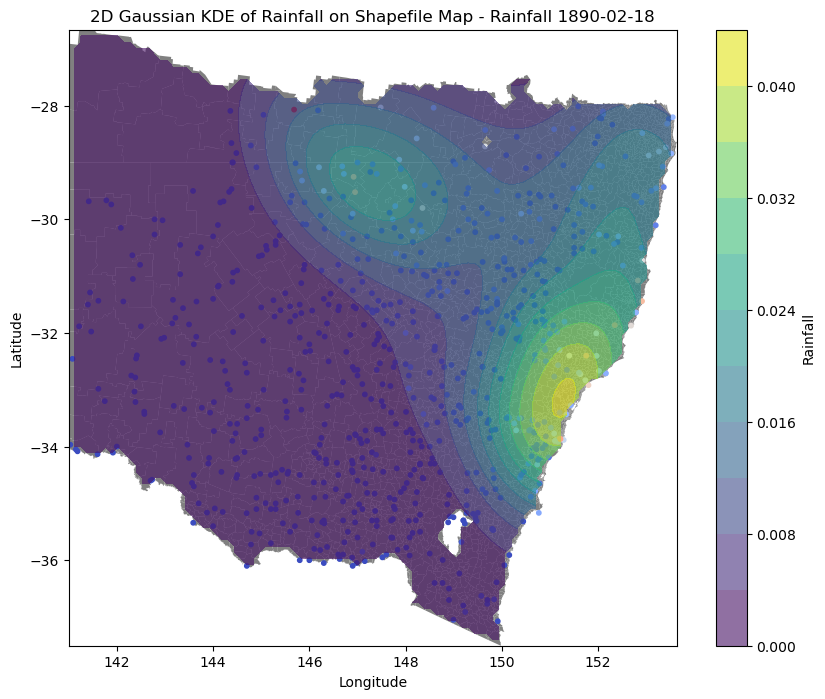

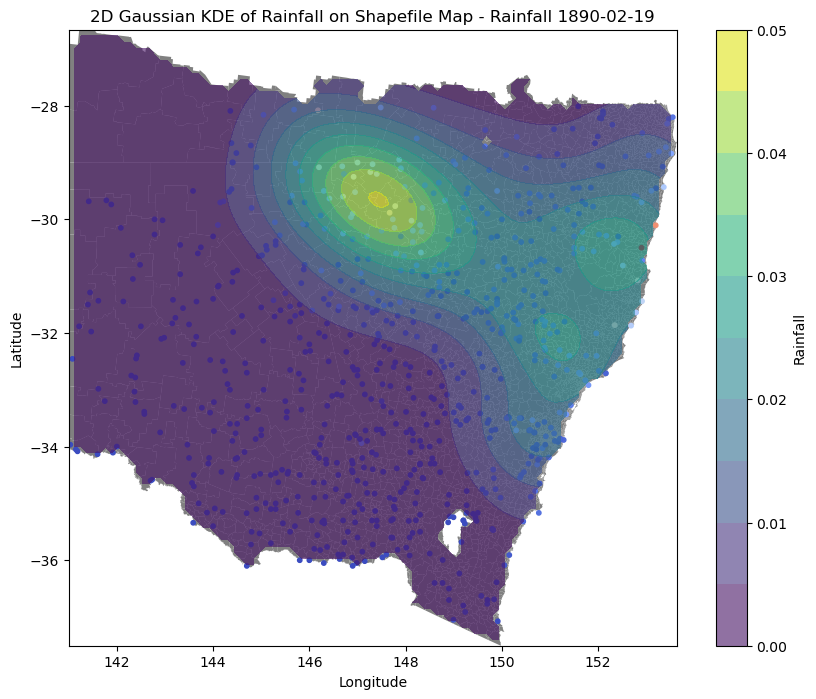

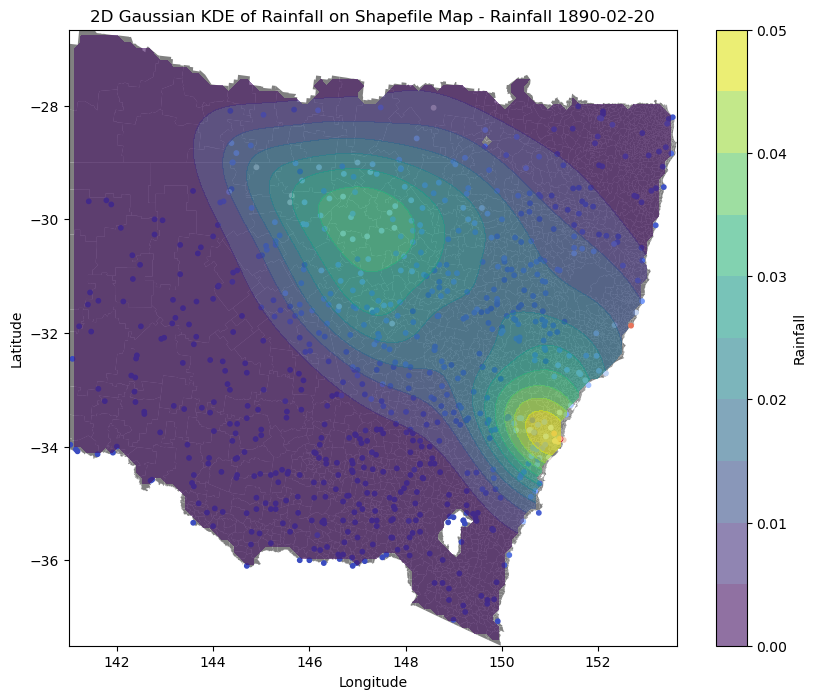

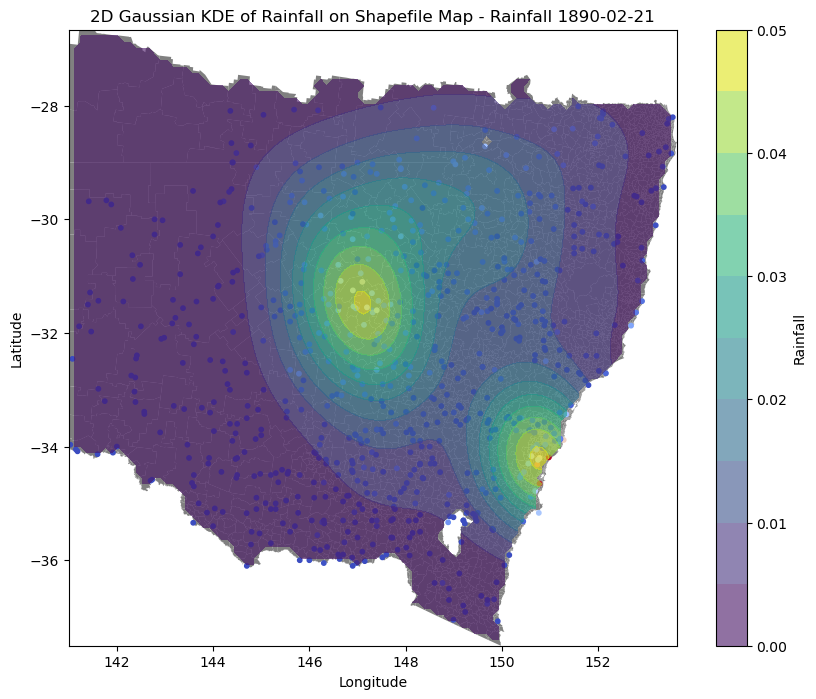

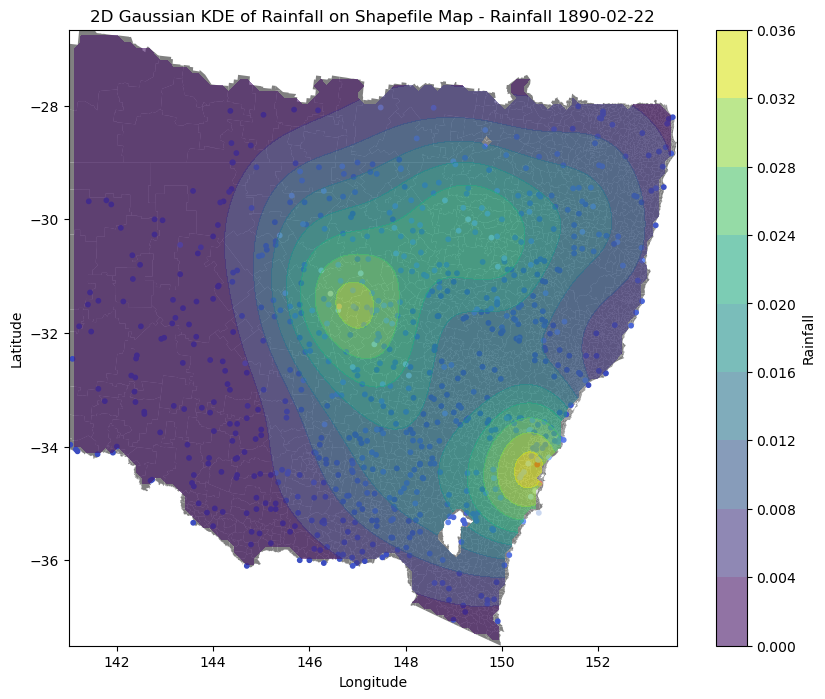

In [3]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point
from scipy.stats import gaussian_kde

# Load the CSV file
csv_file = '/Users/coolkarni/Documents/Documents/Documents/Master thesis Data/BoM Station Dataset/Rainfall Stored values for R1_99 Events/Event 50 - 1890-02-16 to 1890-02-22.csv'
df = pd.read_csv(csv_file)

# Filter out NaN values in latitude and longitude
x_cleaned = df[['Latitude', 'Longitude'] + [col for col in df.columns if col.startswith('Rainfall')]].dropna()

# Read the shapefile
shapefile_path = '/Users/coolkarni/Documents/Documents/Documents/Master thesis Data/combined_shapefile.shp'
gdf = gpd.read_file(shapefile_path)

# Get the bounds of the shapefile
minx, miny, maxx, maxy = gdf.total_bounds

# Create a grid of points within the bounds
xi, yi = np.meshgrid(np.linspace(minx, maxx, 100), np.linspace(miny, maxy, 100))

# Flatten the grid to pass into the KDE function
positions = np.vstack([xi.ravel(), yi.ravel()])

# Iterate through each rainfall column and generate plots
rainfall_columns = [col for col in x_cleaned.columns if col.startswith('Rainfall')]

for col in rainfall_columns:
    rainfall = x_cleaned[col]

    # Perform Gaussian KDE on the rainfall data
    values = np.vstack([x_cleaned['Longitude'], x_cleaned['Latitude']])
    kde = gaussian_kde(values, weights=rainfall, bw_method='scott')
    zi = kde(positions).reshape(xi.shape)

    # Mask the grid to include only points inside the shapefile geometry
    points = np.vstack((xi.flatten(), yi.flatten())).T
    mask = np.array([gdf.contains(Point(point)).any() for point in points])
    mask = mask.reshape(xi.shape)
    zi = np.where(mask, zi, np.nan)

    # Plot the shapefile map
    fig, ax = plt.subplots(figsize=(10, 8))
    gdf.plot(ax=ax, color='gray', edgecolor='none')

    # Plot the 2D contour plot with rainfall as contours
    ax.scatter(x_cleaned['Longitude'], x_cleaned['Latitude'], c=rainfall, cmap='coolwarm', s=10)
    contour = ax.contourf(xi, yi, zi, levels=10, cmap="viridis", alpha=0.6)
    plt.colorbar(contour, ax=ax, label='Rainfall')

    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    ax.set_title(f'2D Gaussian KDE of Rainfall on Shapefile Map - {col}')
    plt.show()


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_3168/798374636.py:7: DeprecationWarning: Please import `maximum_filter` from the `scipy.ndimage` namespace; the `scipy.ndimage.filters` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.ndimage.filters import maximum_filter


Unique counted points: {(152.74497938848484, -28.96242883969697), (145.46774328757576, -30.38620346141414), (150.95758806545453, -33.45279495434343), (147.38280541939392, -30.057640087171716), (151.85128372696968, -28.633865465454548)}
Section counts: [0, 2, 3]


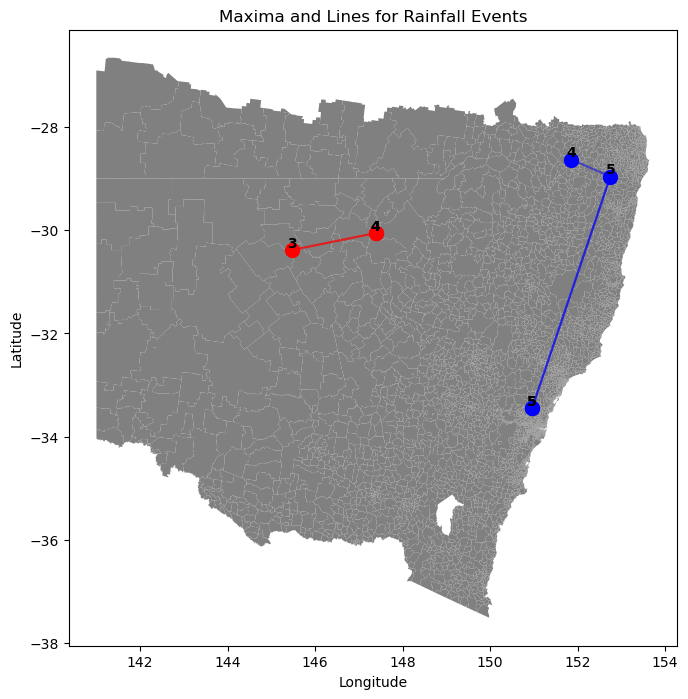

In [11]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point
from scipy.stats import gaussian_kde
from scipy.ndimage.filters import maximum_filter
from scipy.spatial.distance import cdist
from sklearn.cluster import KMeans
from scipy.sparse.csgraph import minimum_spanning_tree

# Haversine function to calculate distance between two lat/long coordinates
def haversine(lon1, lat1, lon2, lat2):
    lon1, lat1, lon2, lat2 = map(np.radians, [lon1, lat1, lon2, lat2])
    dlon = lon2 - lon1
    dlat = lat2 - lat1
    a = np.sin(dlat/2)**2 + np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2)**2
    c = 2 * np.arcsin(np.sqrt(a))
    r = 6371  # Radius of earth in kilometers
    return c * r

# Function to find the mean rainfall value of the 5 nearest stations
def find_nearest_stations_mean_rainfall(df, lon, lat, column):
    df['distance'] = df.apply(lambda row: haversine(lon, lat, row['Longitude'], row['Latitude']), axis=1)
    nearest_stations = df.nsmallest(5, 'distance')
    mean_rainfall = nearest_stations[column].mean()
    return mean_rainfall

# Load the CSV file
csv_file = '/Users/coolkarni/Documents/Documents/Documents/Master thesis Data/BoM Station Dataset/Rainfall Stored values for R1_99 Events/Event 20 - 1897-02-26 to 1897-03-04.csv'
df = pd.read_csv(csv_file)

# Filter out NaN values in latitude and longitude
x_cleaned = df[['Latitude', 'Longitude'] + [col for col in df.columns if col.startswith('Rainfall')]].dropna()

# Read the shapefile
shapefile_path = '/Users/coolkarni/Documents/Documents/Documents/Master thesis Data/combined_shapefile.shp'
gdf = gpd.read_file(shapefile_path)

# Get the bounds of the shapefile
minx, miny, maxx, maxy = gdf.total_bounds

# Create a grid of points within the bounds
xi, yi = np.meshgrid(np.linspace(minx, maxx, 100), np.linspace(miny, maxy, 100))

# Flatten the grid to pass into the KDE function
positions = np.vstack([xi.ravel(), yi.ravel()])

# Set distance threshold (e.g., in degrees, assuming coordinates are in lat/lon)
distance_threshold = 2  # Adjust as needed

# Initialize lists to store coordinates of maxima and their annotations
global_maxima_coords = []
filtered_maxima_coords = []
annotations = []

# Iterate through each rainfall column and generate plots
rainfall_columns = [col for col in x_cleaned.columns if col.startswith('Rainfall')]

for idx, col in enumerate(rainfall_columns, start=1):
    rainfall = x_cleaned[col]

    # Perform Gaussian KDE on the rainfall data
    values = np.vstack([x_cleaned['Longitude'], x_cleaned['Latitude']])
    kde = gaussian_kde(values, weights=rainfall, bw_method='scott')
    zi = kde(positions).reshape(xi.shape)

    # Mask the grid to include only points inside the shapefile geometry
    points = np.vstack((xi.flatten(), yi.flatten())).T
    mask = np.array([gdf.contains(Point(point)).any() for point in points])
    mask = mask.reshape(xi.shape)
    zi = np.where(mask, zi, np.nan)

    # Find global maximum
    global_max_value = np.nanmax(zi)
    global_max_index = np.unravel_index(np.nanargmax(zi), zi.shape)
    global_max_x = xi[global_max_index]
    global_max_y = yi[global_max_index]

    # Find local maxima (peaks)
    local_max = maximum_filter(zi, size=10) == zi
    peaks = np.where(local_max, zi, np.nan)

    # Calculate 50th percentile value of global maximum
    percentile_90 = 0.5 * global_max_value

    # Remove peaks not within 90th percentile of global maximum
    peaks_filtered = np.where(peaks >= percentile_90, peaks, np.nan)

    # Calculate distances from global maximum to each local maximum
    local_max_coords = np.array(list(zip(xi[np.isfinite(peaks_filtered)], yi[np.isfinite(peaks_filtered)])))
    global_max_coords = np.array([[global_max_x, global_max_y]])
    # Check if there are any local maxima
    if local_max_coords.shape[0] > 0:
       # Calculate distances from global maximum to each local maximum
       distances = cdist(global_max_coords, local_max_coords)[0]

       # Apply distance threshold to filter out local maxima too close to the global maximum
       valid_indices = distances > distance_threshold
       filtered_peaks_coords = local_max_coords[valid_indices]
       filtered_peaks_values = peaks_filtered[np.isfinite(peaks_filtered)][valid_indices]

       # Proceed with processing filtered peaks...
       for i, (x, y) in enumerate(filtered_peaks_coords, start=1):
          local_max_rainfall_mean = find_nearest_stations_mean_rainfall(x_cleaned, x, y, col)
          if local_max_rainfall_mean >= 25.0:
               filtered_maxima_coords.append((x, y))
               annotations.append((x, y, f'{idx}'))
    else:
       # No local maxima found, skip this chunk
       print("No local maxima found, skipping filtering.")
    
    # Find mean rainfall value at the global maximum
    global_max_rainfall_mean = find_nearest_stations_mean_rainfall(x_cleaned, global_max_x, global_max_y, col)

    # Check if global maxima exceeds 25.00 mm threshold
    if global_max_rainfall_mean >= 25.00:
        # Store coordinates of global maxima for plotting lines
        global_maxima_coords.append((global_max_x, global_max_y))

        # Prepare annotations for global maximum
        annotations.append((global_max_x, global_max_y, f'{idx}'))

        # Store filtered local maxima (peaks) that also exceed 25.00 mm threshold
        for i, (x, y) in enumerate(filtered_peaks_coords, start=1):
            local_max_rainfall_mean = find_nearest_stations_mean_rainfall(x_cleaned, x, y, col)
            if local_max_rainfall_mean >= 25.0:
                filtered_maxima_coords.append((x, y))
                annotations.append((x, y, f'{idx}'))
    else:
        # If global maxima don't exceed threshold, but some local maxima do, plot those
        for i, (x, y) in enumerate(filtered_peaks_coords, start=1):
            local_max_rainfall_mean = find_nearest_stations_mean_rainfall(x_cleaned, x, y, col)
            if local_max_rainfall_mean >= 25.0:
                filtered_maxima_coords.append((x, y))
                annotations.append((x, y, f'{idx}'))

# Combine global and filtered local maxima coordinates
all_maxima_coords = np.array(global_maxima_coords + filtered_maxima_coords)

# Define a small deviation threshold (in degrees)
deviation_threshold = 0.05  # Adjust as needed

# Divide the map into longitude sections and count points in each section
long_sections = [140, 144, 148, 154]  # Define longitude section boundaries
section_counts = [0] * (len(long_sections) - 1)

# Set to store unique points that are counted
counted_points = set()

for lon, lat in all_maxima_coords:
    for i in range(len(long_sections) - 1):
        # Check if the point is within the section range
        if long_sections[i] <= lon < long_sections[i + 1]:
            # Use tuple of coordinates to track unique points
            if (lon, lat) not in counted_points:
                counted_points.add((lon, lat))
                section_counts[i] += 1
            break  # Exit the loop once the section is found

# Check if the counted points are correctly unique
print("Unique counted points:", counted_points)  # Debug print
print("Section counts:", section_counts)   # Debug print

# Define the threshold for the number of points in each section
point_threshold = 1

# Check if at least two sections satisfy the criteria
satisfying_sections = sum(count > point_threshold for count in section_counts)
perform_clustering = satisfying_sections >= 2


if perform_clustering:
    # Perform K-means clustering with 2 clusters as a default
    kmeans = KMeans(n_clusters=2, random_state=0)
    cluster_labels = kmeans.fit_predict(all_maxima_coords)

    # Initialize dictionaries to store points for each cluster
    clusters = {label: [] for label in set(cluster_labels)}

    # Sort points into their respective clusters
    for label, point in zip(cluster_labels, all_maxima_coords):
        clusters[label].append(point)

    # Plotting code continues here...
    fig, ax = plt.subplots(figsize=(10, 8))
    gdf.plot(ax=ax, color='gray', edgecolor='none')

    # Function to connect points within each cluster using Minimum Spanning Tree
    def connect_points_within_cluster(points, ax, color):
        if len(points) < 2:
            return
        # Compute the distance matrix
        distance_matrix = cdist(points, points)
        # Compute the MST using the distance matrix
        mst = minimum_spanning_tree(distance_matrix).toarray()
        # Plot the MST
        for i in range(len(points)):
            for j in range(len(points)):
                if mst[i, j] > 0:
                    ax.plot([points[i][0], points[j][0]], [points[i][1], points[j][1]], linestyle='-', color=color, alpha=0.5)

    # Plot points and lines for each cluster
    for label in clusters:
        cluster_points = clusters[label]

        # Plot points
        if label == 0:
            color = 'red'
        else:
            color = 'blue'

        for x, y in cluster_points:
            ax.plot(x, y, marker='o', color=color, markersize=10)

        # Connect points within the cluster using MST
        connect_points_within_cluster(cluster_points, ax, color)

else:
    # If no meaningful clusters are found, plot the maxima without clustering
    fig, ax = plt.subplots(figsize=(10, 8))
    gdf.plot(ax=ax, color='gray', edgecolor='none')

    # Plot points for maxima and connect them with lines
    for i, (x, y) in enumerate(all_maxima_coords):
        ax.plot(x, y, marker='o', color='blue', markersize=10)
        if i > 0:
            ax.plot([all_maxima_coords[i-1][0], x], [all_maxima_coords[i-1][1], y], linestyle='-', color='blue', alpha=0.5)

# If there's only one maxima point, just plot it
if len(all_maxima_coords) == 1:
    fig, ax = plt.subplots(figsize=(10, 8))
    gdf.plot(ax=ax, color='gray', edgecolor='none')
    for x, y in all_maxima_coords:
        ax.plot(x, y, marker='o', color='blue', markersize=10)

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title('Maxima and Lines for Rainfall Events')

# Annotate points with numbers
for x, y, label in annotations:
    ax.text(x, y, label, fontsize=10, ha='center', va='bottom', color='black', weight='bold')

plt.show()

In [30]:
import os
import shutil
import re

def find_and_copy_missing_files(first_dir, second_dir, event_prefix, total_events):
    try:
        # Regular expression to match file names
        file_pattern = re.compile(rf"{event_prefix} \d+ - \d{{4}}-\d{{2}}-\d{{2}} to \d{{4}}-\d{{2}}-\d{{2}}")
        
        # List all files in the first directory
        first_dir_files = set(os.listdir(first_dir))
        
        # Filter files to match the pattern
        first_dir_files = {f for f in first_dir_files if file_pattern.match(f)}
        
        # Identify expected file names
        expected_files = {f"{event_prefix} {i} -" for i in range(1, total_events + 1)}
        
        # Find missing files in the first directory
        missing_files = {f for f in expected_files if not any(f in name for name in first_dir_files)}
        
        # Check for missing files in the second directory
        second_dir_files = set(os.listdir(second_dir))
        
        found_files = {f for f in missing_files if any(f in name for name in second_dir_files)}
        not_found_files = missing_files - found_files
        
        # Copy found files from the second directory to the first directory
        for file_name in found_files:
            matched_files = [name for name in second_dir_files if file_name in name]
            for mf in matched_files:
                shutil.copy(os.path.join(second_dir, mf), os.path.join(first_dir, mf))
                print(f"Copied: {mf}")
        
        # Print files that are missing in both directories
        if not_found_files:
            print("Files missing in both directories:")
            for file_name in not_found_files:
                print(file_name)
        
        # Print the total number of missing files
        total_missing_files = len(not_found_files)
        print(f"Total number of files missing in both directories: {total_missing_files}")
    
    except FileNotFoundError as e:
        print(f"Error: {e}")

# Define directory paths
first_directory = '/Users/coolkarni/Documents/Documents/Documents/Master thesis Data/BoM Station Dataset/Map_KDE_3Plots/'
second_directory = '/Users/coolkarni/Documents/Documents/Documents/Master thesis Data/BoM Station Dataset/Map_IDW_3Plots/'

# Define event prefix and total number of events
event_prefix = "Event"
total_events = 1100

# Run the function
find_and_copy_missing_files(first_directory, second_directory, event_prefix, total_events)


Copied: Event 978 - 1885-09-07 to 1885-09-13_output.png
Copied: Event 266 - 1859-01-28 to 1859-02-03_output.png
Copied: Event 1028 - 1887-12-05 to 1887-12-11_output.png
Copied: Event 837 - 1883-11-17 to 1883-11-23_output.png
Copied: Event 1066 - 1867-04-03 to 1867-04-09_output.png
Copied: Event 622 - 1882-12-09 to 1882-12-15_output.png
Copied: Event 493 - 1873-08-14 to 1873-08-20_output.png
Copied: Event 725 - 1877-01-28 to 1877-02-03_output.png
Copied: Event 692 - 1872-12-18 to 1872-12-24_output.png
Copied: Event 323 - 1886-05-24 to 1886-05-30_output.png
Copied: Event 387 - 1873-07-23 to 1873-07-29_output.png
Copied: Event 392 - 1869-11-18 to 1869-11-24_output.png
Copied: Event 1050 - 1871-05-04 to 1871-05-10_output.png
Copied: Event 565 - 1884-04-22 to 1884-04-28_output.png
Copied: Event 958 - 1861-11-27 to 1861-12-03_output.png
Copied: Event 928 - 1861-11-19 to 1861-11-25_output.png
Copied: Event 302 - 1873-12-26 to 1874-01-01_output.png
Copied: Event 971 - 1882-11-20 to 1882-11-26_

In [2]:
# for loading/processing the images  
from keras.preprocessing.image import load_img 
from keras.preprocessing.image import img_to_array 
from keras.applications.vgg16 import preprocess_input 

# models 
from keras.applications.vgg16 import VGG16 
from keras.models import Model

# clustering and dimension reduction
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# for everything else
import os
import numpy as np
import matplotlib.pyplot as plt
from random import randint
import pandas as pd
import pickle

# Define the path
path = '/Users/coolkarni/Documents/Documents/Documents/Master thesis Data/BoM Station Dataset/KDE_Maps1'

# change the working directory to the path where the images are located
os.chdir(path)

# this list holds all the image filenames
tracks = []

# creates a ScandirIterator aliased as files
with os.scandir(path) as files:
    # loops through each file in the directory
    for file in files:
        if file.name.endswith('.png'):
            # adds only the image files to the tracks list
            tracks.append(file.name)

# view the first 10 image entries
print(tracks[:10])

# load the model first and pass as an argument
model = VGG16()
model = Model(inputs=model.inputs, outputs=model.layers[-2].output)

def extract_features(file, model):
    try:
        print(f"Processing file: {file}")
        # load the image as a 224x224 array
        img = load_img(file, target_size=(224,224))
        print("Image loaded successfully.")
        
        # convert from 'PIL.Image.Image' to numpy array
        img = np.array(img) 
        print(f"Image converted to numpy array: {img.shape}")
        
        # reshape the data for the model reshape(num_of_samples, dim 1, dim 2, channels)
        reshaped_img = img.reshape(1,224,224,3) 
        print(f"Image reshaped for model: {reshaped_img.shape}")
        
        # prepare image for model
        imgx = preprocess_input(reshaped_img)
        print("Image preprocessed successfully.")
        
        # get the feature vector
        features = model.predict(imgx)
        print("Features extracted successfully.")
        return features
    except Exception as e:
        print(f"Error processing {file}: {e}")
        return None

data = {}
p = '/Users/coolkarni/Documents/Documents/Documents/Master thesis Data/BoM Station Dataset/Map_features/tracks_features.pkl'

# loop through each image in the dataset
for track in tracks:
    # try to extract the features and update the dictionary
    try:
        file_path = os.path.join(path, track)
        feat = extract_features(file_path, model)
        if feat is not None:
            data[track] = feat
    except Exception as e:
        print(f"Error processing {track}: {e}")
        continue

# save the extracted features as a pickle file
with open(p, 'wb') as file:
    pickle.dump(data, file)

# Check if data dictionary is filled
print(f"Extracted features for {len(data)} images")



['Event 125 - 1879-08-04 to 1879-08-10_Days_2_to_5_KDE.png', 'Event 119 - 1875-04-30 to 1875-05-06_Days_2_to_5_KDE.png', 'Event 57 - 1887-03-24 to 1887-03-30_Days_4_to_7_KDE.png', 'Event 35 - 1898-02-11 to 1898-02-17_Days_2_to_5_KDE.png', 'Event 103 - 1891-04-11 to 1891-04-17_Days_4_to_7_KDE.png', 'Event 97 - 1894-02-09 to 1894-02-15_Day_1_KDE.png', 'Event 156 - 1879-02-14 to 1879-02-20_Days_2_to_4_KDE.png', 'Event 181 - 1873-04-10 to 1873-04-16_Day_3_KDE.png', 'Event 179 - 1870-05-08 to 1870-05-14_Days_3_to_6_KDE.png', 'Event 96 - 1894-01-19 to 1894-01-25_Days_4_to_7_KDE.png']
Processing file: /Users/coolkarni/Documents/Documents/Documents/Master thesis Data/BoM Station Dataset/KDE_Maps1/Event 125 - 1879-08-04 to 1879-08-10_Days_2_to_5_KDE.png
Image loaded successfully.
Image converted to numpy array: (224, 224, 3)
Image reshaped for model: (1, 224, 224, 3)
Image preprocessed successfully.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step
Features extracted successfully.
Processing file: /Users/

In [3]:
# get a list of the filenames
filenames = np.array(list(data.keys()))
print(filenames)

['Event 125 - 1879-08-04 to 1879-08-10_Days_2_to_5_KDE.png'
 'Event 119 - 1875-04-30 to 1875-05-06_Days_2_to_5_KDE.png'
 'Event 57 - 1887-03-24 to 1887-03-30_Days_4_to_7_KDE.png'
 'Event 35 - 1898-02-11 to 1898-02-17_Days_2_to_5_KDE.png'
 'Event 103 - 1891-04-11 to 1891-04-17_Days_4_to_7_KDE.png'
 'Event 97 - 1894-02-09 to 1894-02-15_Day_1_KDE.png'
 'Event 156 - 1879-02-14 to 1879-02-20_Days_2_to_4_KDE.png'
 'Event 181 - 1873-04-10 to 1873-04-16_Day_3_KDE.png'
 'Event 179 - 1870-05-08 to 1870-05-14_Days_3_to_6_KDE.png'
 'Event 96 - 1894-01-19 to 1894-01-25_Days_4_to_7_KDE.png'
 'Event 86 - 1894-12-30 to 1895-01-05_Days_6_to_7_KDE.png'
 'Event 4 - 1890-03-04 to 1890-03-10_Day_1_KDE.png'
 'Event 30 - 1895-01-20 to 1895-01-26_Day_7_KDE.png'
 'Event 58 - 1887-07-10 to 1887-07-16_Days_1_to_2_KDE.png'
 'Event 48 - 1896-02-24 to 1896-03-01_Days_1_to_4_KDE.png'
 'Event 40 - 1890-03-22 to 1890-03-28_Days_3_to_6_KDE.png'
 'Event 70 - 1888-12-14 to 1888-12-20_Days_3_to_4_KDE.png'
 'Event 100 - 19

In [4]:
# get a list of just the features
feat = np.array(list(data.values()))
feat.shape

(157, 1, 4096)

In [5]:
# reshape so that there are 871 samples of 4096 vectors
feat = feat.reshape(-1,4096)
feat.shape

(157, 4096)

In [6]:
pca = PCA(n_components=100, random_state=22)
pca.fit(feat)
x = pca.transform(feat)

In [7]:
kmeans = KMeans(n_clusters=6, random_state=22)
kmeans.fit(x)

KMeans(n_clusters=6, random_state=22)

In [8]:
kmeans.labels_

array([2, 2, 4, 4, 1, 5, 2, 3, 3, 4, 4, 5, 2, 2, 4, 2, 5, 4, 4, 4, 4, 2,
       4, 5, 2, 1, 4, 2, 1, 4, 4, 1, 0, 3, 3, 3, 5, 2, 5, 0, 0, 2, 2, 5,
       5, 0, 4, 1, 5, 5, 4, 5, 2, 0, 3, 2, 1, 0, 2, 0, 3, 0, 2, 1, 4, 3,
       1, 4, 5, 4, 1, 1, 1, 1, 0, 5, 1, 0, 1, 4, 3, 3, 4, 2, 4, 0, 2, 3,
       1, 4, 5, 4, 1, 5, 4, 5, 4, 2, 4, 2, 2, 4, 1, 3, 4, 4, 4, 5, 2, 1,
       1, 3, 2, 2, 4, 0, 0, 5, 2, 1, 5, 2, 4, 4, 1, 3, 2, 1, 5, 3, 0, 5,
       4, 4, 1, 1, 1, 3, 0, 0, 5, 4, 4, 5, 2, 2, 1, 0, 4, 5, 1, 3, 0, 0,
       4, 1, 3], dtype=int32)

In [14]:
# holds the cluster id and the images { id: [images] }
groups = {}
for file, cluster in zip(filenames,kmeans.labels_):
    if cluster not in groups.keys():
        groups[cluster] = []
        groups[cluster].append(file)
    else:
        groups[cluster].append(file)

In [18]:
#view the filenames in cluster 0
groups[0]

['Event 119 - 1875-04-30 to 1875-05-06_Days_2_to_5_KDE.png',
 'Event 57 - 1887-03-24 to 1887-03-30_Days_4_to_7_KDE.png',
 'Event 35 - 1898-02-11 to 1898-02-17_Days_2_to_5_KDE.png',
 'Event 156 - 1879-02-14 to 1879-02-20_Days_2_to_4_KDE.png',
 'Event 181 - 1873-04-10 to 1873-04-16_Day_3_KDE.png',
 'Event 96 - 1894-01-19 to 1894-01-25_Days_4_to_7_KDE.png',
 'Event 86 - 1894-12-30 to 1895-01-05_Days_6_to_7_KDE.png',
 'Event 48 - 1896-02-24 to 1896-03-01_Days_1_to_4_KDE.png',
 'Event 40 - 1890-03-22 to 1890-03-28_Days_3_to_6_KDE.png',
 'Event 100 - 1900-06-09 to 1900-06-15_Days_5_to_7_KDE.png',
 'Event 102 - 1887-02-11 to 1887-02-17_Days_6_to_7_KDE.png',
 'Event 20 - 1897-02-26 to 1897-03-04_Days_3_to_6_KDE.png',
 'Event 60 - 1891-07-29 to 1891-08-04_Days_4_to_7_KDE.png',
 'Event 92 - 1899-05-26 to 1899-06-01_Days_3_to_6_KDE.png',
 'Event 62 - 1890-04-21 to 1890-04-27_Days_4_to_7_KDE.png',
 'Event 21 - 1897-07-22 to 1897-07-28_Days_3_to_6_KDE.png',
 'Event 121 - 1876-04-11 to 1876-04-17_Da

Fit 2 clusters, SSE: 184428.9375, Silhouette Score: 0.06696246564388275
Fit 3 clusters, SSE: 168069.671875, Silhouette Score: 0.06213248148560524
Fit 4 clusters, SSE: 160811.921875, Silhouette Score: 0.0569462925195694
Fit 5 clusters, SSE: 155009.53125, Silhouette Score: 0.06074322387576103
Fit 6 clusters, SSE: 146871.25, Silhouette Score: 0.06354018300771713
Fit 7 clusters, SSE: 144529.265625, Silhouette Score: 0.0579325370490551
Fit 8 clusters, SSE: 139366.203125, Silhouette Score: 0.06302496790885925
Fit 9 clusters, SSE: 138524.53125, Silhouette Score: 0.056173961609601974
Fit 10 clusters, SSE: 134124.1875, Silhouette Score: 0.05644025653600693
Fit 11 clusters, SSE: 131567.015625, Silhouette Score: 0.0565170980989933
Fit 12 clusters, SSE: 127953.203125, Silhouette Score: 0.056214410811662674
Fit 13 clusters, SSE: 125587.3203125, Silhouette Score: 0.05676720291376114
Fit 14 clusters, SSE: 124217.8984375, Silhouette Score: 0.05131332576274872
Fit 15 clusters, SSE: 121222.5859375, Silh

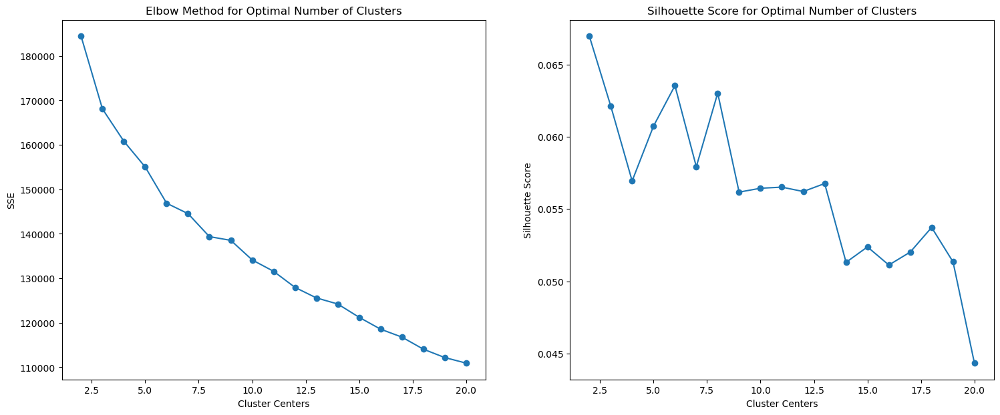

Optimal number of clusters based on Silhouette Score: 2


In [18]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

# Determine the optimal number of clusters using the Elbow method and Silhouette score
def find_optimal_clusters(data, max_k):
    iters = range(2, max_k + 1)  # Silhouette score requires at least 2 clusters
    sse = []
    silhouette_scores = []

    for k in iters:
        kmeans = KMeans(n_clusters=k, random_state=22)
        kmeans.fit(x)
        sse.append(kmeans.inertia_)
        
        score = silhouette_score(data, kmeans.labels_)
        silhouette_scores.append(score)
        
        print(f'Fit {k} clusters, SSE: {kmeans.inertia_}, Silhouette Score: {score}')

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7))
    ax1.plot(iters, sse, marker='o')
    ax1.set_xlabel('Cluster Centers')
    ax1.set_ylabel('SSE')
    ax1.set_title('Elbow Method for Optimal Number of Clusters')
    
    ax2.plot(iters, silhouette_scores, marker='o')
    ax2.set_xlabel('Cluster Centers')
    ax2.set_ylabel('Silhouette Score')
    ax2.set_title('Silhouette Score for Optimal Number of Clusters')
    
    plt.show()
    
    # Find the optimal number of clusters based on the highest silhouette score
    optimal_k = iters[silhouette_scores.index(max(silhouette_scores))]
    print(f'Optimal number of clusters based on Silhouette Score: {optimal_k}')

# Find the optimal number of clusters
find_optimal_clusters(x, 20)


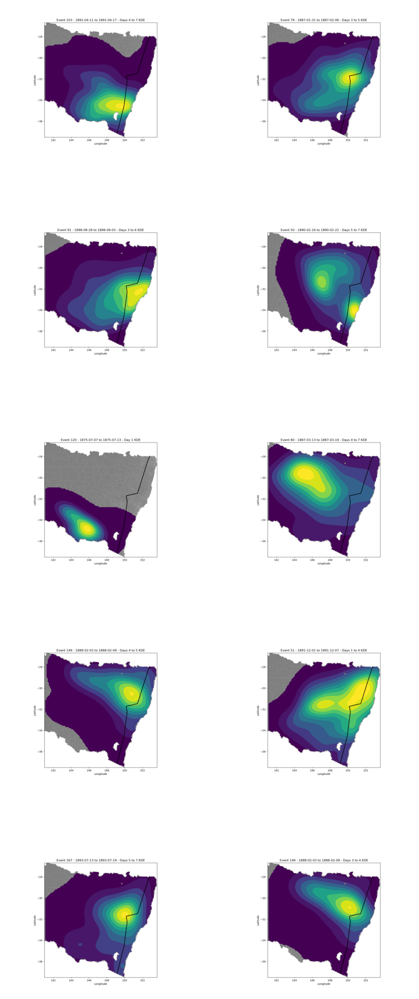

In [22]:
# Function to display images in a cluster
def show_cluster_images(cluster_id):
    cluster_images = groups[cluster_id]
    plt.figure(figsize=(10, 25))  # Adjust the figure size as needed
    num_images = min(len(cluster_images), 10)  # Display up to 10 images (5 rows, 2 columns)
    
    for idx, img_file in enumerate(cluster_images[:num_images]):
        img = load_img(os.path.join(path, img_file))
        img = img_to_array(img)
        img = img / 255.0
        plt.subplot(5, 2, idx + 1)
        plt.imshow(img)
        plt.axis('off')
    
    plt.show()

# Show images in cluster 0
show_cluster_images(1)


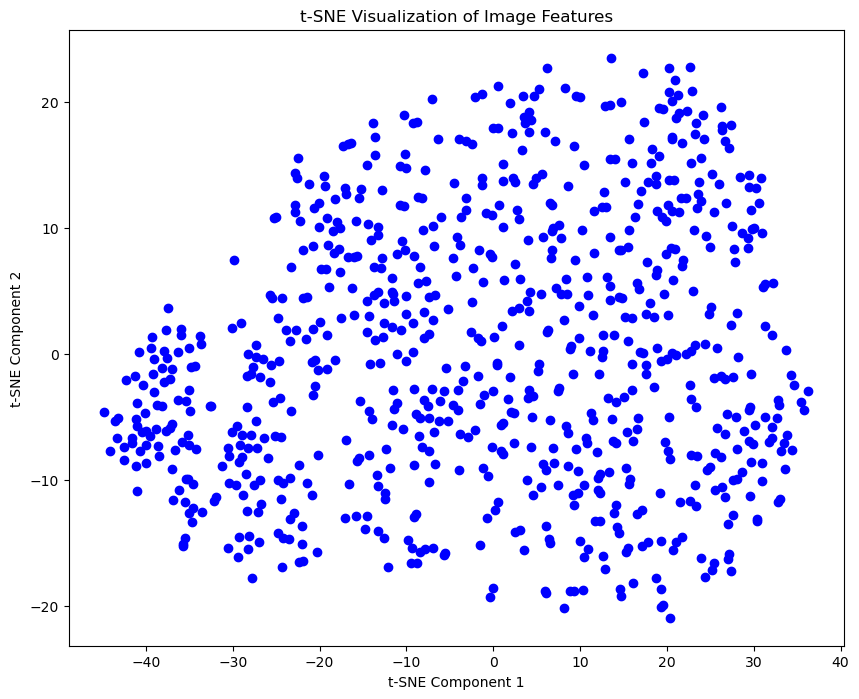

In [48]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import pickle
import numpy as np

# Define the path to the features pickle file
features_path = '/Users/coolkarni/Documents/Documents/Documents/Master thesis Data/BoM Station Dataset/Map_features/tracks_features.pkl'

# Load the extracted features
with open(features_path, 'rb') as file:
    data = pickle.load(file)

# Extract the feature vectors and corresponding filenames
features = []
filenames = []
for filename, feat in data.items():
    features.append(feat.flatten())
    filenames.append(filename)

# Convert the list of features to a numpy array
features = np.array(features)

# Apply t-SNE to reduce the features to 2D
tsne = TSNE(n_components=2, random_state=42)
features_2d = tsne.fit_transform(features)

# Plot the reduced features on a scatter plot
plt.figure(figsize=(10, 8))
plt.scatter(features_2d[:, 0], features_2d[:, 1], c='blue', marker='o')
plt.title('t-SNE Visualization of Image Features')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')


plt.show()


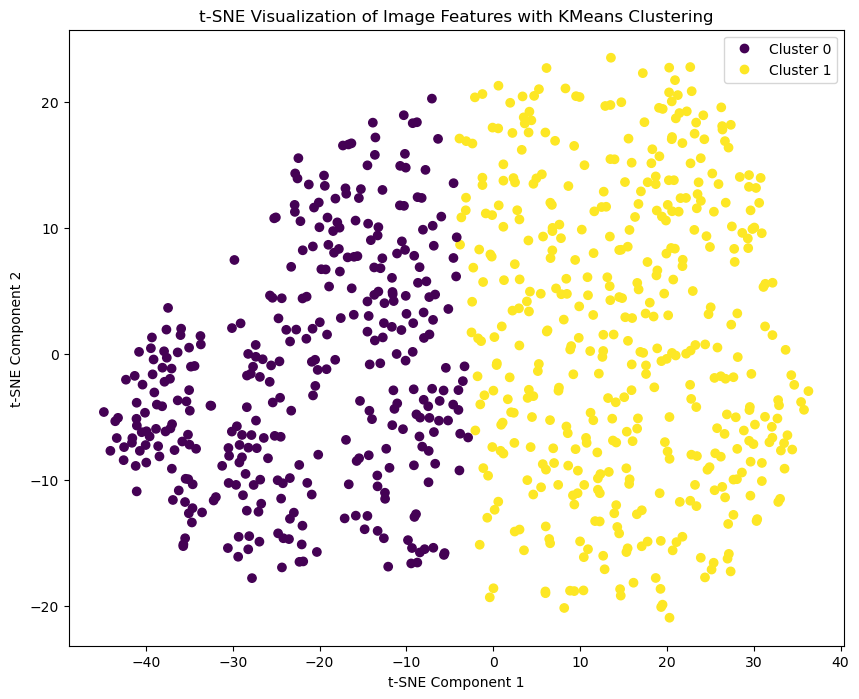

Cluster 0:
  Event 246 - 1880-03-31 to 1880-04-06.png


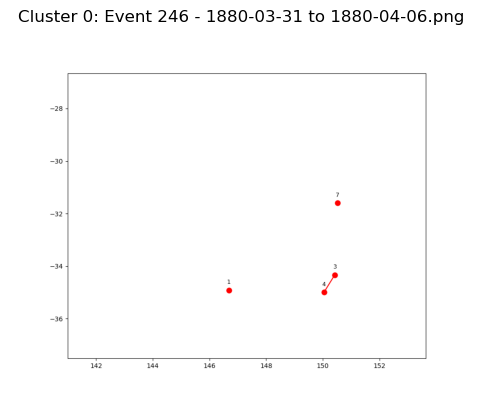

  Event 610 - 1888-09-21 to 1888-09-27.png


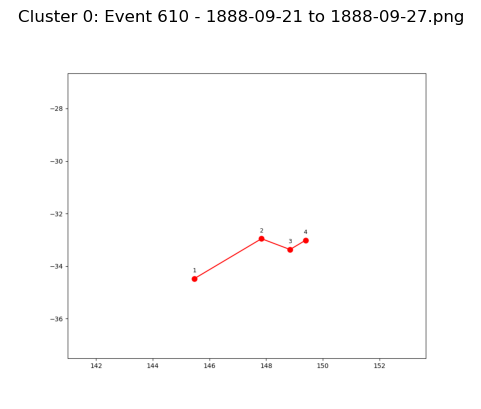

  Event 901 - 1887-04-07 to 1887-04-13.png


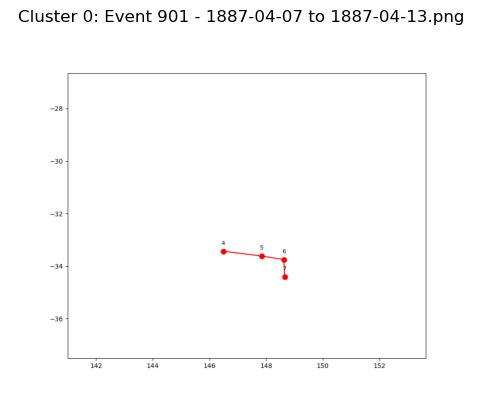

  Event 510 - 1884-08-22 to 1884-08-28.png


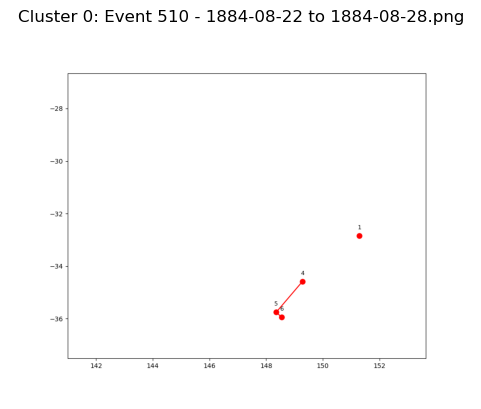

  Event 295 - 1872-01-20 to 1872-01-26.png


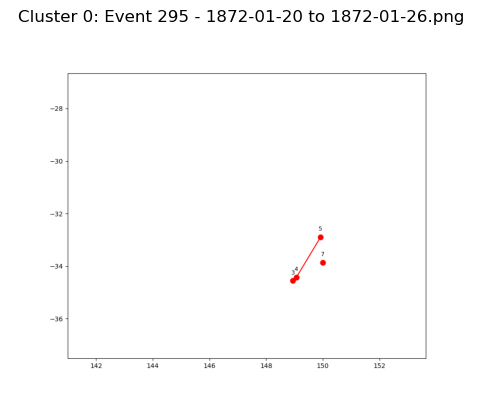

  Event 148 - 1886-07-19 to 1886-07-25.png


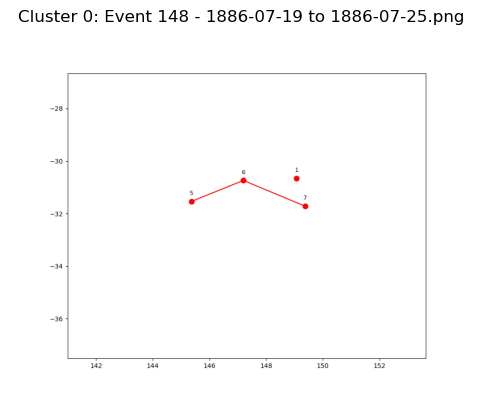

  Event 185 - 1882-04-02 to 1882-04-08.png


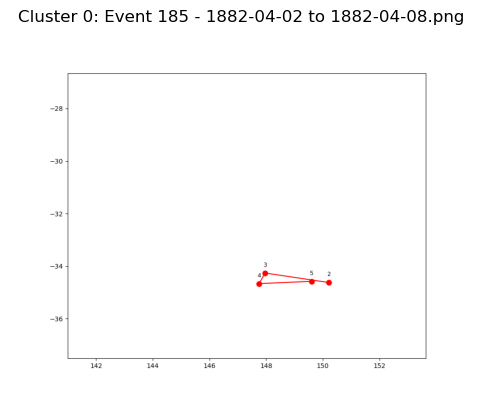

  Event 978 - 1885-09-07 to 1885-09-13.png


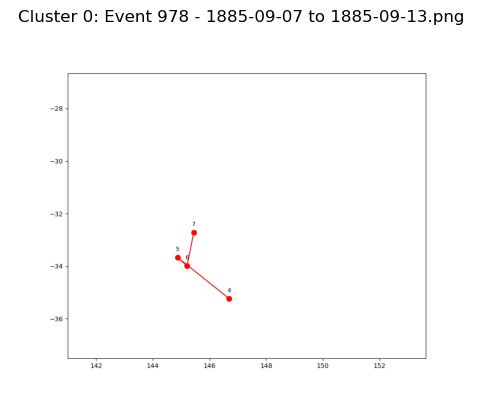

  Event 97 - 1894-02-09 to 1894-02-15.png


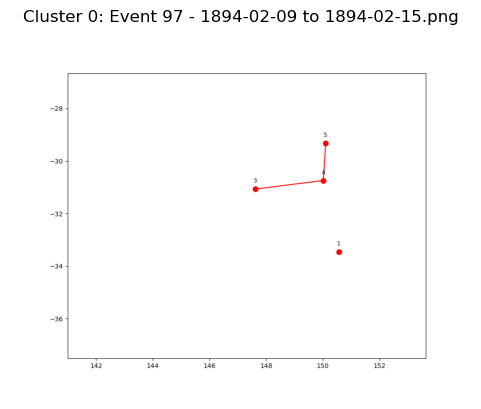

  Event 18 - 1895-01-28 to 1895-02-03.png


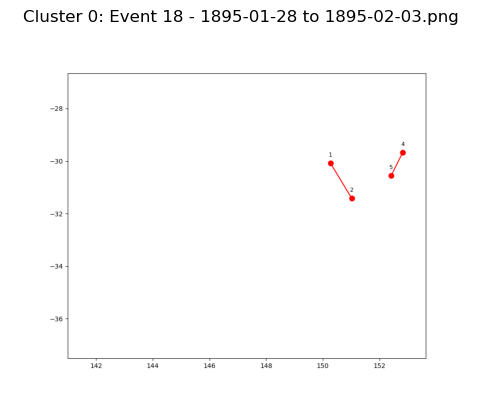

  Event 1041 - 1867-09-21 to 1867-09-27.png


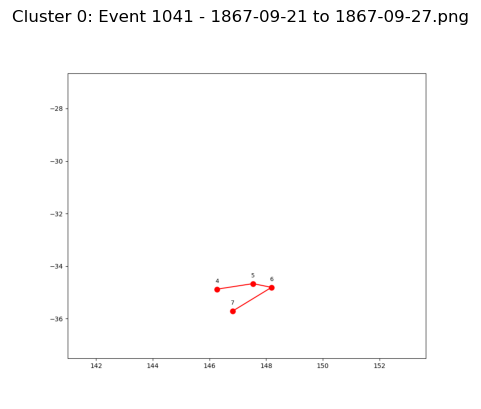

  Event 522 - 1887-09-21 to 1887-09-27.png


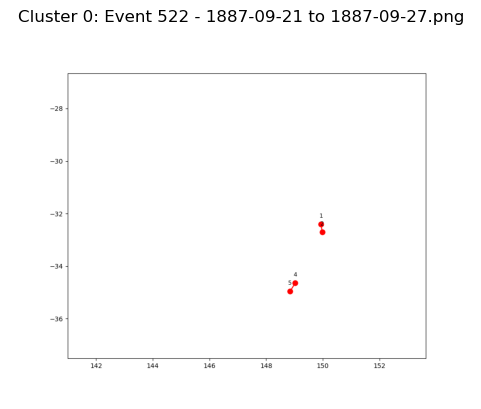

  Event 959 - 1870-10-23 to 1870-10-29.png


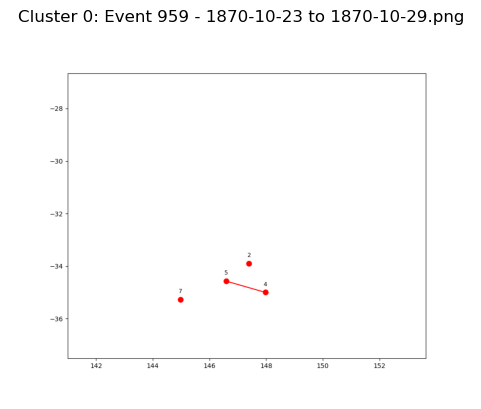

  Event 249 - 1899-06-25 to 1899-07-01.png


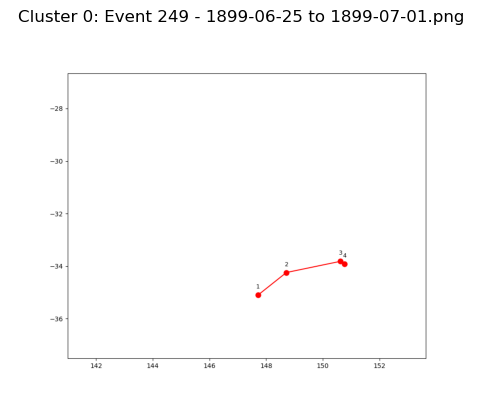

  Event 284 - 1870-03-07 to 1870-03-13.png


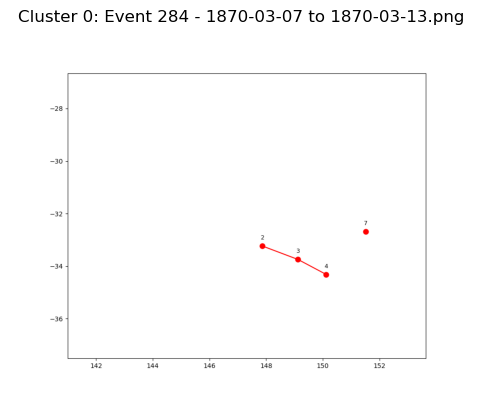

  Event 562 - 1896-11-22 to 1896-11-28.png


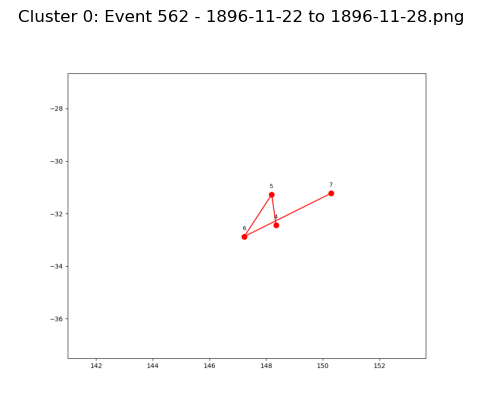

  Event 292 - 1894-12-26 to 1895-01-01.png


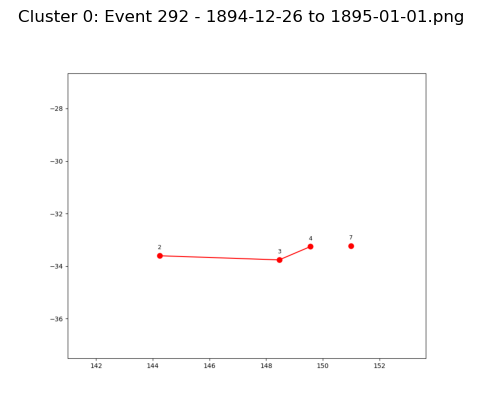

  Event 973 - 1892-04-10 to 1892-04-16.png


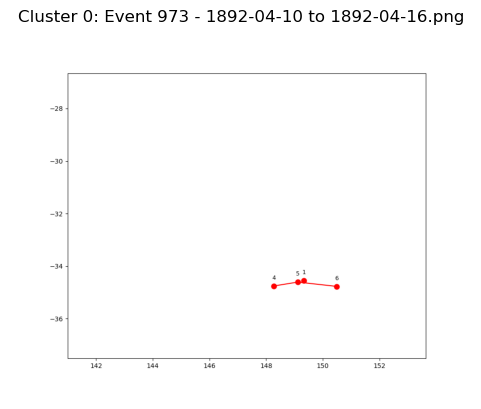

  Event 208 - 1878-09-03 to 1878-09-09.png


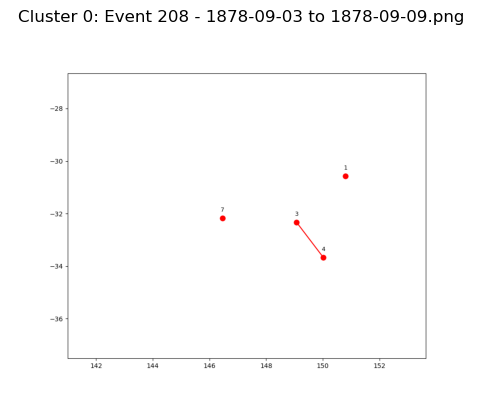

  Event 483 - 1870-06-01 to 1870-06-07.png


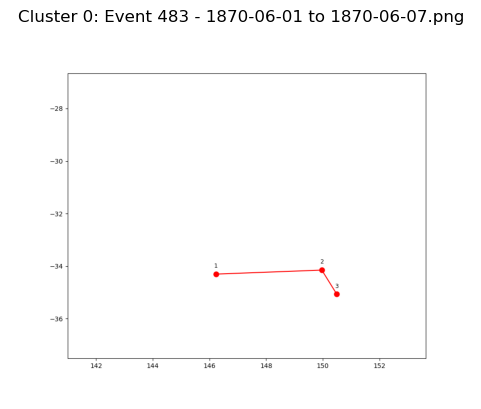

  Event 574 - 1898-10-19 to 1898-10-25.png


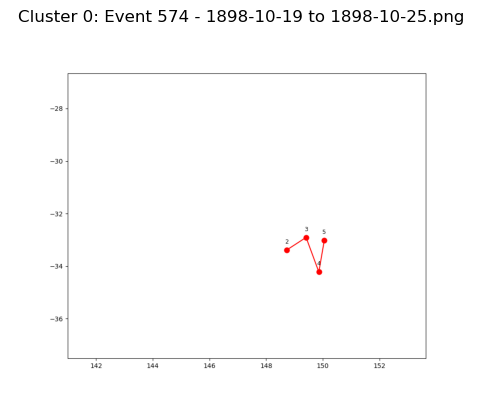

  Event 850 - 1879-07-06 to 1879-07-12.png


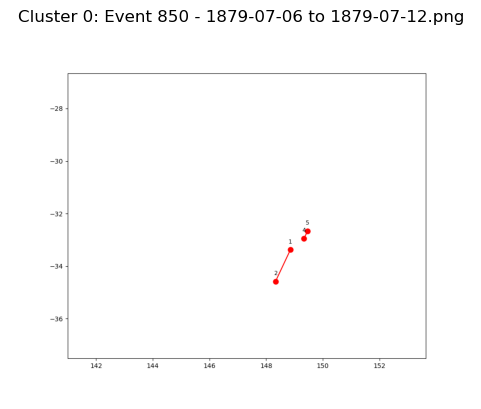

  Event 493 - 1873-08-14 to 1873-08-20.png


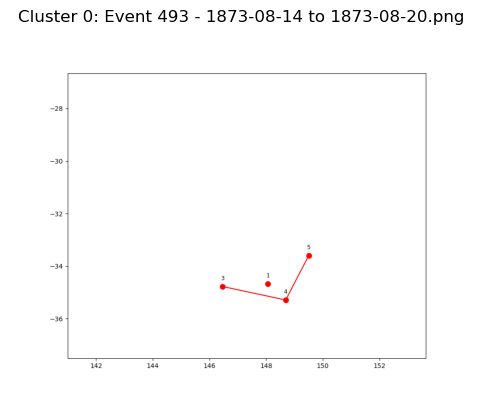

  Event 870 - 1885-11-27 to 1885-12-03.png


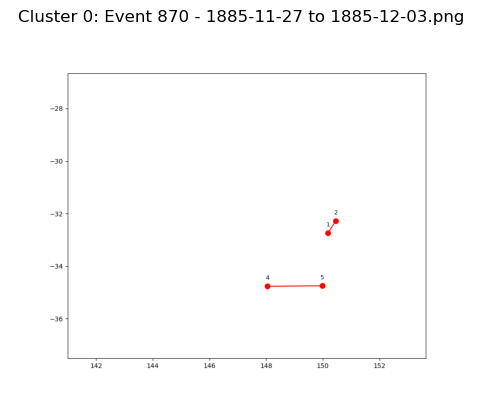

  Event 60 - 1891-07-29 to 1891-08-04.png


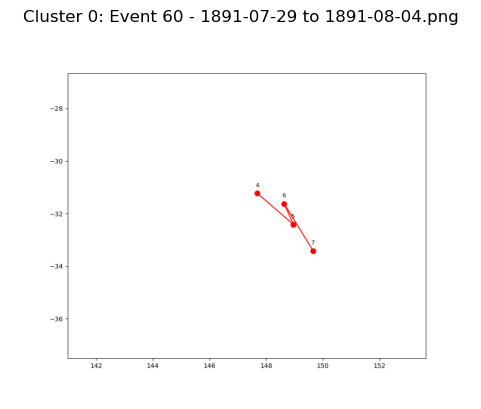

  Event 994 - 1870-03-31 to 1870-04-06.png


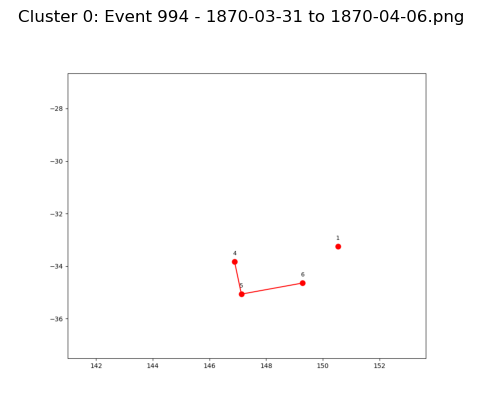

  Event 103 - 1891-04-11 to 1891-04-17.png


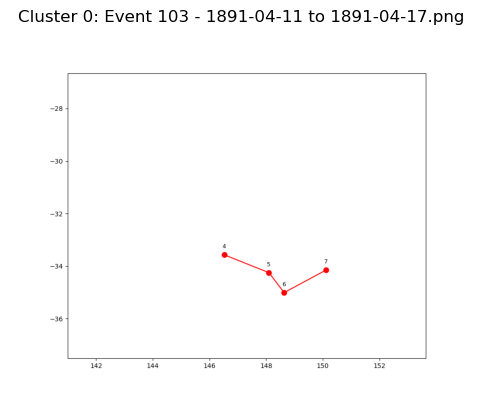

  Event 357 - 1871-02-21 to 1871-02-27.png


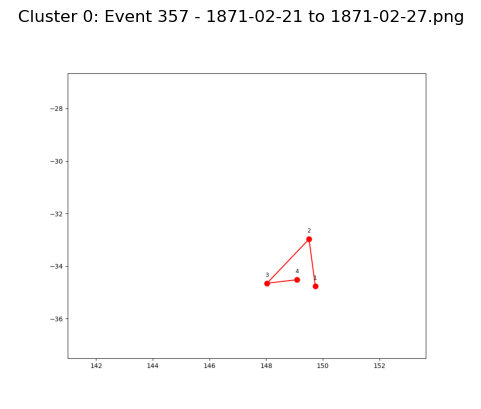

  Event 612 - 1869-04-07 to 1869-04-13.png


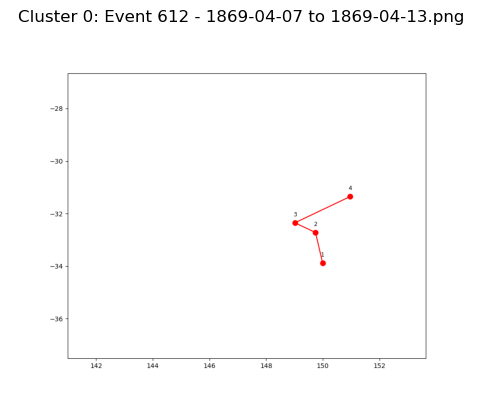

  Event 566 - 1890-02-27 to 1890-03-05.png


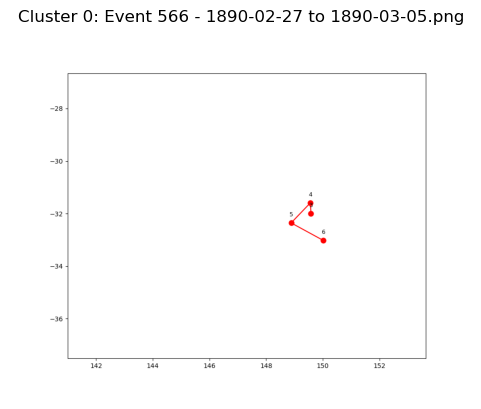

  Event 888 - 1888-03-18 to 1888-03-24.png


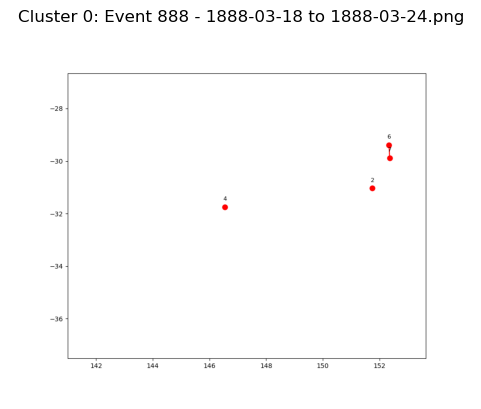

  Event 539 - 1899-05-18 to 1899-05-24.png


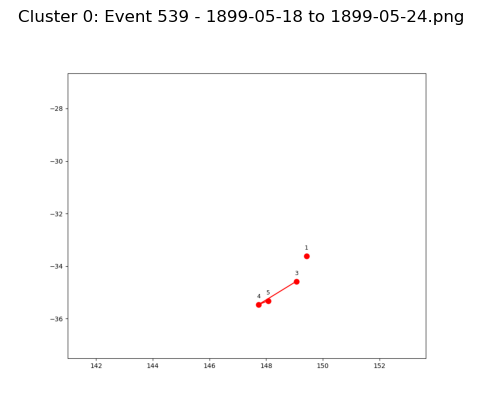

  Event 818 - 1878-06-20 to 1878-06-26.png


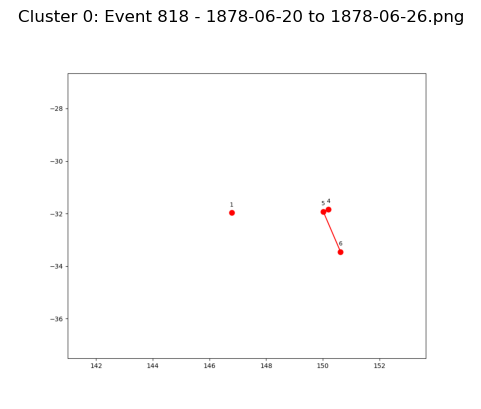

  Event 501 - 1882-04-20 to 1882-04-26.png


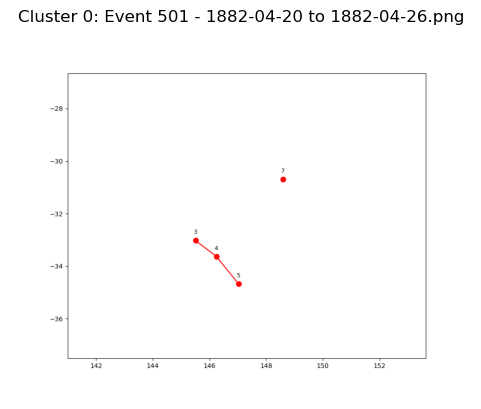

  Event 871 - 1872-09-11 to 1872-09-17.png


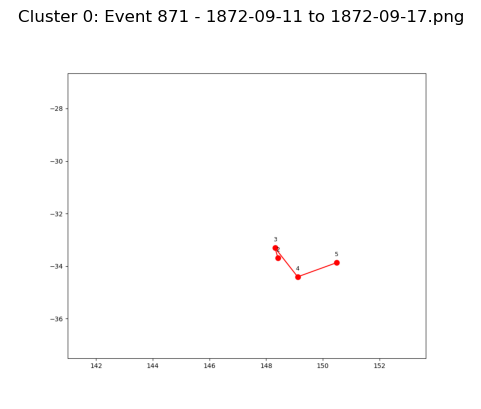

  Event 1016 - 1881-02-05 to 1881-02-11.png


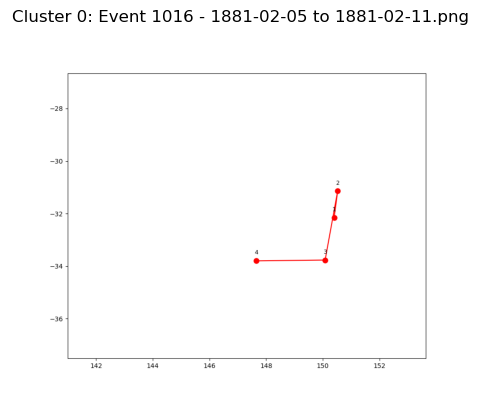

  Event 953 - 1860-04-19 to 1860-04-25.png


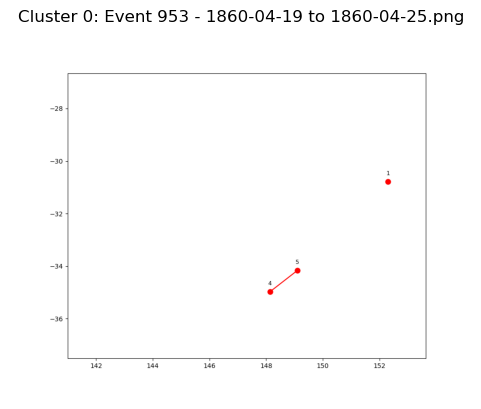

  Event 1017 - 1900-11-21 to 1900-11-27.png


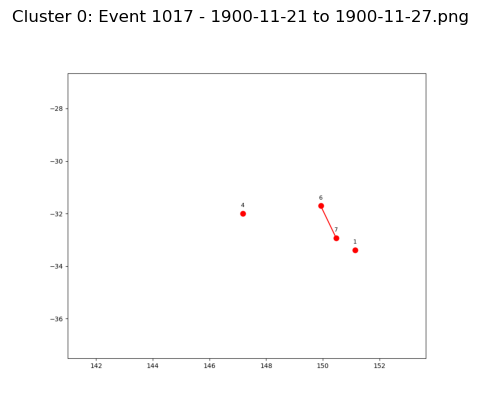

  Event 258 - 1886-12-14 to 1886-12-20.png


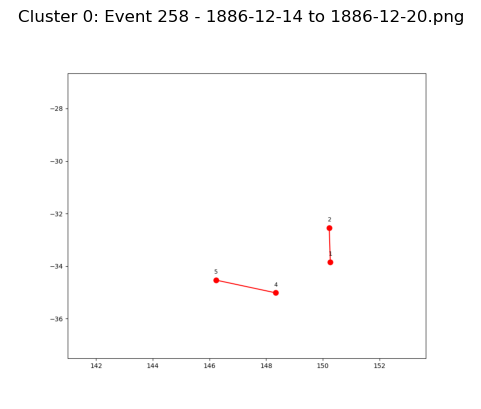

  Event 578 - 1891-09-25 to 1891-10-01.png


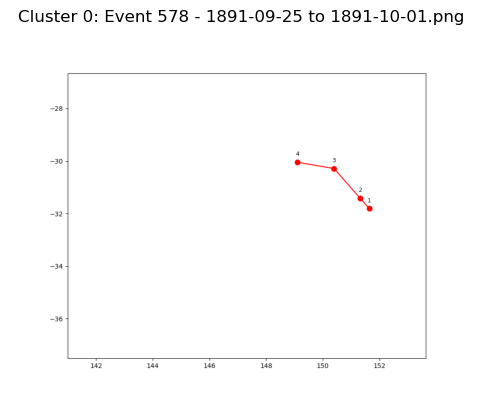

  Event 741 - 1894-04-26 to 1894-05-02.png


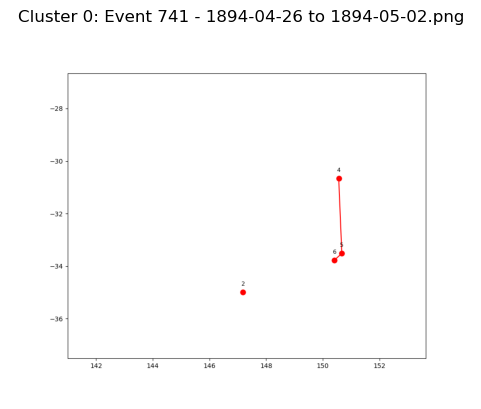

  Event 650 - 1889-10-29 to 1889-11-04.png


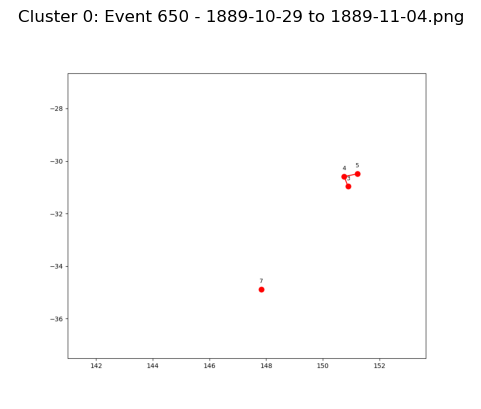

  Event 86 - 1894-12-30 to 1895-01-05.png


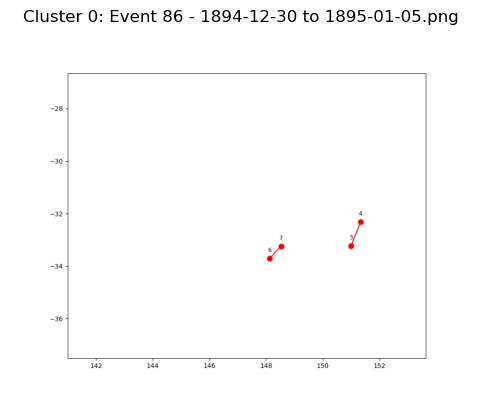

  Event 725 - 1877-01-28 to 1877-02-03.png


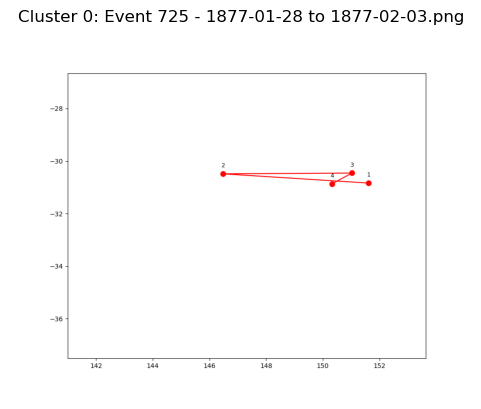

  Event 1018 - 1881-12-01 to 1881-12-07.png


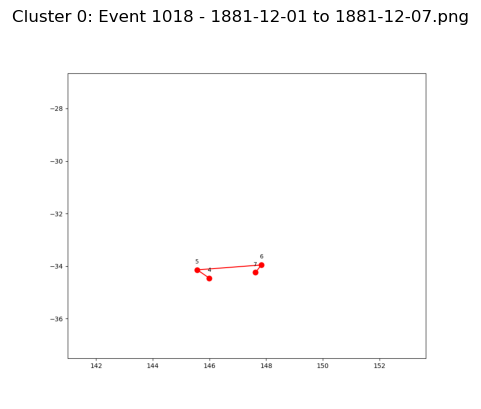

  Event 960 - 1871-09-16 to 1871-09-22.png


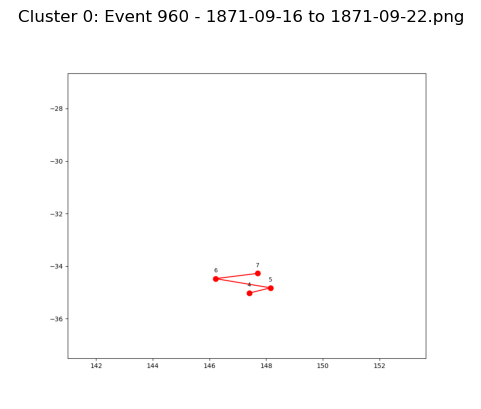

  Event 200 - 1898-05-11 to 1898-05-17.png


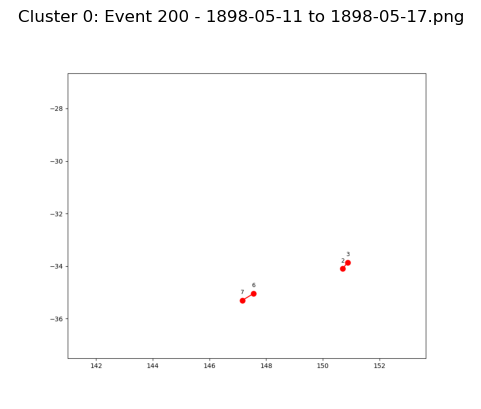

  Event 724 - 1872-10-08 to 1872-10-14.png


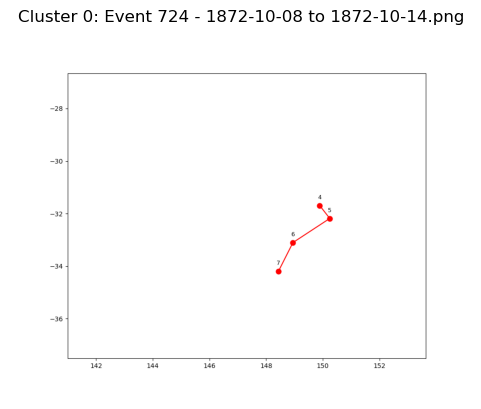

  Event 119 - 1875-04-30 to 1875-05-06.png


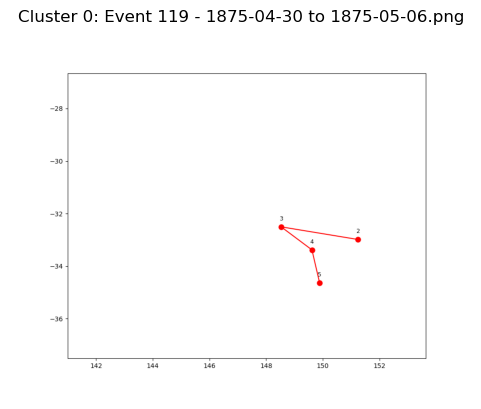

  Event 914 - 1887-06-18 to 1887-06-24.png


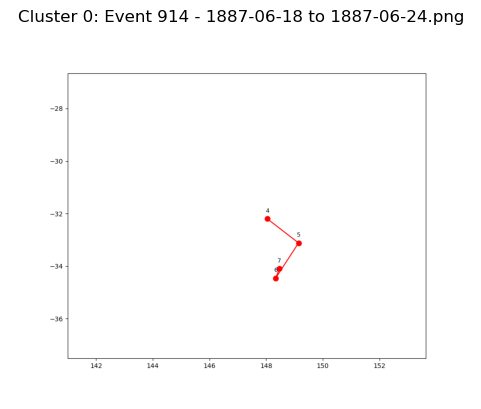

  Event 243 - 1899-11-03 to 1899-11-09.png


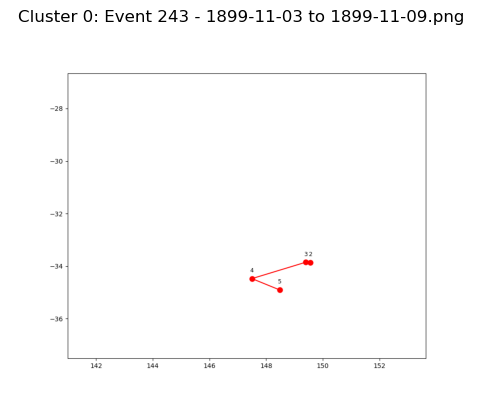

  Event 655 - 1895-12-14 to 1895-12-20.png


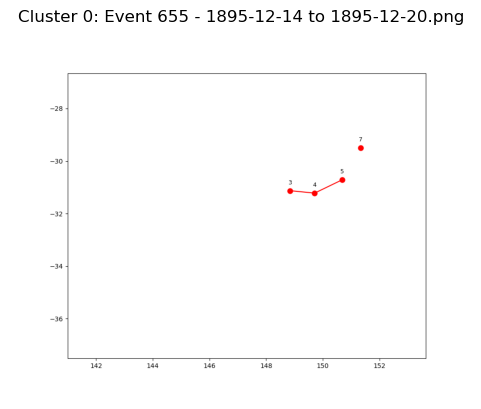

  Event 675 - 1858-05-24 to 1858-05-30.png


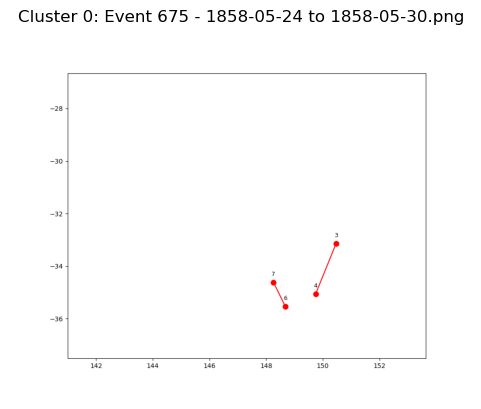

  Event 203 - 1873-06-13 to 1873-06-19.png


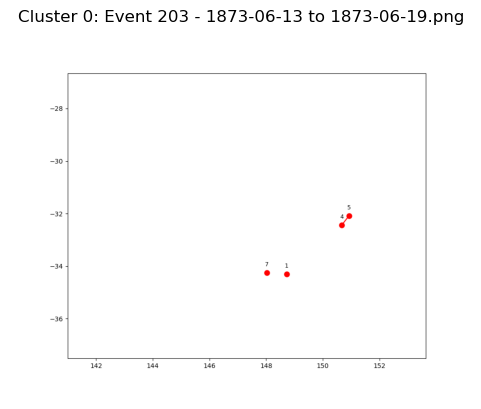

  Event 399 - 1891-12-18 to 1891-12-24.png


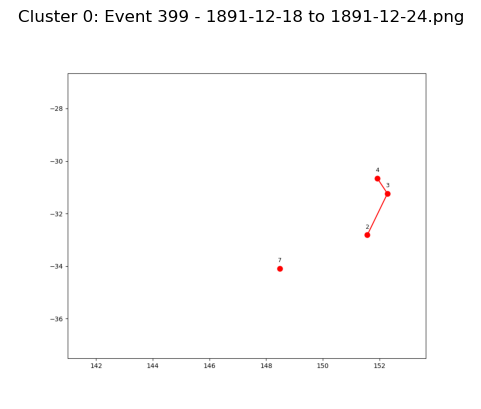

  Event 269 - 1860-01-04 to 1860-01-10.png


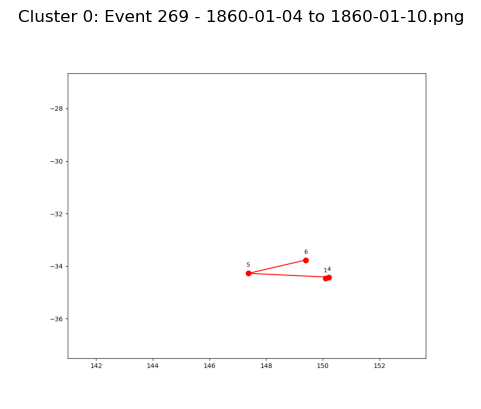

  Event 1030 - 1873-03-11 to 1873-03-17.png


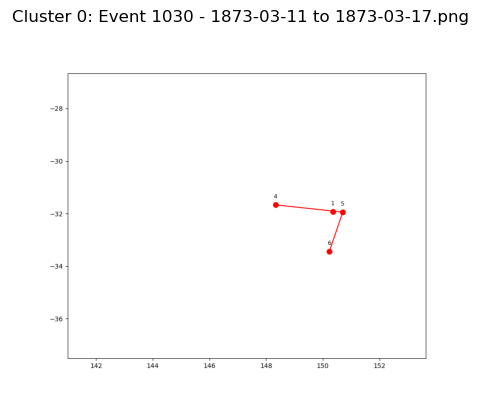

  Event 15 - 1894-01-25 to 1894-01-31.png


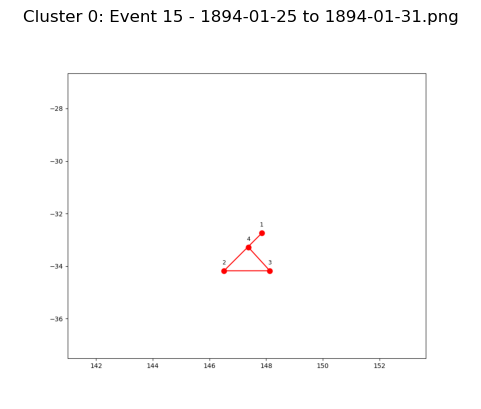

  Event 137 - 1887-11-06 to 1887-11-12.png


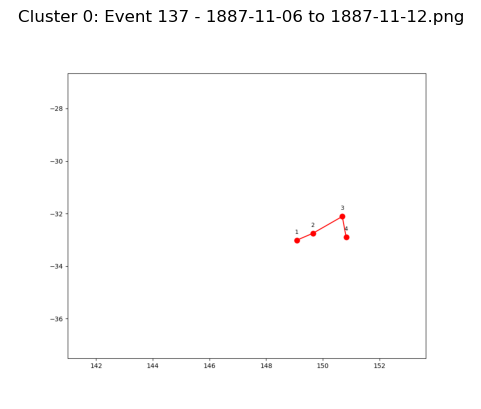

  Event 783 - 1885-02-09 to 1885-02-15.png


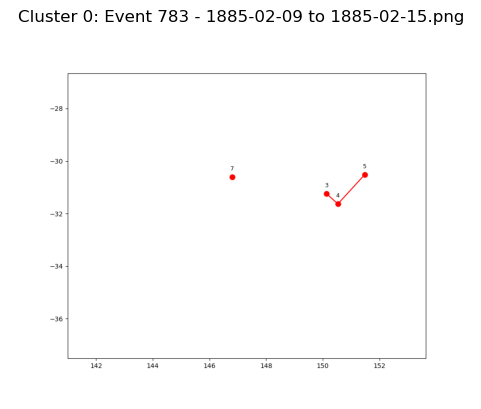

  Event 709 - 1879-10-05 to 1879-10-11.png


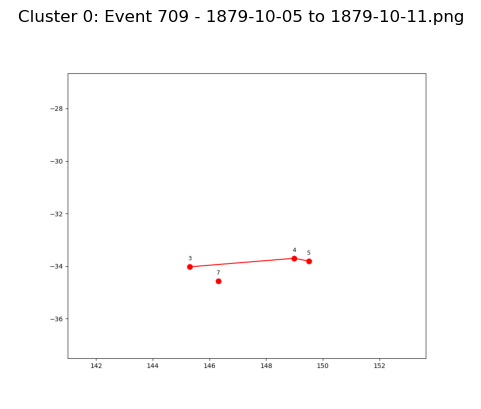

  Event 708 - 1879-05-27 to 1879-06-02.png


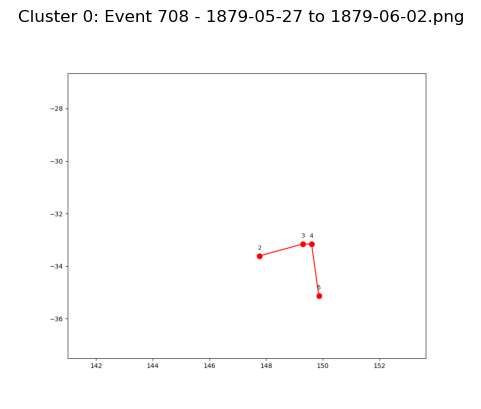

  Event 535 - 1896-06-26 to 1896-07-02.png


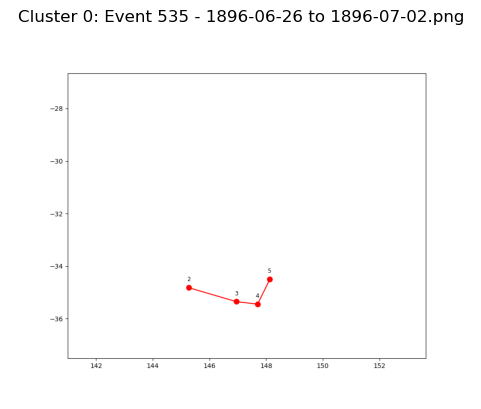

  Event 1070 - 1871-11-17 to 1871-11-23.png


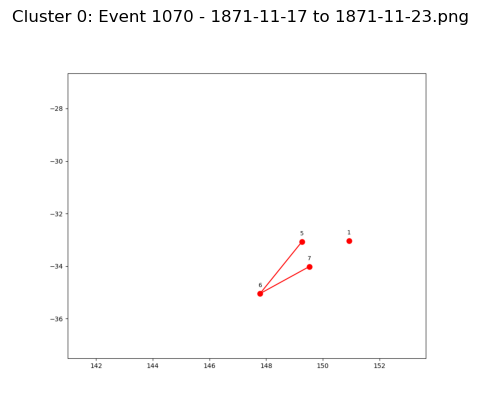

  Event 747 - 1885-04-05 to 1885-04-11.png


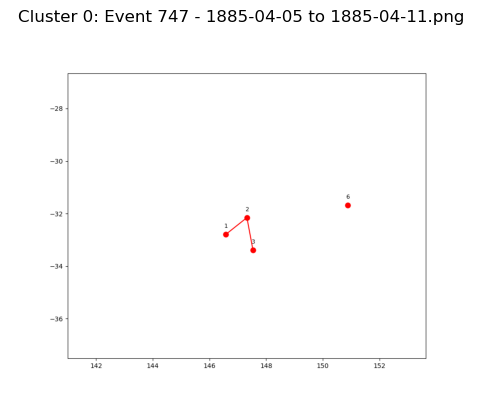

  Event 120 - 1875-07-07 to 1875-07-13.png


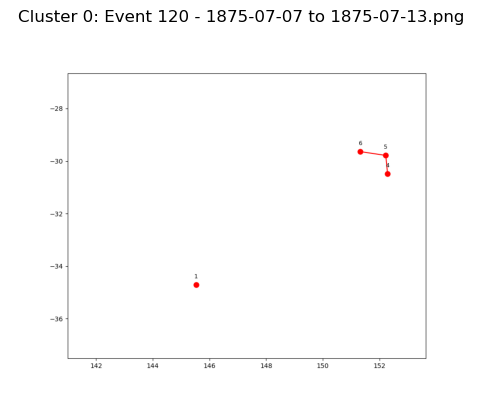

  Event 763 - 1887-03-05 to 1887-03-11.png


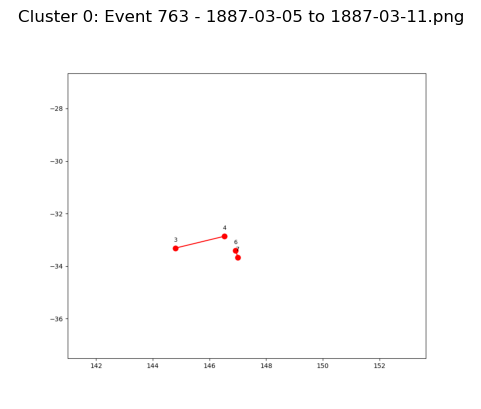

  Event 545 - 1890-05-24 to 1890-05-30.png


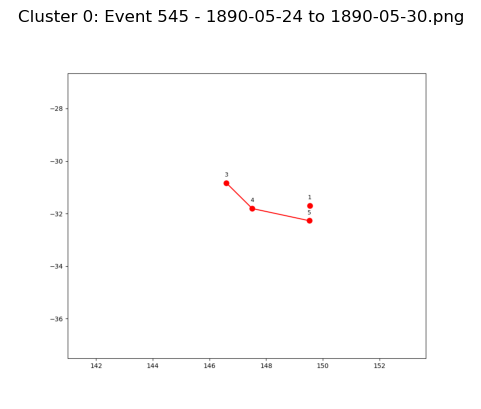

  Event 223 - 1896-05-11 to 1896-05-17.png


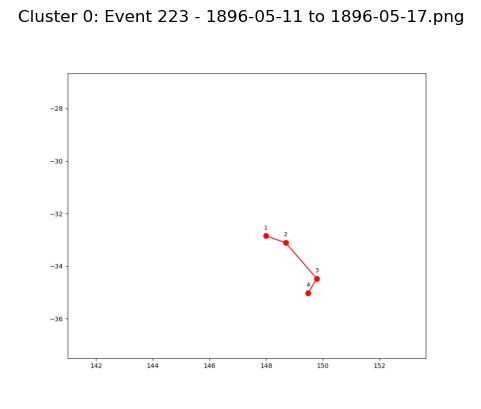

  Event 920 - 1890-07-04 to 1890-07-10.png


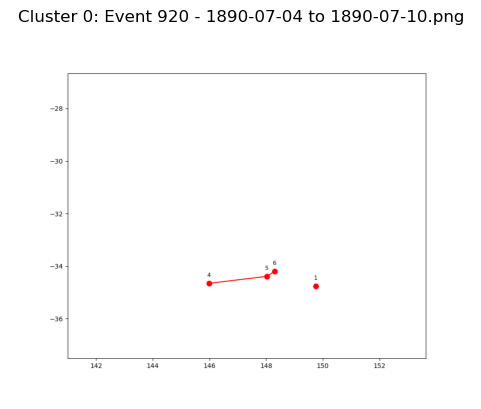

  Event 217 - 1887-04-11 to 1887-04-17.png


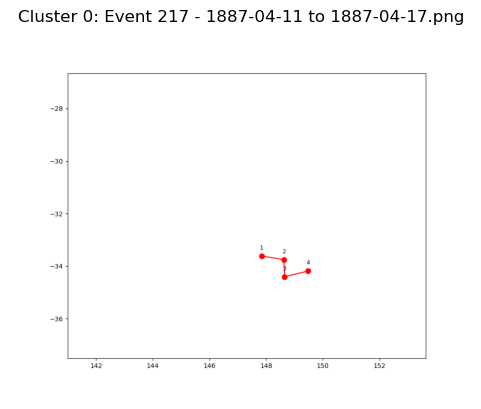

  Event 711 - 1886-05-16 to 1886-05-22.png


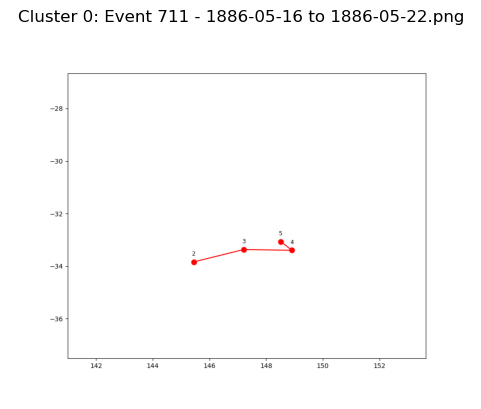

  Event 215 - 1884-06-13 to 1884-06-19.png


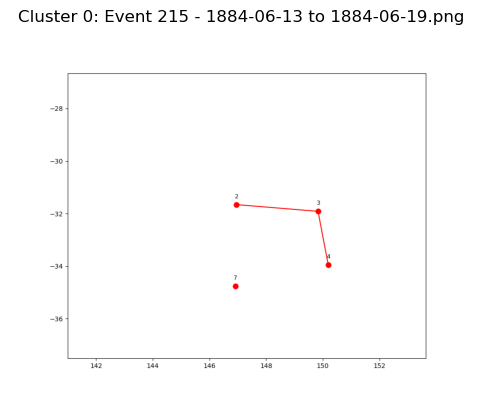

  Event 354 - 1884-12-30 to 1885-01-05.png


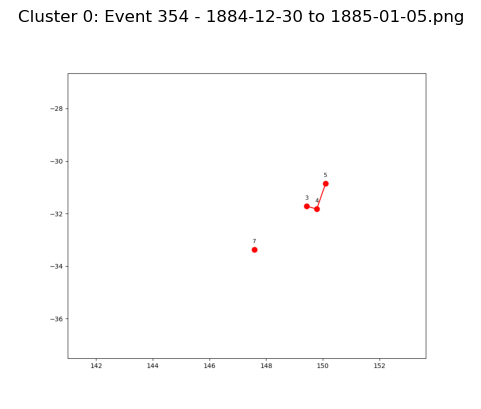

  Event 220 - 1898-06-05 to 1898-06-11.png


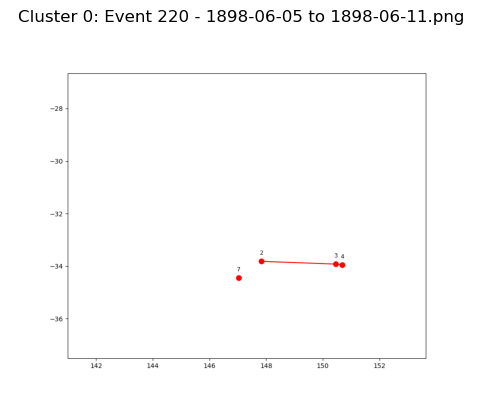

  Event 11 - 1892-10-24 to 1892-10-30.png


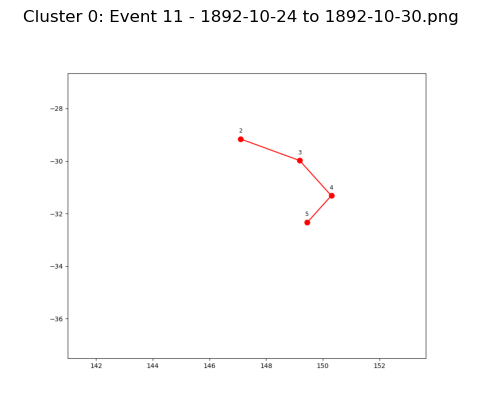

  Event 1034 - 1875-02-06 to 1875-02-12.png


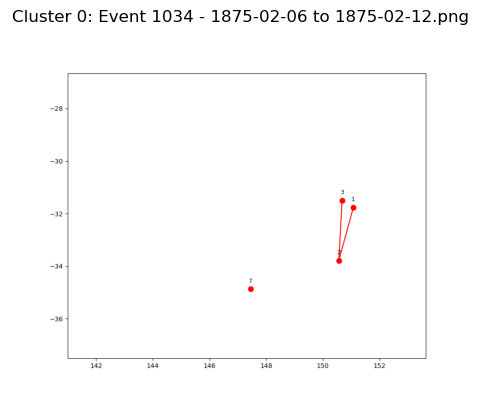

  Event 261 - 1889-03-26 to 1889-04-01.png


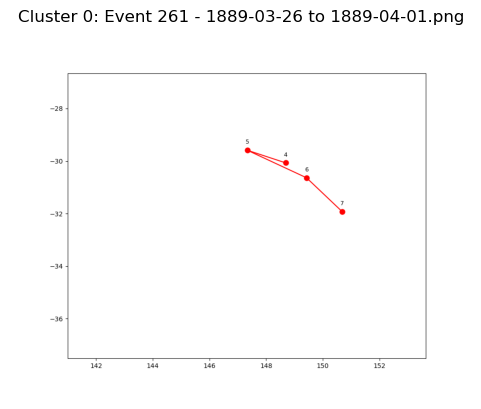

  Event 1091 - 1877-05-20 to 1877-05-26.png


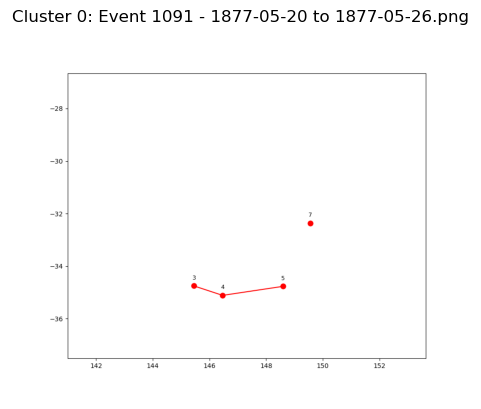

  Event 156 - 1879-02-14 to 1879-02-20.png


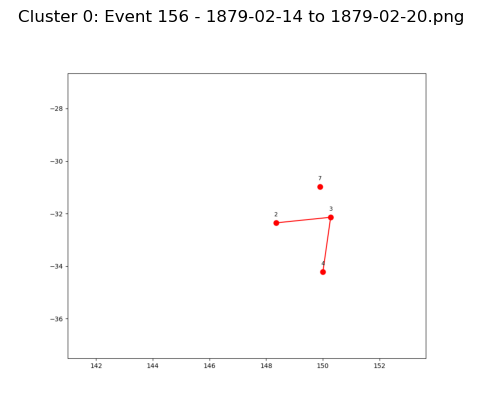

  Event 729 - 1879-08-10 to 1879-08-16.png


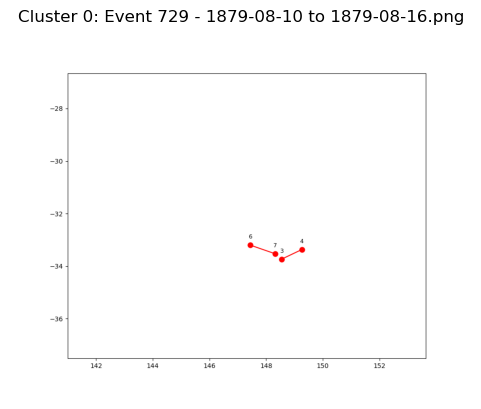

  Event 629 - 1886-07-31 to 1886-08-06.png


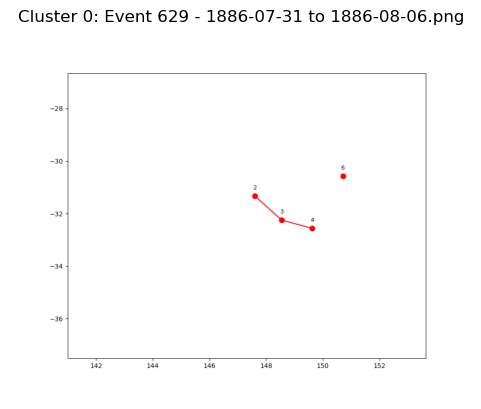

  Event 824 - 1895-03-13 to 1895-03-19.png


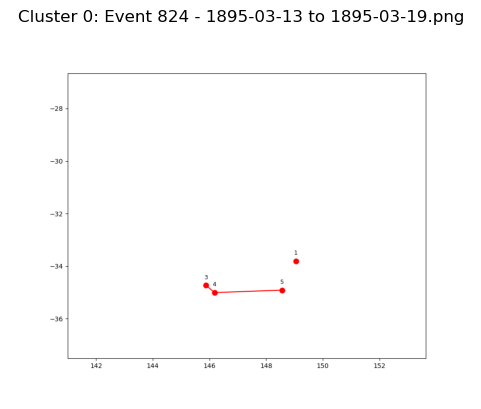

  Event 446 - 1887-07-01 to 1887-07-07.png


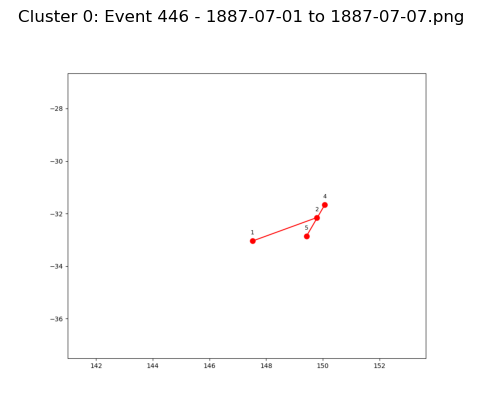

  Event 349 - 1890-04-14 to 1890-04-20.png


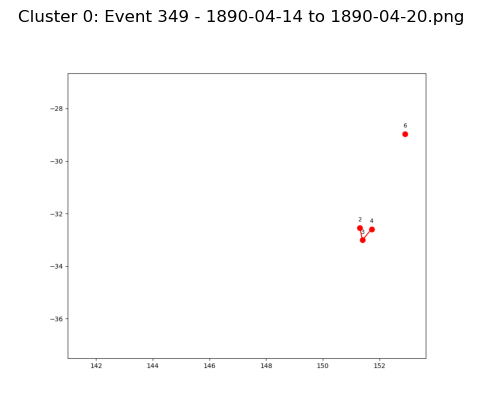

  Event 453 - 1894-06-23 to 1894-06-29.png


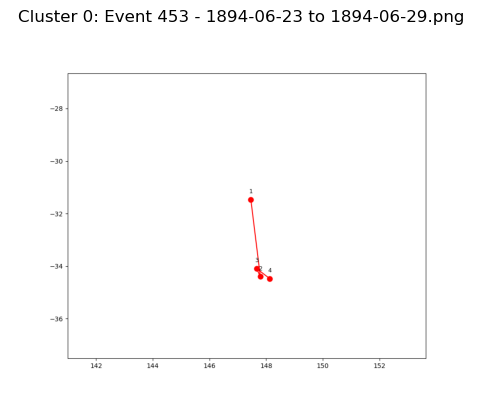

  Event 1031 - 1875-06-23 to 1875-06-29.png


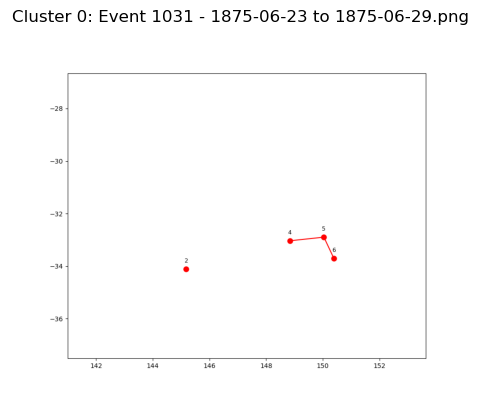

  Event 854 - 1879-10-15 to 1879-10-21.png


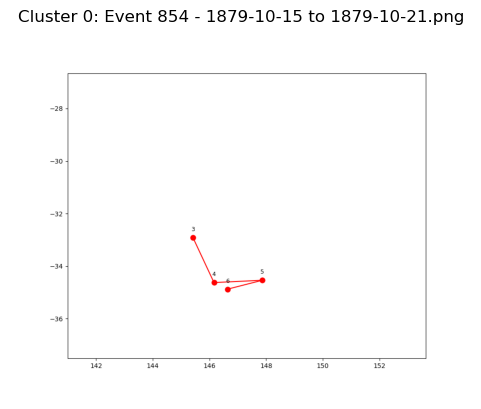

  Event 527 - 1889-06-26 to 1889-07-02.png


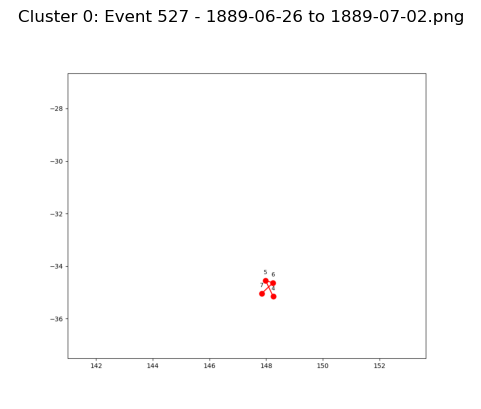

  Event 712 - 1887-03-28 to 1887-04-03.png


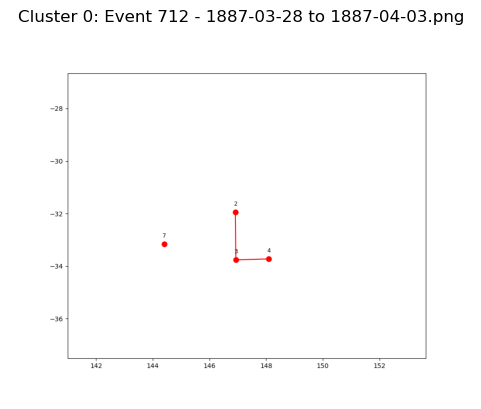

  Event 652 - 1891-02-24 to 1891-03-02.png


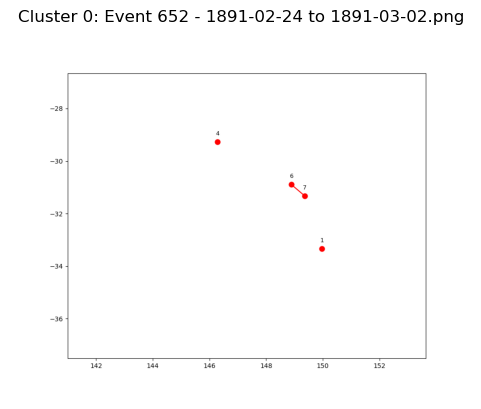

  Event 607 - 1881-03-03 to 1881-03-09.png


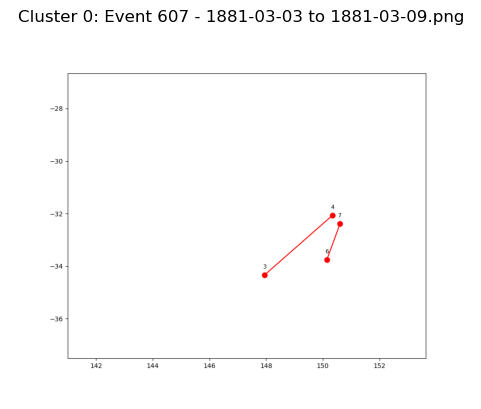

  Event 81 - 1888-02-10 to 1888-02-16.png


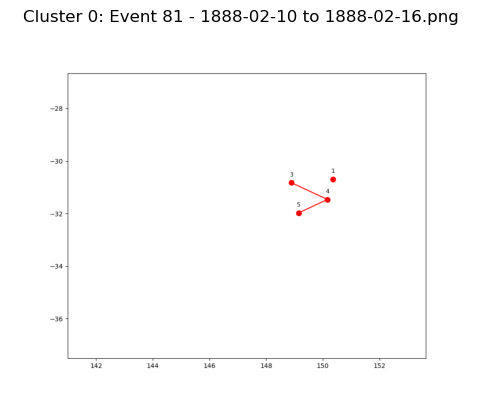

  Event 906 - 1898-08-23 to 1898-08-29.png


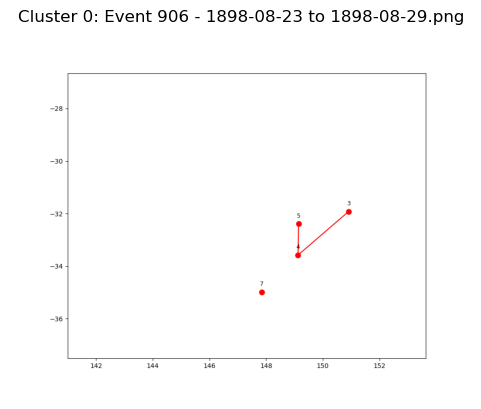

  Event 427 - 1889-04-04 to 1889-04-10.png


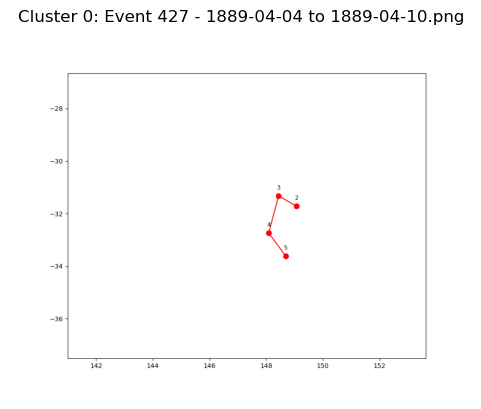

  Event 683 - 1892-04-27 to 1892-05-03.png


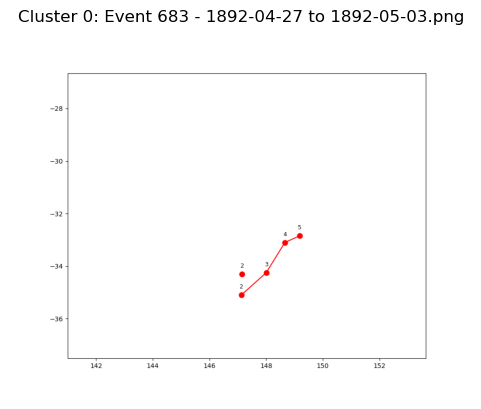

  Event 1027 - 1887-06-03 to 1887-06-09.png


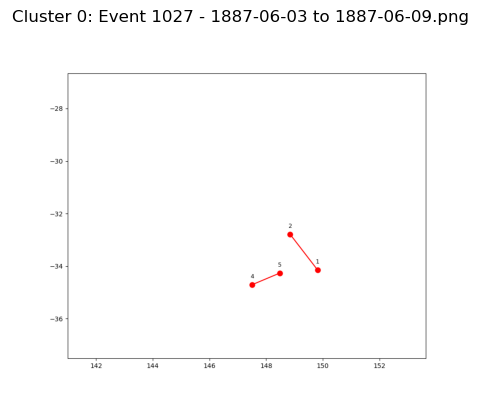

  Event 561 - 1892-09-09 to 1892-09-15.png


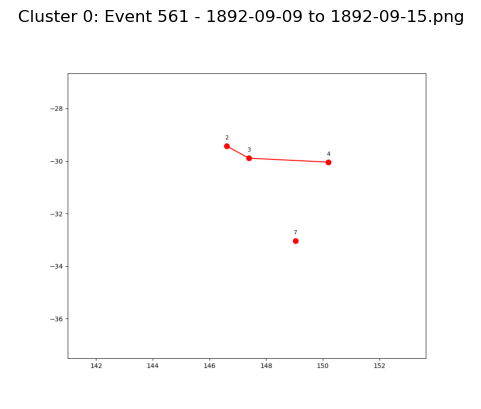

  Event 674 - 1893-10-08 to 1893-10-14.png


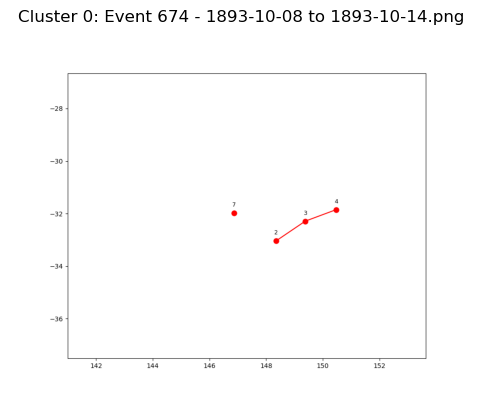

  Event 690 - 1872-11-24 to 1872-11-30.png


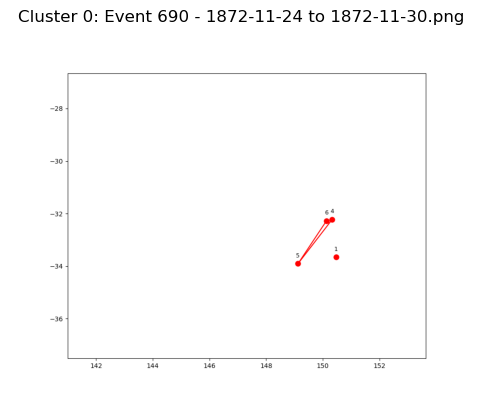

  Event 1049 - 1870-09-05 to 1870-09-11.png


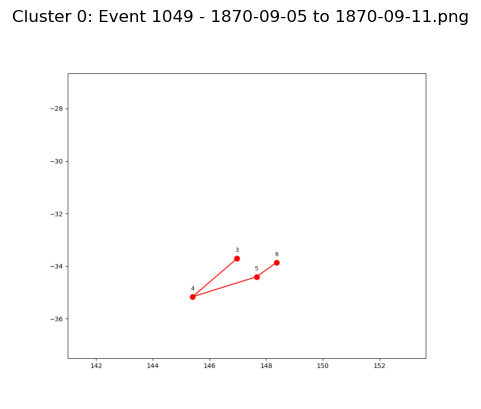

  Event 170 - 1885-06-20 to 1885-06-26.png


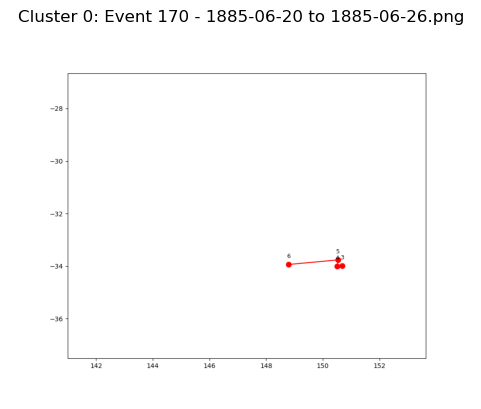

  Event 989 - 1893-12-11 to 1893-12-17.png


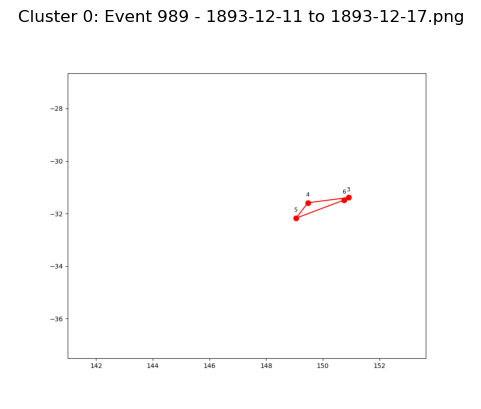

  Event 698 - 1885-01-09 to 1885-01-15.png


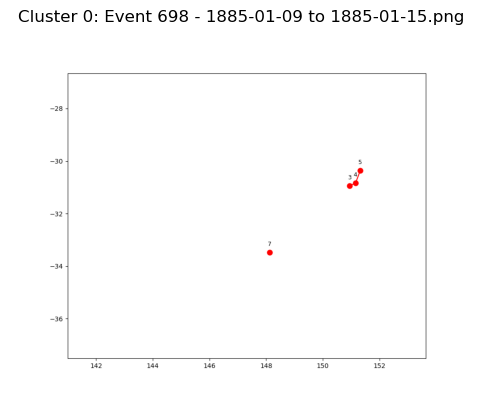

  Event 669 - 1890-09-12 to 1890-09-18.png


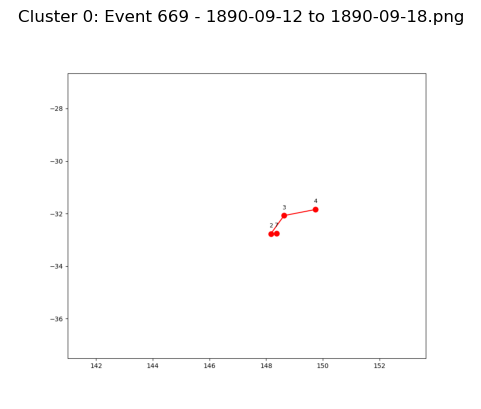

  Event 394 - 1894-02-27 to 1894-03-05.png


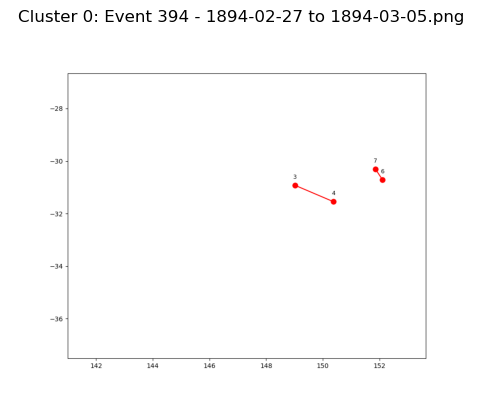

  Event 1032 - 1877-04-18 to 1877-04-24.png


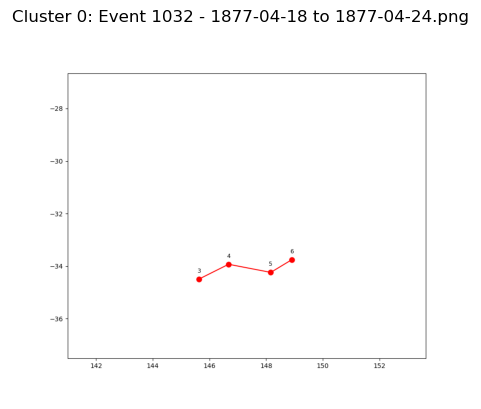

  Event 678 - 1872-10-01 to 1872-10-07.png


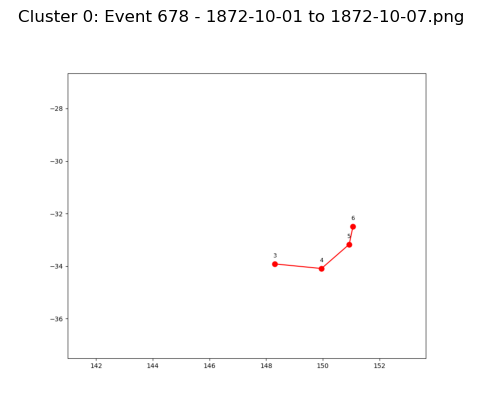

  Event 586 - 1889-12-27 to 1890-01-02.png


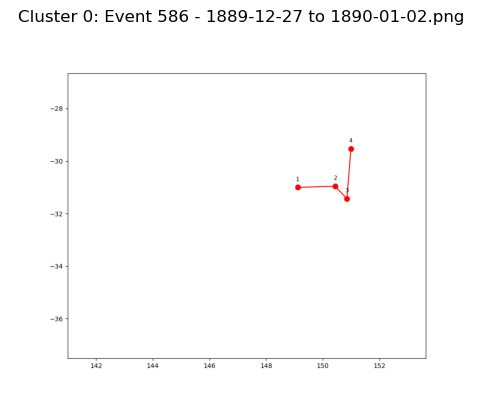

  Event 428 - 1896-12-31 to 1897-01-06.png


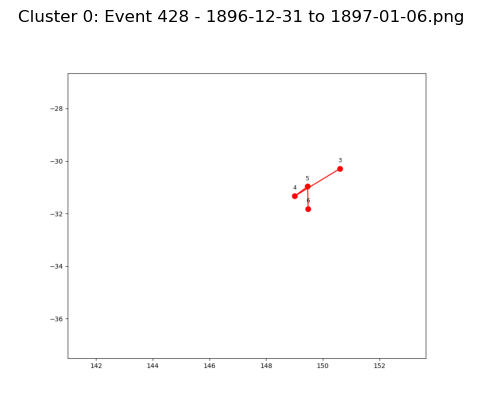

  Event 288 - 1874-05-01 to 1874-05-07.png


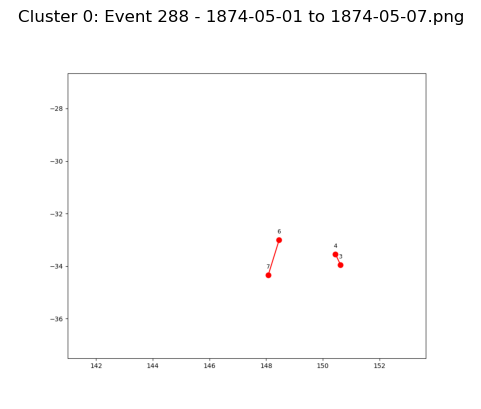

  Event 410 - 1890-09-19 to 1890-09-25.png


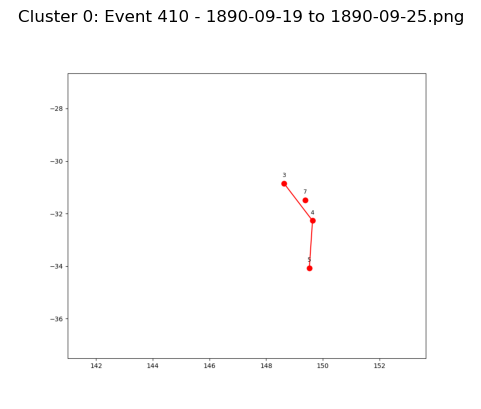

  Event 1098 - 1886-08-31 to 1886-09-06.png


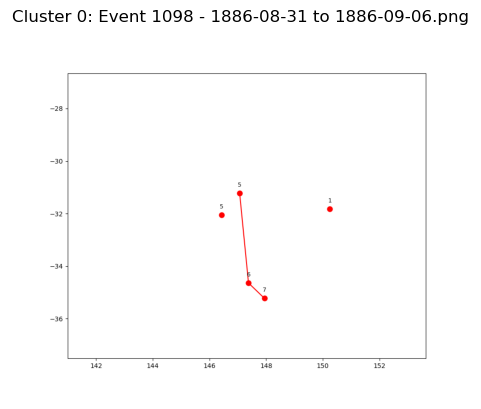

  Event 255 - 1900-06-15 to 1900-06-21.png


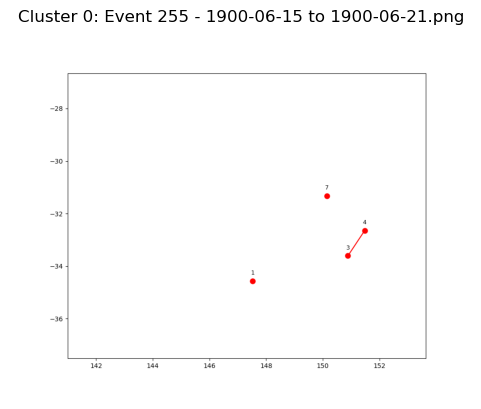

  Event 372 - 1899-07-12 to 1899-07-18.png


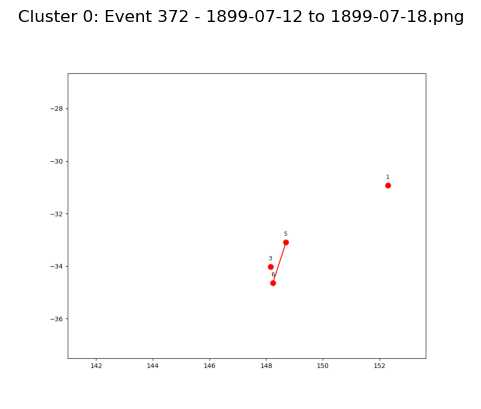

  Event 804 - 1893-05-11 to 1893-05-17.png


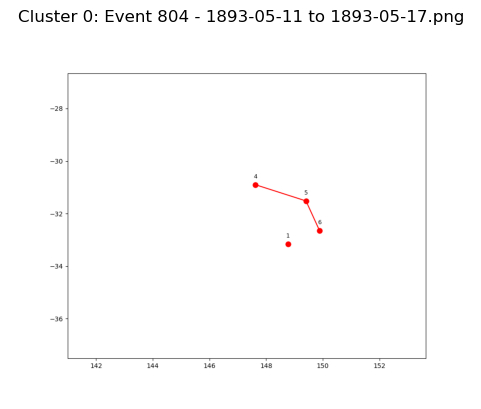

  Event 239 - 1889-07-23 to 1889-07-29.png


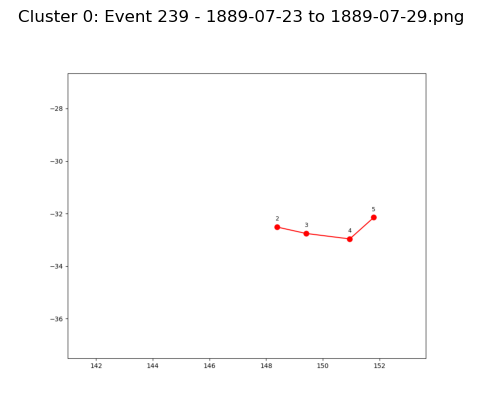

  Event 384 - 1898-07-15 to 1898-07-21.png


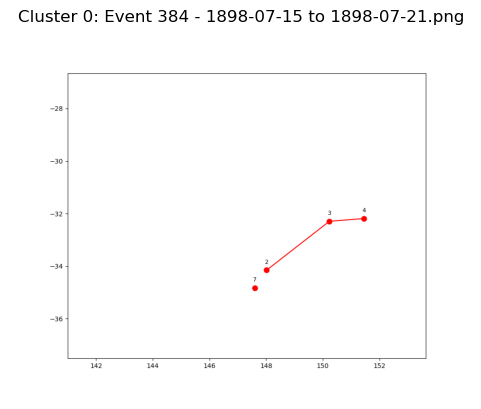

  Event 42 - 1896-06-20 to 1896-06-26.png


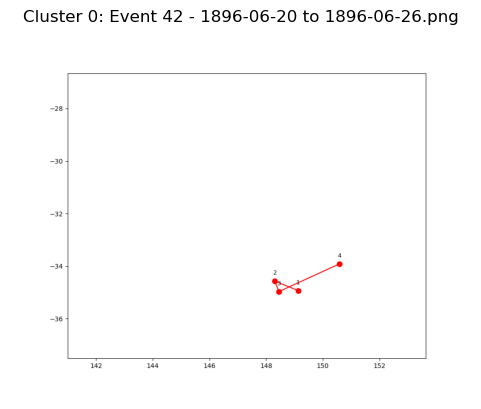

  Event 454 - 1894-07-12 to 1894-07-18.png


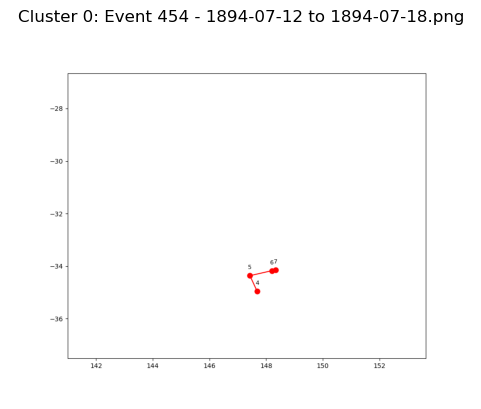

  Event 1006 - 1888-09-17 to 1888-09-23.png


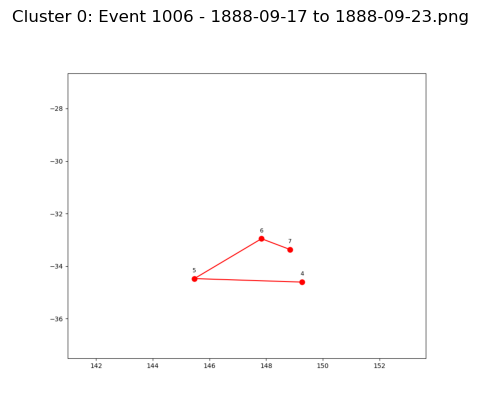

  Event 496 - 1880-08-08 to 1880-08-14.png


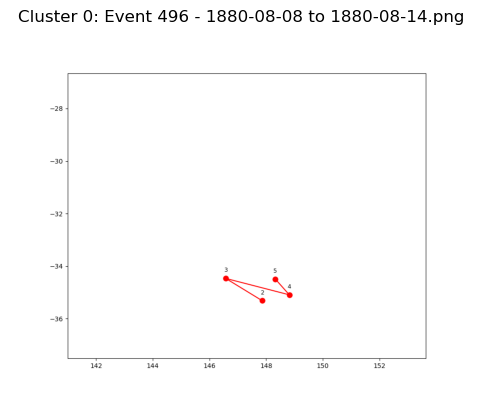

  Event 867 - 1894-02-20 to 1894-02-26.png


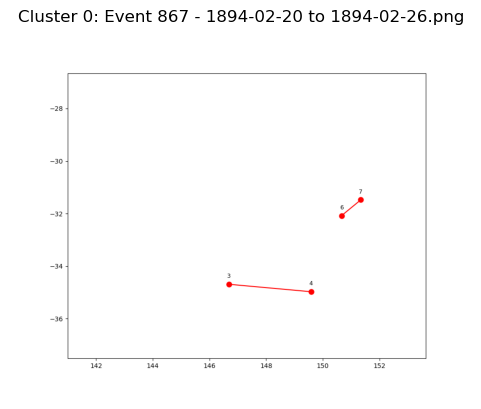

  Event 1081 - 1889-09-09 to 1889-09-15.png


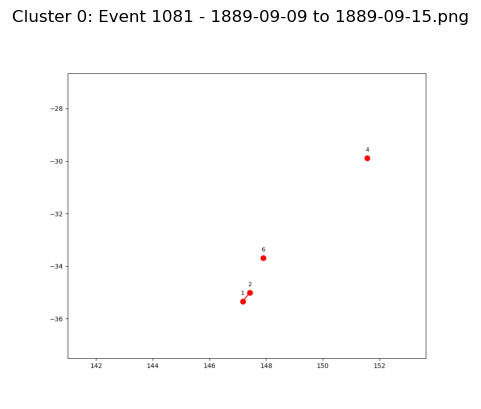

  Event 734 - 1874-01-11 to 1874-01-17.png


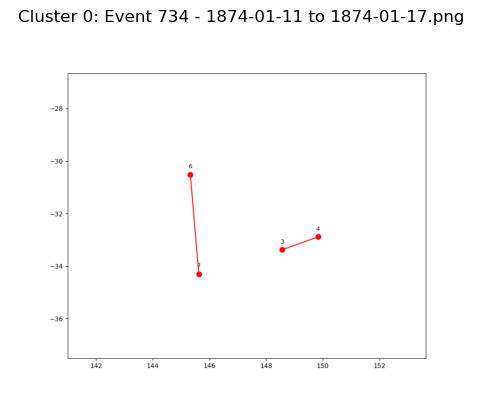

  Event 59 - 1887-08-09 to 1887-08-15.png


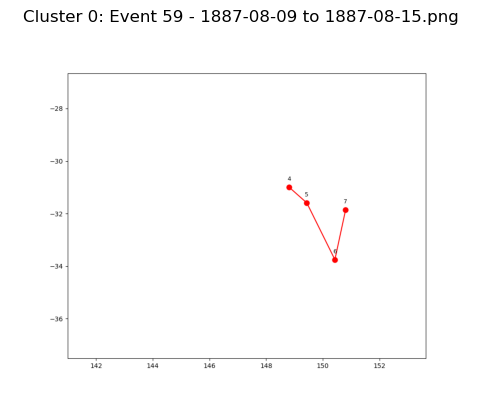

  Event 342 - 1870-04-21 to 1870-04-27.png


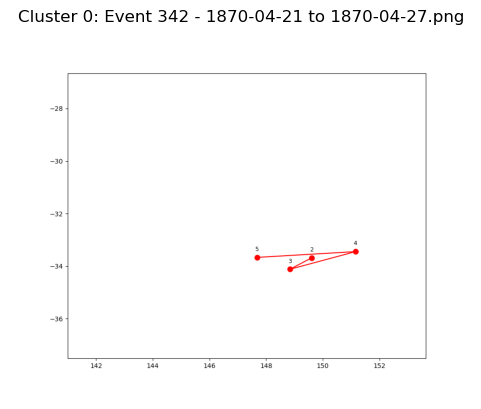

  Event 226 - 1894-10-17 to 1894-10-23.png


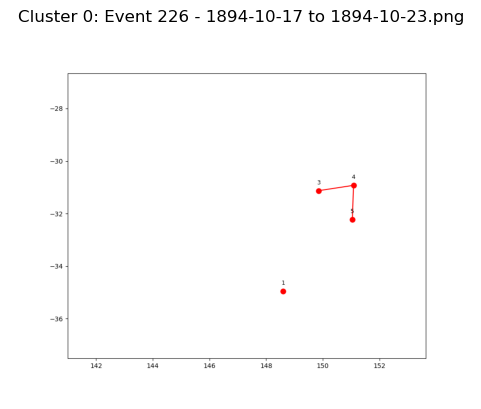

  Event 478 - 1900-12-22 to 1900-12-28.png


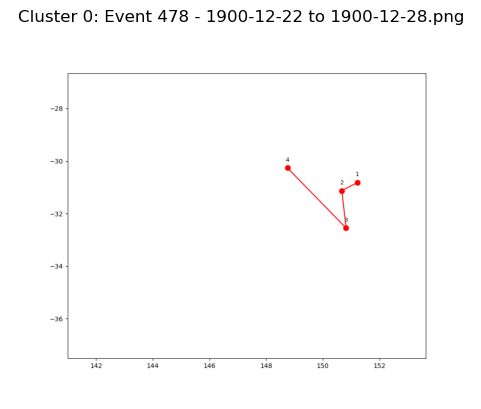

  Event 237 - 1893-12-26 to 1894-01-01.png


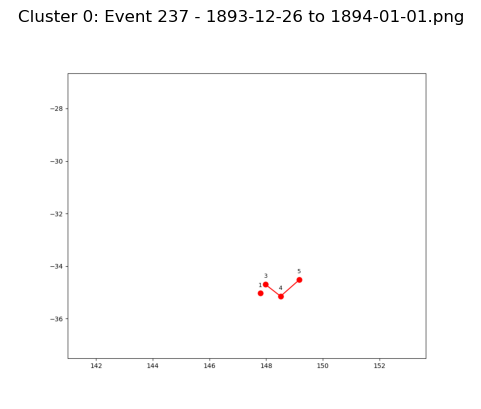

  Event 75 - 1892-01-09 to 1892-01-15.png


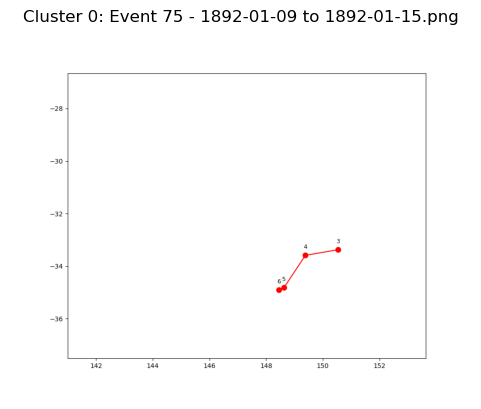

  Event 891 - 1880-04-12 to 1880-04-18.png


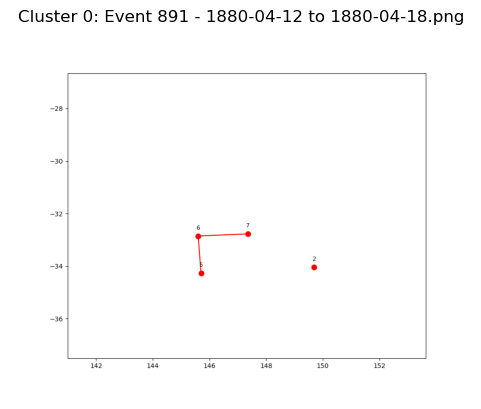

  Event 692 - 1872-12-18 to 1872-12-24.png


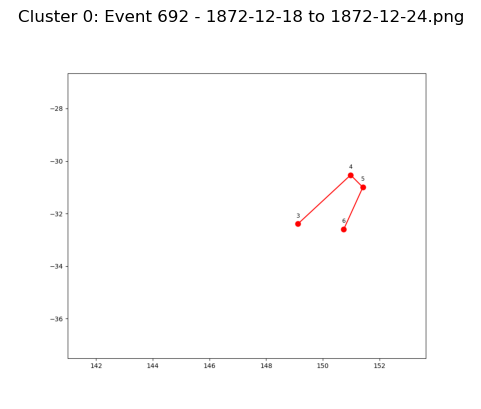

  Event 132 - 1883-05-19 to 1883-05-25.png


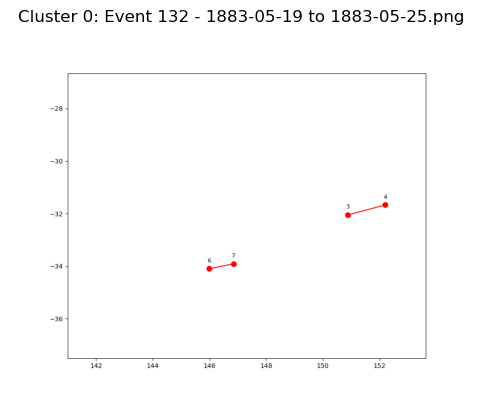

  Event 46 - 1898-02-18 to 1898-02-24.png


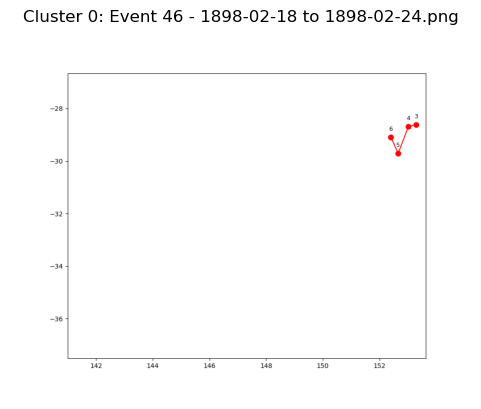

  Event 285 - 1870-03-27 to 1870-04-02.png


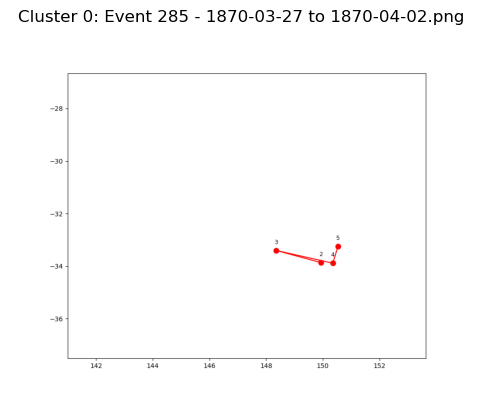

  Event 491 - 1872-05-15 to 1872-05-21.png


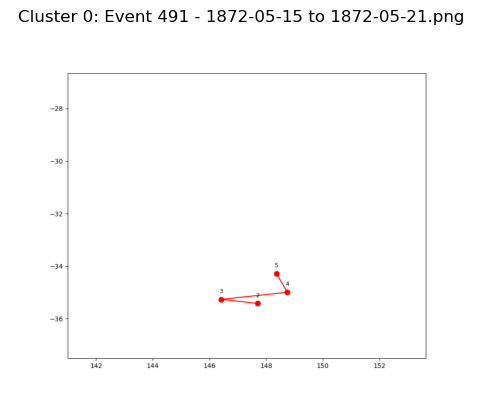

  Event 600 - 1897-10-16 to 1897-10-22.png


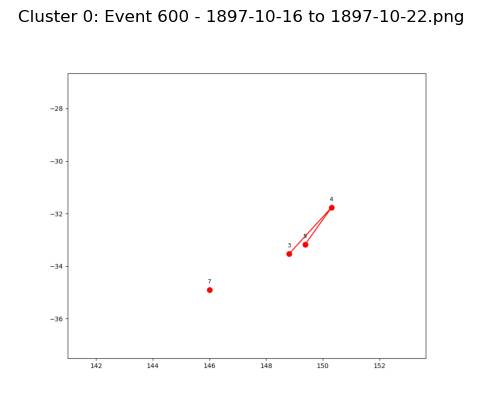

  Event 409 - 1890-06-17 to 1890-06-23.png


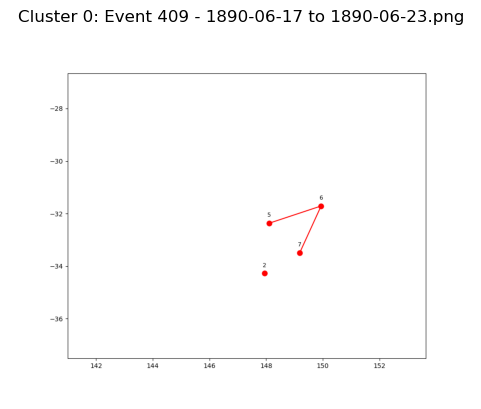

  Event 868 - 1884-02-04 to 1884-02-10.png


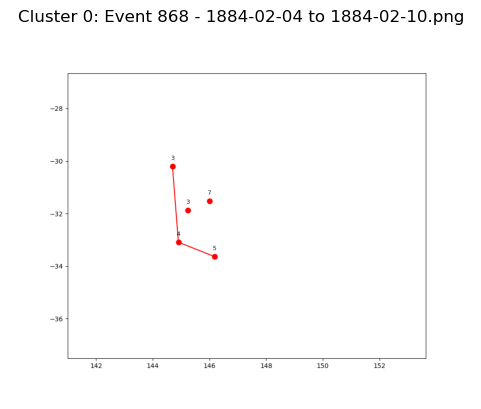

  Event 21 - 1897-07-22 to 1897-07-28.png


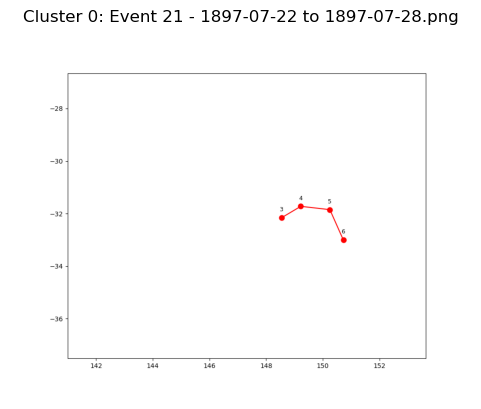

  Event 1066 - 1867-04-03 to 1867-04-09.png


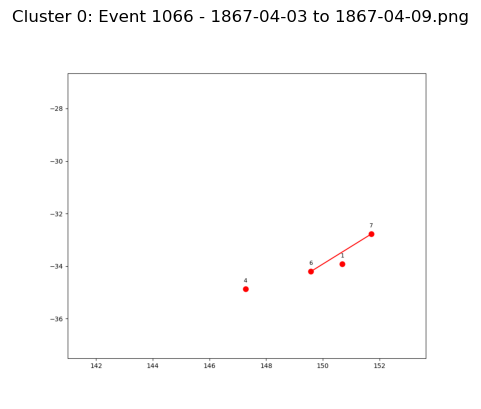

  Event 1015 - 1894-12-22 to 1894-12-28.png


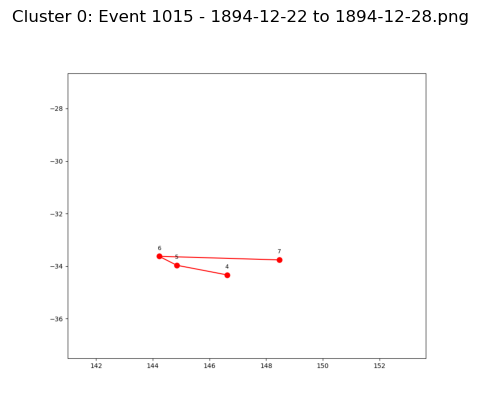

  Event 998 - 1896-03-13 to 1896-03-19.png


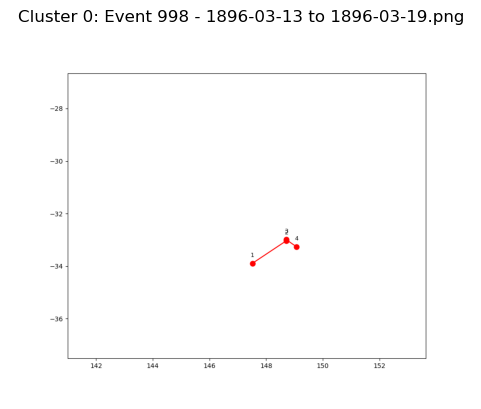

  Event 397 - 1890-02-06 to 1890-02-12.png


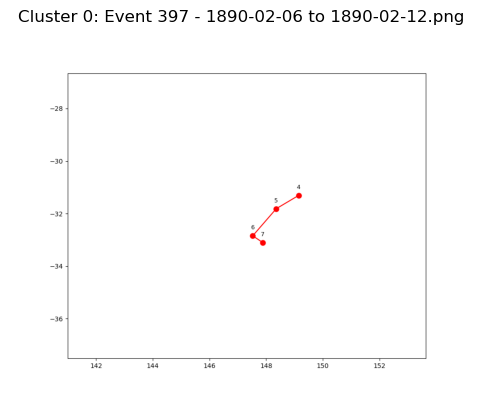

  Event 150 - 1891-05-29 to 1891-06-04.png


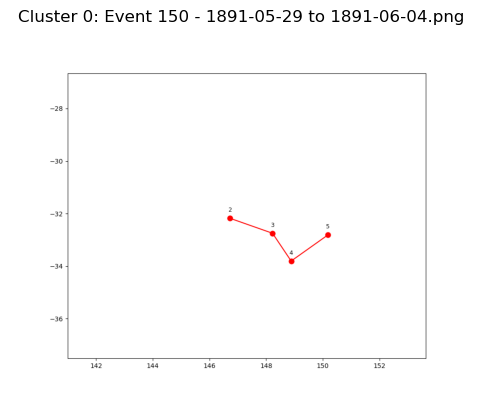

  Event 430 - 1887-10-25 to 1887-10-31.png


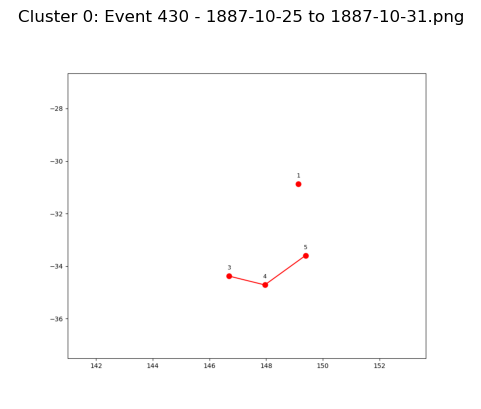

  Event 178 - 1870-03-19 to 1870-03-25.png


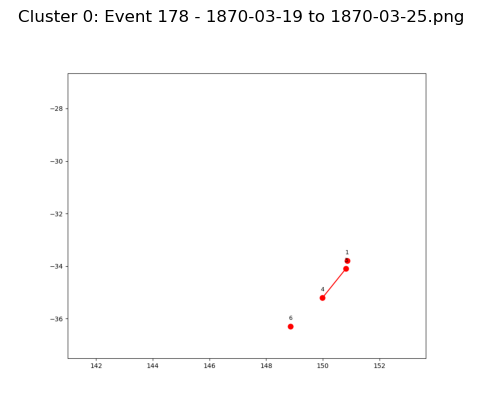

  Event 839 - 1889-02-02 to 1889-02-08.png


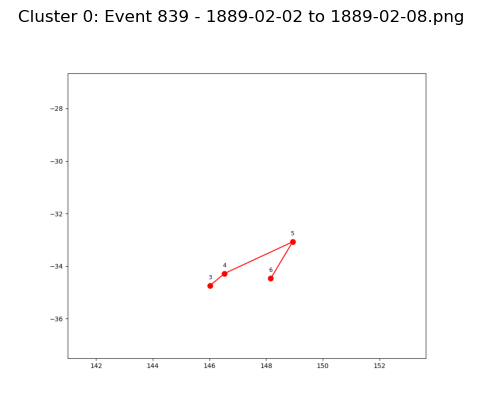

  Event 856 - 1894-01-07 to 1894-01-13.png


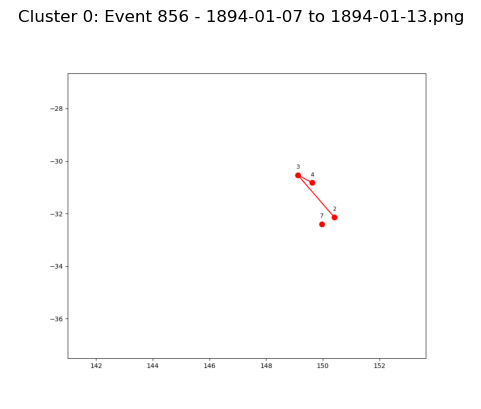

  Event 780 - 1887-02-15 to 1887-02-21.png


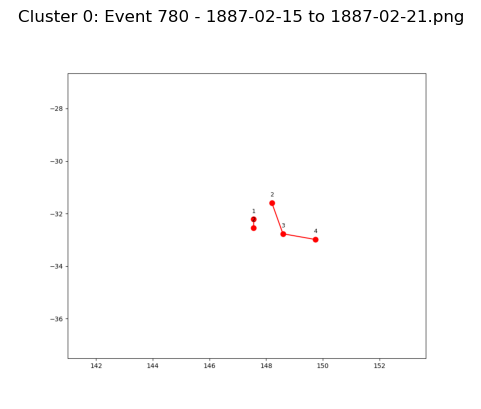

  Event 1051 - 1874-02-25 to 1874-03-03.png


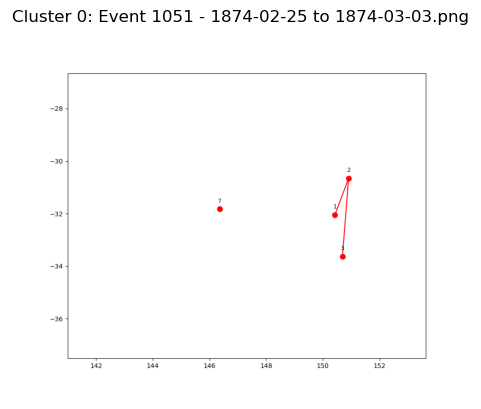

  Event 905 - 1900-04-08 to 1900-04-14.png


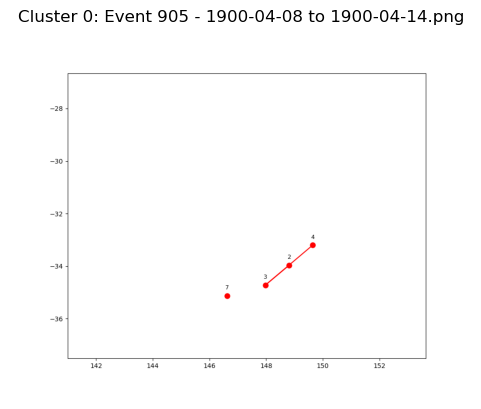

  Event 673 - 1879-07-28 to 1879-08-03.png


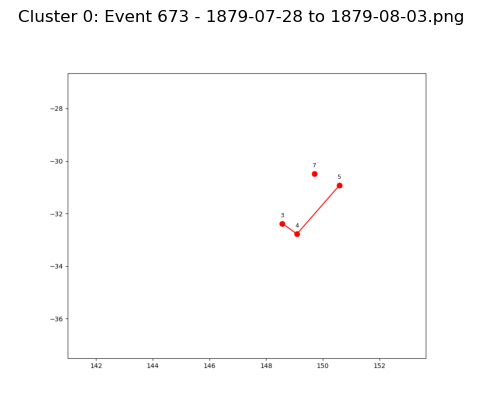

  Event 444 - 1900-03-03 to 1900-03-09.png


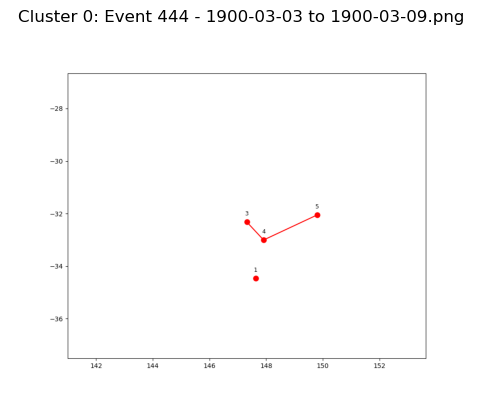

  Event 587 - 1892-06-05 to 1892-06-11.png


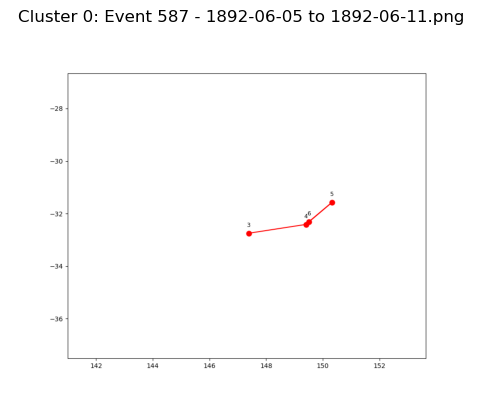

  Event 806 - 1898-02-04 to 1898-02-10.png


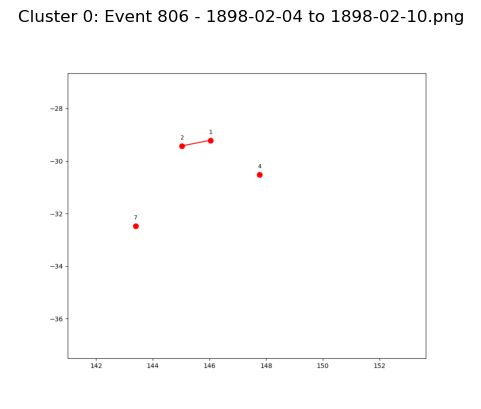

  Event 773 - 1881-10-30 to 1881-11-05.png


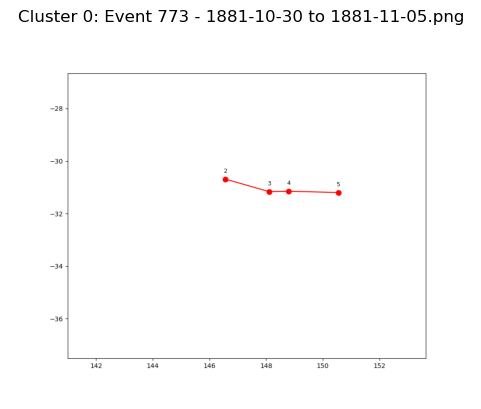

  Event 353 - 1881-02-01 to 1881-02-07.png


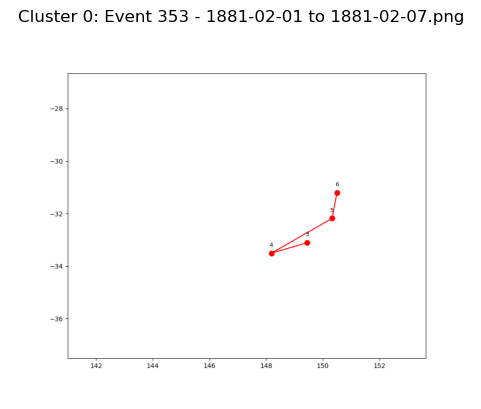

  Event 235 - 1897-06-10 to 1897-06-16.png


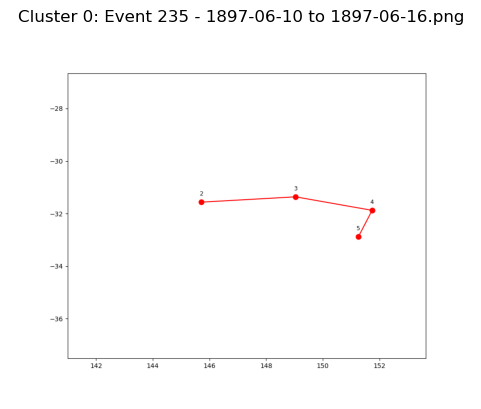

  Event 432 - 1889-05-02 to 1889-05-08.png


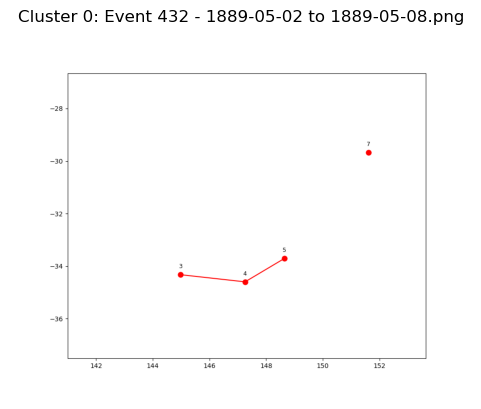

  Event 388 - 1874-01-23 to 1874-01-29.png


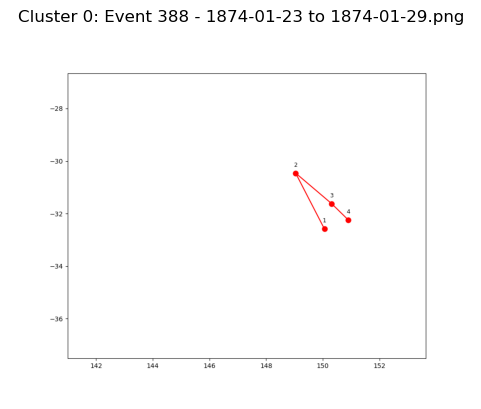

  Event 917 - 1887-09-28 to 1887-10-04.png


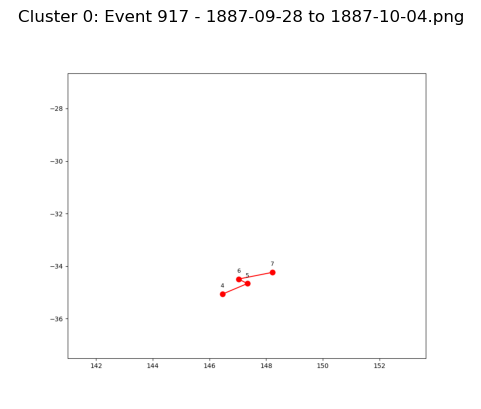

  Event 996 - 1870-06-19 to 1870-06-25.png


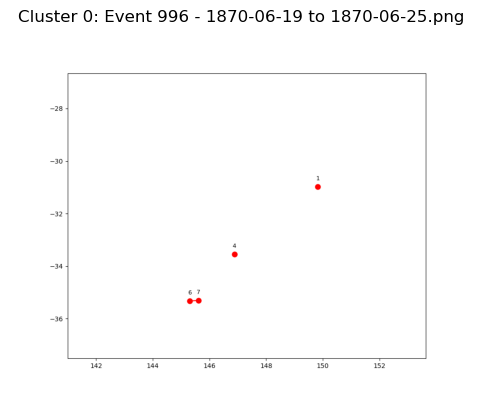

  Event 1069 - 1883-01-15 to 1883-01-21.png


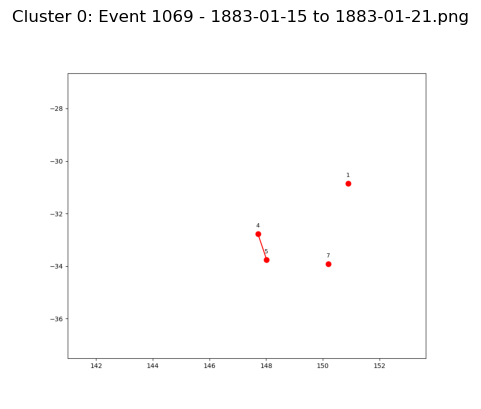

  Event 1089 - 1871-11-07 to 1871-11-13.png


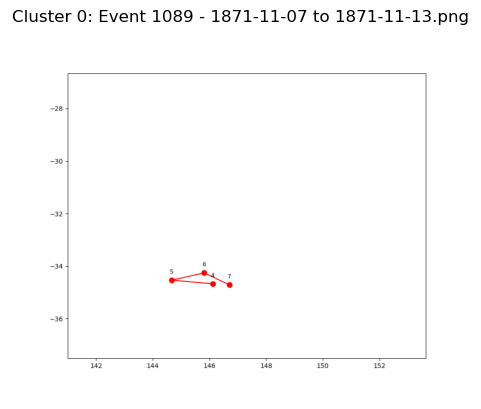

  Event 533 - 1895-09-02 to 1895-09-08.png


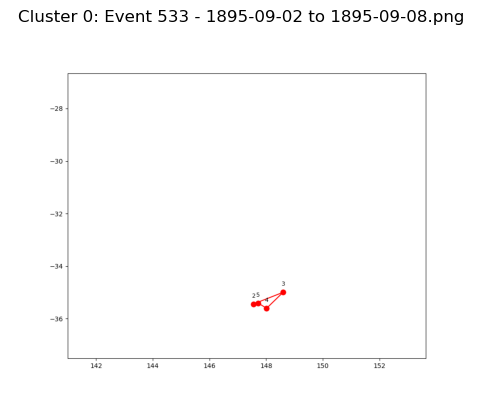

  Event 528 - 1889-11-22 to 1889-11-28.png


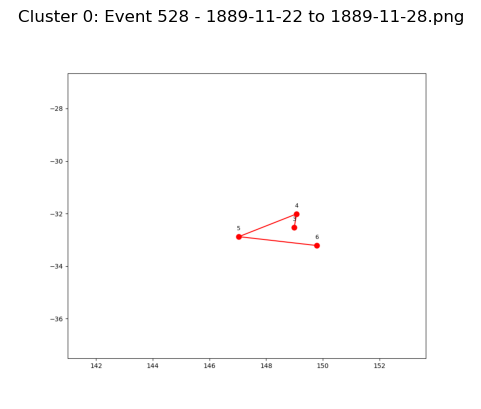

  Event 1079 - 1890-09-23 to 1890-09-29.png


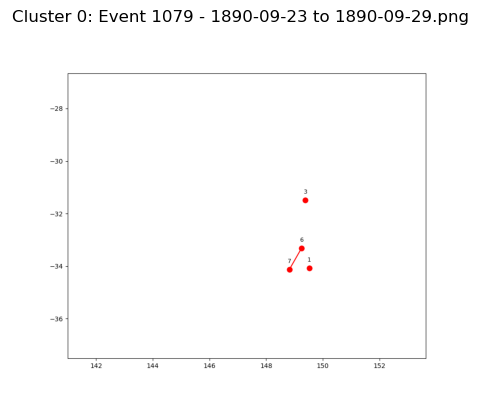

  Event 873 - 1884-02-17 to 1884-02-23.png


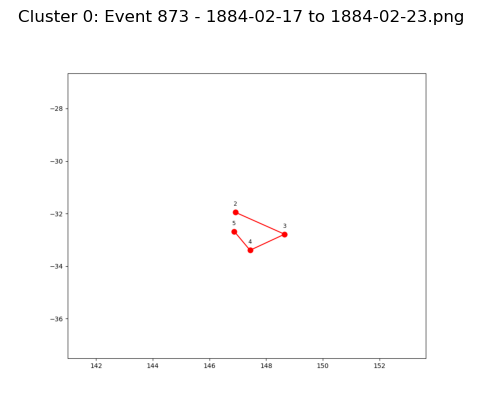

  Event 190 - 1894-07-06 to 1894-07-12.png


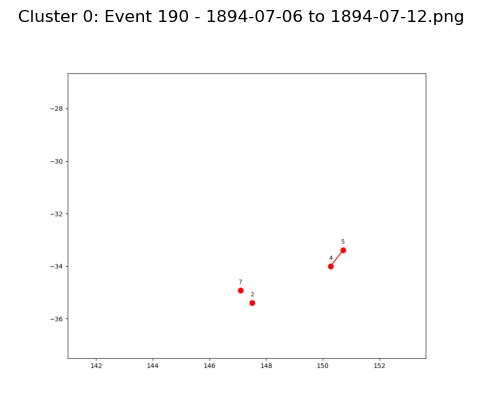

  Event 506 - 1883-08-10 to 1883-08-16.png


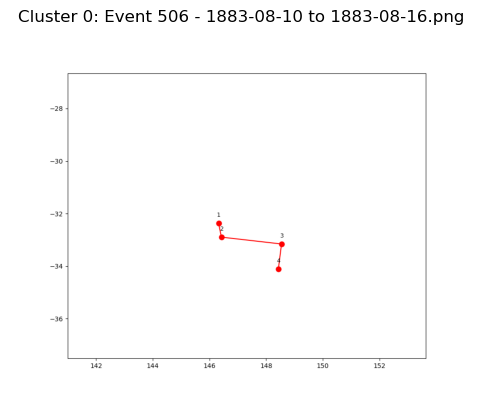

  Event 424 - 1882-05-28 to 1882-06-03.png


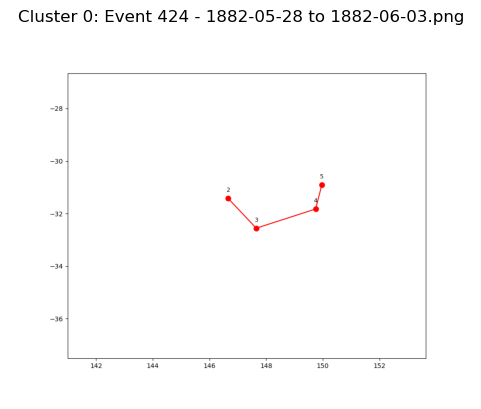

  Event 22 - 1898-03-04 to 1898-03-10.png


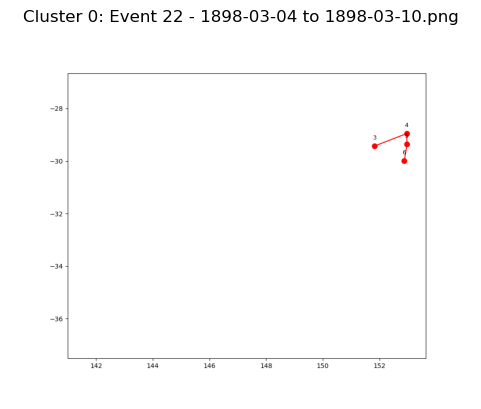

  Event 77 - 1900-03-28 to 1900-04-03.png


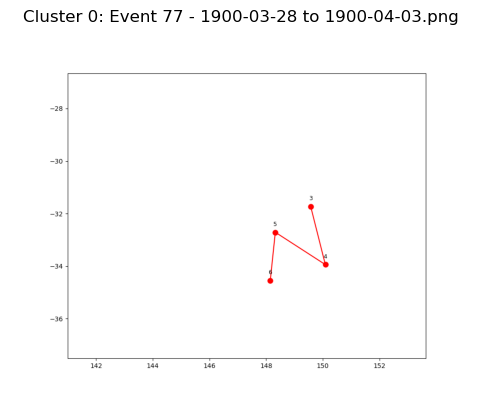

  Event 516 - 1885-10-30 to 1885-11-05.png


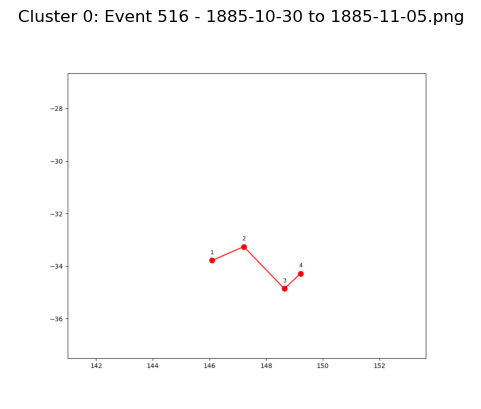

  Event 987 - 1880-02-25 to 1880-03-02.png


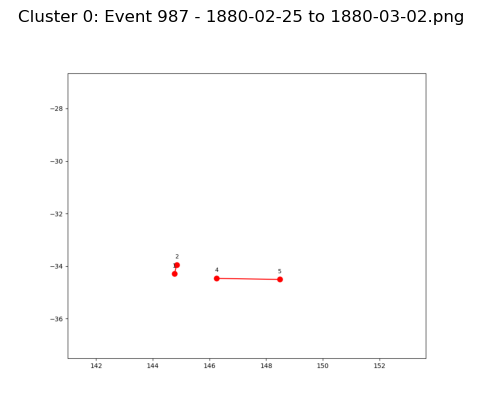

  Event 555 - 1889-10-03 to 1889-10-09.png


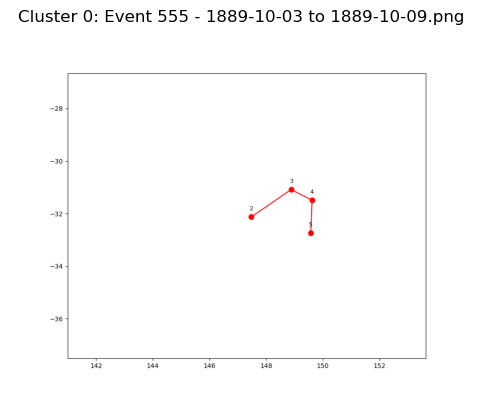

  Event 912 - 1878-02-20 to 1878-02-26.png


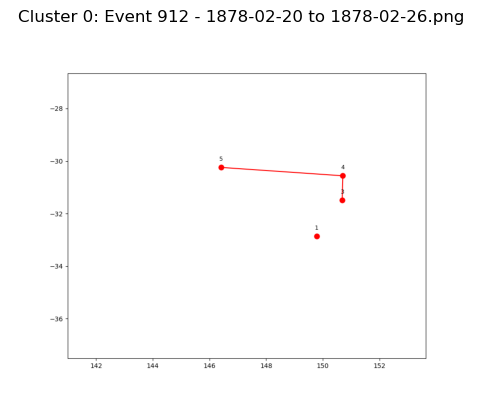

  Event 442 - 1895-09-29 to 1895-10-05.png


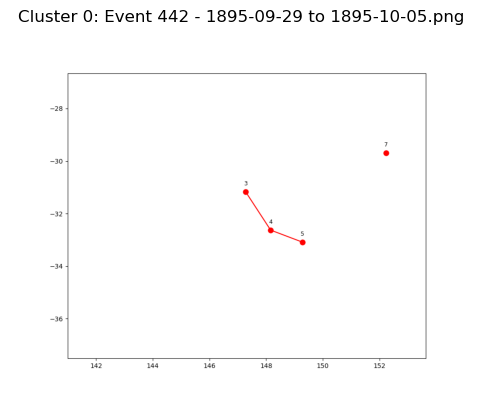

  Event 923 - 1898-10-24 to 1898-10-30.png


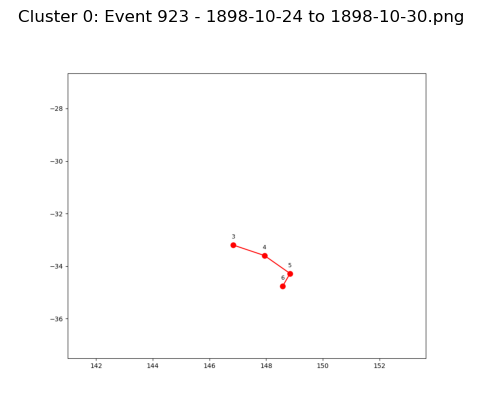

  Event 651 - 1883-08-18 to 1883-08-24.png


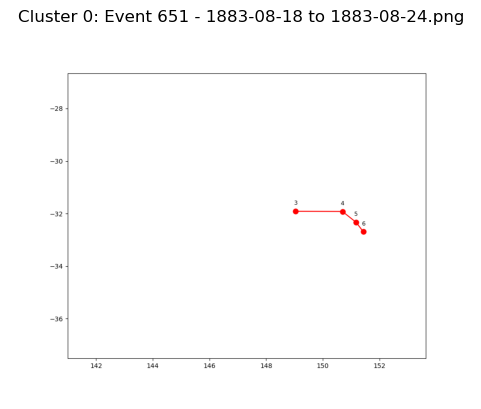

  Event 1059 - 1860-09-28 to 1860-10-04.png


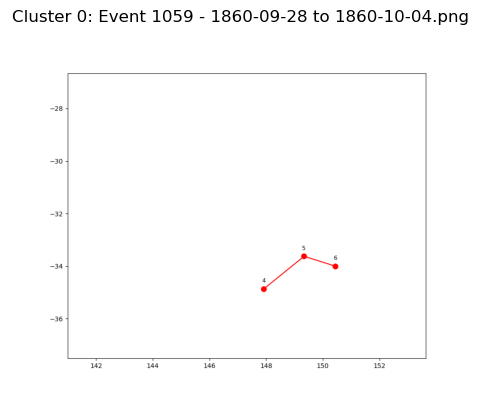

  Event 94 - 1891-03-04 to 1891-03-10.png


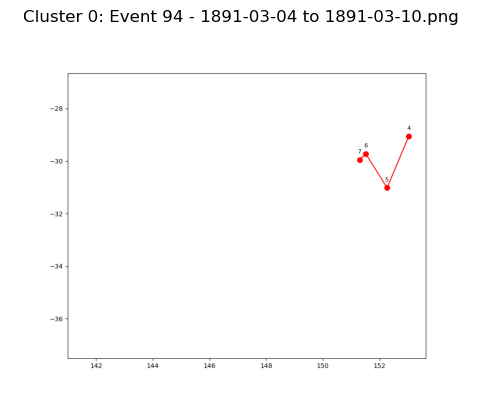

  Event 862 - 1875-01-28 to 1875-02-03.png


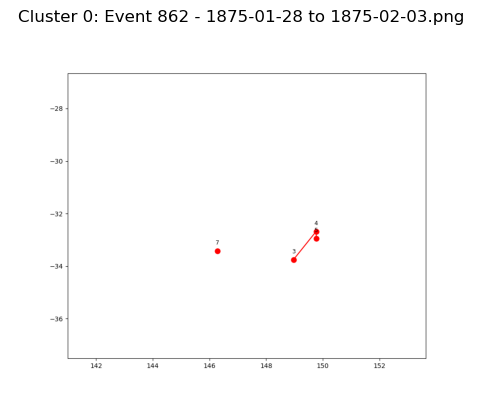

  Event 519 - 1887-03-09 to 1887-03-15.png


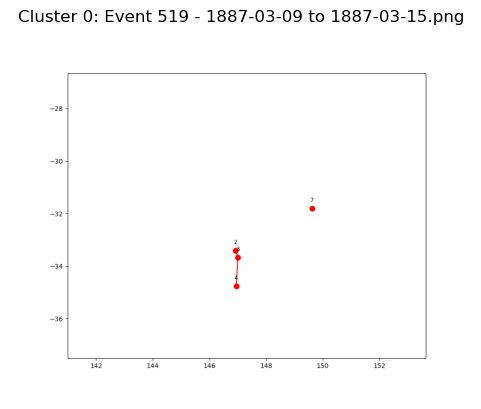

  Event 903 - 1883-05-25 to 1883-05-31.png


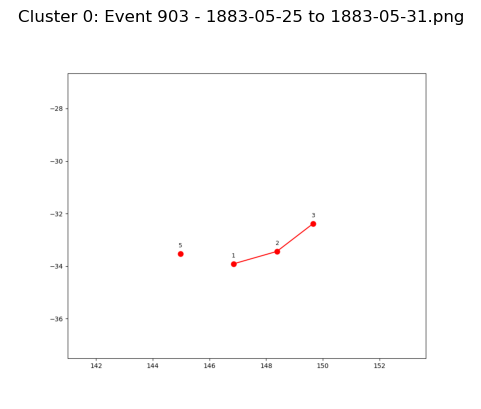

  Event 50 - 1890-02-16 to 1890-02-22.png


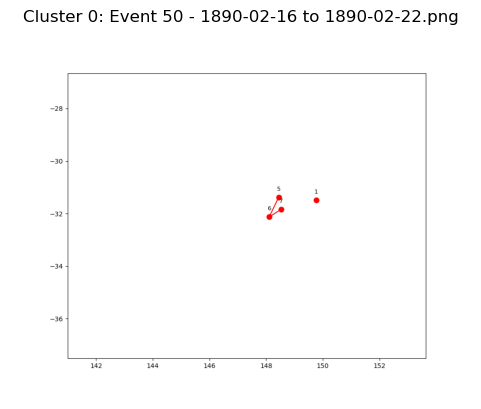

  Event 1010 - 1889-04-28 to 1889-05-04.png


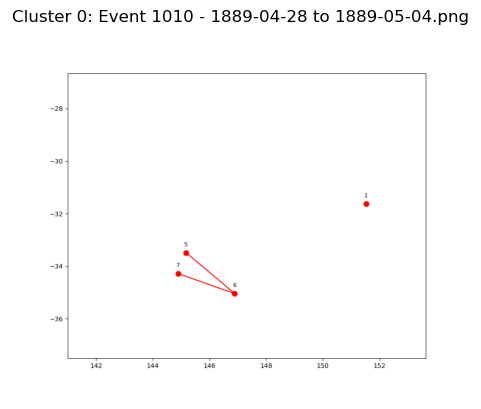

  Event 1011 - 1884-05-10 to 1884-05-16.png


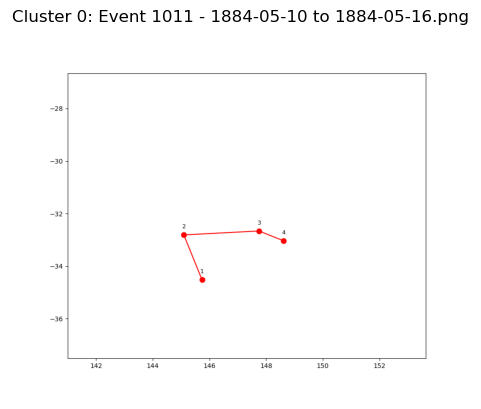

  Event 475 - 1887-11-26 to 1887-12-02.png


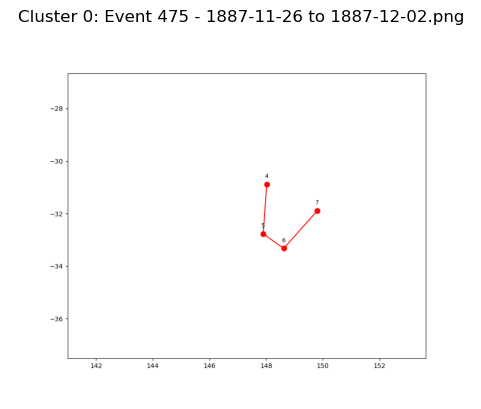

  Event 499 - 1881-06-12 to 1881-06-18.png


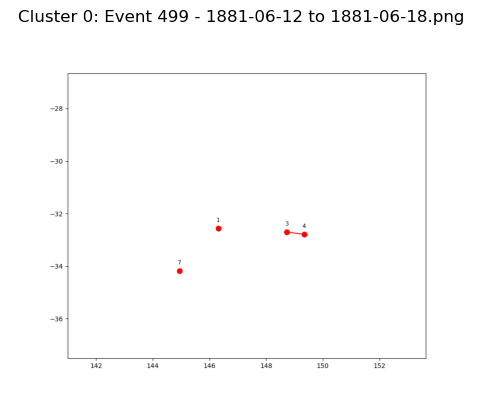

  Event 733 - 1895-11-15 to 1895-11-21.png


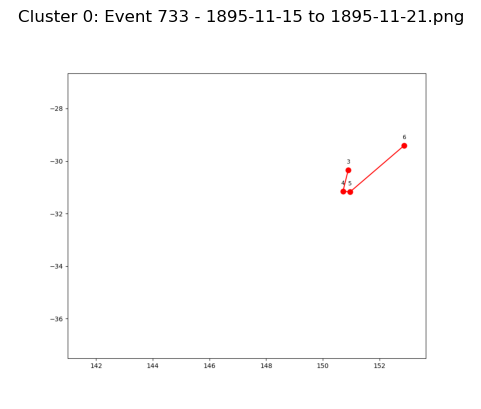

  Event 988 - 1881-05-01 to 1881-05-07.png


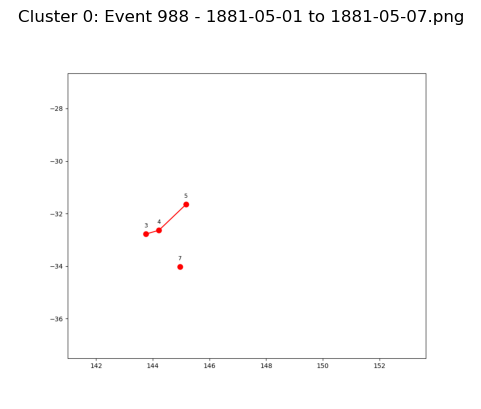

  Event 202 - 1873-06-02 to 1873-06-08.png


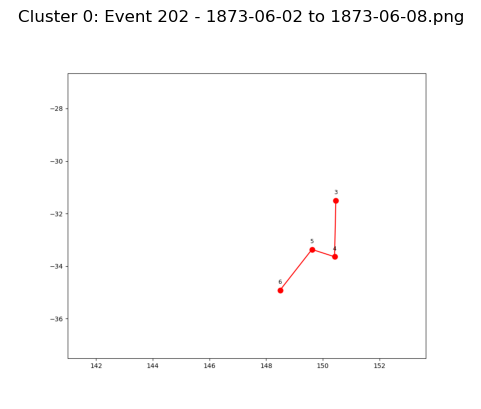

  Event 405 - 1876-05-05 to 1876-05-11.png


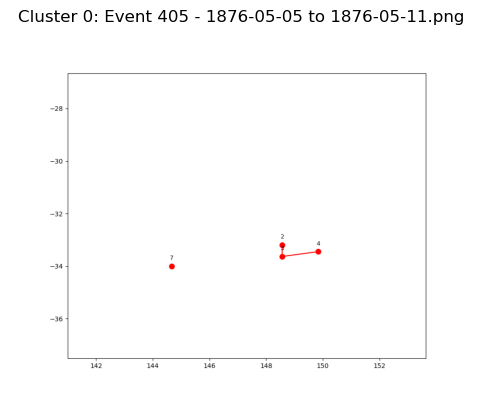

  Event 149 - 1888-02-03 to 1888-02-09.png


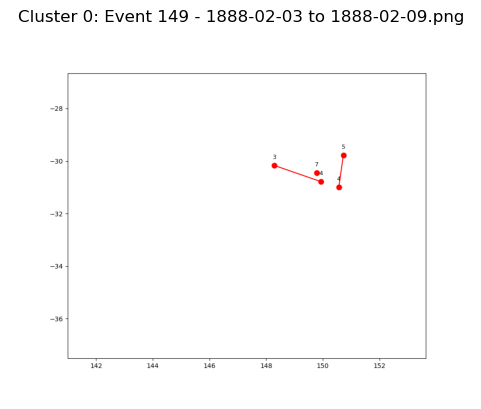

  Event 844 - 1900-04-01 to 1900-04-07.png


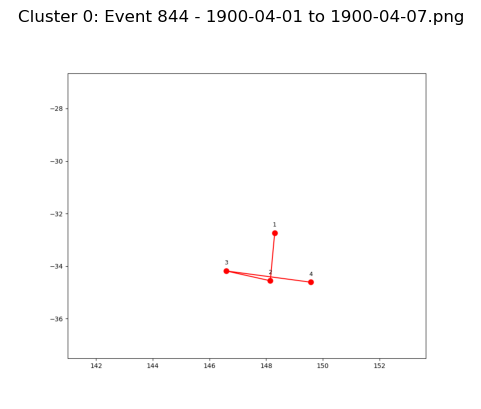

  Event 299 - 1876-10-06 to 1876-10-12.png


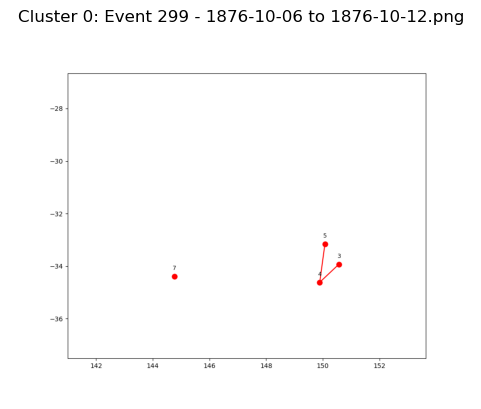

  Event 1009 - 1897-08-10 to 1897-08-16.png


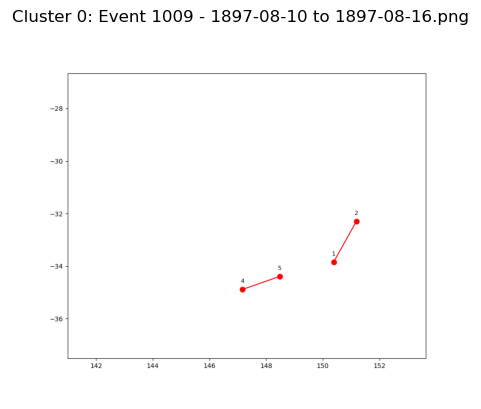

  Event 41 - 1892-09-21 to 1892-09-27.png


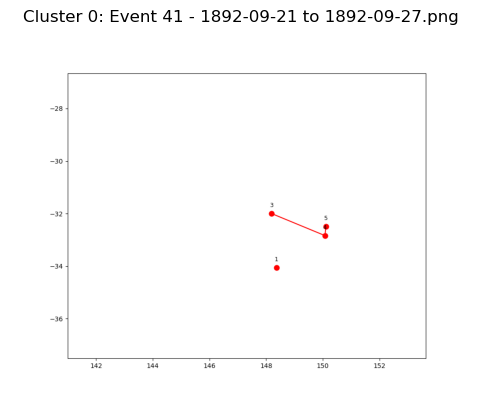

  Event 466 - 1881-11-08 to 1881-11-14.png


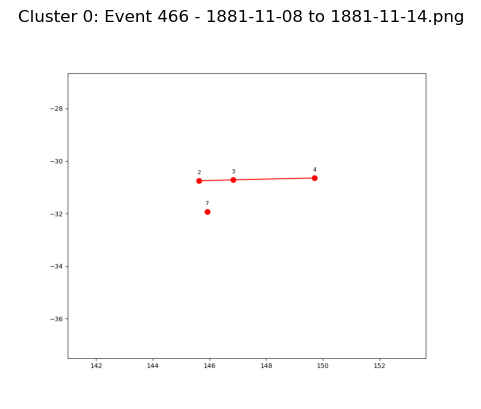

  Event 381 - 1896-03-07 to 1896-03-13.png


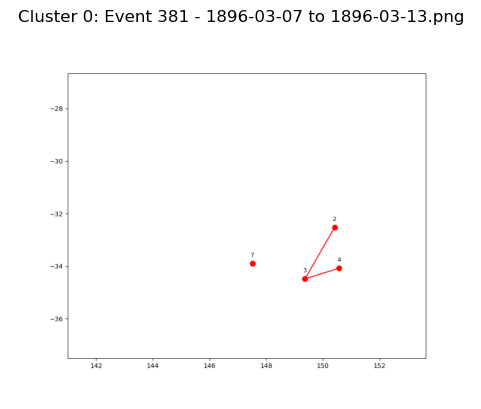

  Event 518 - 1886-09-04 to 1886-09-10.png


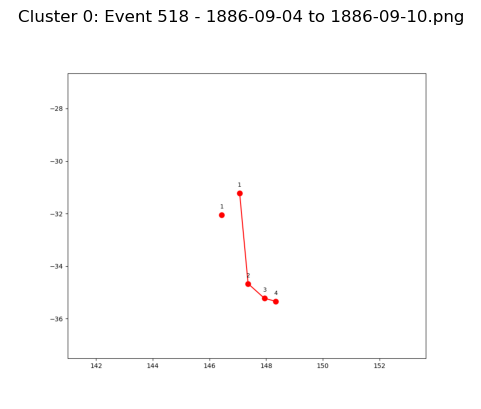

  Event 16 - 1894-02-01 to 1894-02-07.png


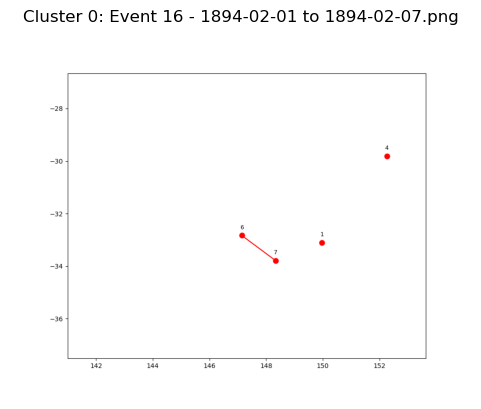

  Event 529 - 1891-07-03 to 1891-07-09.png


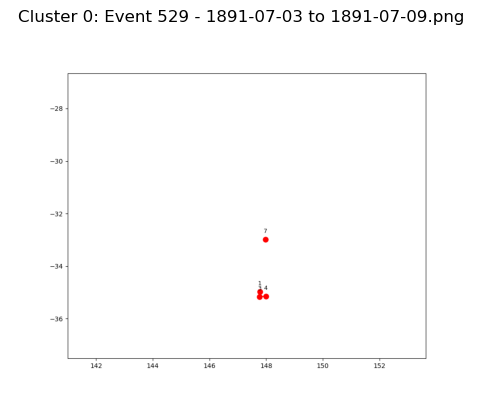

  Event 751 - 1897-09-19 to 1897-09-25.png


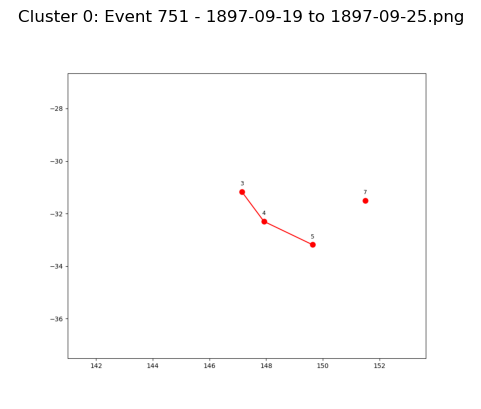

  Event 899 - 1891-10-02 to 1891-10-08.png


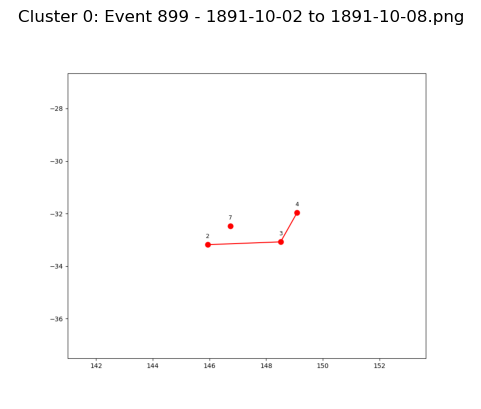

  Event 925 - 1859-01-04 to 1859-01-10.png


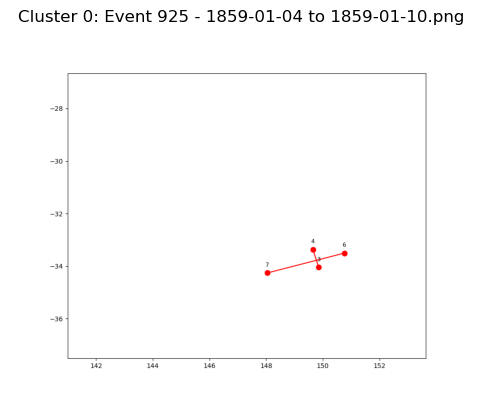

  Event 49 - 1889-12-06 to 1889-12-12.png


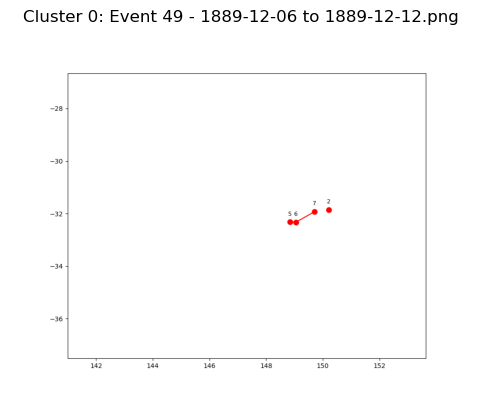

  Event 628 - 1884-02-10 to 1884-02-16.png


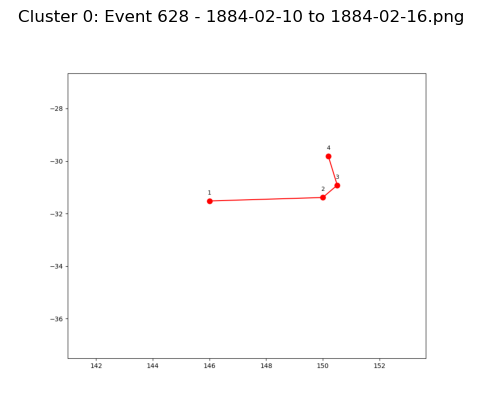

  Event 631 - 1885-02-21 to 1885-02-27.png


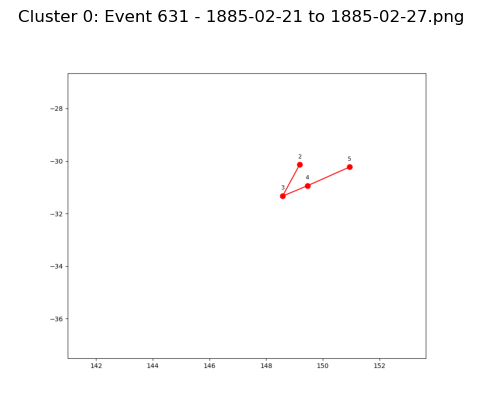

  Event 714 - 1896-11-16 to 1896-11-22.png


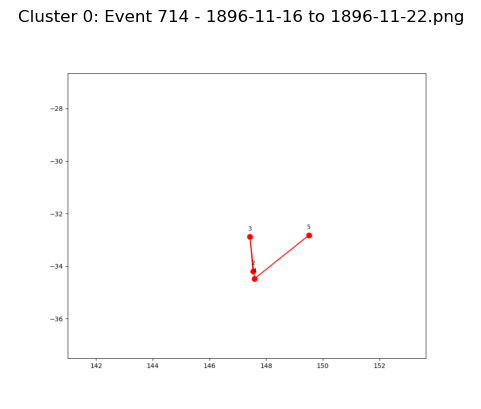

  Event 296 - 1872-11-19 to 1872-11-25.png


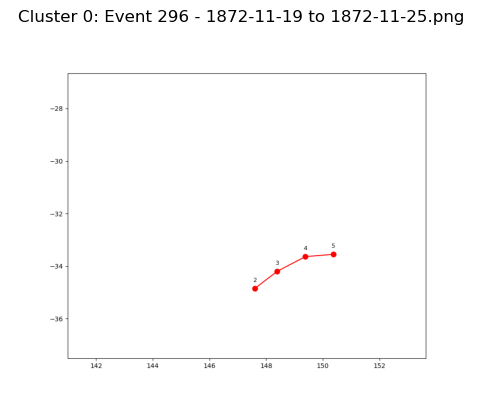

  Event 242 - 1899-08-08 to 1899-08-14.png


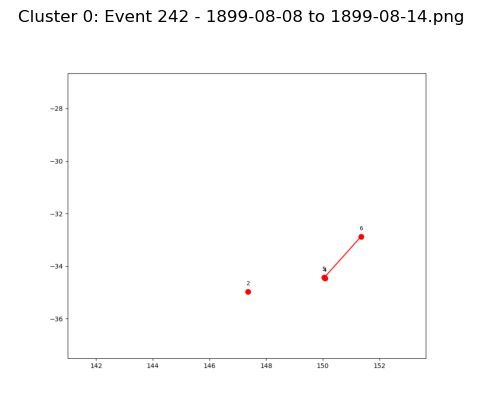

  Event 645 - 1880-09-08 to 1880-09-14.png


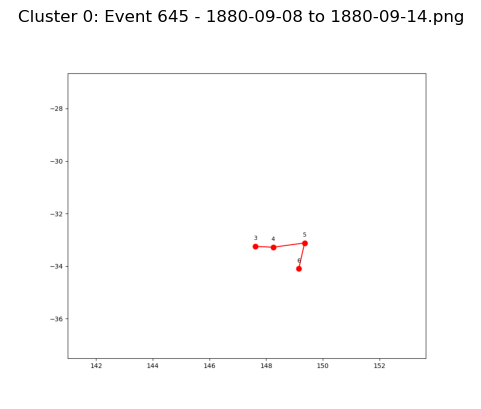

  Event 257 - 1886-07-27 to 1886-08-02.png


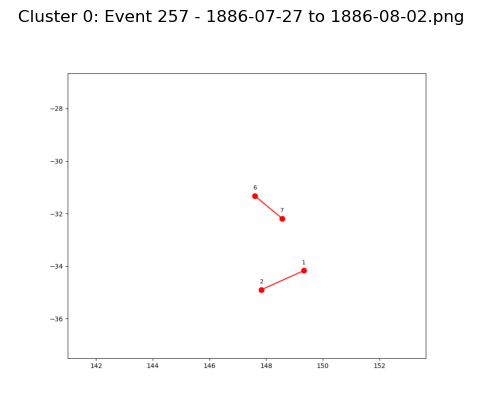

  Event 365 - 1885-01-17 to 1885-01-23.png


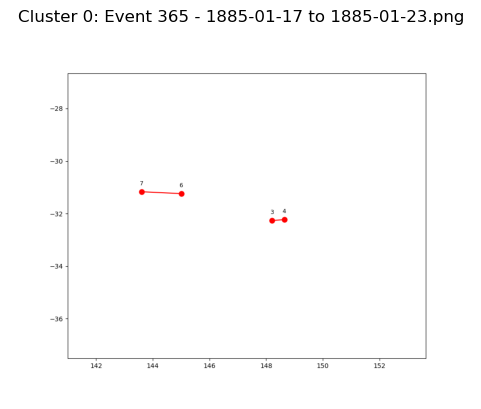

  Event 972 - 1891-10-25 to 1891-10-31.png


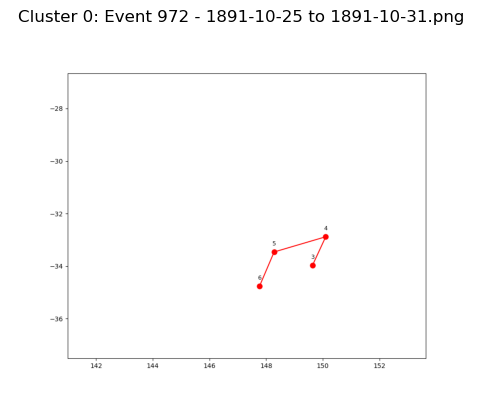

  Event 732 - 1871-01-06 to 1871-01-12.png


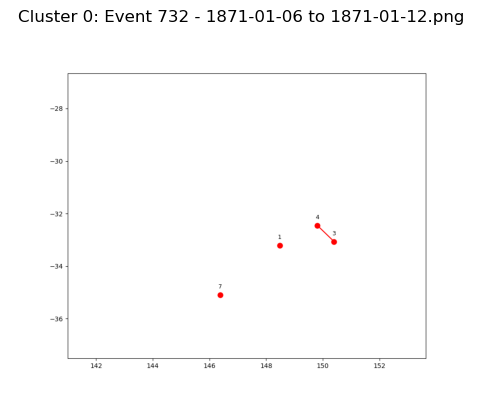

  Event 438 - 1888-12-26 to 1889-01-01.png


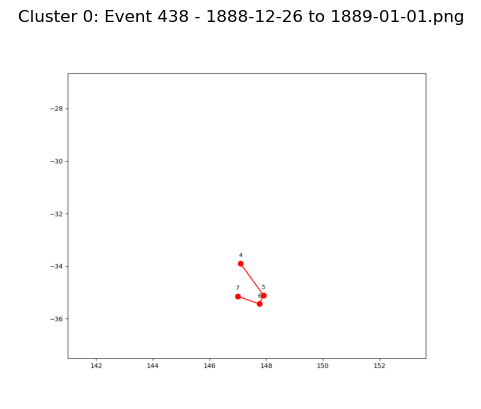

  Event 1084 - 1891-06-27 to 1891-07-03.png


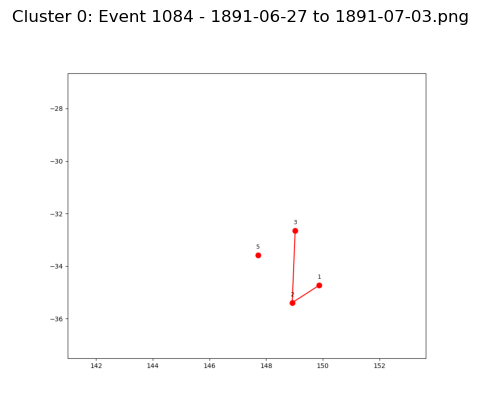

  Event 443 - 1897-08-26 to 1897-09-01.png


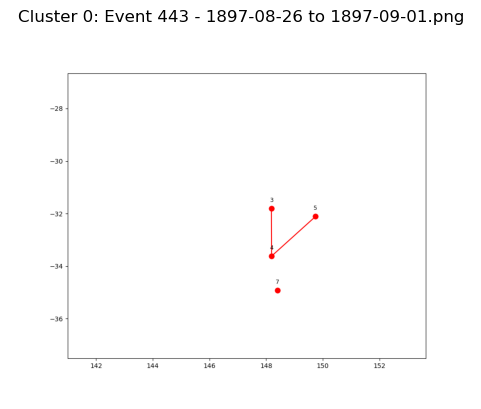

  Event 398 - 1891-10-30 to 1891-11-05.png


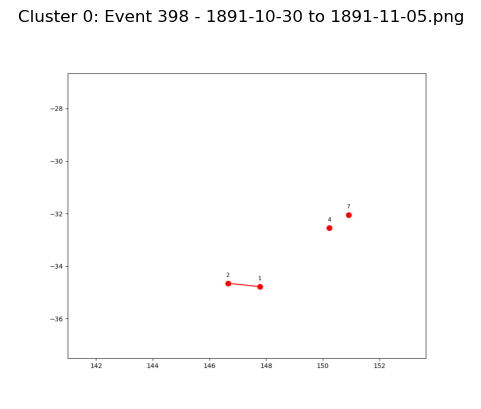

  Event 894 - 1881-02-27 to 1881-03-05.png


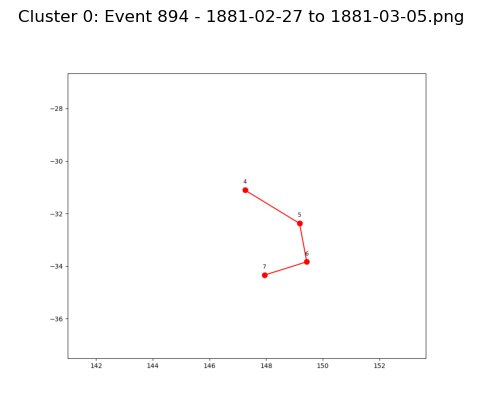

  Event 197 - 1895-08-13 to 1895-08-19.png


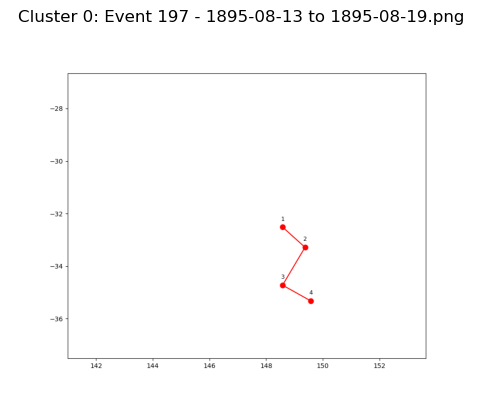

  Event 334 - 1896-08-12 to 1896-08-18.png


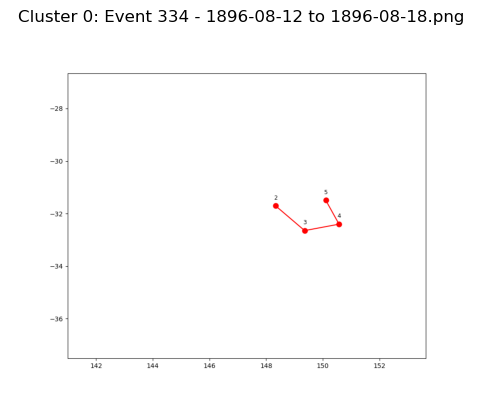

  Event 236 - 1899-12-28 to 1900-01-03.png


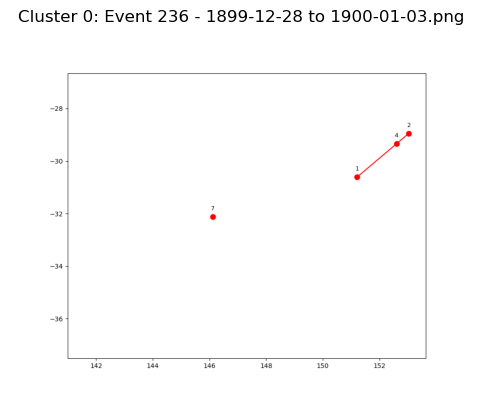

  Event 943 - 1875-04-20 to 1875-04-26.png


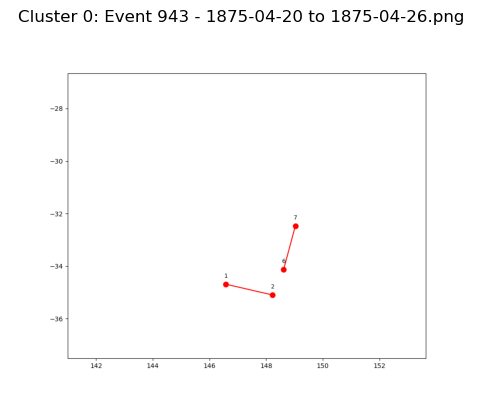

  Event 76 - 1896-06-05 to 1896-06-11.png


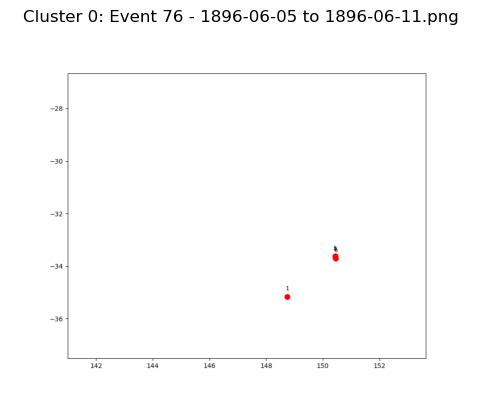

  Event 420 - 1890-07-26 to 1890-08-01.png


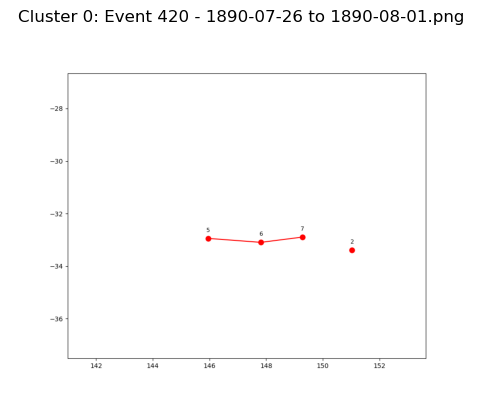

  Event 735 - 1892-12-13 to 1892-12-19.png


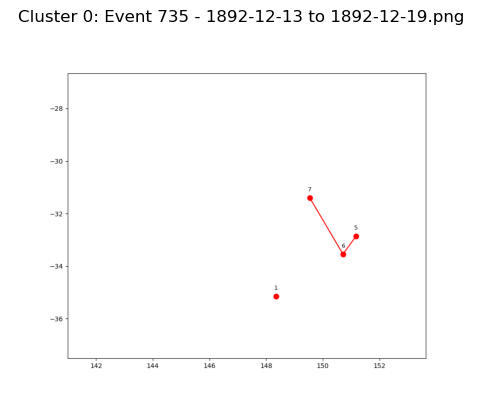

  Event 425 - 1886-12-02 to 1886-12-08.png


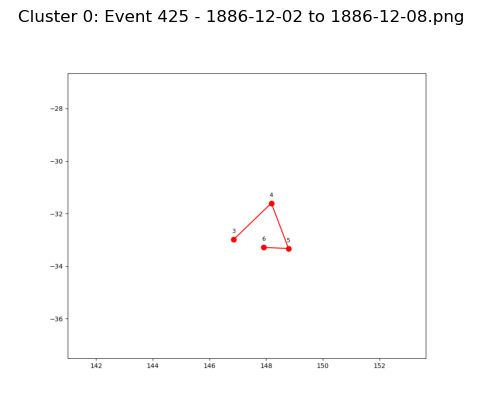

  Event 687 - 1885-11-23 to 1885-11-29.png


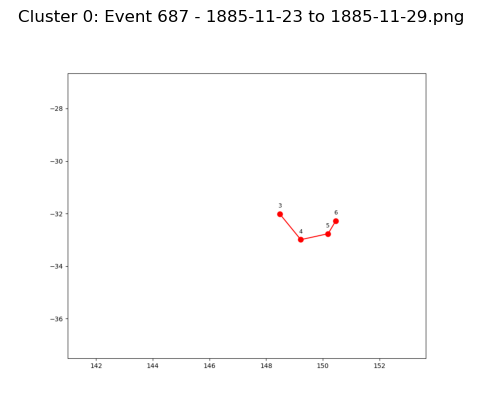

  Event 30 - 1895-01-20 to 1895-01-26.png


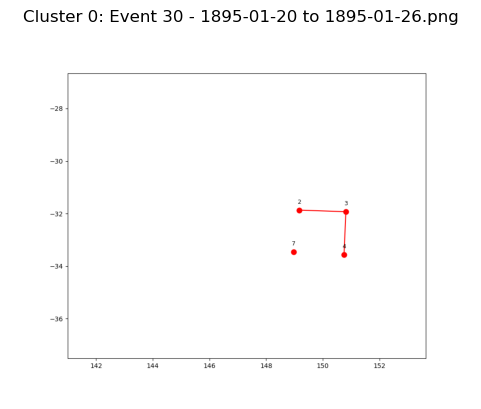

  Event 819 - 1885-12-17 to 1885-12-23.png


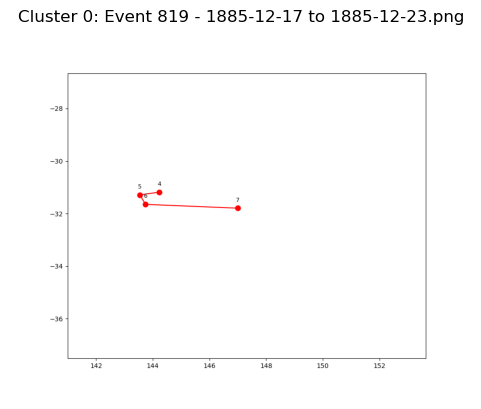

  Event 24 - 1891-06-22 to 1891-06-28.png


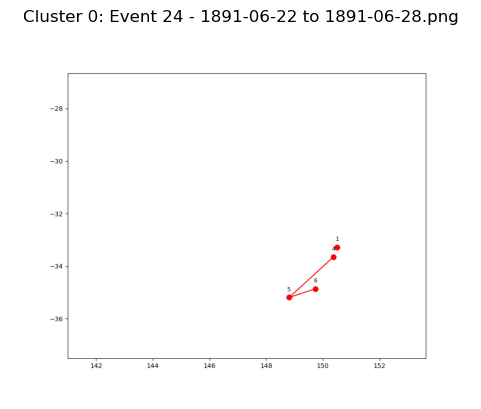

  Event 378 - 1891-11-26 to 1891-12-02.png


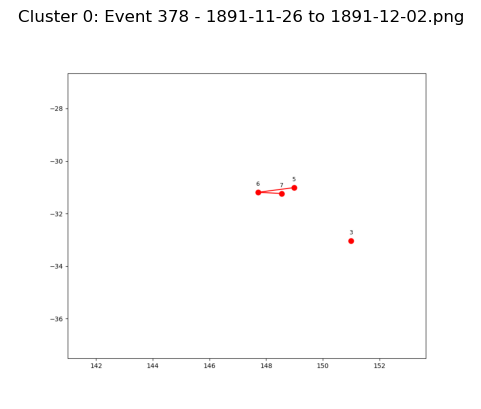

  Event 605 - 1878-03-24 to 1878-03-30.png


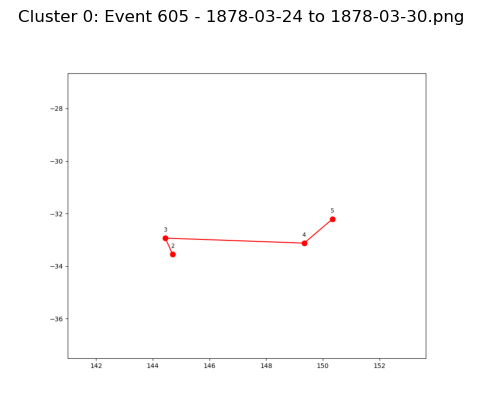

  Event 1083 - 1898-06-01 to 1898-06-07.png


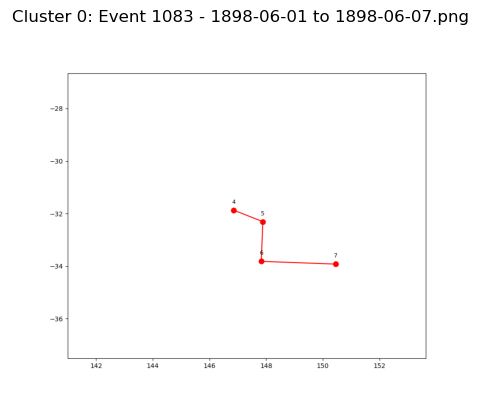

  Event 73 - 1900-11-16 to 1900-11-22.png


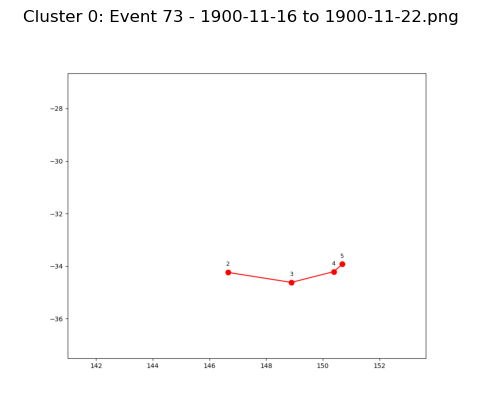

  Event 691 - 1872-12-10 to 1872-12-16.png


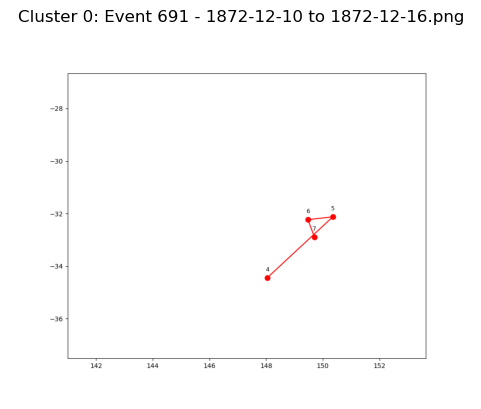

  Event 859 - 1891-01-21 to 1891-01-27.png


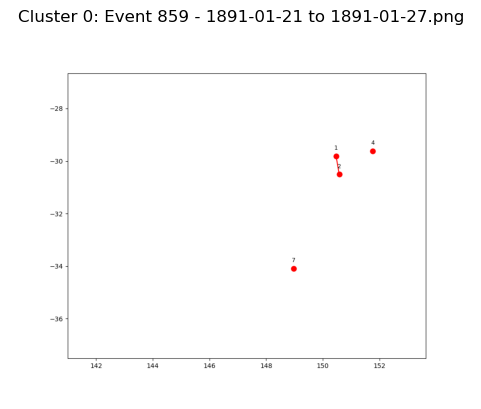

  Event 490 - 1871-12-08 to 1871-12-14.png


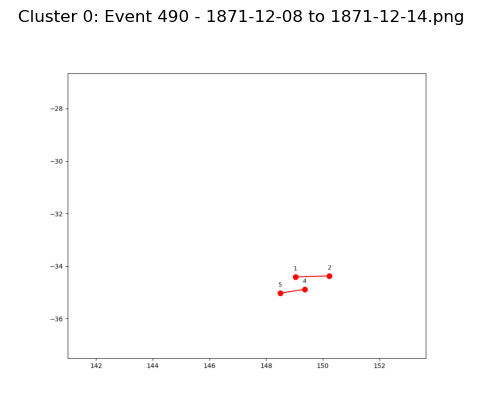

  Event 1 - 1889-07-14 to 1889-07-20.png


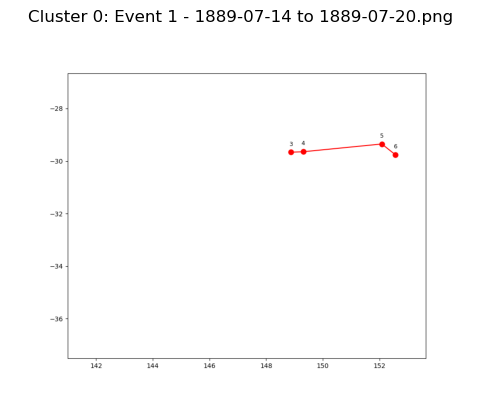

  Event 1007 - 1885-08-11 to 1885-08-17.png


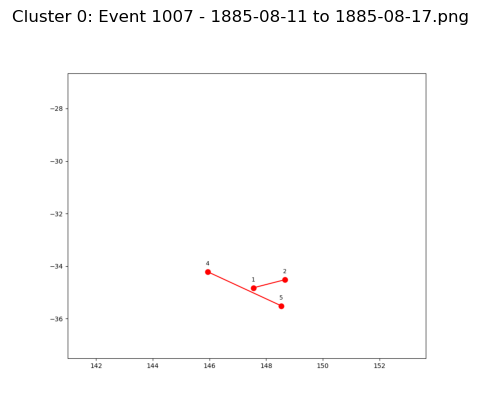

  Event 1029 - 1894-08-08 to 1894-08-14.png


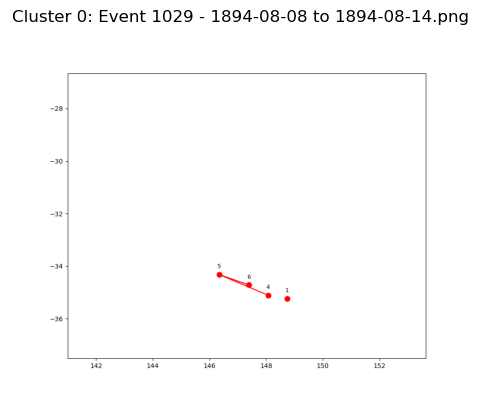

  Event 70 - 1888-12-14 to 1888-12-20.png


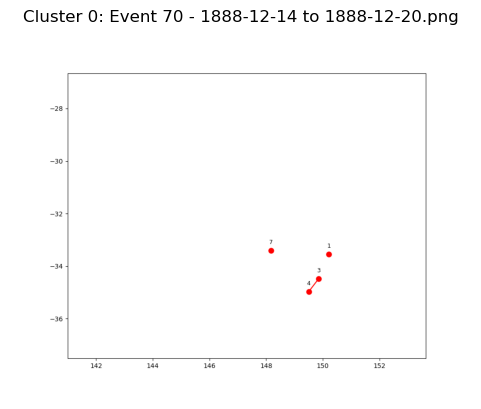

  Event 256 - 1896-02-06 to 1896-02-12.png


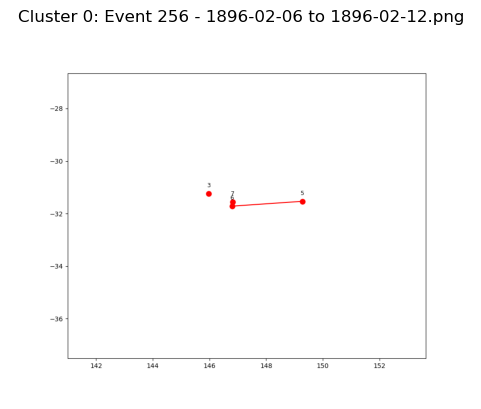

  Event 952 - 1859-10-30 to 1859-11-05.png


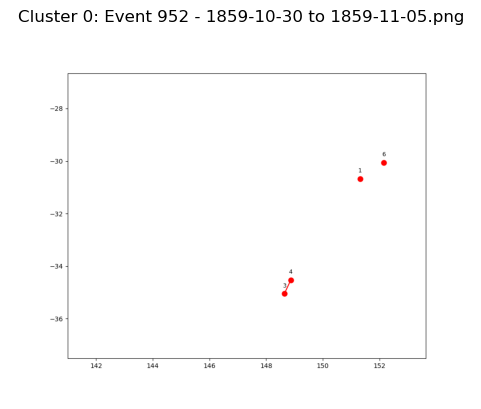

  Event 749 - 1889-12-21 to 1889-12-27.png


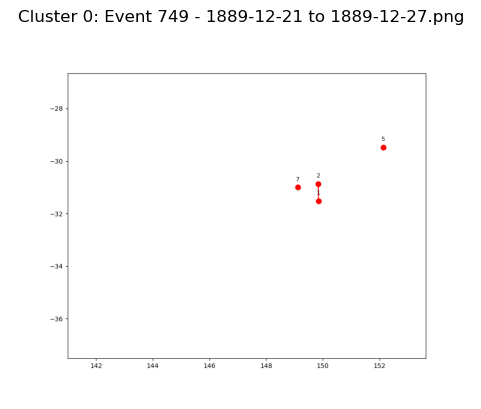

  Event 179 - 1870-05-08 to 1870-05-14.png


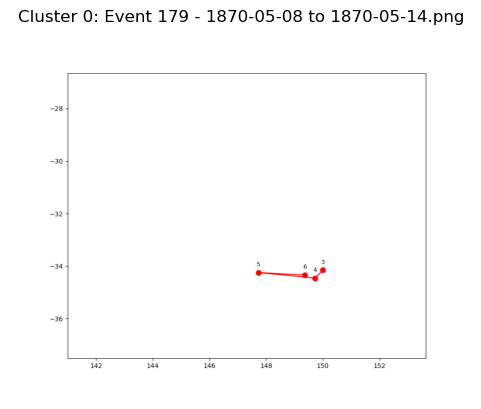

  Event 1033 - 1878-07-29 to 1878-08-04.png


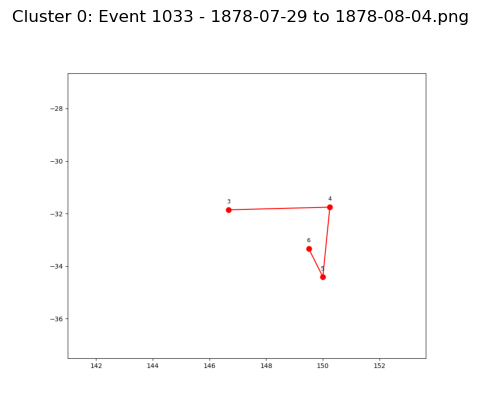

  Event 2 - 1890-01-10 to 1890-01-16.png


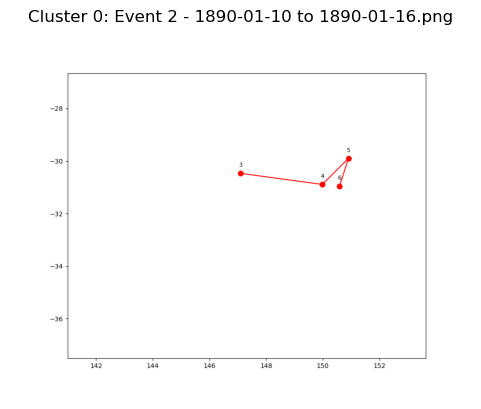

  Event 707 - 1878-03-20 to 1878-03-26.png


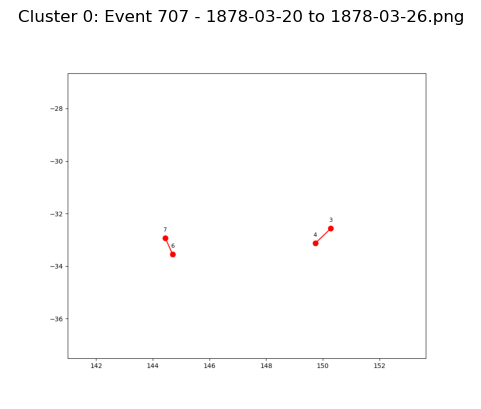

  Event 1056 - 1891-04-05 to 1891-04-11.png


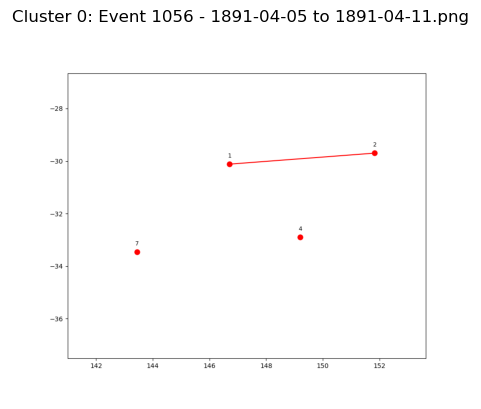

  Event 812 - 1874-03-27 to 1874-04-02.png


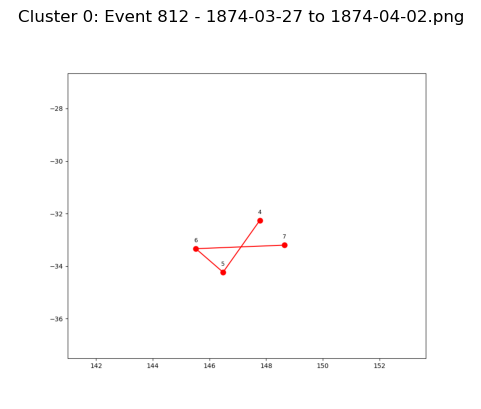

  Event 51 - 1891-12-01 to 1891-12-07.png


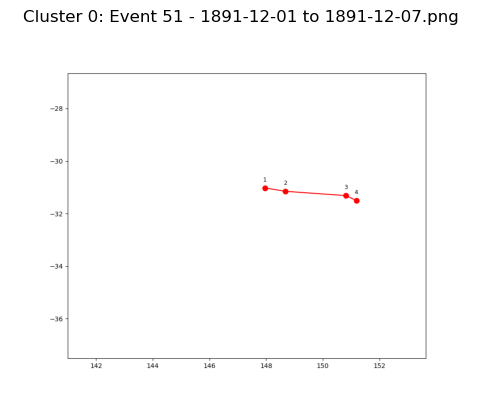

  Event 265 - 1897-12-18 to 1897-12-24.png


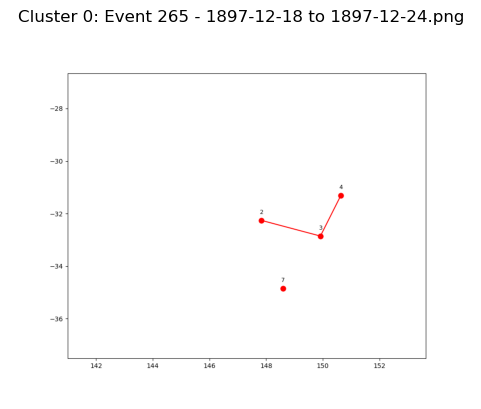

  Event 1090 - 1874-09-11 to 1874-09-17.png


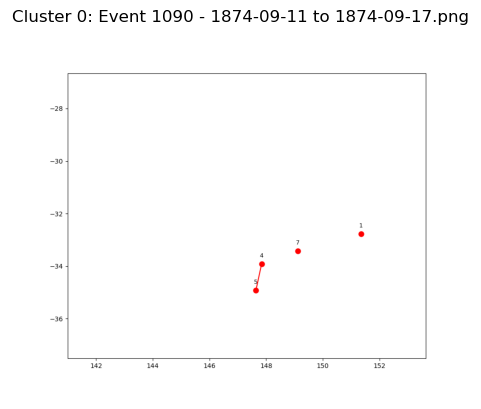

  Event 971 - 1882-11-20 to 1882-11-26.png


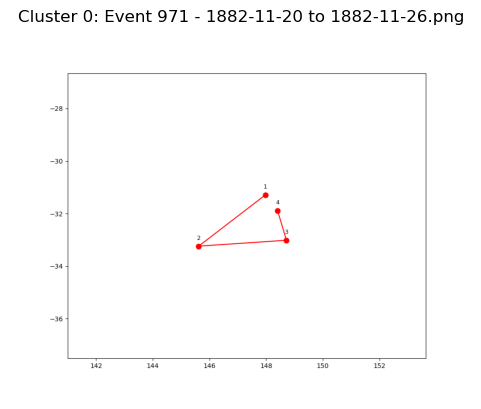

  Event 1077 - 1874-08-27 to 1874-09-02.png


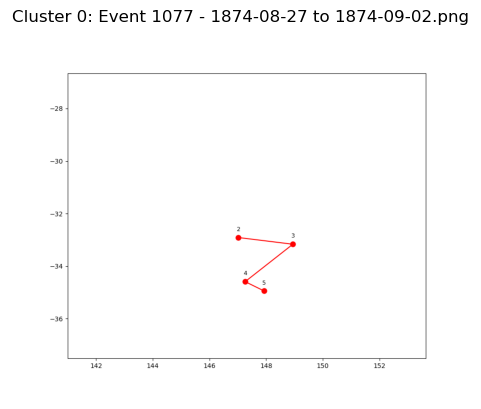

  Event 520 - 1887-07-15 to 1887-07-21.png


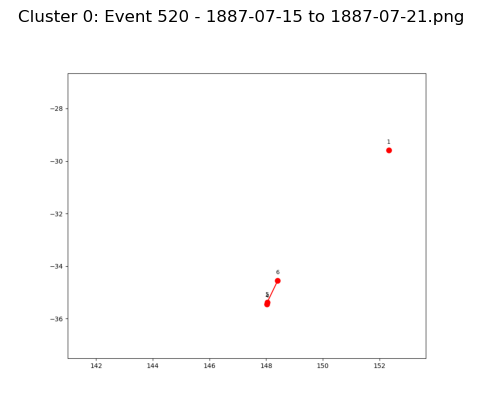

  Event 594 - 1895-09-14 to 1895-09-20.png


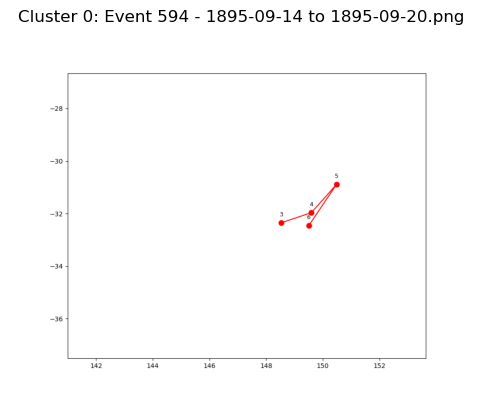

  Event 858 - 1890-09-04 to 1890-09-10.png


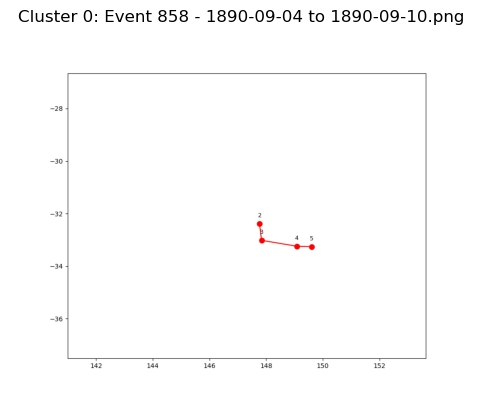

  Event 456 - 1900-03-12 to 1900-03-18.png


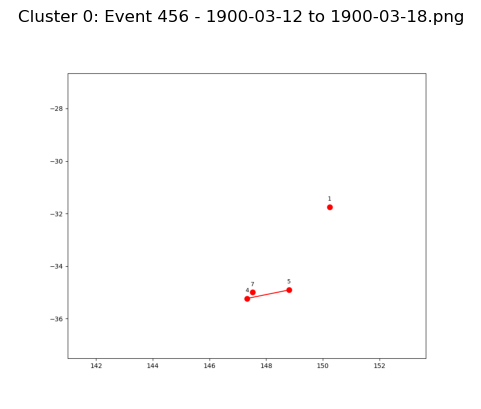

  Event 886 - 1876-10-10 to 1876-10-16.png


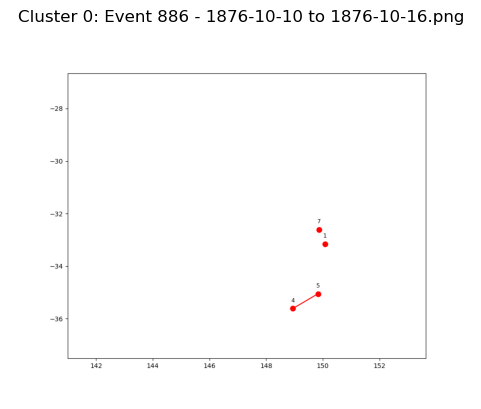

  Event 159 - 1881-10-16 to 1881-10-22.png


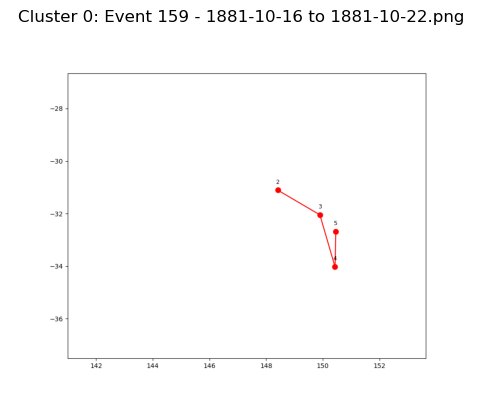

  Event 897 - 1886-04-04 to 1886-04-10.png


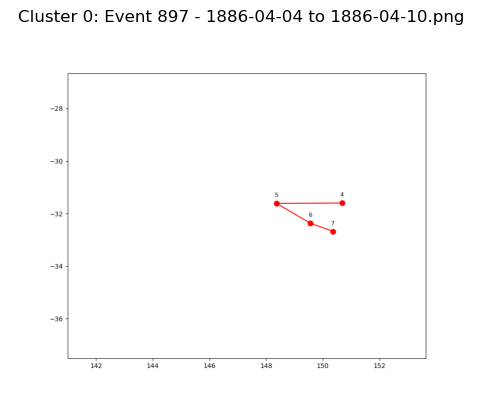

  Event 373 - 1893-01-11 to 1893-01-17.png


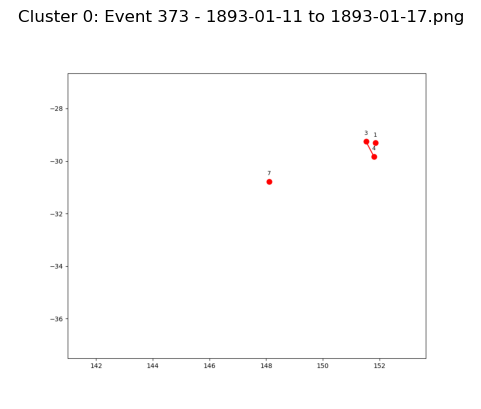

  Event 129 - 1882-06-06 to 1882-06-12.png


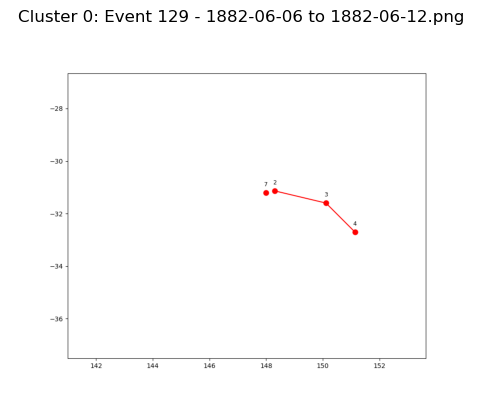

  Event 750 - 1891-07-16 to 1891-07-22.png


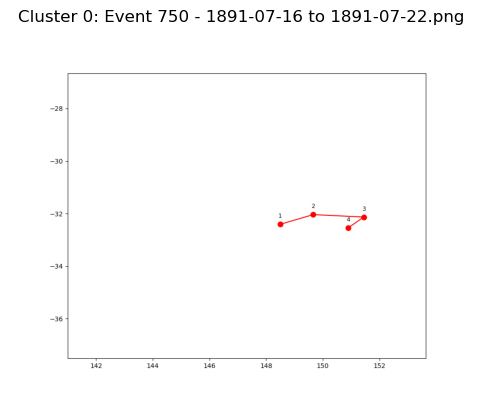

  Event 131 - 1882-12-22 to 1882-12-28.png


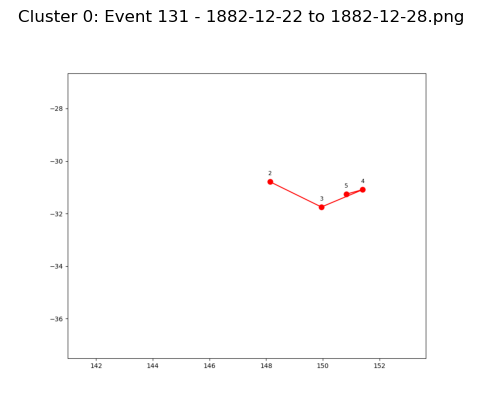

  Event 638 - 1879-02-24 to 1879-03-02.png


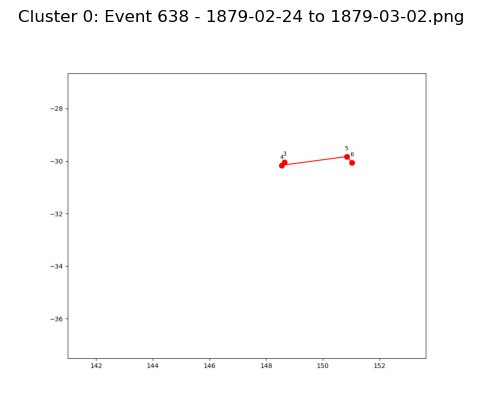

  Event 704 - 1873-08-04 to 1873-08-10.png


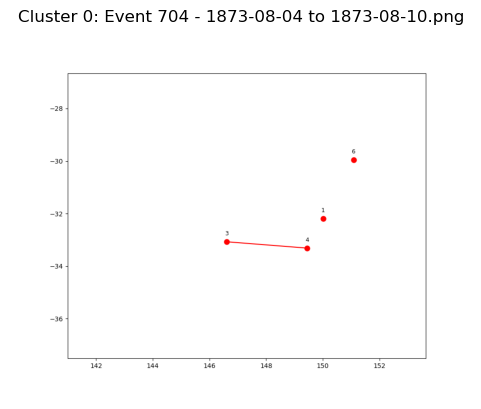

  Event 660 - 1878-07-09 to 1878-07-15.png


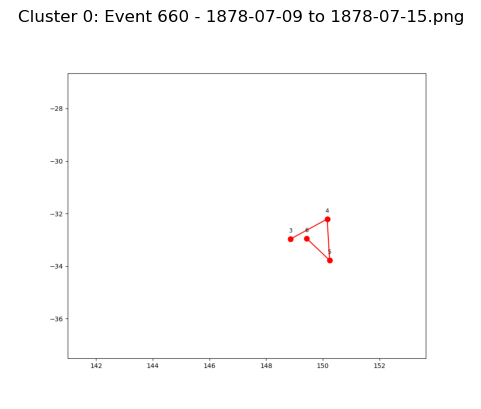

  Event 238 - 1894-06-03 to 1894-06-09.png


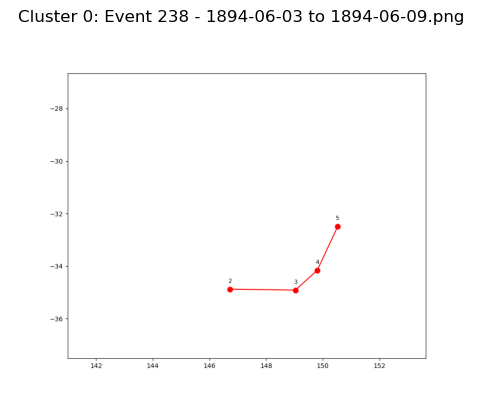

  Event 1023 - 1883-09-02 to 1883-09-08.png


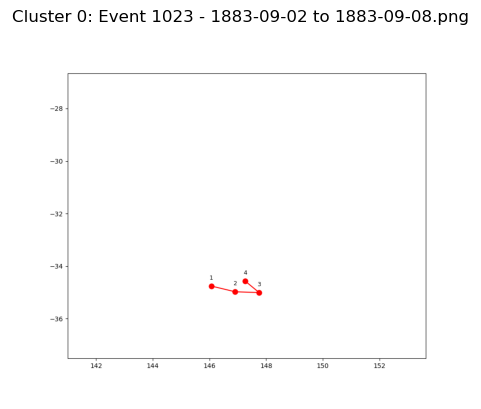

  Event 27 - 1893-03-02 to 1893-03-08.png


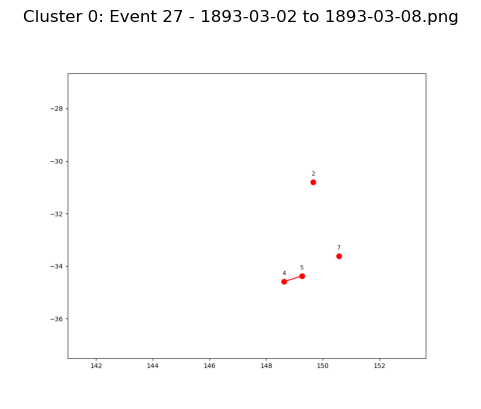

  Event 104 - 1896-06-10 to 1896-06-16.png


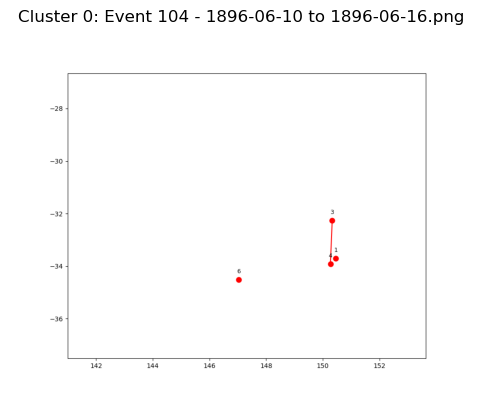

  Event 1093 - 1872-01-14 to 1872-01-20.png


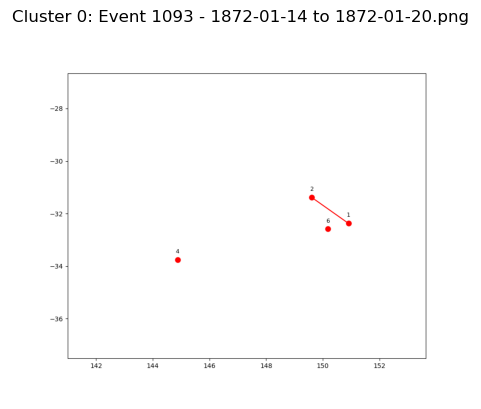

  Event 728 - 1878-06-11 to 1878-06-17.png


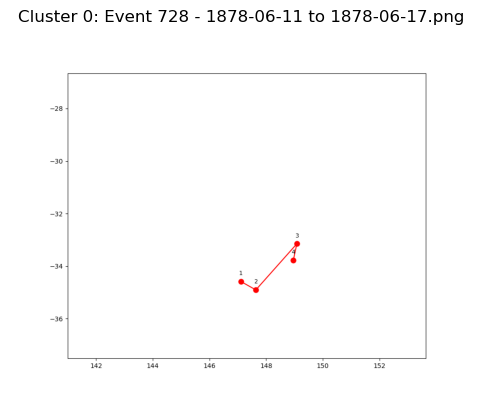

  Event 661 - 1880-01-06 to 1880-01-12.png


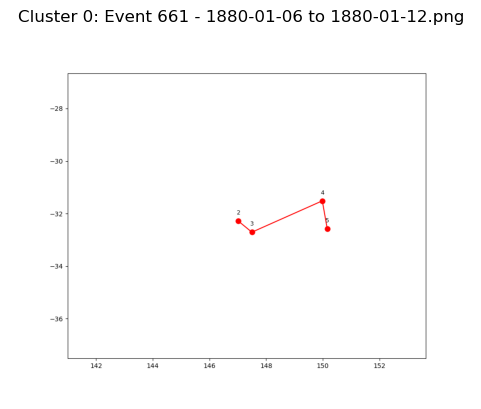

  Event 63 - 1899-01-28 to 1899-02-03.png


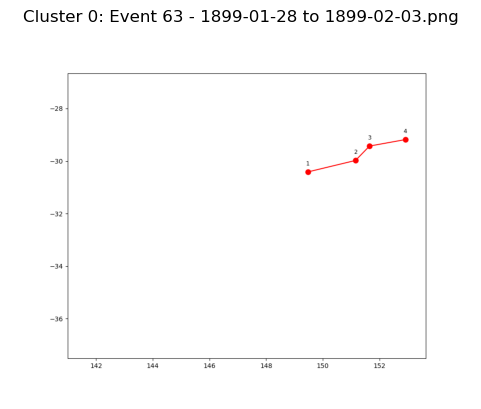

  Event 620 - 1877-01-24 to 1877-01-30.png


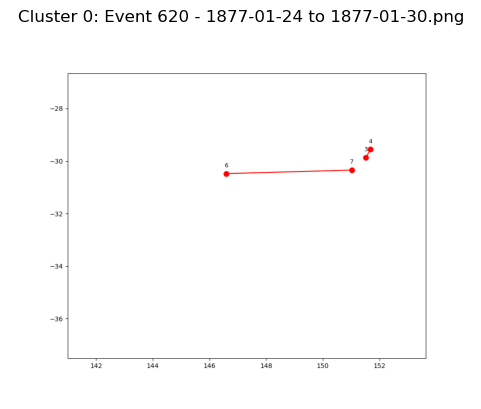

  Event 1076 - 1874-03-11 to 1874-03-17.png


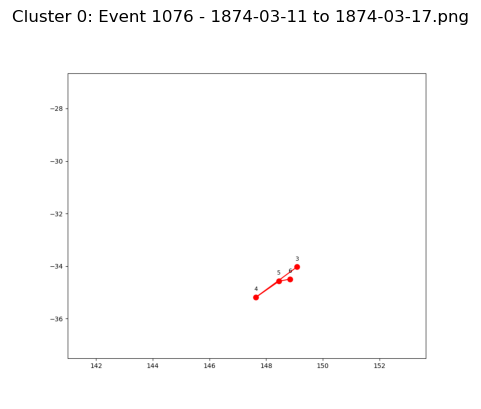

  Event 884 - 1862-04-03 to 1862-04-09.png


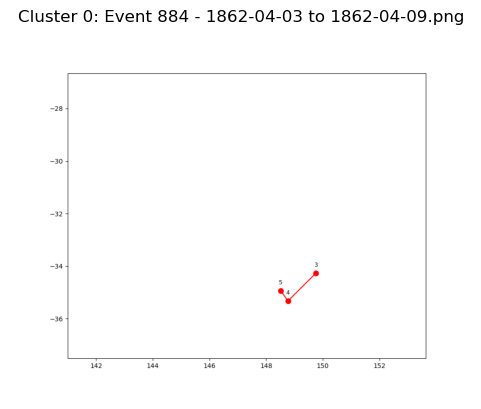

  Event 473 - 1899-02-04 to 1899-02-10.png


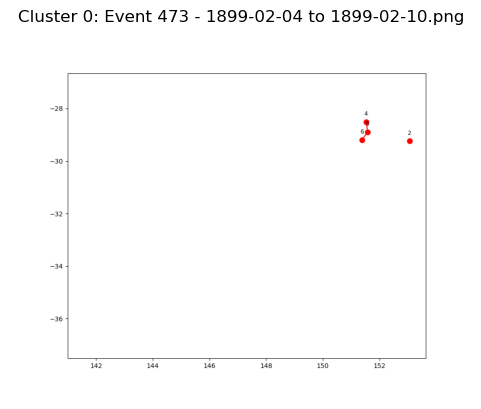

  Event 536 - 1898-05-20 to 1898-05-26.png


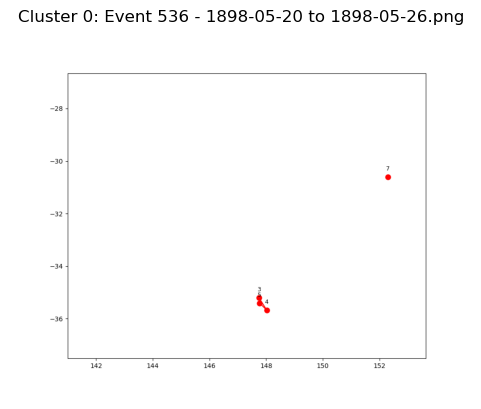

  Event 416 - 1890-02-10 to 1890-02-16.png


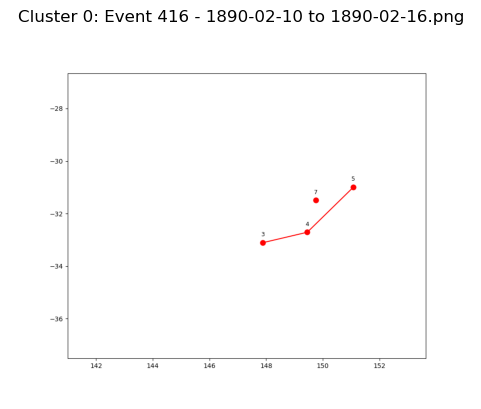

  Event 542 - 1873-06-07 to 1873-06-13.png


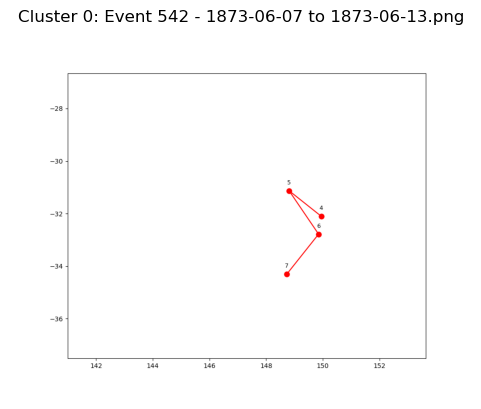

  Event 189 - 1894-04-16 to 1894-04-22.png


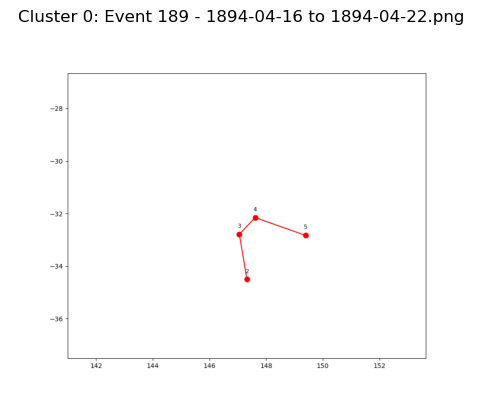

  Event 720 - 1886-11-04 to 1886-11-10.png


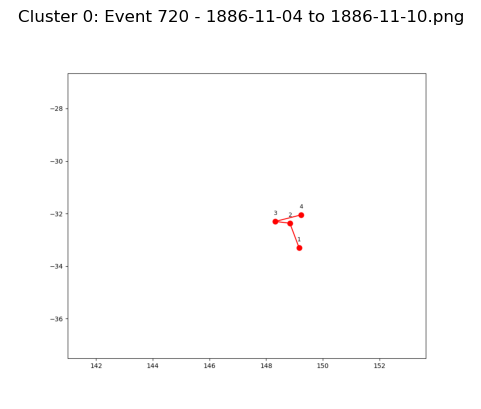

  Event 964 - 1896-09-14 to 1896-09-20.png


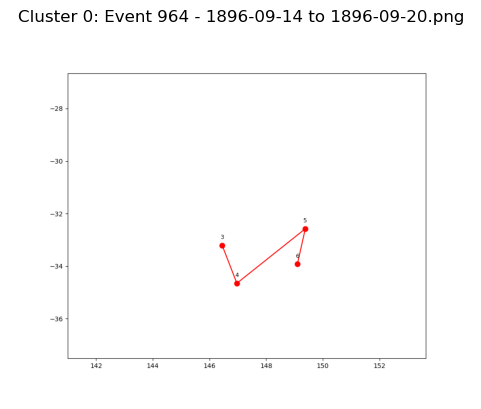

  Event 851 - 1881-10-12 to 1881-10-18.png


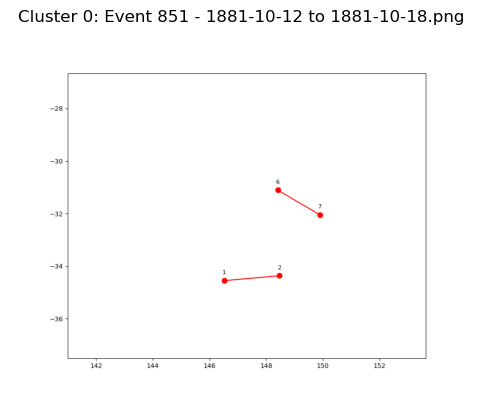

  Event 1024 - 1884-05-01 to 1884-05-07.png


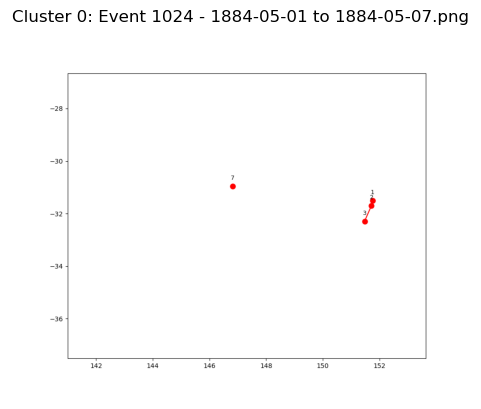

  Event 761 - 1891-11-07 to 1891-11-13.png


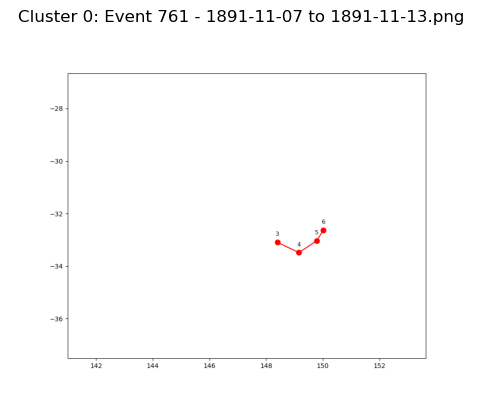

  Event 485 - 1870-09-17 to 1870-09-23.png


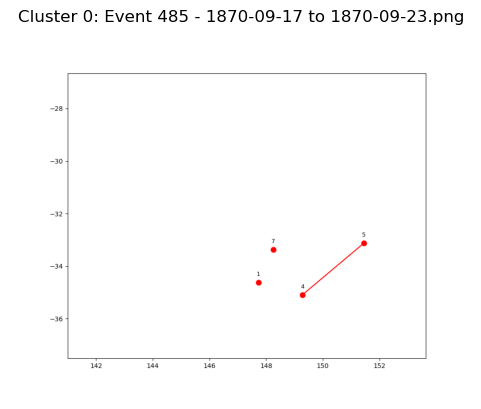

  Event 634 - 1900-04-14 to 1900-04-20.png


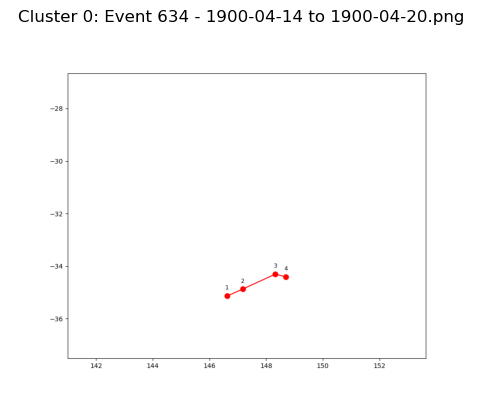

  Event 470 - 1888-01-23 to 1888-01-29.png


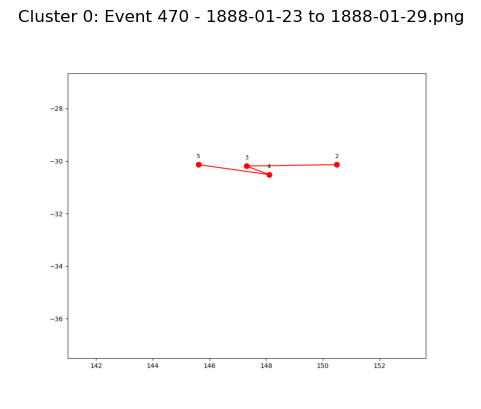

  Event 253 - 1896-05-23 to 1896-05-29.png


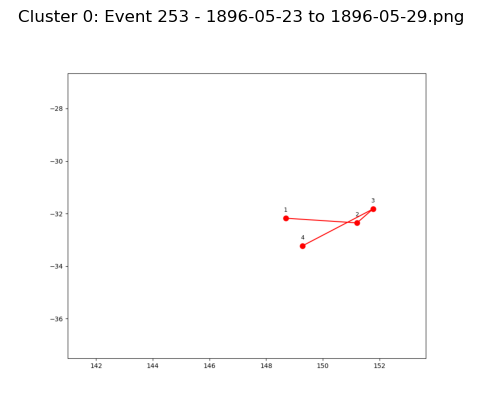

  Event 926 - 1860-03-01 to 1860-03-07.png


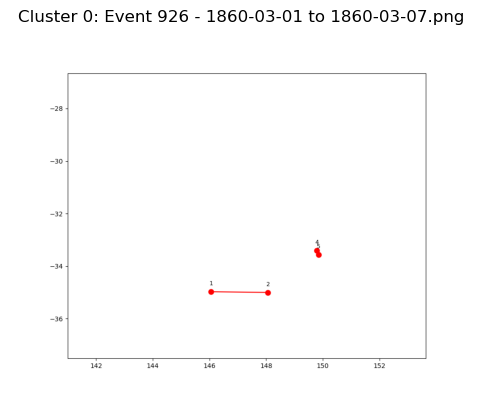

  Event 546 - 1896-05-18 to 1896-05-24.png


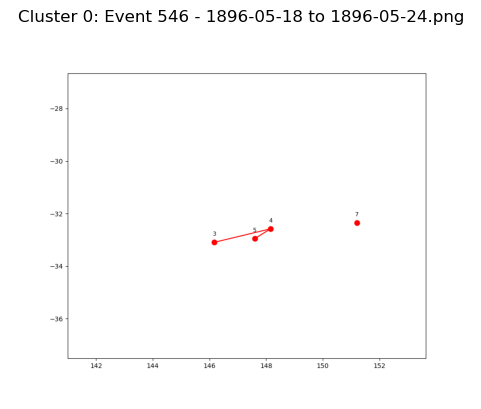

  Event 114 - 1871-06-04 to 1871-06-10.png


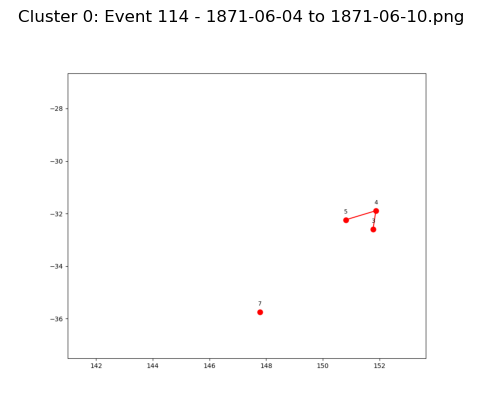

  Event 315 - 1881-05-27 to 1881-06-02.png


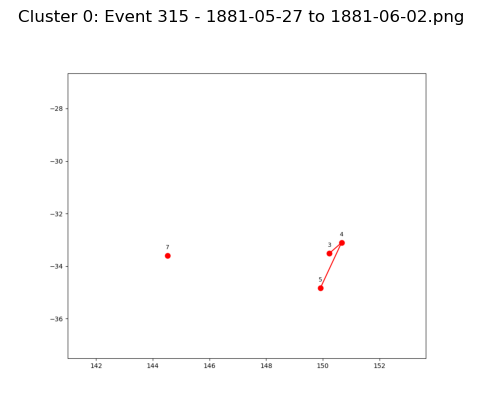

  Event 647 - 1900-09-13 to 1900-09-19.png


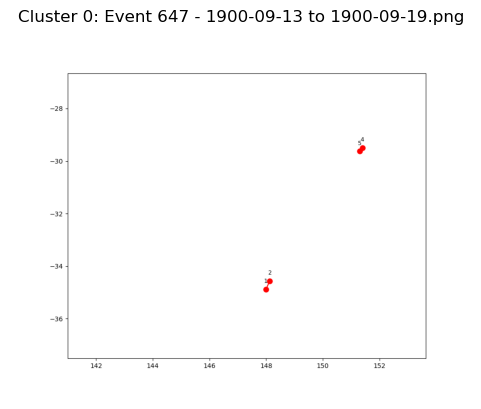

  Event 402 - 1893-03-10 to 1893-03-16.png


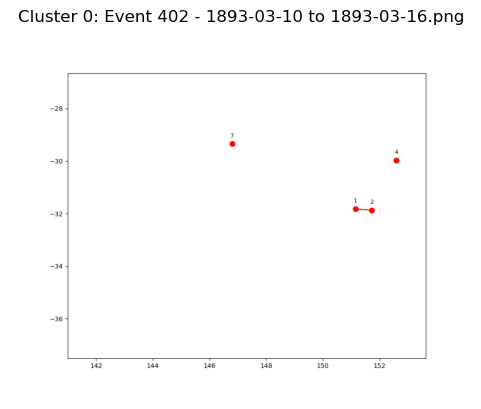

  Event 128 - 1881-09-20 to 1881-09-26.png


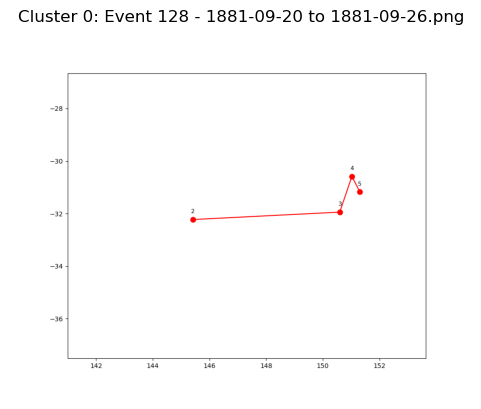

  Event 448 - 1889-12-17 to 1889-12-23.png


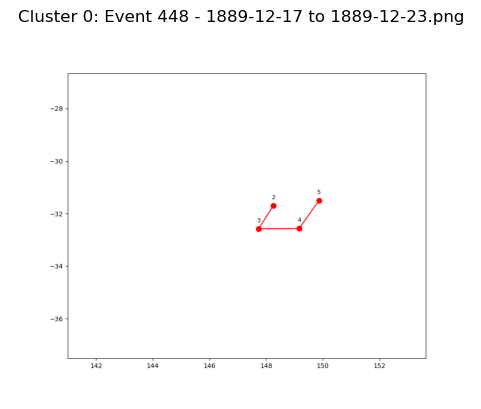

  Event 864 - 1898-09-09 to 1898-09-15.png


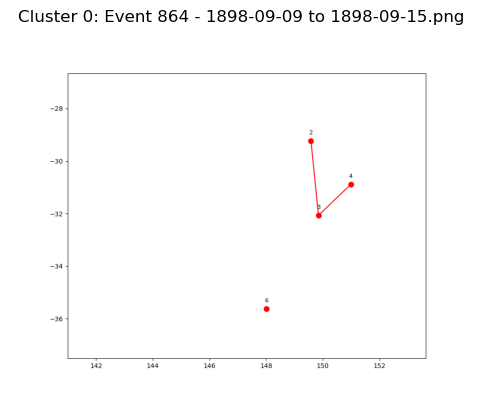

  Event 611 - 1889-09-16 to 1889-09-22.png


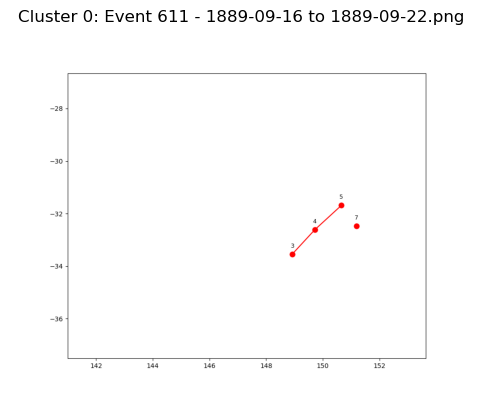

  Event 206 - 1875-06-03 to 1875-06-09.png


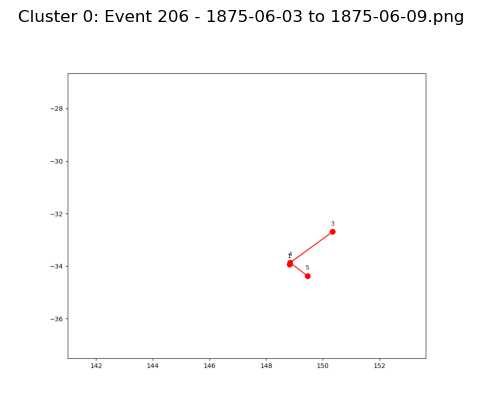

  Event 642 - 1897-06-22 to 1897-06-28.png


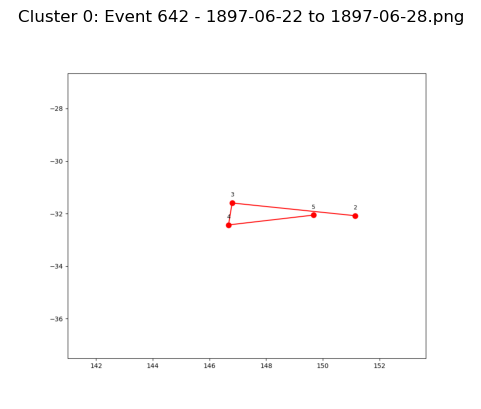

  Event 461 - 1892-05-26 to 1892-06-01.png


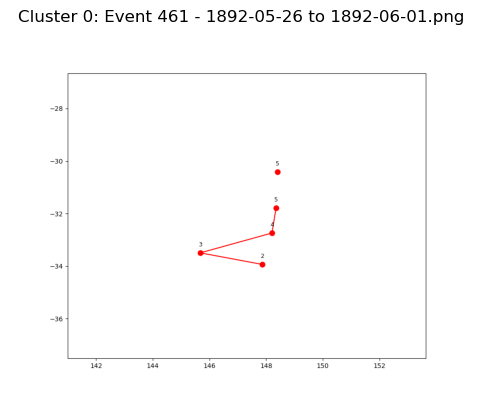

  Event 590 - 1886-04-09 to 1886-04-15.png


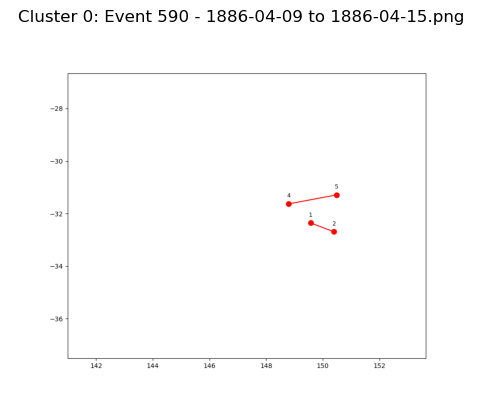

  Event 524 - 1888-06-08 to 1888-06-14.png


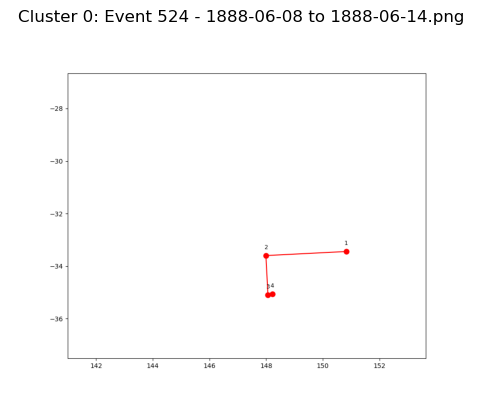

  Event 1068 - 1898-01-27 to 1898-02-02.png


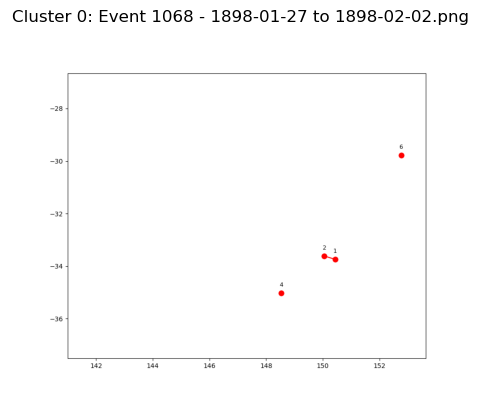

  Event 102 - 1887-02-11 to 1887-02-17.png


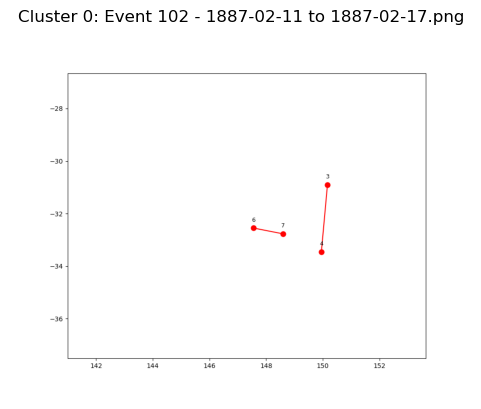

  Event 88 - 1895-11-01 to 1895-11-07.png


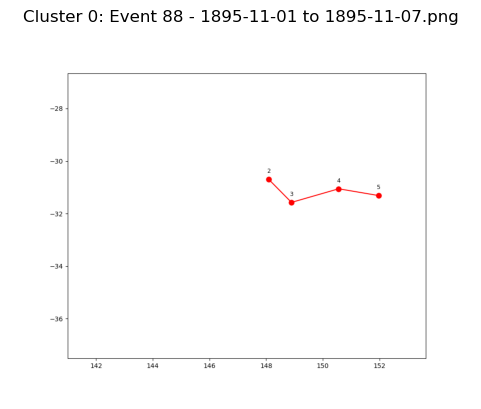

  Event 93 - 1899-07-30 to 1899-08-05.png


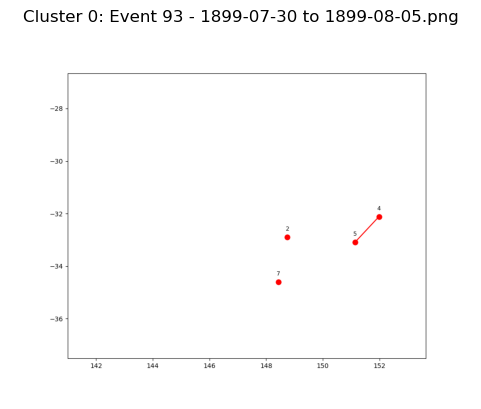

  Event 440 - 1895-04-27 to 1895-05-03.png


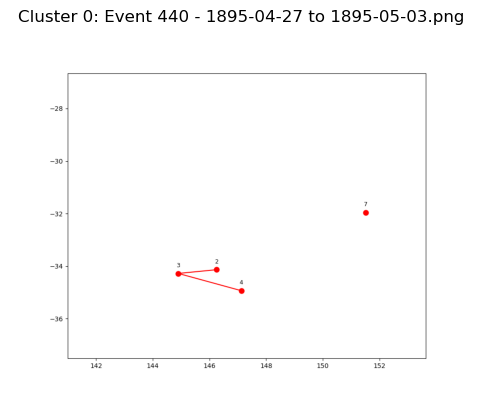

  Event 771 - 1891-09-19 to 1891-09-25.png


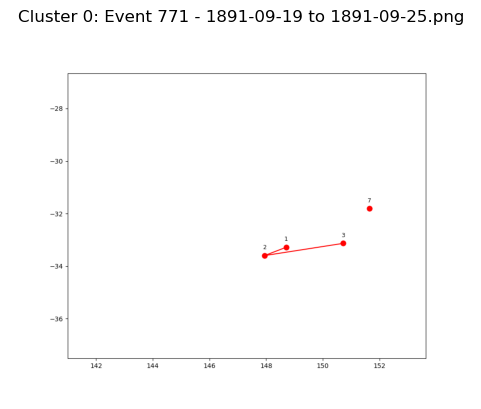

  Event 848 - 1900-08-28 to 1900-09-03.png


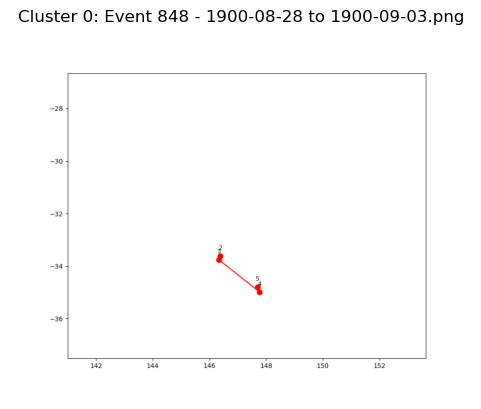

  Event 968 - 1889-11-26 to 1889-12-02.png


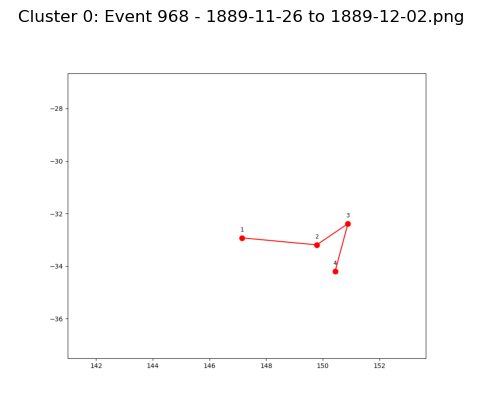

  Event 431 - 1888-01-01 to 1888-01-07.png


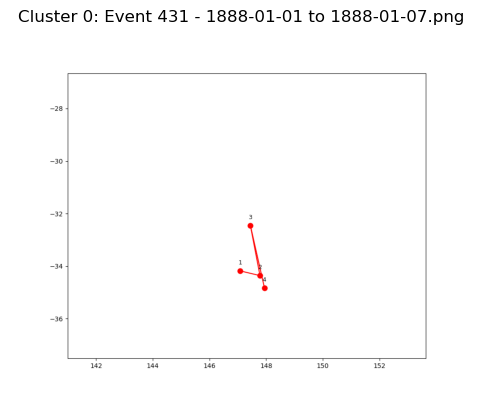

  Event 298 - 1876-09-08 to 1876-09-14.png


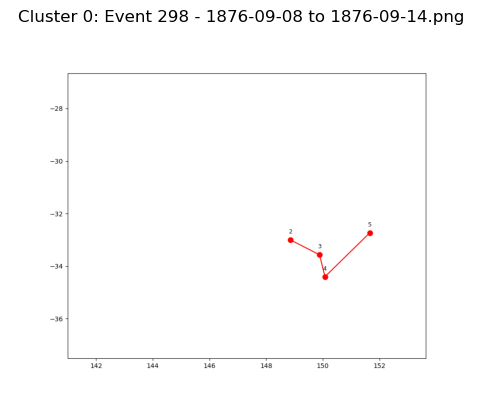

  Event 486 - 1871-01-28 to 1871-02-03.png


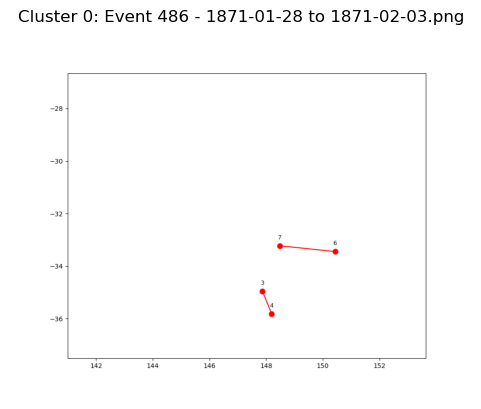

  Event 467 - 1889-11-06 to 1889-11-12.png


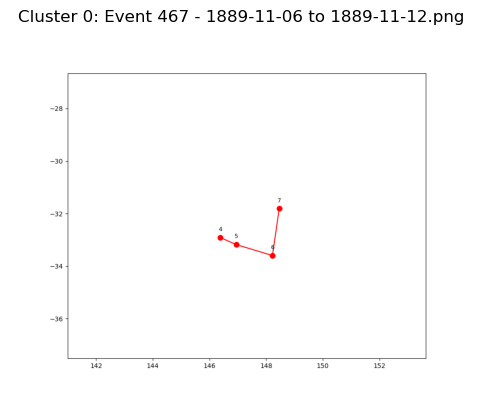

  Event 705 - 1874-05-17 to 1874-05-23.png


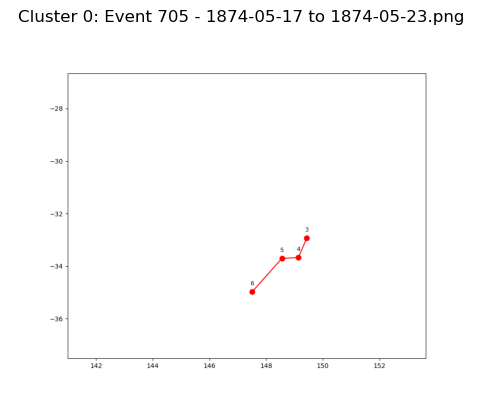

  Event 847 - 1893-03-29 to 1893-04-04.png


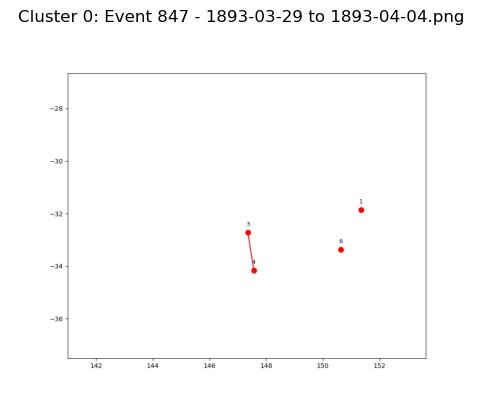

  Event 517 - 1886-08-17 to 1886-08-23.png


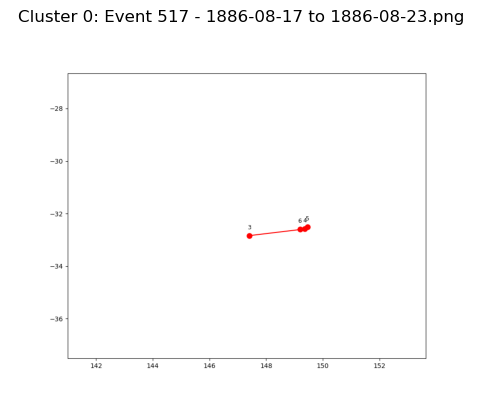

  Event 664 - 1895-09-18 to 1895-09-24.png


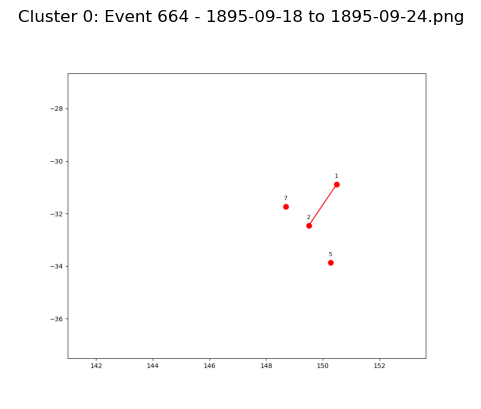

  Event 833 - 1895-03-05 to 1895-03-11.png


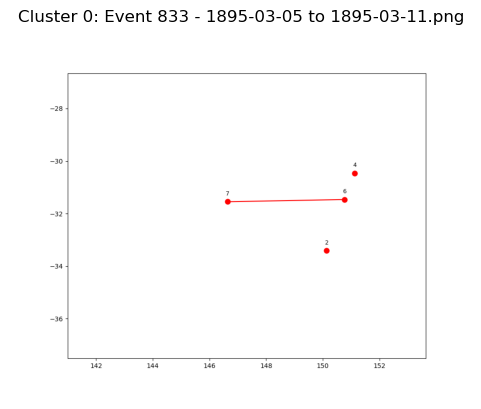

  Event 523 - 1888-05-11 to 1888-05-17.png


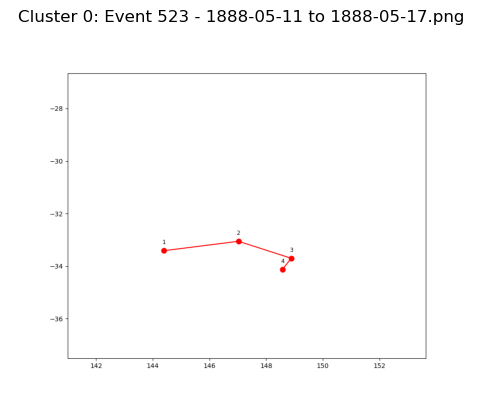

  Event 489 - 1871-06-24 to 1871-06-30.png


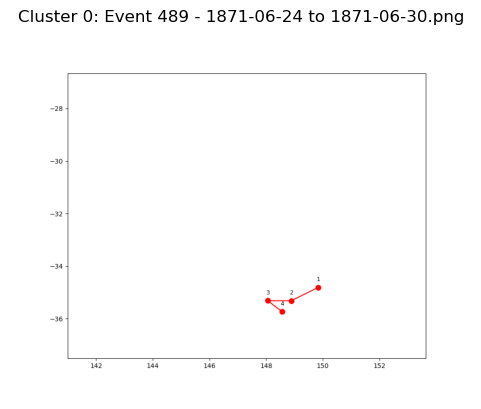

  Event 1095 - 1875-05-05 to 1875-05-11.png


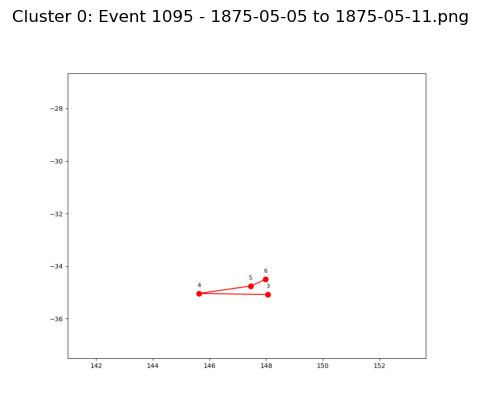

  Event 965 - 1890-03-31 to 1890-04-06.png


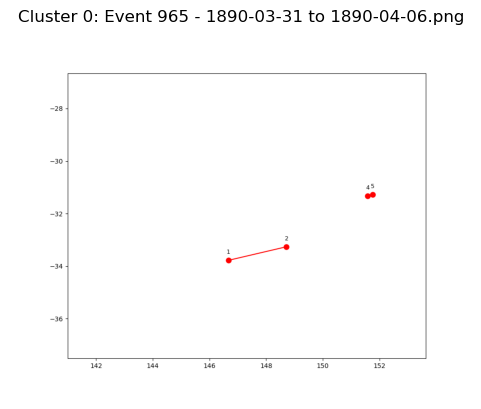

  Event 822 - 1881-11-18 to 1881-11-24.png


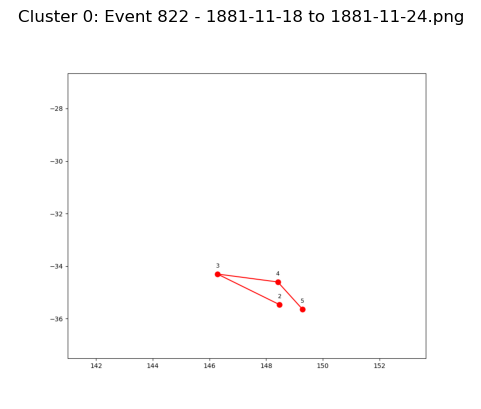

  Event 949 - 1897-11-12 to 1897-11-18.png


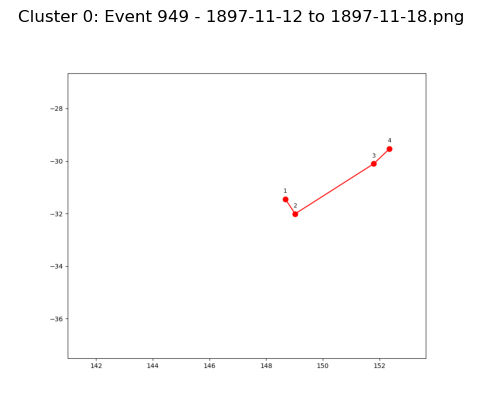

  Event 511 - 1884-09-19 to 1884-09-25.png


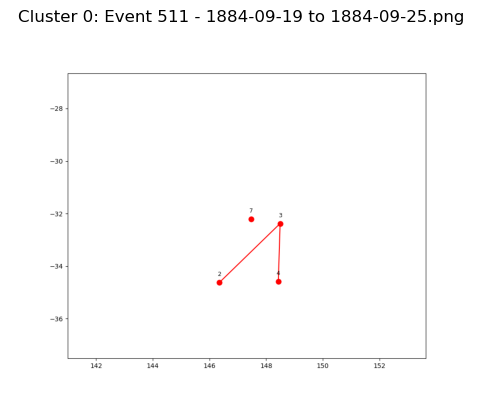

  Event 585 - 1888-02-27 to 1888-03-04.png


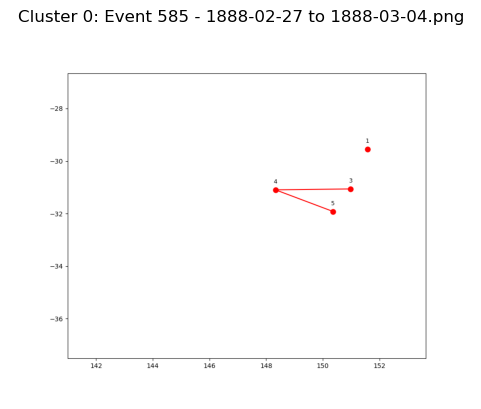

  Event 312 - 1884-04-08 to 1884-04-14.png


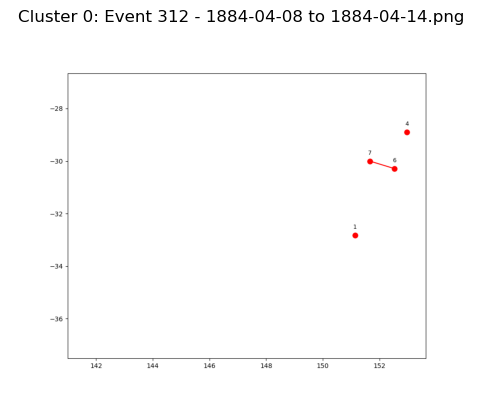

  Event 779 - 1899-02-12 to 1899-02-18.png


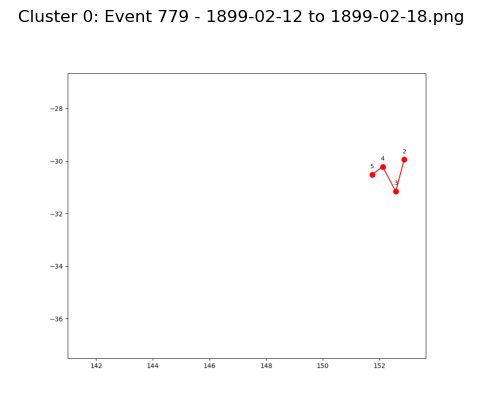

  Event 326 - 1889-02-06 to 1889-02-12.png


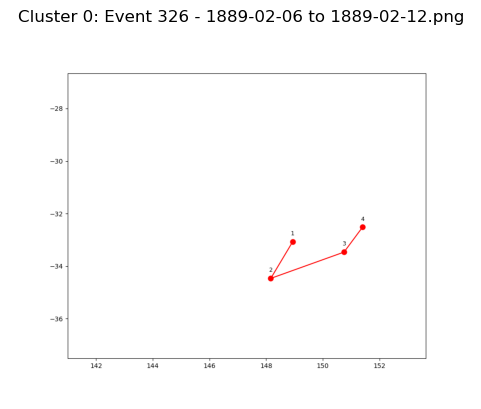

  Event 138 - 1887-12-24 to 1887-12-30.png


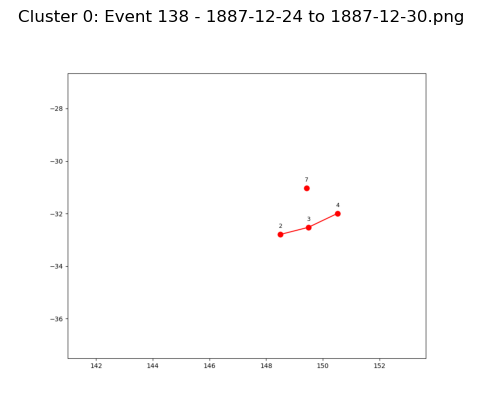

  Event 287 - 1873-11-08 to 1873-11-14.png


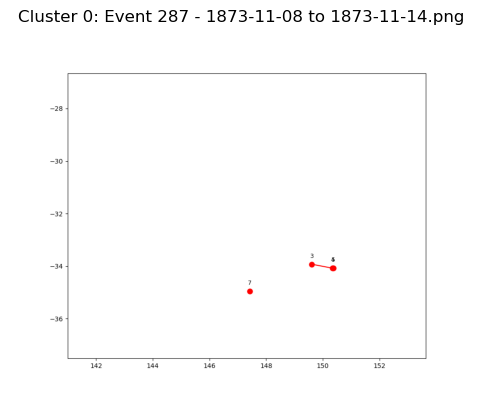

  Event 437 - 1886-10-24 to 1886-10-30.png


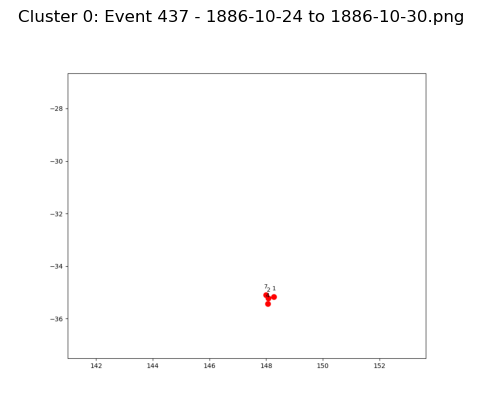

  Event 737 - 1887-12-14 to 1887-12-20.png


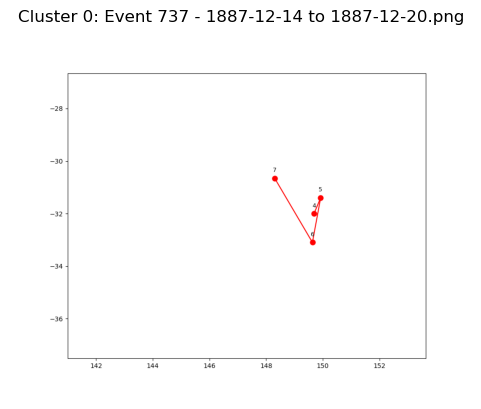

Cluster 1:
  Event 752 - 1883-02-24 to 1883-03-02.png


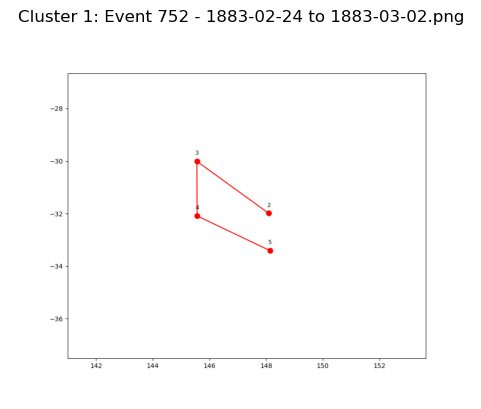

  Event 35 - 1898-02-11 to 1898-02-17.png


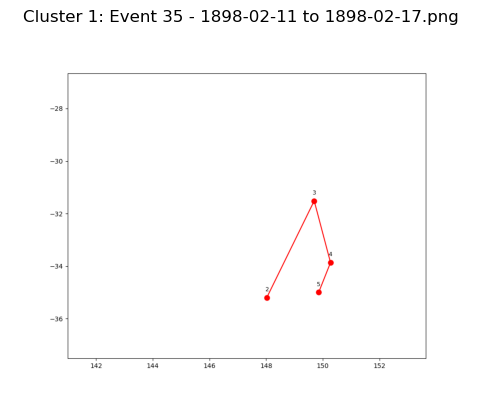

  Event 495 - 1874-01-15 to 1874-01-21.png


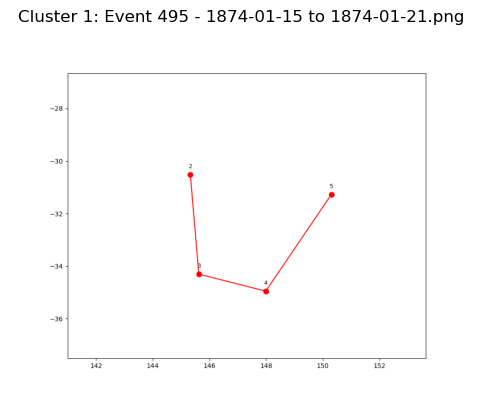

  Event 96 - 1894-01-19 to 1894-01-25.png


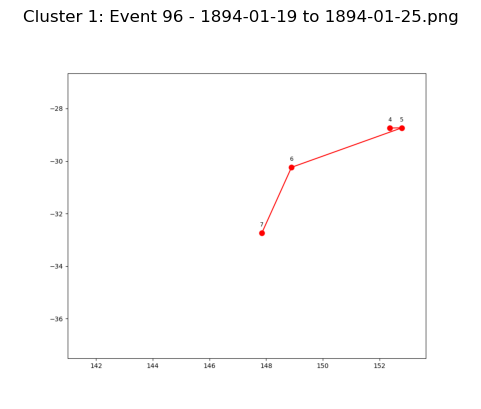

  Event 556 - 1890-05-15 to 1890-05-21.png


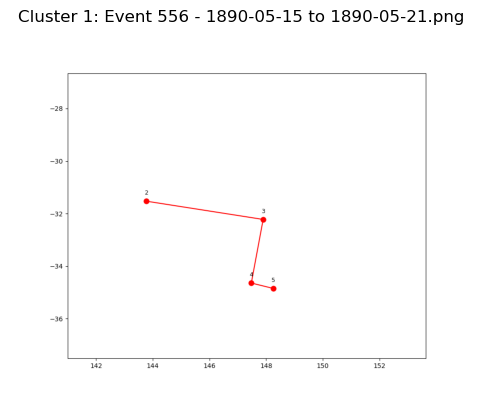

  Event 583 - 1899-02-19 to 1899-02-25.png


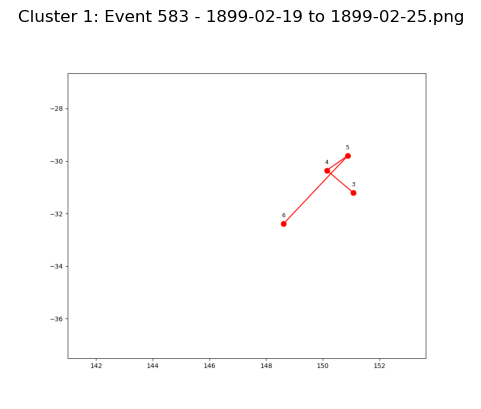

  Event 703 - 1871-01-11 to 1871-01-17.png


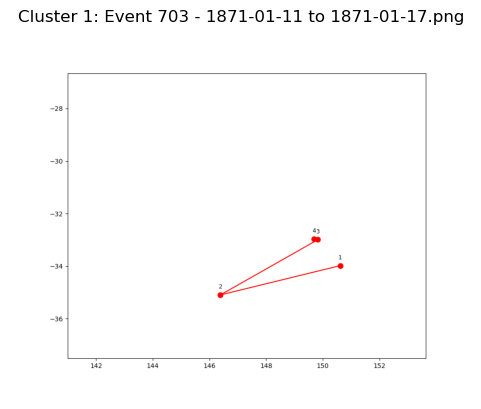

  Event 471 - 1896-03-24 to 1896-03-30.png


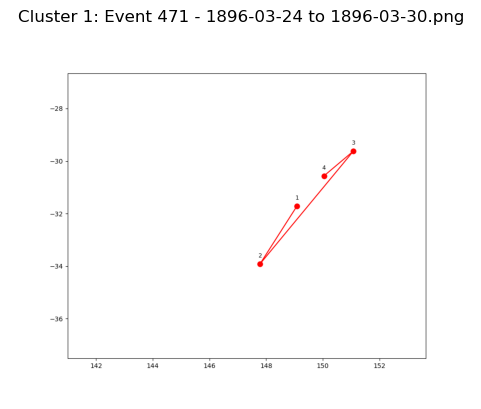

  Event 665 - 1896-04-19 to 1896-04-25.png


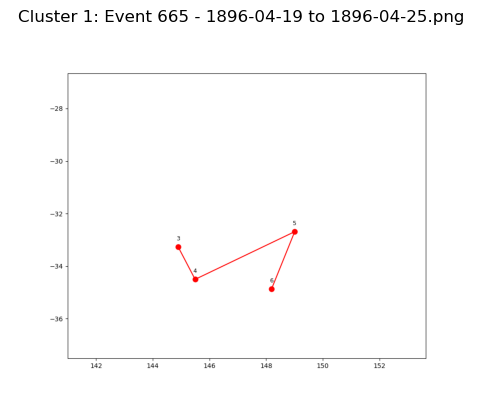

  Event 808 - 1873-05-28 to 1873-06-03.png


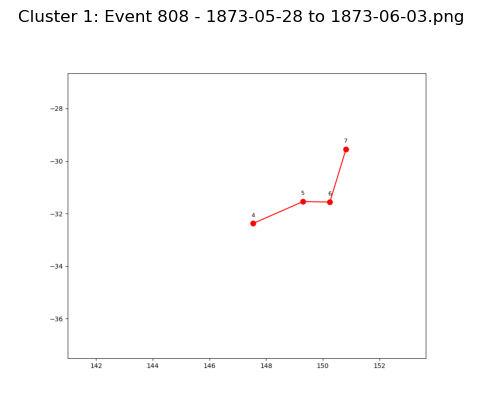

  Event 345 - 1871-04-09 to 1871-04-15.png


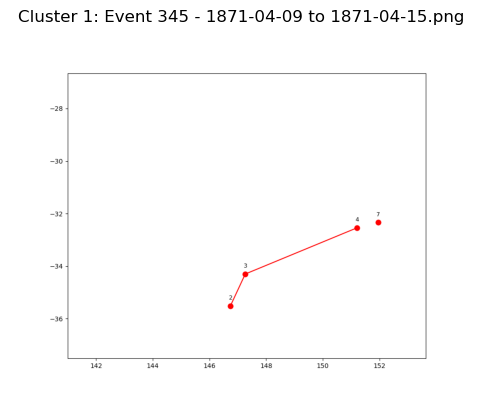

  Event 560 - 1880-03-20 to 1880-03-26.png


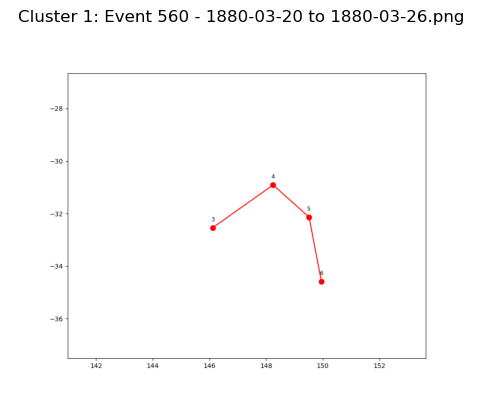

  Event 1004 - 1895-03-09 to 1895-03-15.png


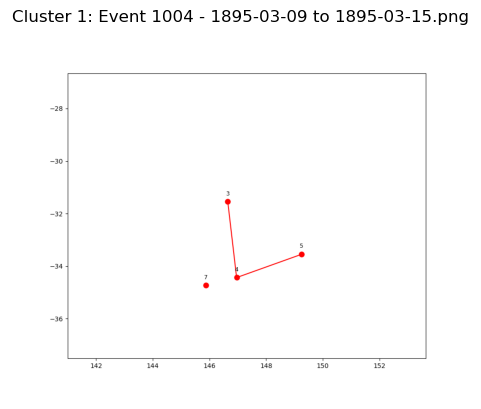

  Event 889 - 1888-05-27 to 1888-06-02.png


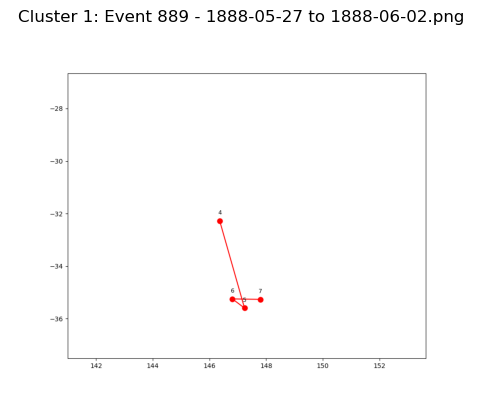

  Event 588 - 1900-01-04 to 1900-01-10.png


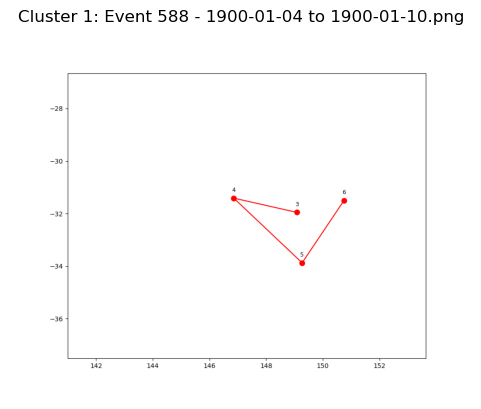

  Event 534 - 1896-04-08 to 1896-04-14.png


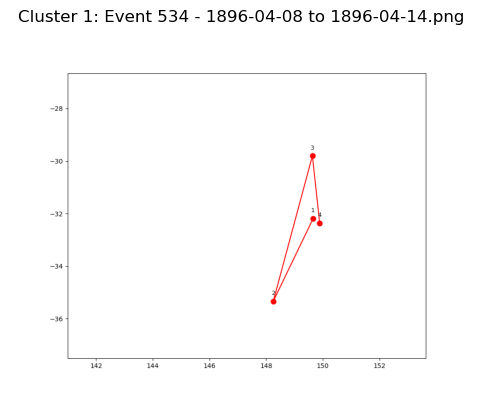

  Event 145 - 1891-08-09 to 1891-08-15.png


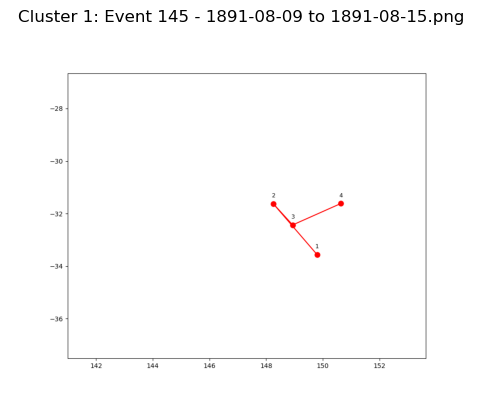

  Event 1038 - 1882-04-24 to 1882-04-30.png


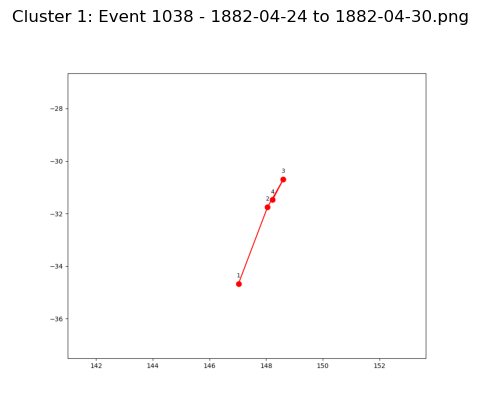

  Event 837 - 1883-11-17 to 1883-11-23.png


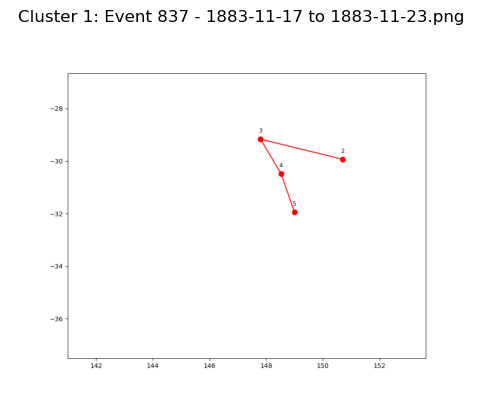

  Event 658 - 1892-08-31 to 1892-09-06.png


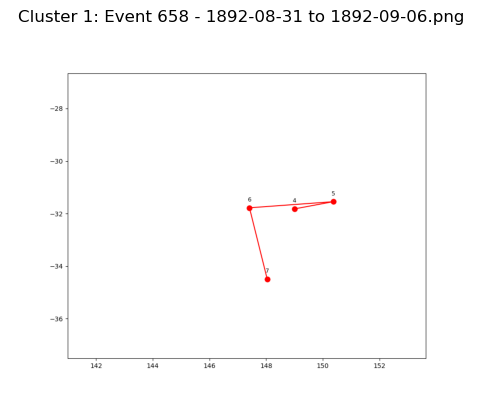

  Event 390 - 1867-09-05 to 1867-09-11.png


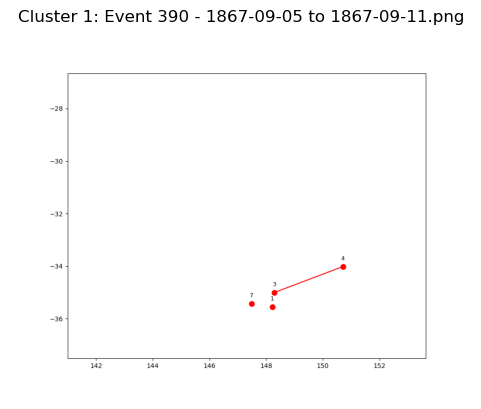

  Event 1035 - 1875-09-23 to 1875-09-29.png


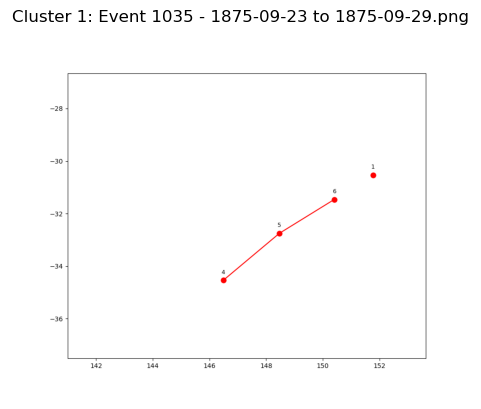

  Event 198 - 1896-02-10 to 1896-02-16.png


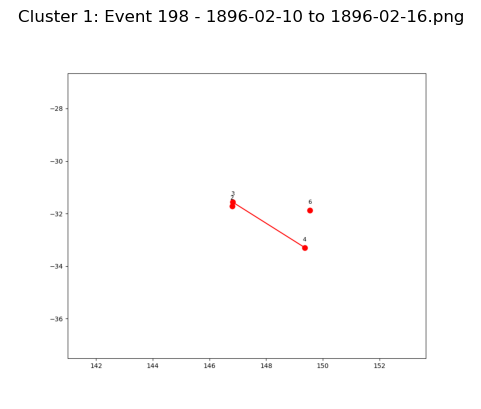

  Event 125 - 1879-08-04 to 1879-08-10.png


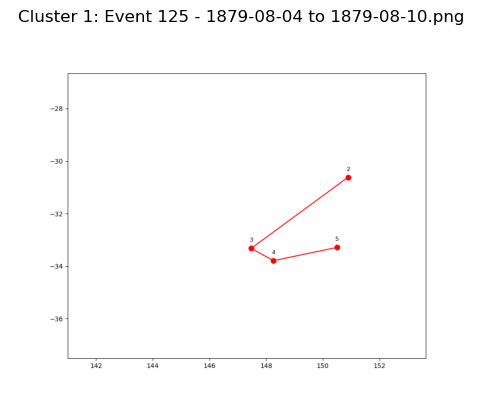

  Event 26 - 1892-10-14 to 1892-10-20.png


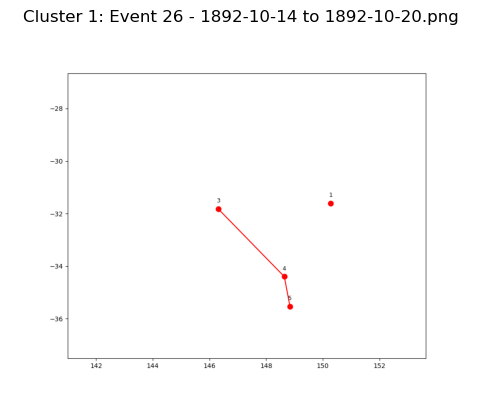

  Event 421 - 1898-12-21 to 1898-12-27.png


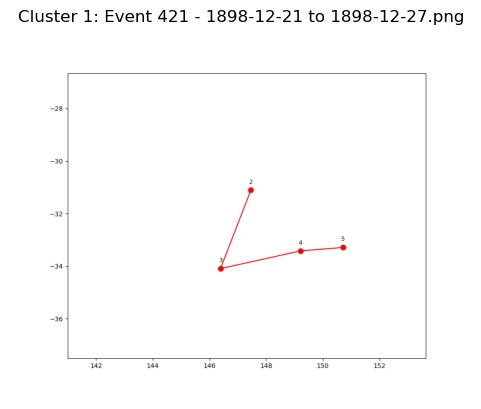

  Event 1026 - 1884-10-01 to 1884-10-07.png


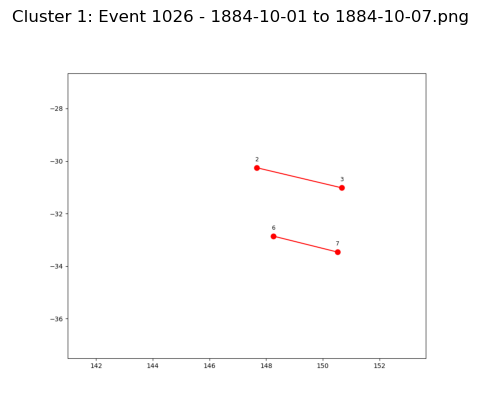

  Event 52 - 1893-06-08 to 1893-06-14.png


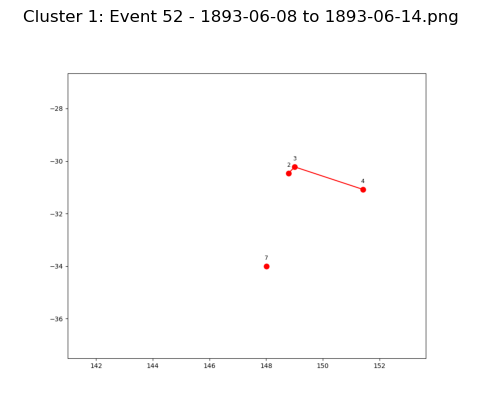

  Event 166 - 1891-06-09 to 1891-06-15.png


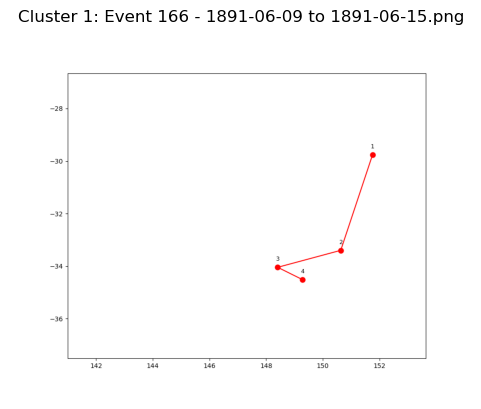

  Event 423 - 1882-02-04 to 1882-02-10.png


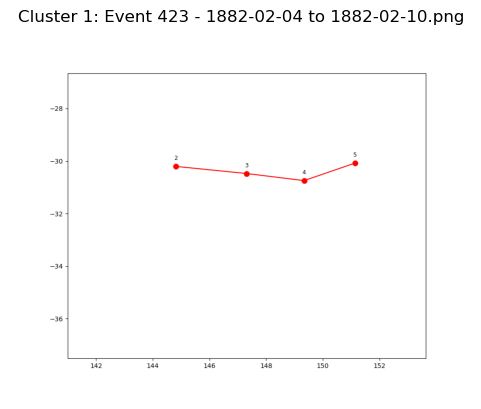

  Event 371 - 1899-06-21 to 1899-06-27.png


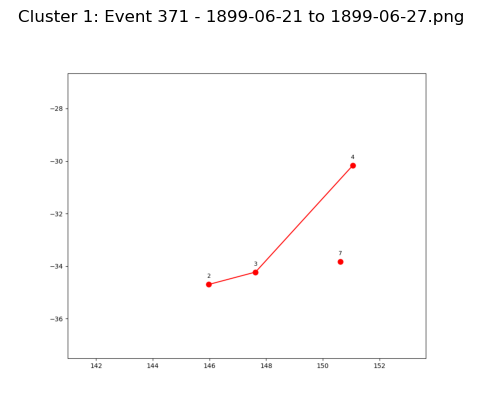

  Event 962 - 1876-09-19 to 1876-09-25.png


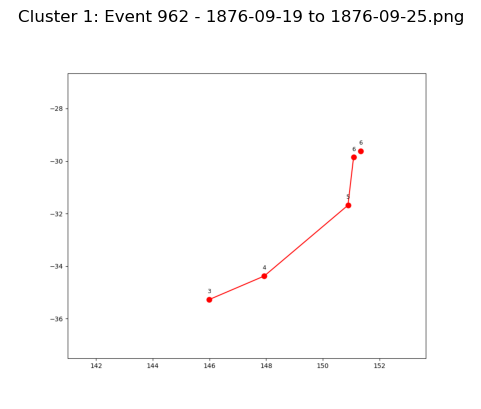

  Event 975 - 1875-02-16 to 1875-02-22.png


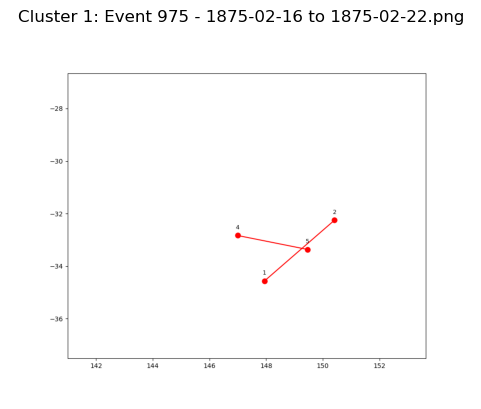

  Event 412 - 1894-05-16 to 1894-05-22.png


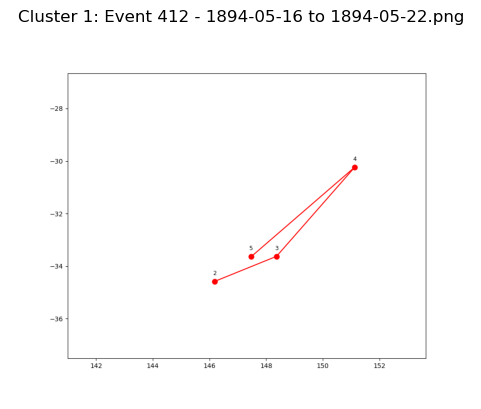

  Event 1021 - 1882-10-02 to 1882-10-08.png


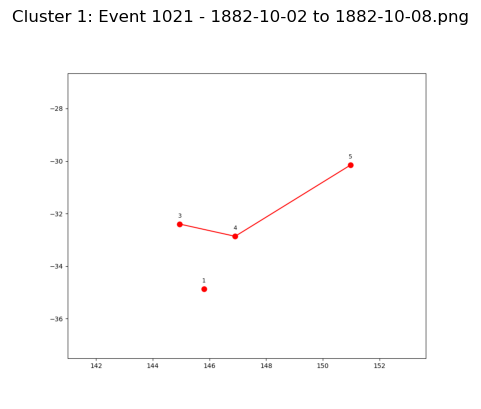

  Event 730 - 1879-11-07 to 1879-11-13.png


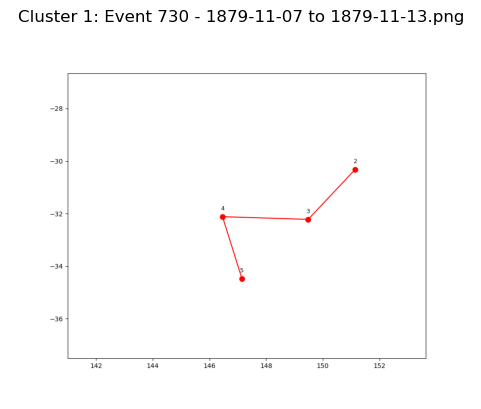

  Event 99 - 1899-12-24 to 1899-12-30.png


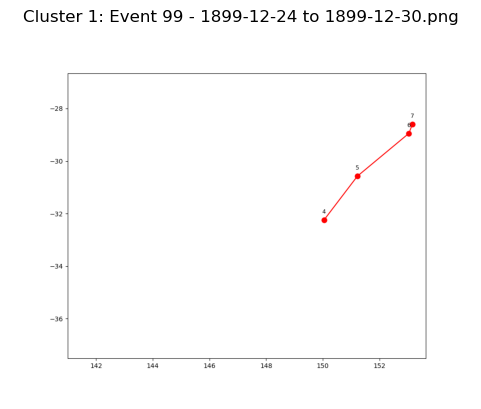

  Event 807 - 1872-05-31 to 1872-06-06.png


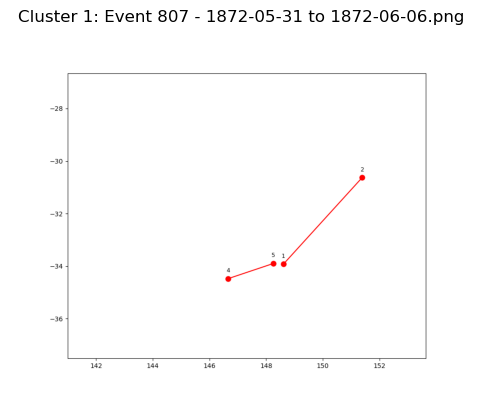

  Event 91 - 1898-08-28 to 1898-09-03.png


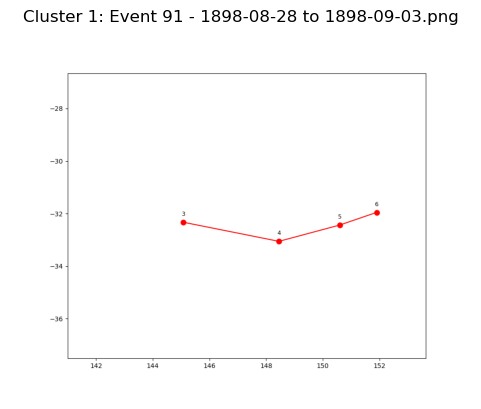

  Event 1078 - 1887-02-21 to 1887-02-27.png


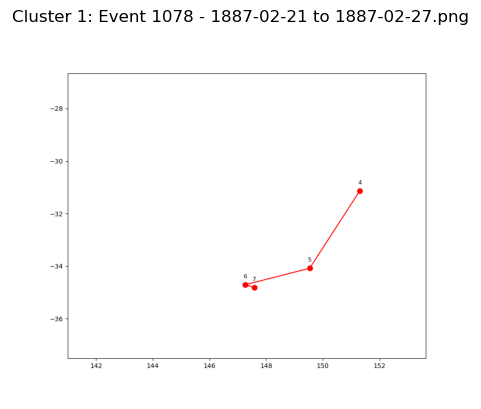

  Event 540 - 1900-02-27 to 1900-03-05.png


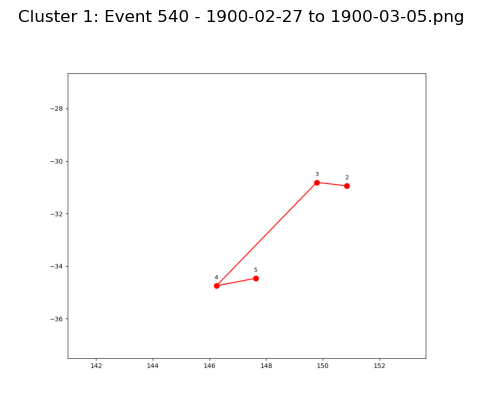

  Event 633 - 1893-06-04 to 1893-06-10.png


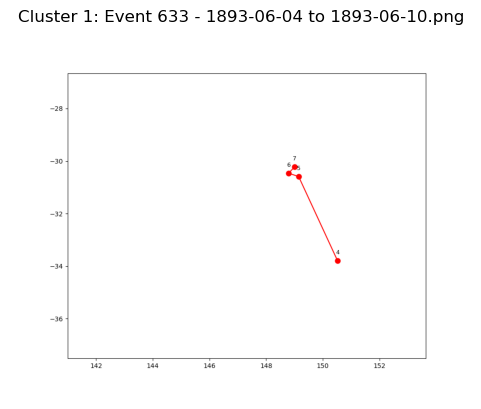

  Event 939 - 1863-04-20 to 1863-04-26.png


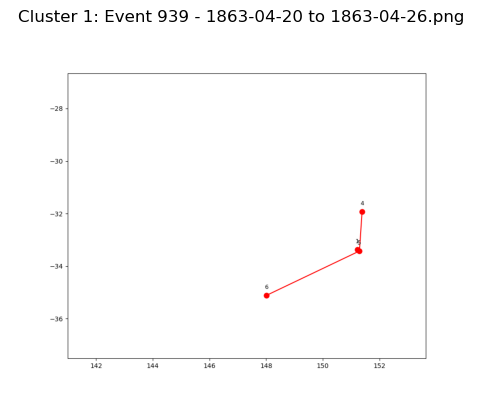

  Event 1001 - 1898-02-23 to 1898-03-01.png


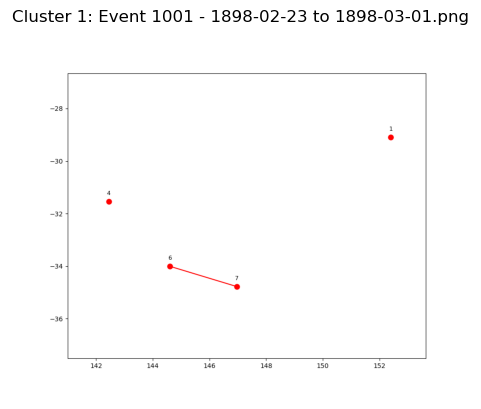

  Event 452 - 1890-06-12 to 1890-06-18.png


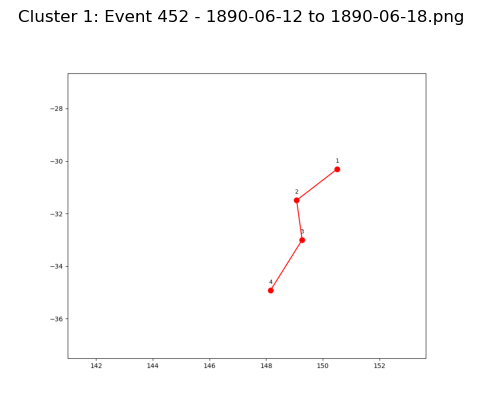

  Event 538 - 1898-11-19 to 1898-11-25.png


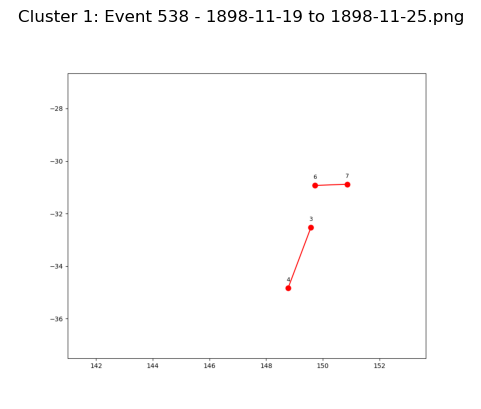

  Event 503 - 1883-03-25 to 1883-03-31.png


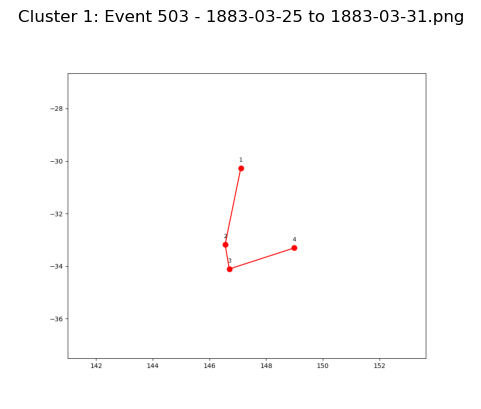

  Event 681 - 1877-10-17 to 1877-10-23.png


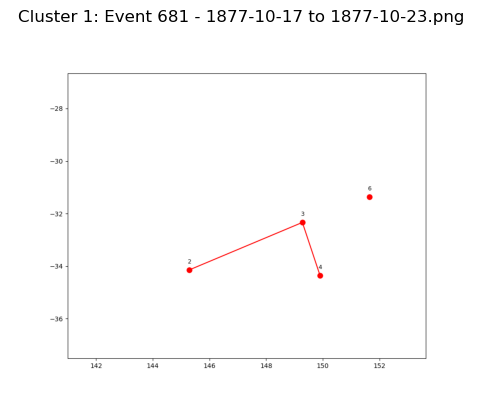

  Event 689 - 1892-10-31 to 1892-11-06.png


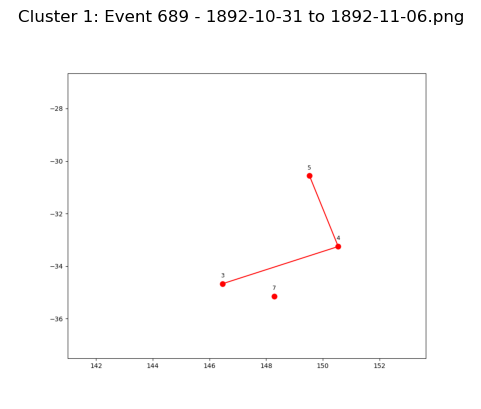

  Event 502 - 1882-10-07 to 1882-10-13.png


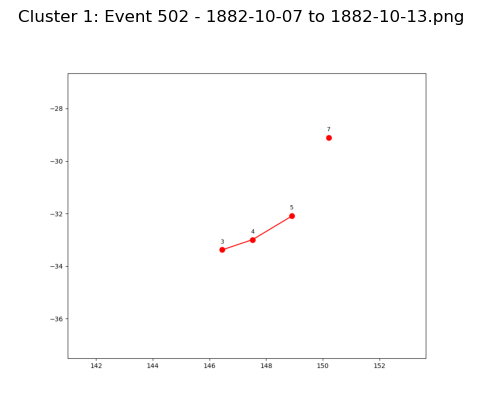

  Event 742 - 1896-01-13 to 1896-01-19.png


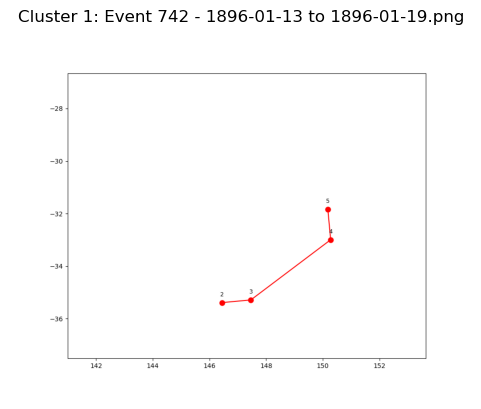

  Event 64 - 1888-10-06 to 1888-10-12.png


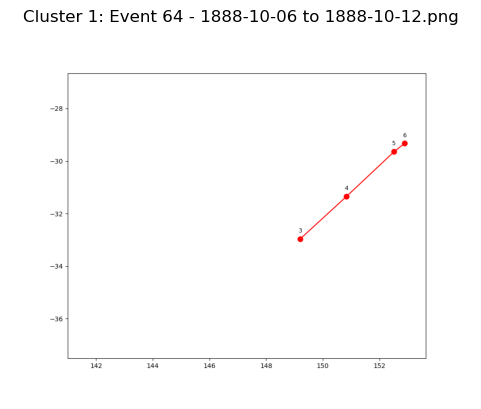

  Event 718 - 1898-06-13 to 1898-06-19.png


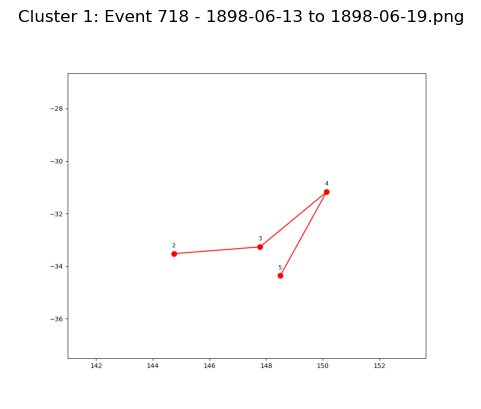

  Event 244 - 1876-11-16 to 1876-11-22.png


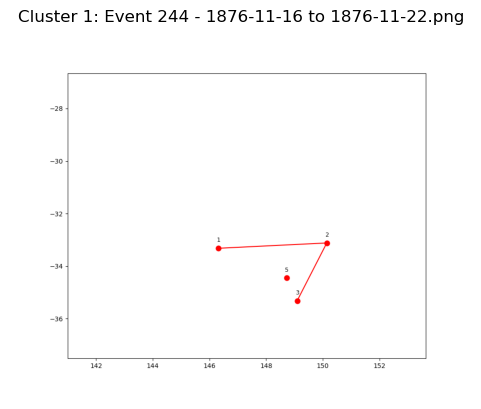

  Event 608 - 1881-04-24 to 1881-04-30.png


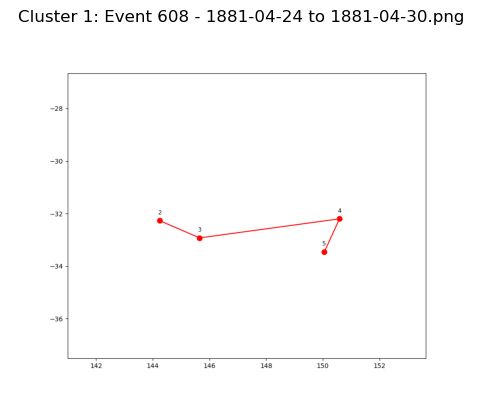

  Event 407 - 1889-11-10 to 1889-11-16.png


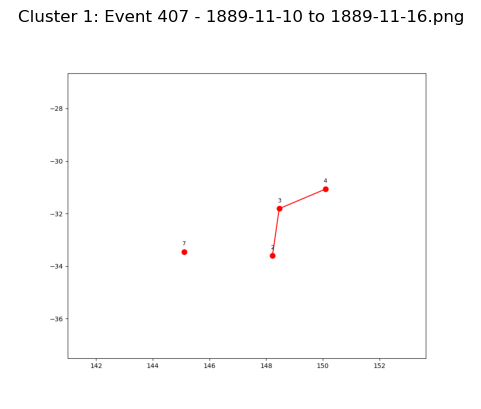

  Event 408 - 1890-05-20 to 1890-05-26.png


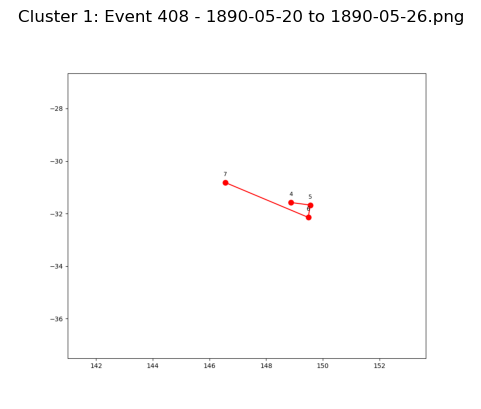

  Event 789 - 1883-04-02 to 1883-04-08.png


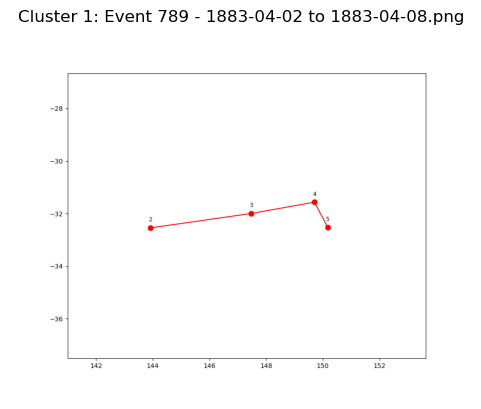

  Event 796 - 1878-08-30 to 1878-09-05.png


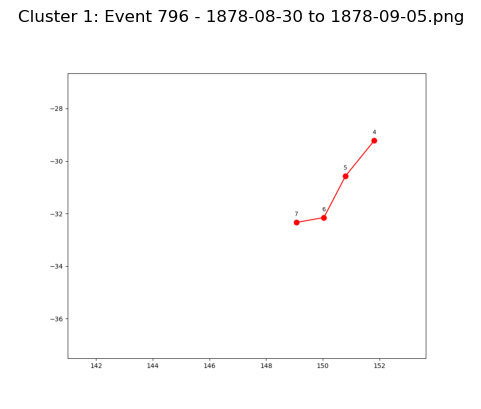

  Event 360 - 1875-05-10 to 1875-05-16.png


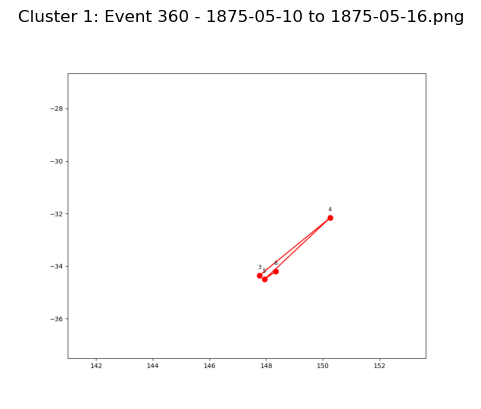

  Event 582 - 1890-05-29 to 1890-06-04.png


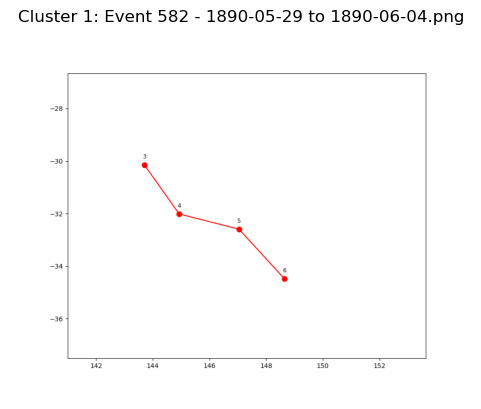

  Event 799 - 1894-03-30 to 1894-04-05.png


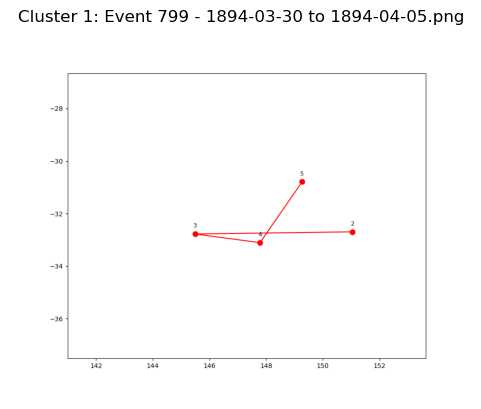

  Event 910 - 1875-01-02 to 1875-01-08.png


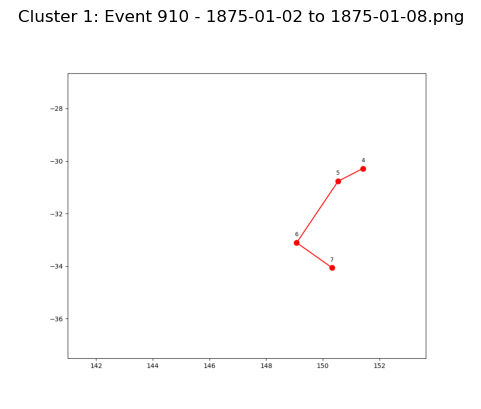

  Event 1000 - 1894-04-11 to 1894-04-17.png


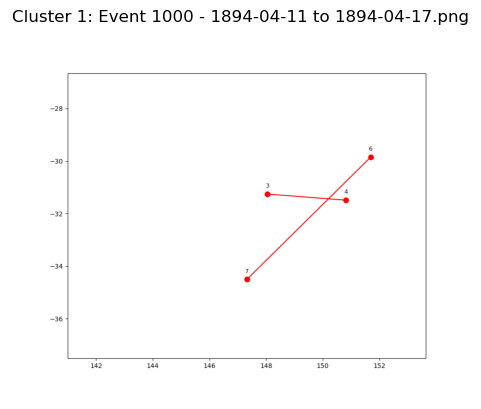

  Event 100 - 1900-06-09 to 1900-06-15.png


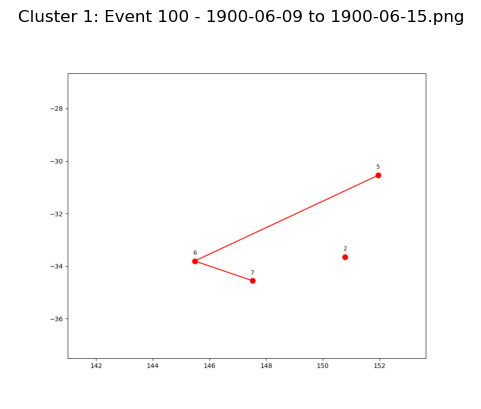

  Event 5 - 1891-01-11 to 1891-01-17.png


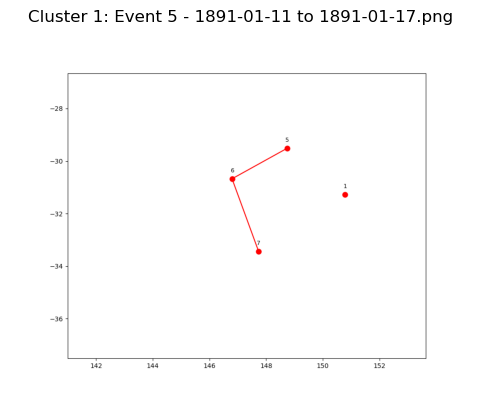

  Event 389 - 1881-08-20 to 1881-08-26.png


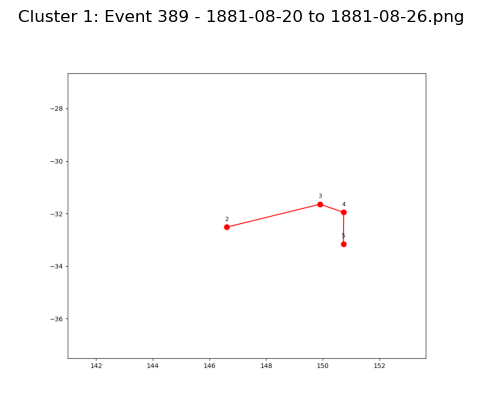

  Event 596 - 1890-07-17 to 1890-07-23.png


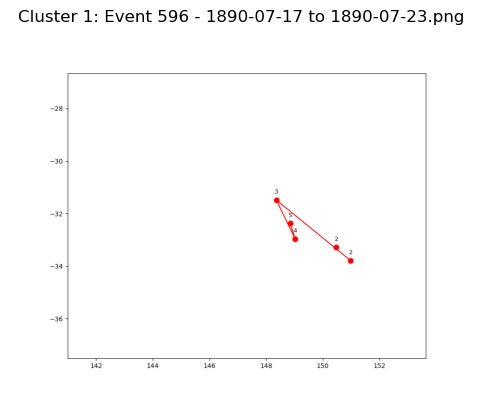

  Event 797 - 1880-11-27 to 1880-12-03.png


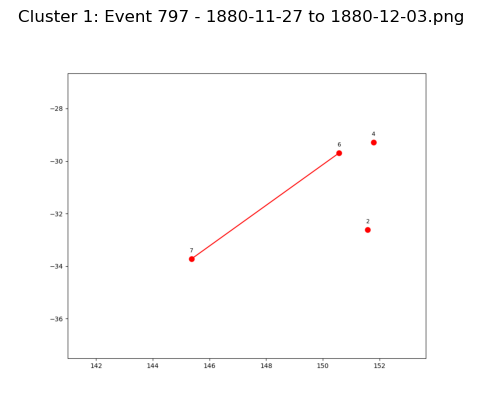

  Event 863 - 1880-02-29 to 1880-03-06.png


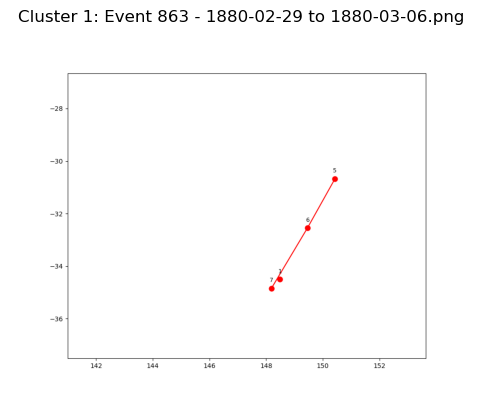

  Event 666 - 1888-03-28 to 1888-04-03.png


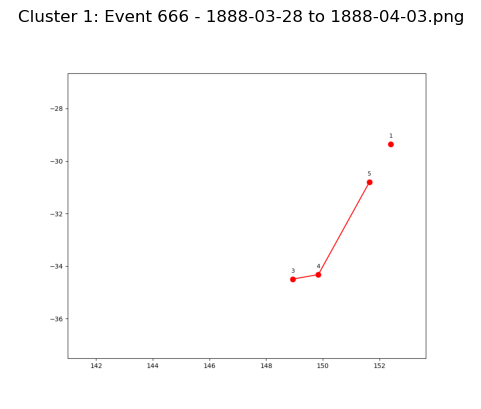

  Event 547 - 1898-01-14 to 1898-01-20.png


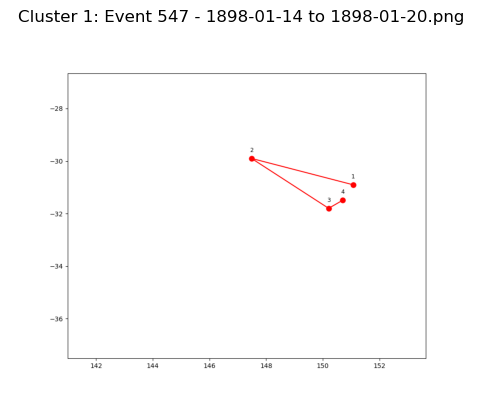

  Event 573 - 1893-11-06 to 1893-11-12.png


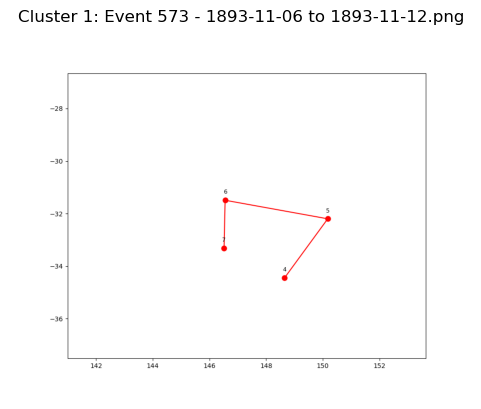

  Event 481 - 1869-03-28 to 1869-04-03.png


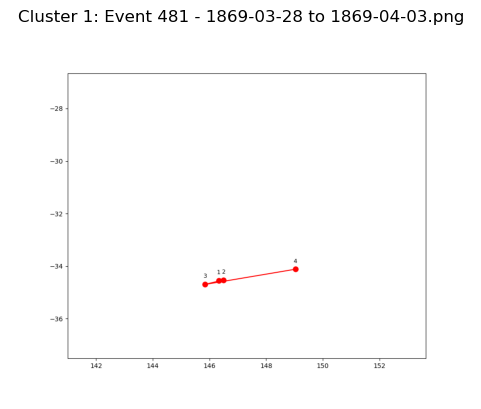

  Event 121 - 1876-04-11 to 1876-04-17.png


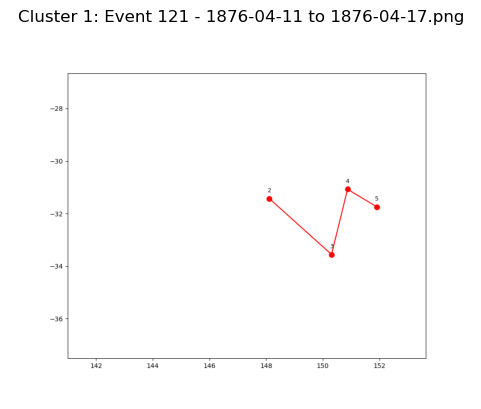

  Event 526 - 1889-06-07 to 1889-06-13.png


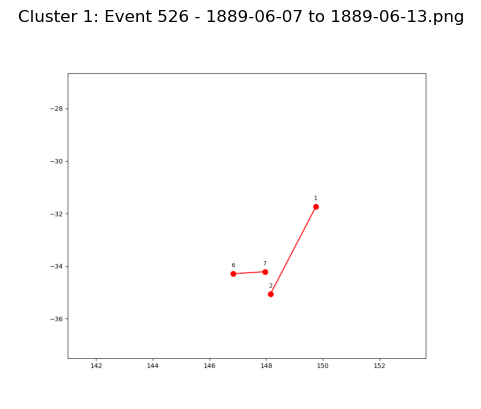

  Event 376 - 1889-04-15 to 1889-04-21.png


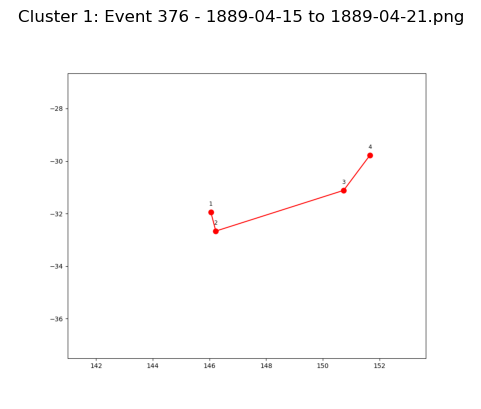

  Event 321 - 1885-07-04 to 1885-07-10.png


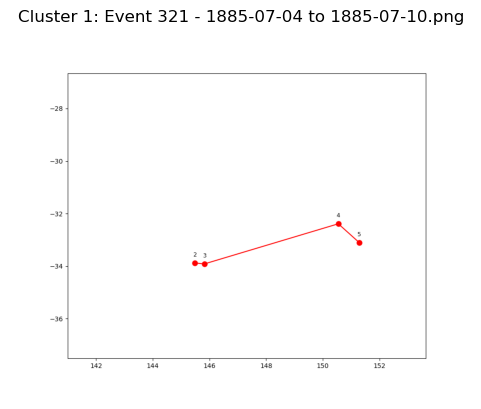

  Event 569 - 1881-03-25 to 1881-03-31.png


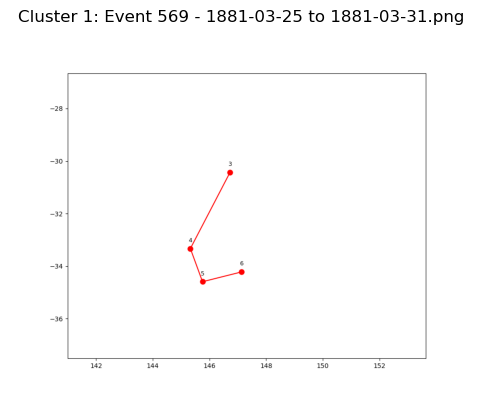

  Event 922 - 1889-06-11 to 1889-06-17.png


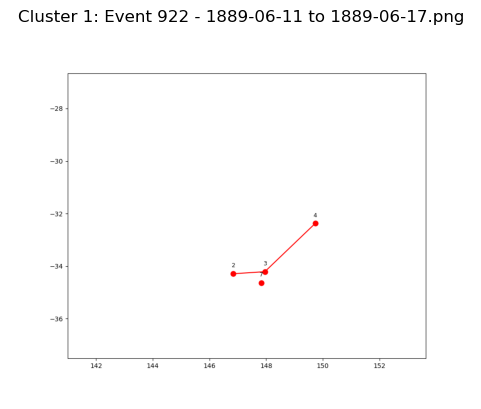

  Event 811 - 1874-03-01 to 1874-03-07.png


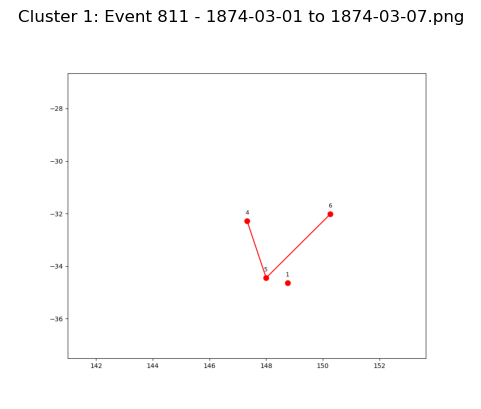

  Event 168 - 1900-05-16 to 1900-05-22.png


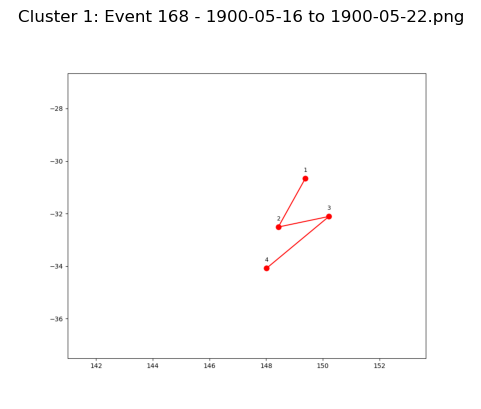

  Event 670 - 1893-02-26 to 1893-03-04.png


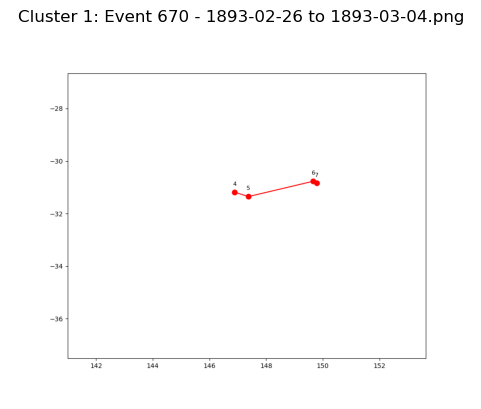

  Event 48 - 1896-02-24 to 1896-03-01.png


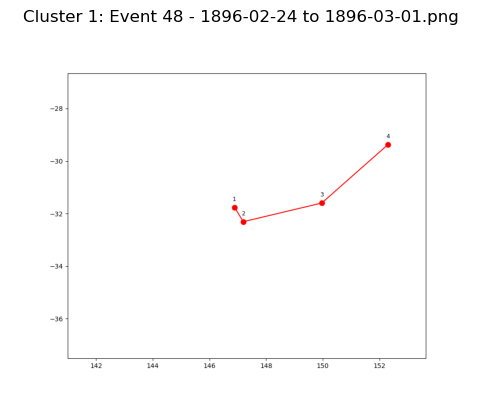

  Event 1072 - 1872-03-26 to 1872-04-01.png


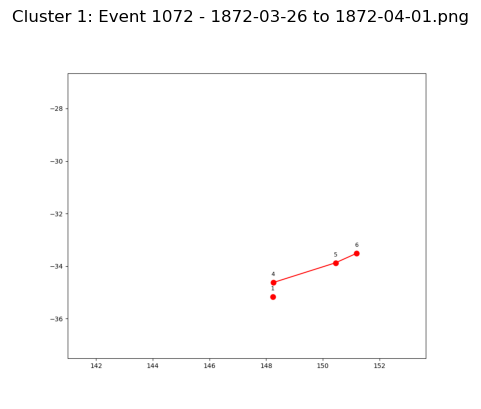

  Event 680 - 1877-09-23 to 1877-09-29.png


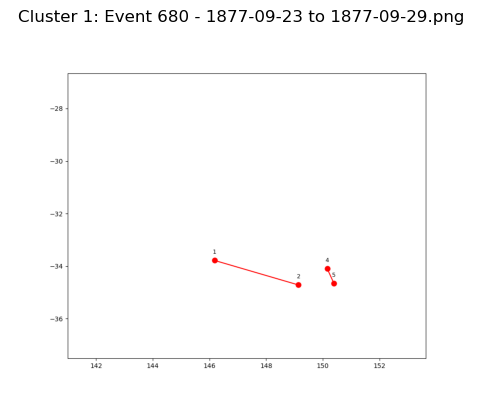

  Event 318 - 1884-10-30 to 1884-11-05.png


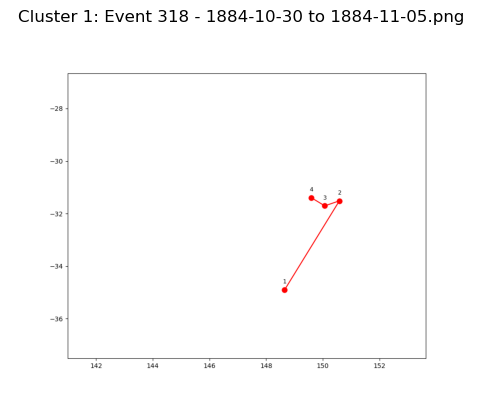

  Event 44 - 1886-11-12 to 1886-11-18.png


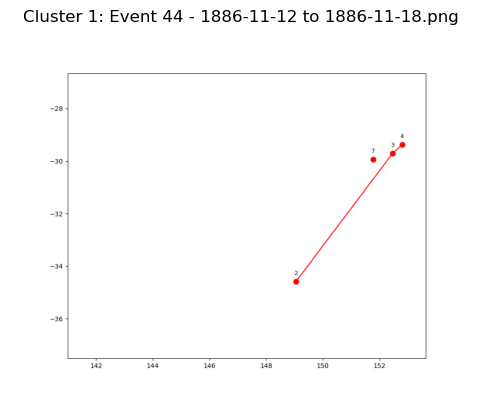

  Event 716 - 1888-03-11 to 1888-03-17.png


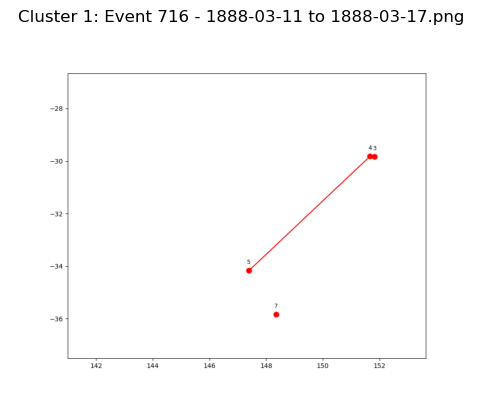

  Event 908 - 1873-02-06 to 1873-02-12.png


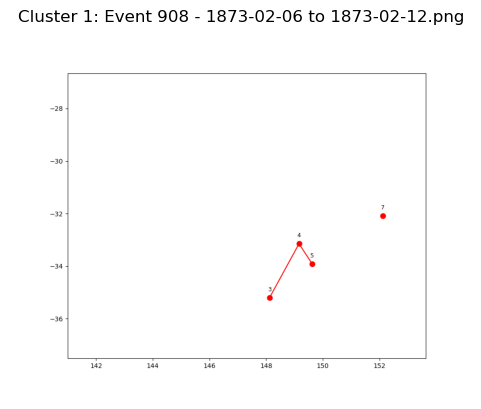

  Event 304 - 1880-02-19 to 1880-02-25.png


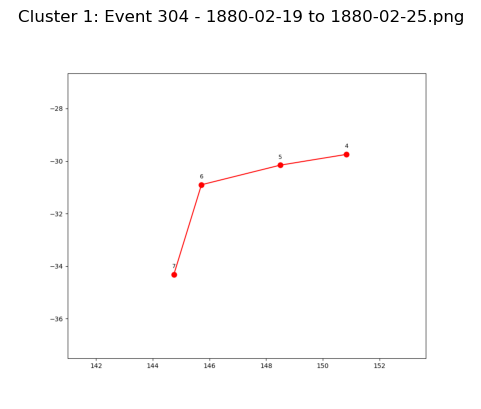

  Event 212 - 1883-05-12 to 1883-05-18.png


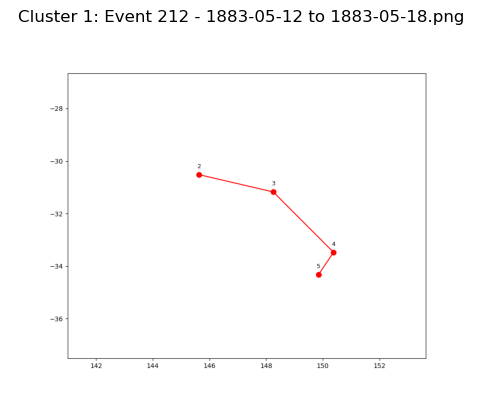

  Event 706 - 1877-01-09 to 1877-01-15.png


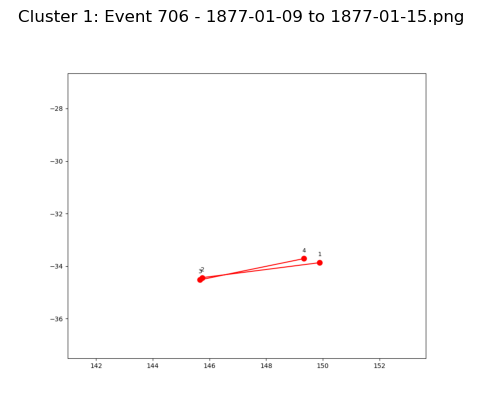

  Event 219 - 1897-01-07 to 1897-01-13.png


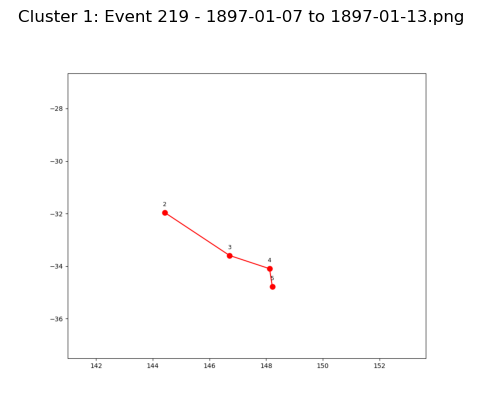

  Event 603 - 1886-07-15 to 1886-07-21.png


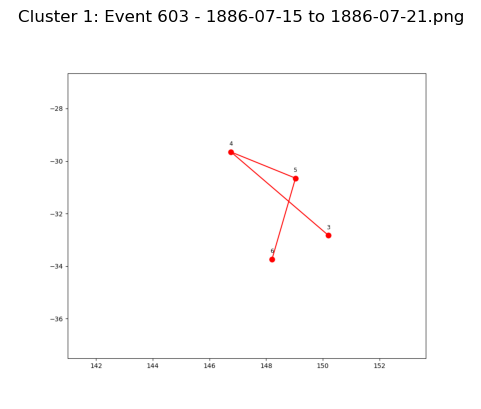

  Event 790 - 1870-12-28 to 1871-01-03.png


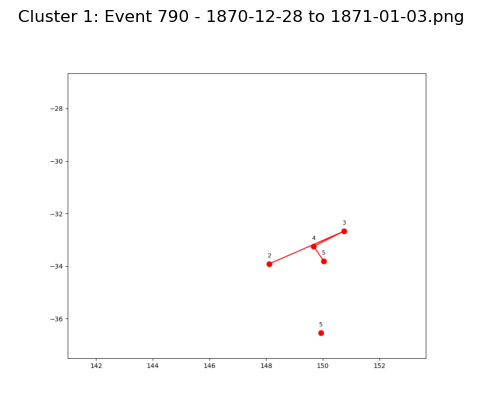

  Event 1045 - 1869-03-22 to 1869-03-28.png


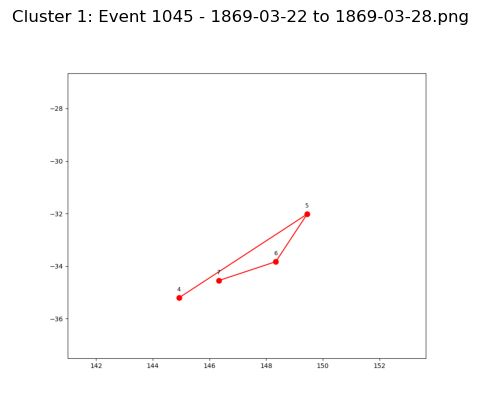

  Event 667 - 1893-11-17 to 1893-11-23.png


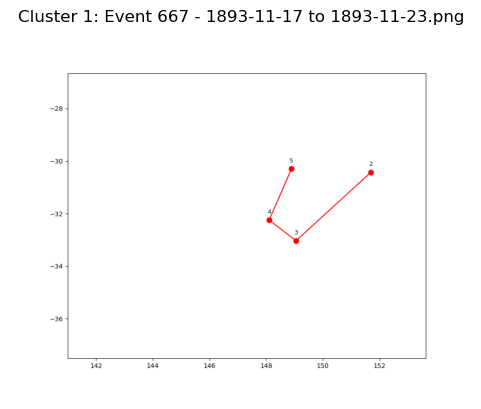

  Event 417 - 1894-03-21 to 1894-03-27.png


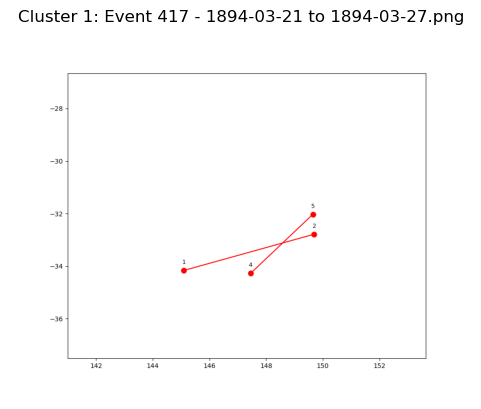

  Event 644 - 1885-03-20 to 1885-03-26.png


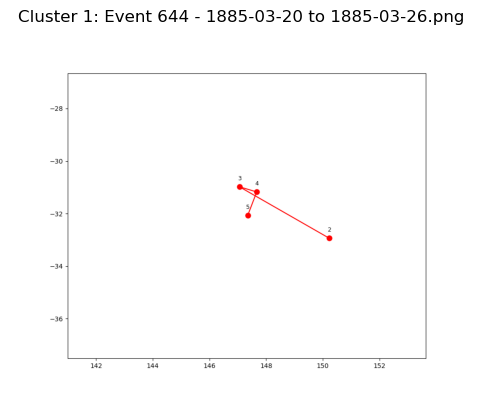

  Event 760 - 1890-04-04 to 1890-04-10.png


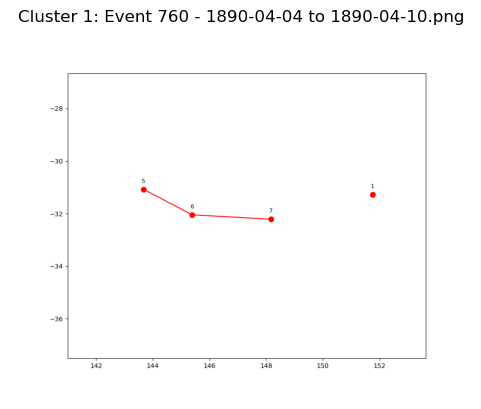

  Event 494 - 1873-11-03 to 1873-11-09.png


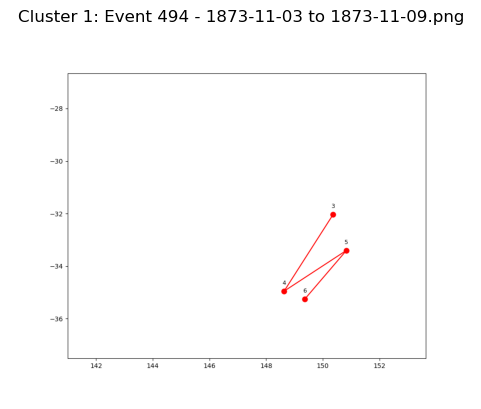

  Event 577 - 1886-10-08 to 1886-10-14.png


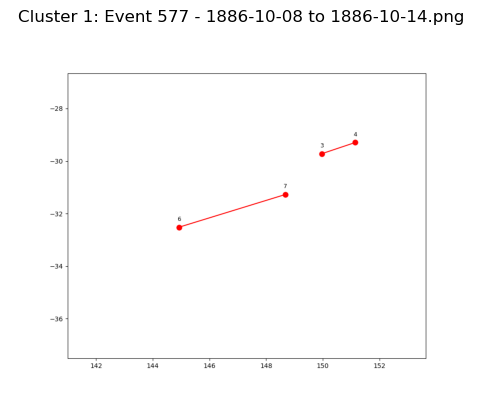

  Event 1054 - 1876-08-03 to 1876-08-09.png


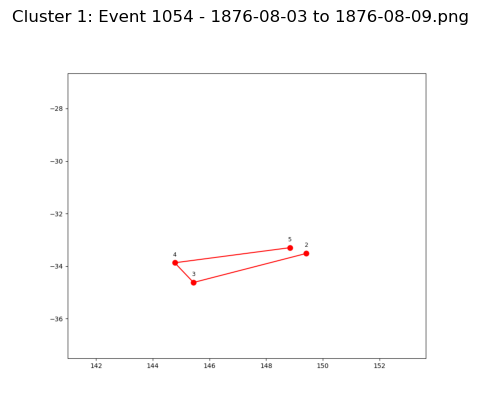

  Event 20 - 1897-02-26 to 1897-03-04.png


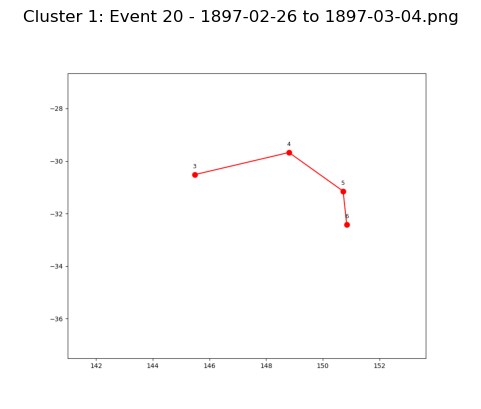

  Event 314 - 1899-04-07 to 1899-04-13.png


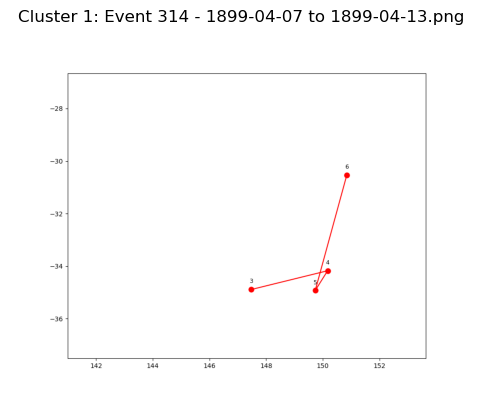

  Event 800 - 1886-02-22 to 1886-02-28.png


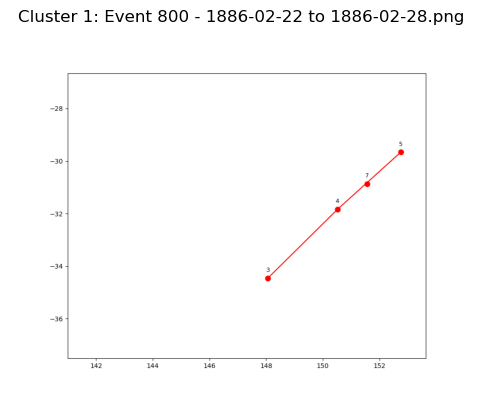

  Event 948 - 1881-01-26 to 1881-02-01.png


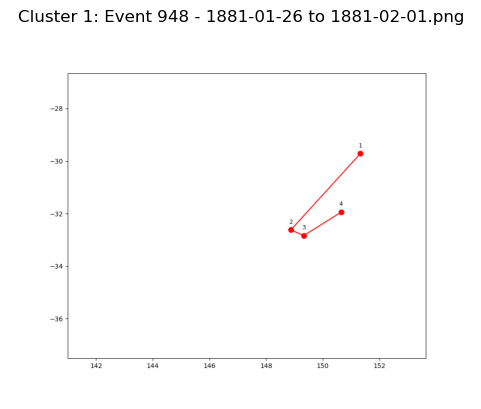

  Event 154 - 1877-05-09 to 1877-05-15.png


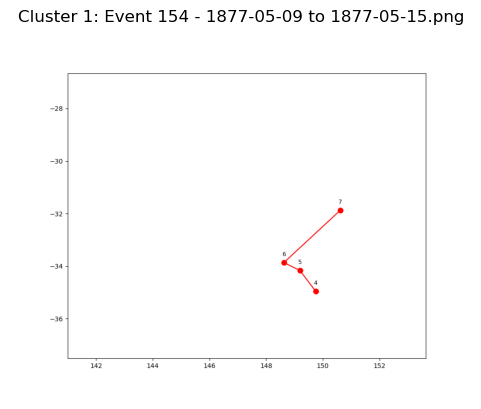

  Event 954 - 1860-05-20 to 1860-05-26.png


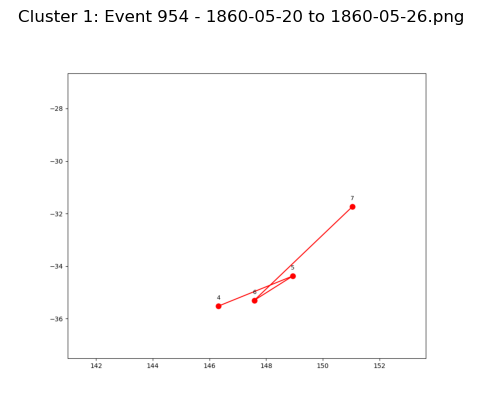

  Event 78 - 1900-06-05 to 1900-06-11.png


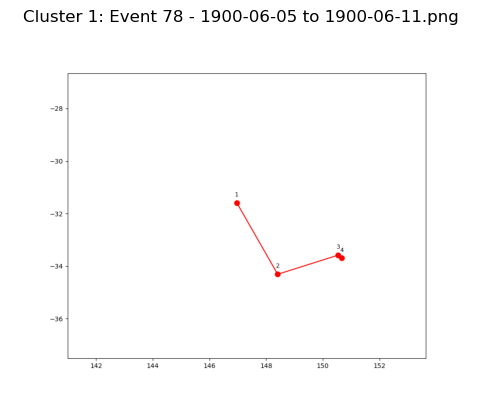

  Event 792 - 1871-11-02 to 1871-11-08.png


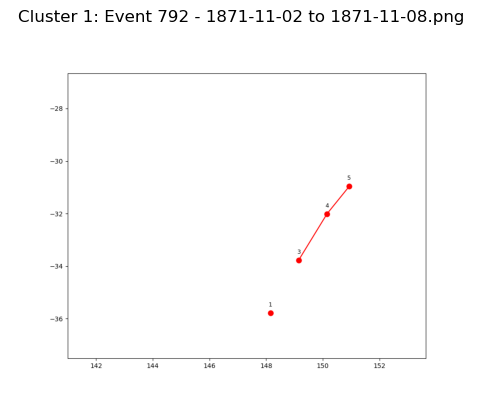

  Event 575 - 1890-04-08 to 1890-04-14.png


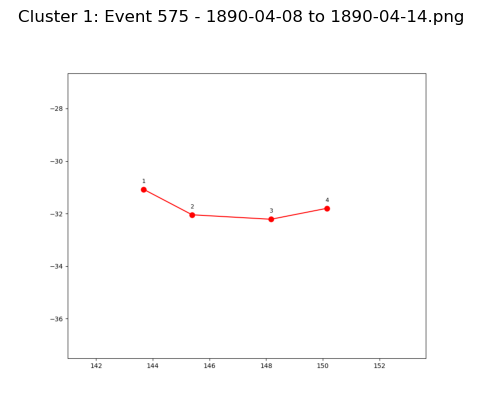

  Event 553 - 1881-09-07 to 1881-09-13.png


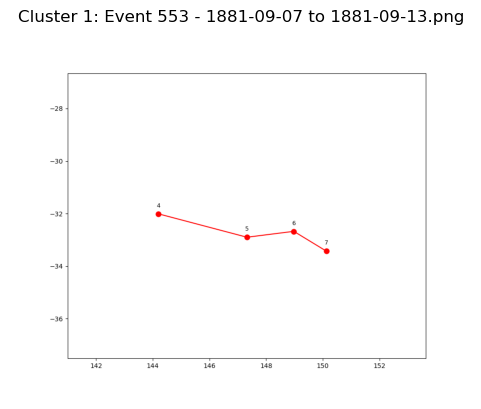

  Event 14 - 1893-02-13 to 1893-02-19.png


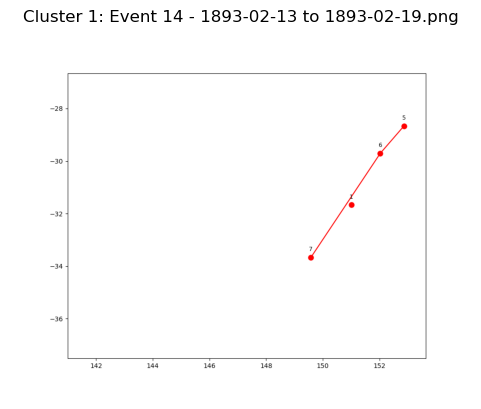

  Event 433 - 1891-01-03 to 1891-01-09.png


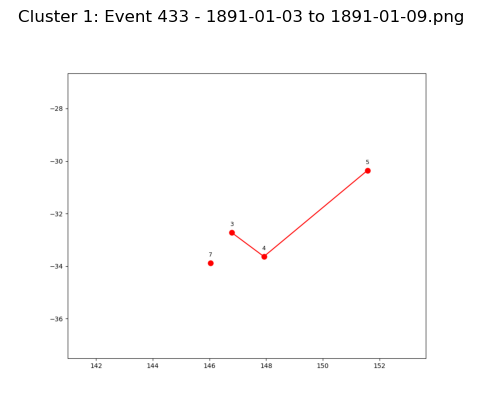

  Event 757 - 1887-11-02 to 1887-11-08.png


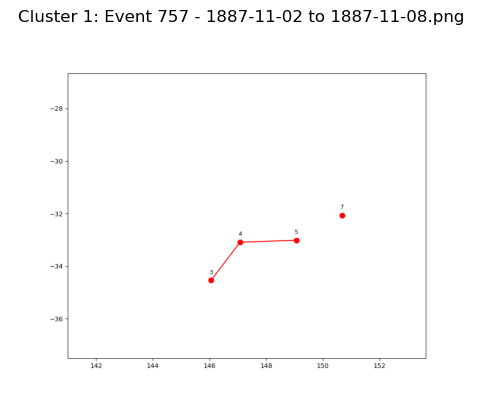

  Event 325 - 1887-05-15 to 1887-05-21.png


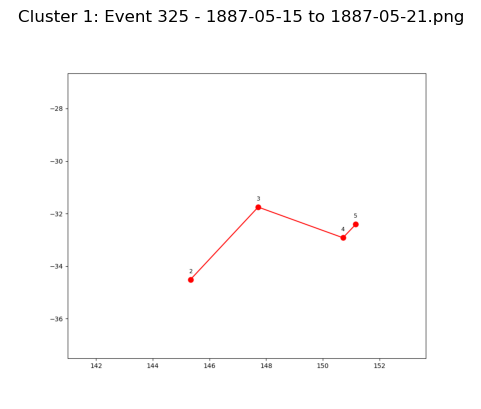

  Event 6 - 1891-06-04 to 1891-06-10.png


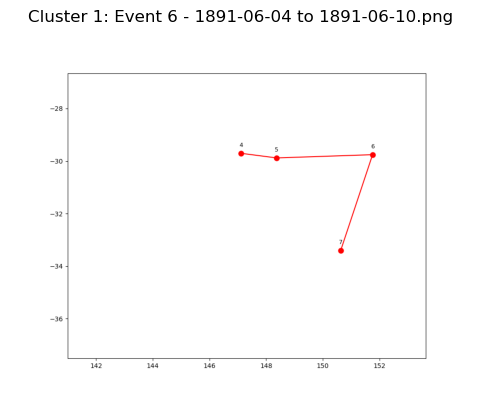

  Event 928 - 1861-11-19 to 1861-11-25.png


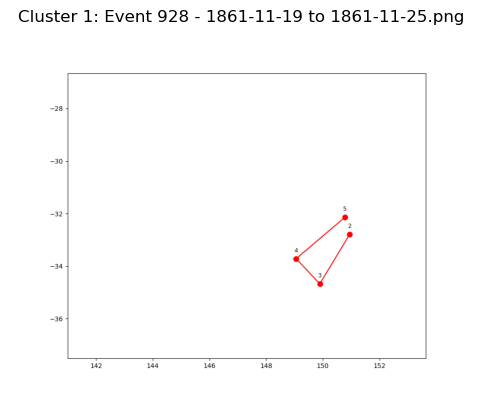

  Event 919 - 1889-09-05 to 1889-09-11.png


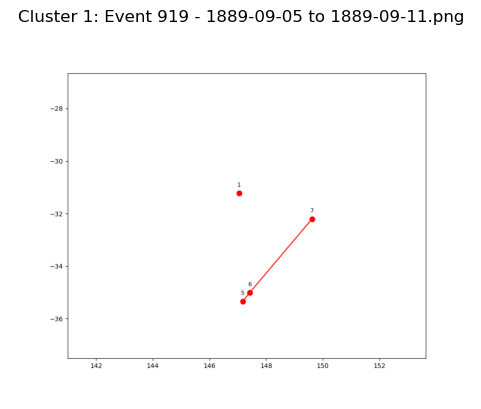

  Event 992 - 1885-12-30 to 1886-01-05.png


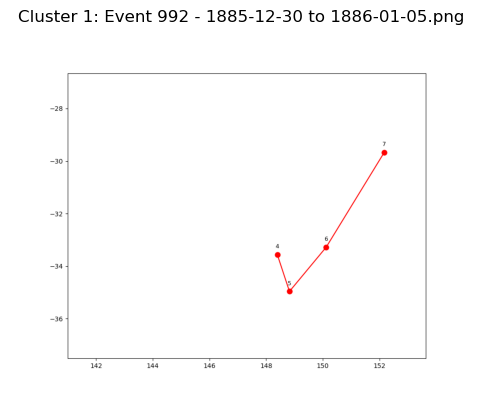

  Event 966 - 1896-12-25 to 1896-12-31.png


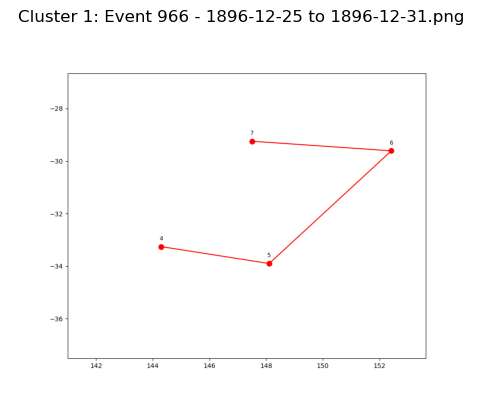

  Event 976 - 1898-02-27 to 1898-03-05.png


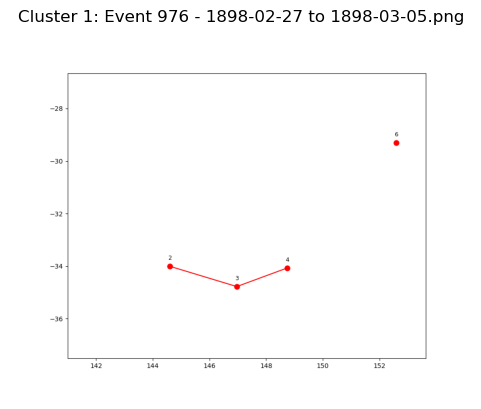

  Event 377 - 1899-09-10 to 1899-09-16.png


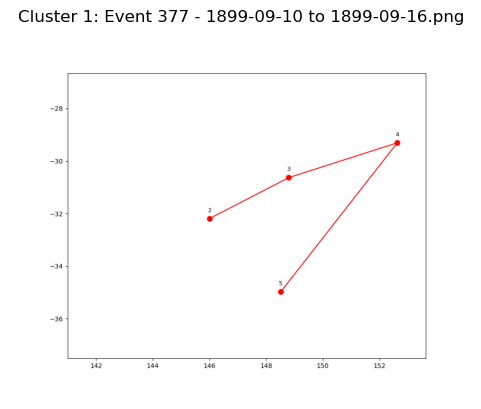

  Event 944 - 1875-08-07 to 1875-08-13.png


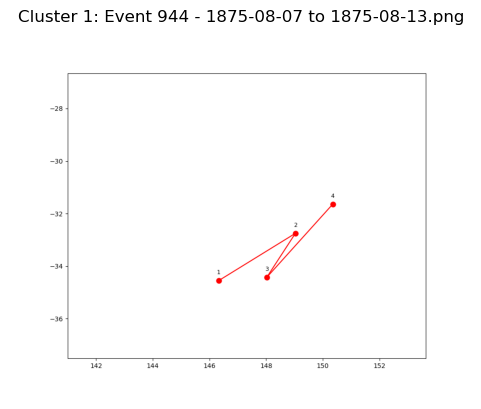

  Event 134 - 1885-12-10 to 1885-12-16.png


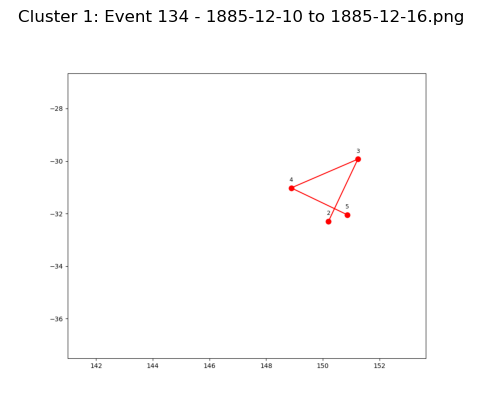

  Event 419 - 1885-07-19 to 1885-07-25.png


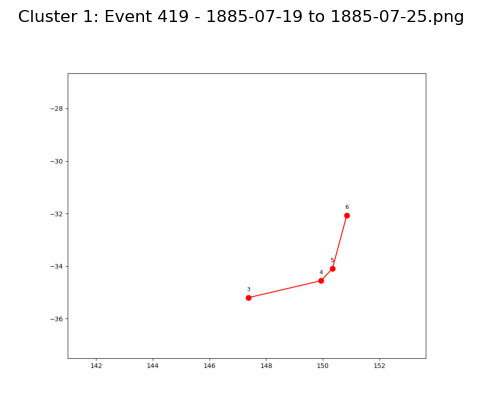

  Event 241 - 1896-06-01 to 1896-06-07.png


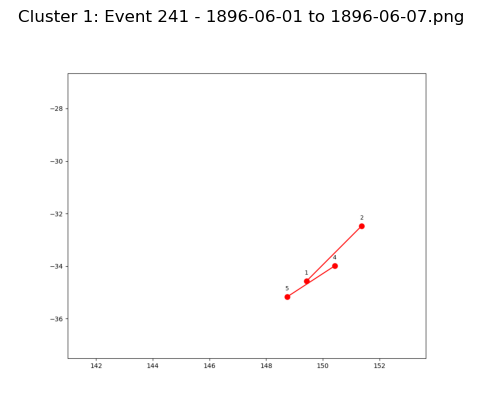

  Event 1055 - 1886-08-24 to 1886-08-30.png


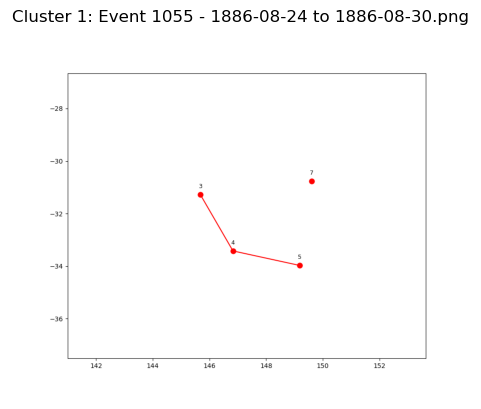

  Event 880 - 1889-10-14 to 1889-10-20.png


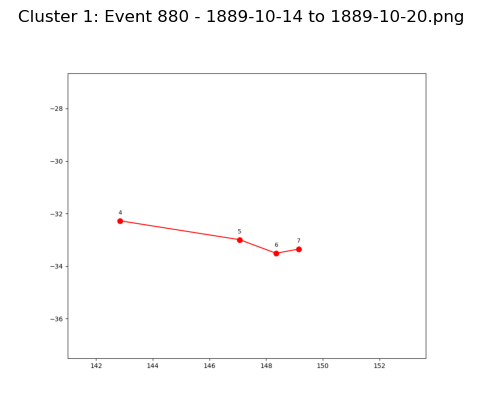

  Event 857 - 1896-01-06 to 1896-01-12.png


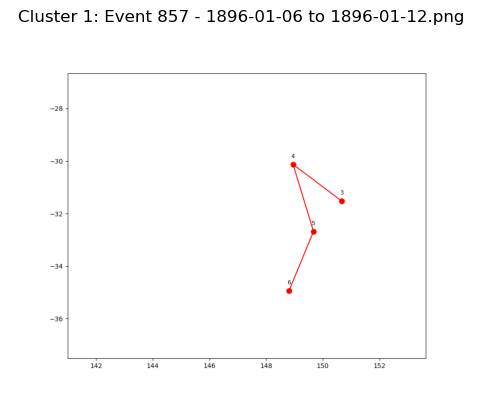

  Event 746 - 1889-05-10 to 1889-05-16.png


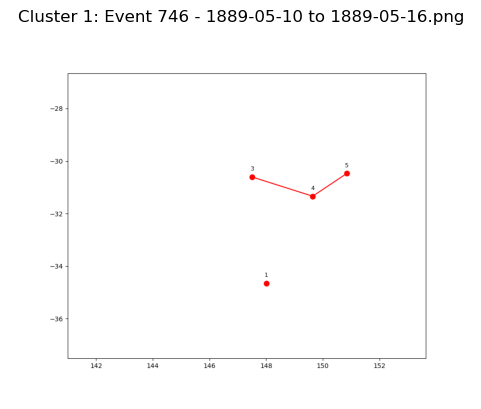

  Event 937 - 1863-02-12 to 1863-02-18.png


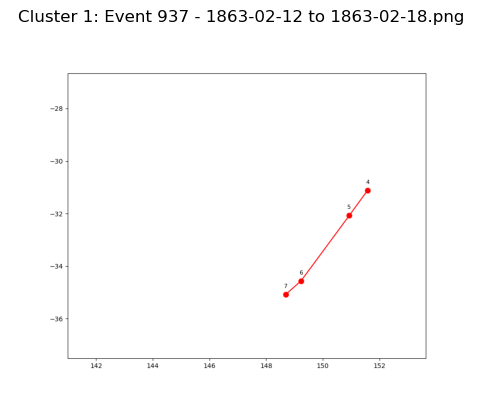

  Event 649 - 1876-04-05 to 1876-04-11.png


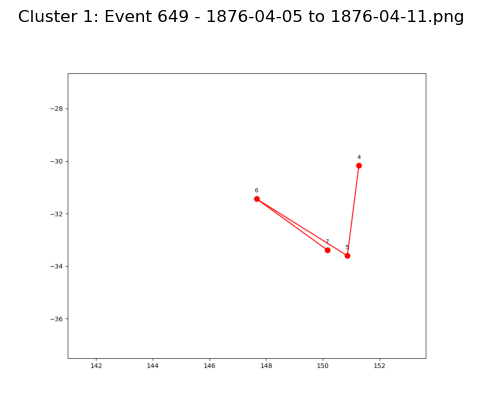

  Event 1087 - 1869-10-13 to 1869-10-19.png


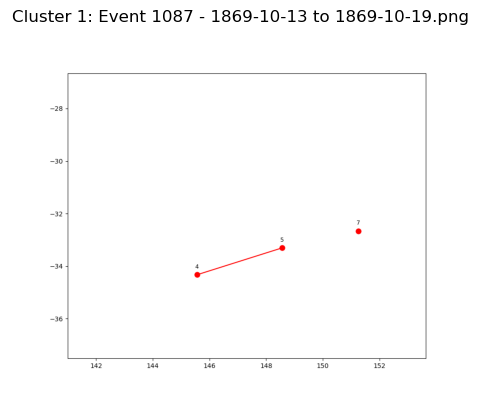

  Event 813 - 1876-03-23 to 1876-03-29.png


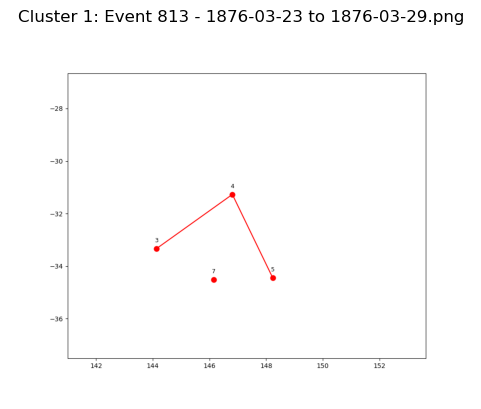

  Event 164 - 1880-10-14 to 1880-10-20.png


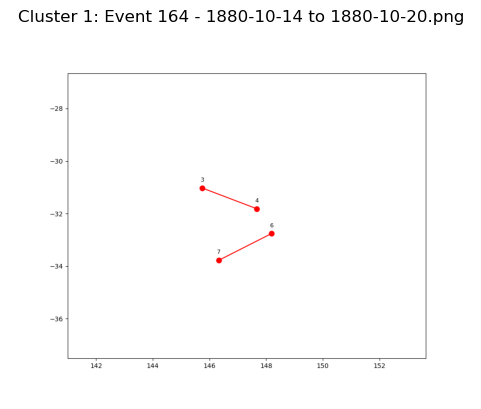

  Event 445 - 1900-03-18 to 1900-03-24.png


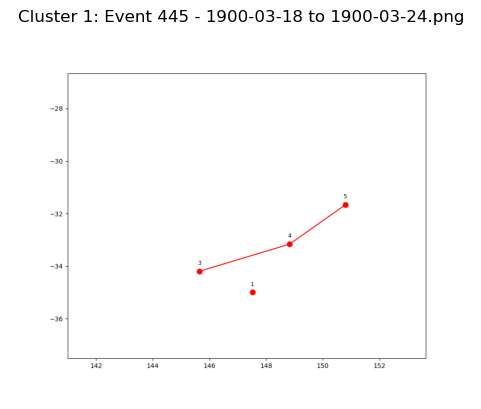

  Event 754 - 1895-02-15 to 1895-02-21.png


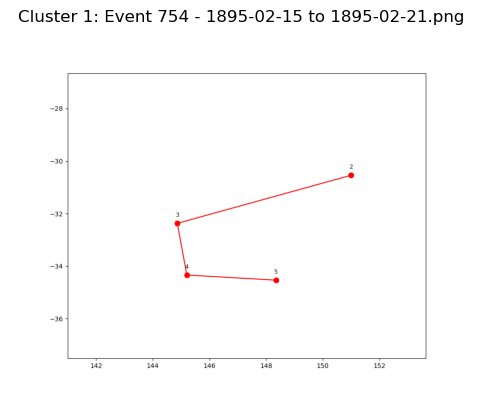

  Event 169 - 1889-02-27 to 1889-03-05.png


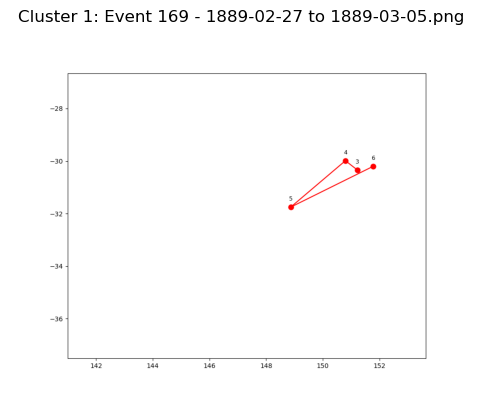

  Event 34 - 1898-01-22 to 1898-01-28.png


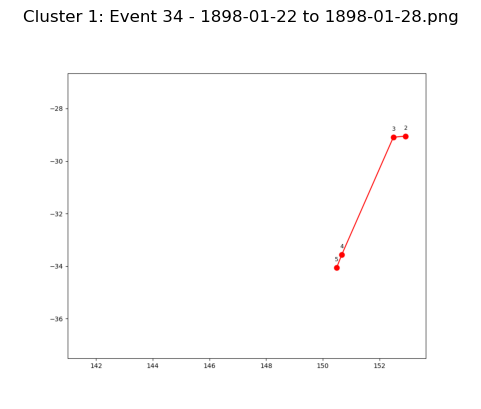

  Event 472 - 1897-12-01 to 1897-12-07.png


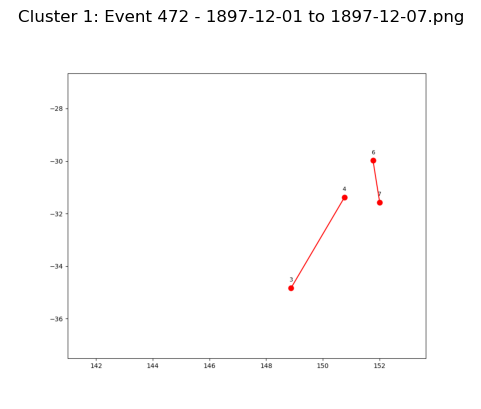

  Event 192 - 1894-08-31 to 1894-09-06.png


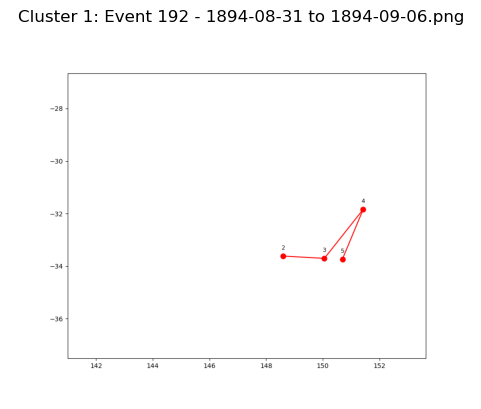

  Event 505 - 1883-06-30 to 1883-07-06.png


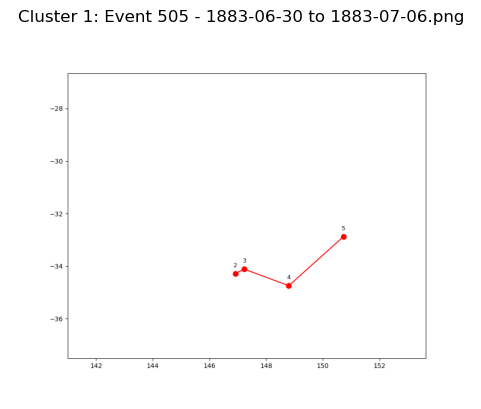

  Event 40 - 1890-03-22 to 1890-03-28.png


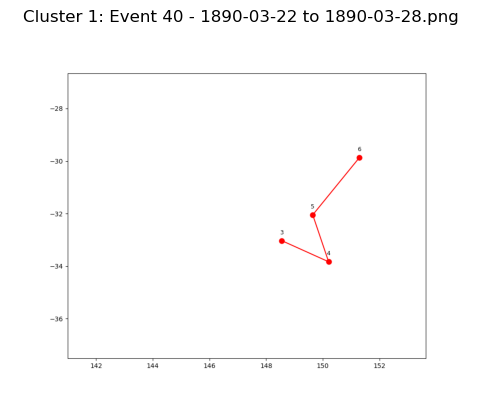

  Event 39 - 1890-03-09 to 1890-03-15.png


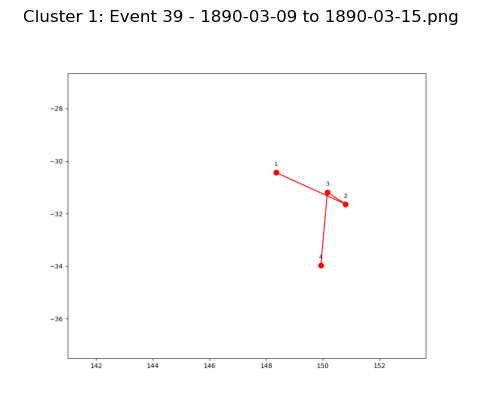

  Event 853 - 1877-02-25 to 1877-03-03.png


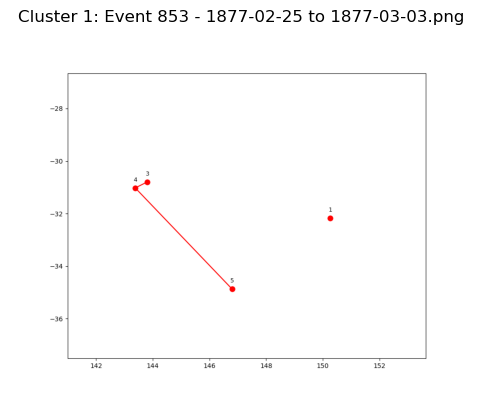

  Event 368 - 1890-11-11 to 1890-11-17.png


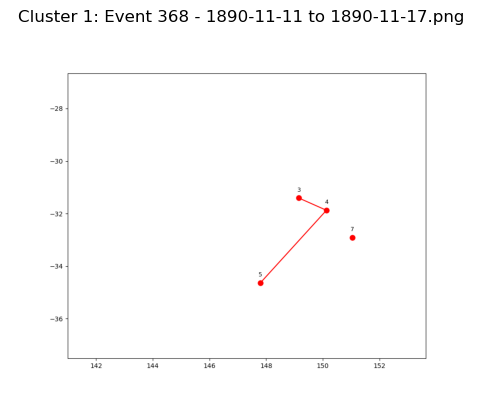

  Event 201 - 1873-01-09 to 1873-01-15.png


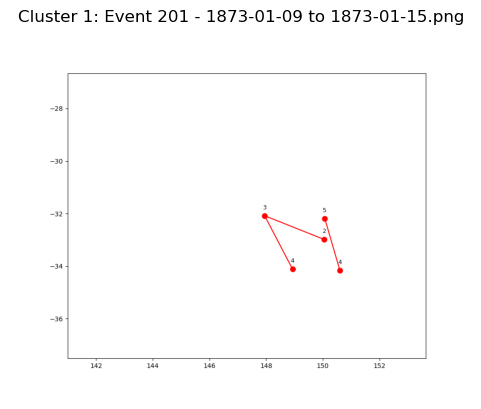

  Event 564 - 1899-01-09 to 1899-01-15.png


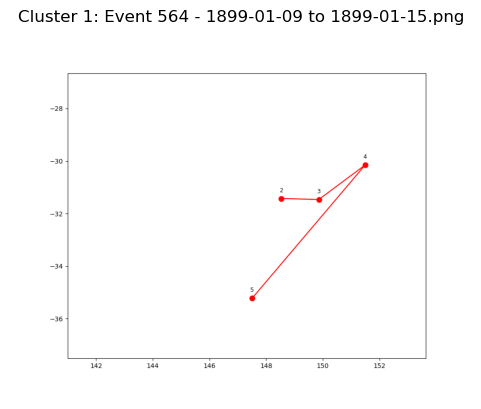

  Event 544 - 1878-02-08 to 1878-02-14.png


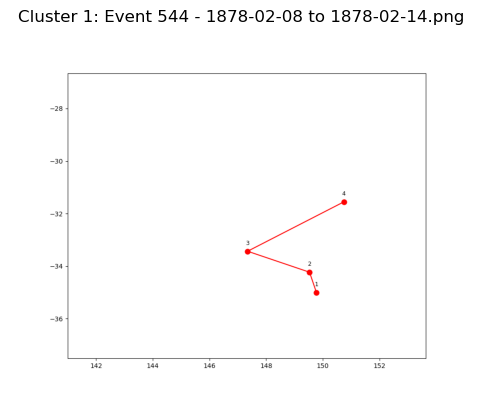

  Event 167 - 1893-07-13 to 1893-07-19.png


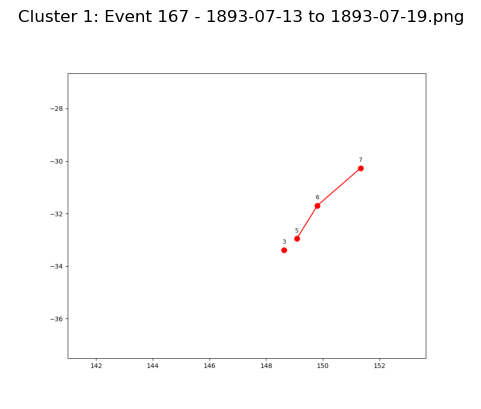

  Event 1073 - 1900-07-28 to 1900-08-03.png


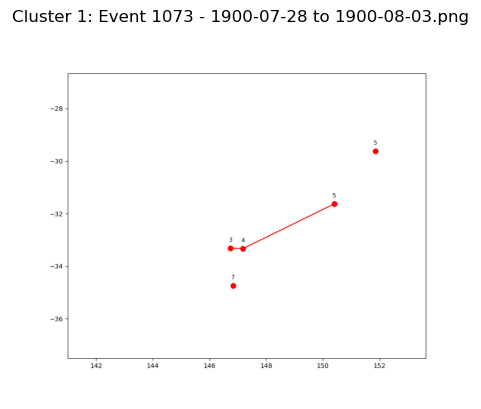

  Event 639 - 1880-02-14 to 1880-02-20.png


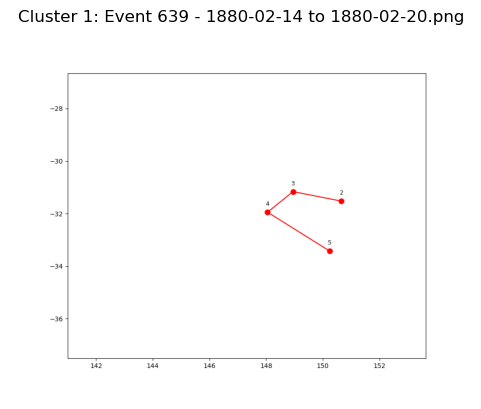

  Event 362 - 1878-10-30 to 1878-11-05.png


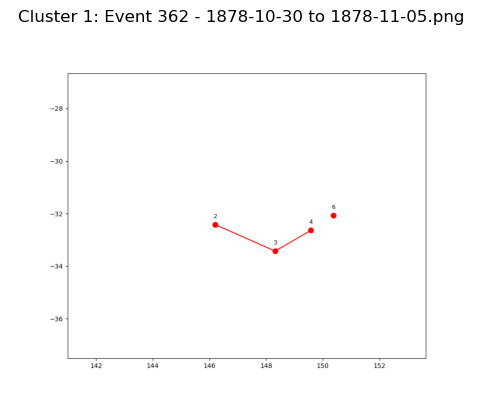

  Event 363 - 1880-06-30 to 1880-07-06.png


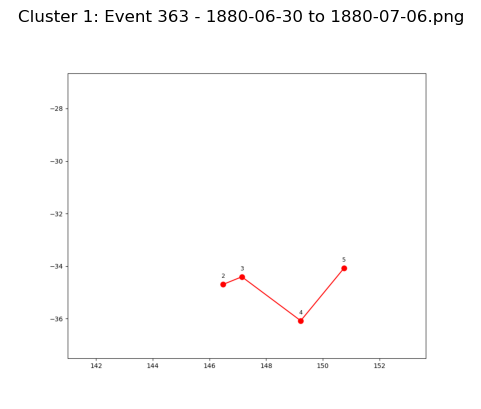

  Event 1071 - 1871-12-04 to 1871-12-10.png


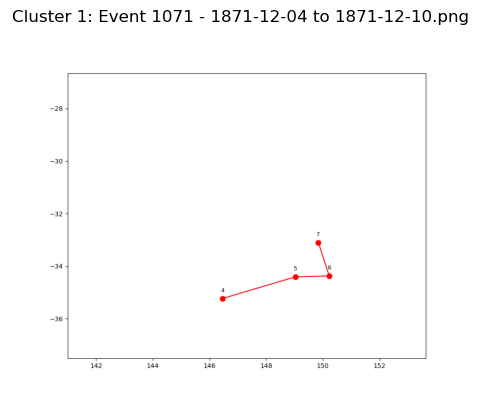

  Event 662 - 1898-03-18 to 1898-03-24.png


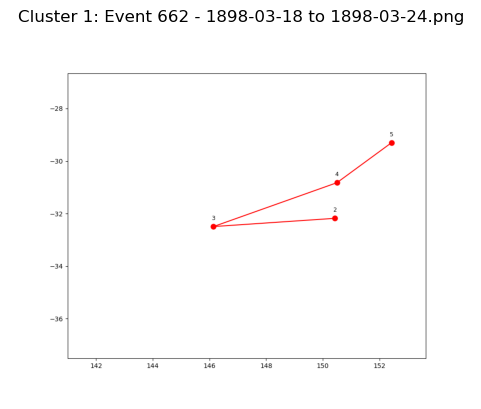

  Event 616 - 1870-08-19 to 1870-08-25.png


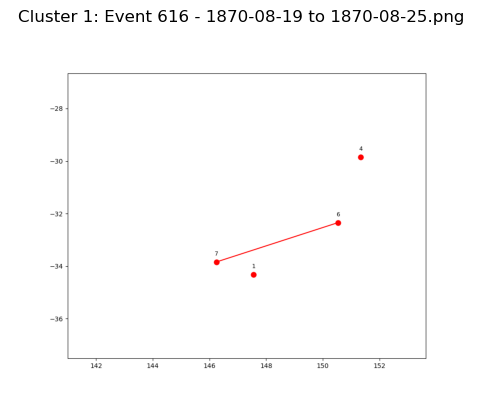

  Event 1099 - 1897-06-29 to 1897-07-05.png


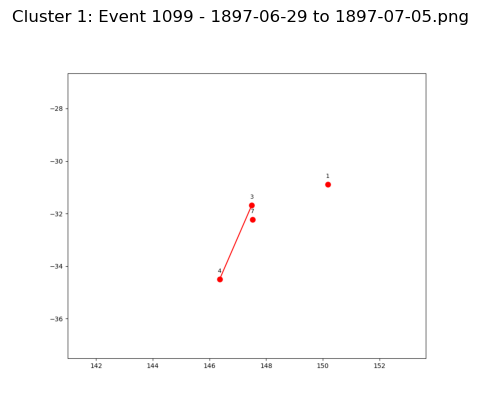

  Event 568 - 1887-04-02 to 1887-04-08.png


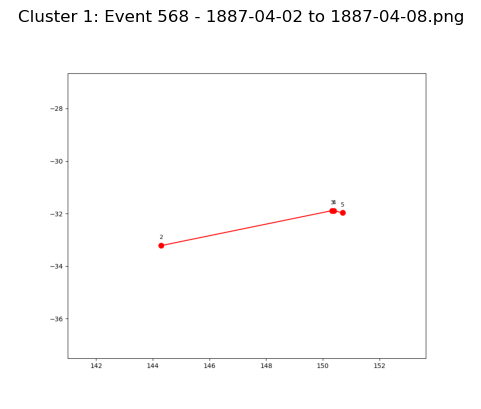

  Event 770 - 1889-11-15 to 1889-11-21.png


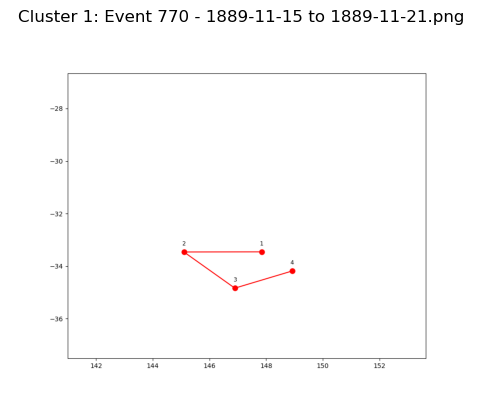

  Event 161 - 1893-04-24 to 1893-04-30.png


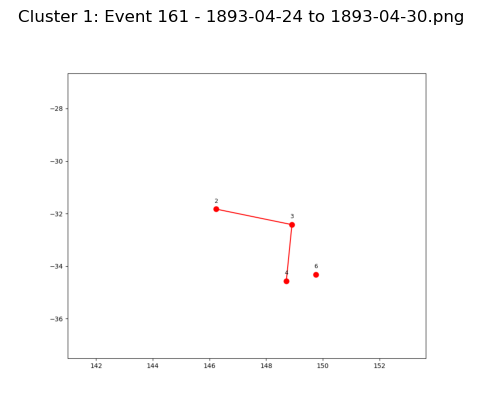

  Event 581 - 1893-03-15 to 1893-03-21.png


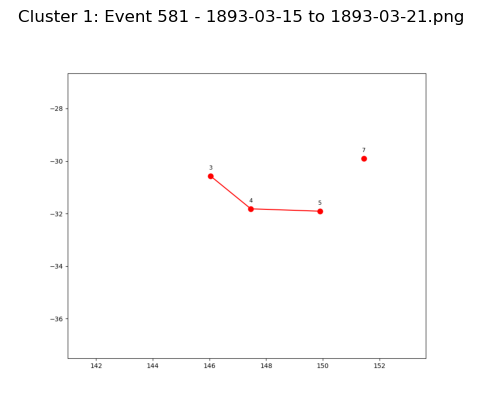

  Event 383 - 1890-02-21 to 1890-02-27.png


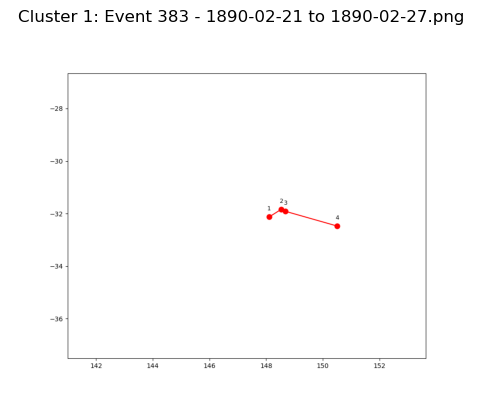

  Event 682 - 1877-12-12 to 1877-12-18.png


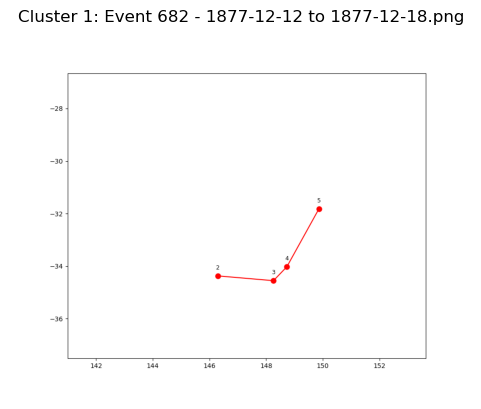

  Event 599 - 1891-04-16 to 1891-04-22.png


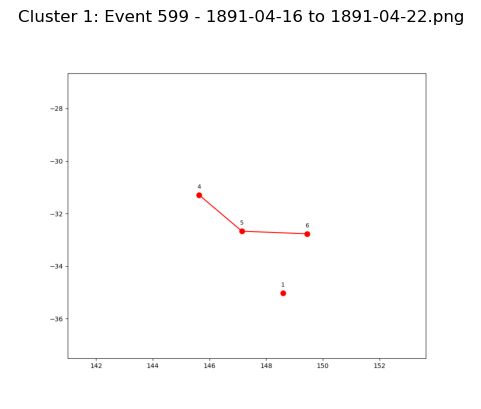

  Event 834 - 1892-02-04 to 1892-02-10.png


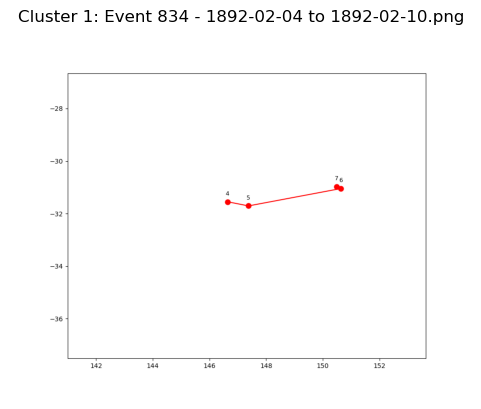

  Event 415 - 1880-02-06 to 1880-02-12.png


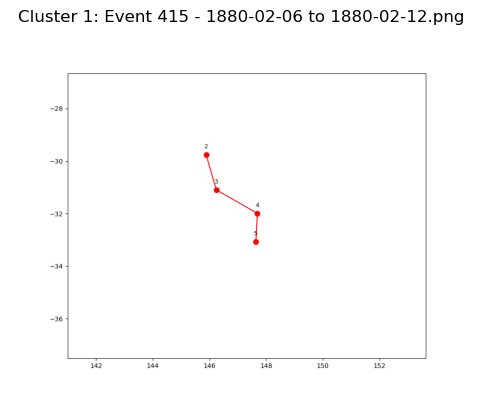

  Event 497 - 1881-03-29 to 1881-04-04.png


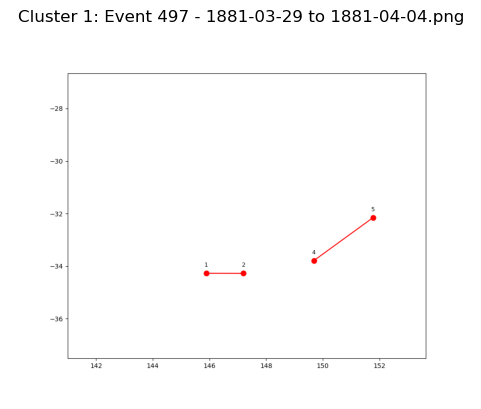

  Event 671 - 1879-02-18 to 1879-02-24.png


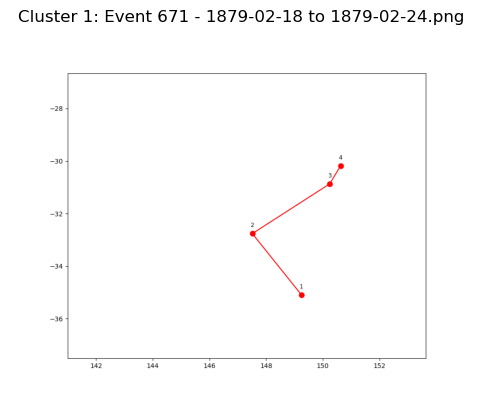

  Event 209 - 1882-03-28 to 1882-04-03.png


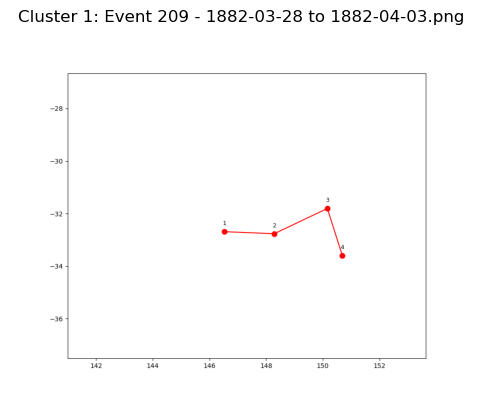

  Event 395 - 1893-08-20 to 1893-08-26.png


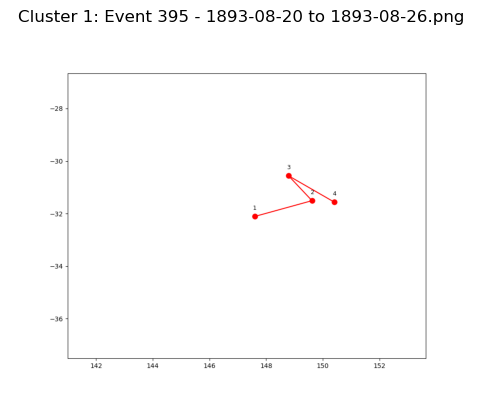

  Event 604 - 1873-06-17 to 1873-06-23.png


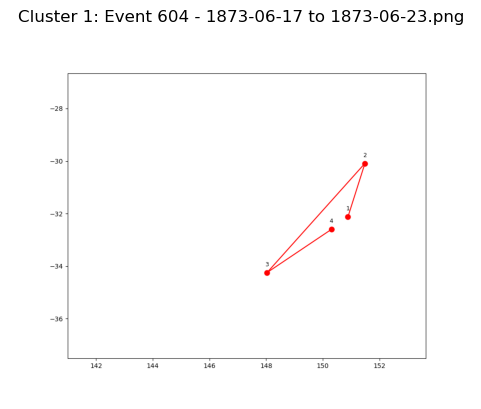

  Event 1053 - 1878-03-05 to 1878-03-11.png


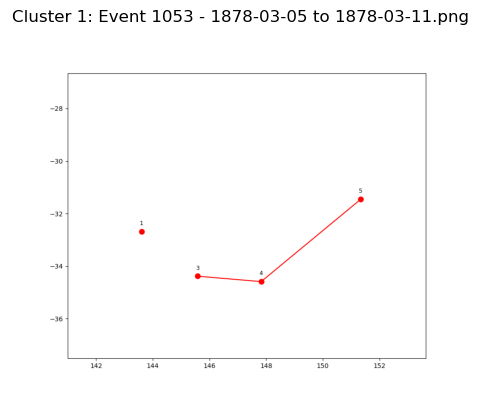

  Event 1012 - 1899-03-17 to 1899-03-23.png


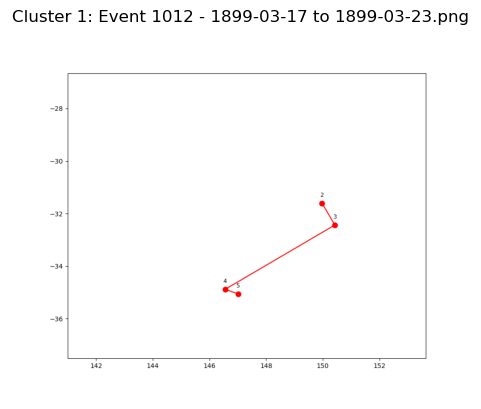

  Event 597 - 1879-01-30 to 1879-02-05.png


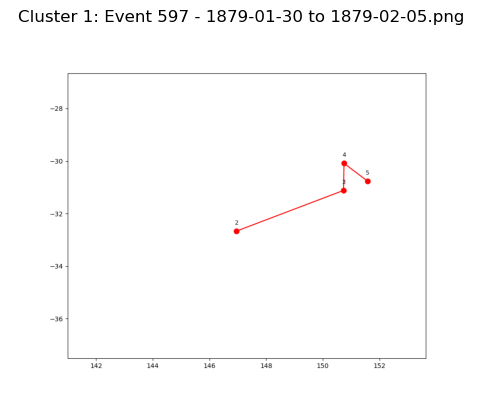

  Event 1050 - 1871-05-04 to 1871-05-10.png


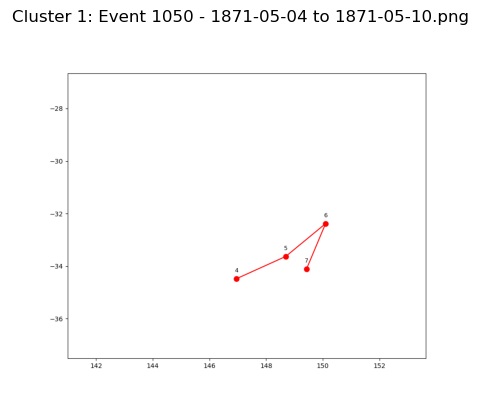

  Event 162 - 1882-10-17 to 1882-10-23.png


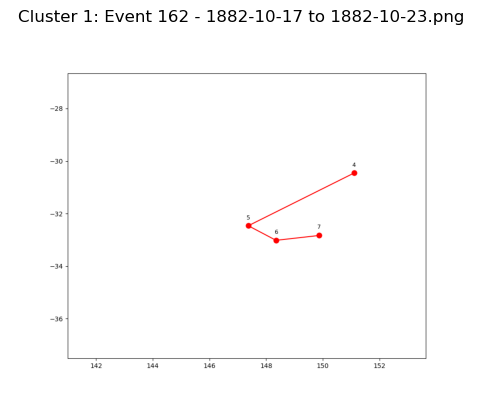

  Event 722 - 1884-09-24 to 1884-09-30.png


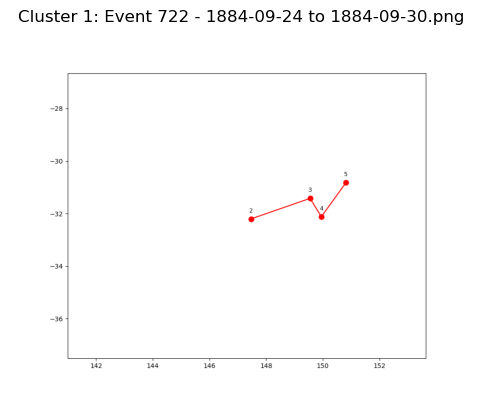

  Event 803 - 1886-04-18 to 1886-04-24.png


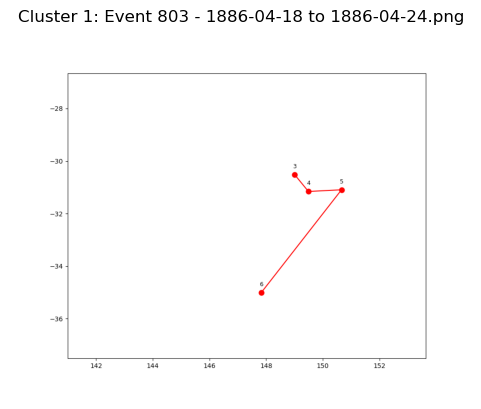

  Event 788 - 1889-05-30 to 1889-06-05.png


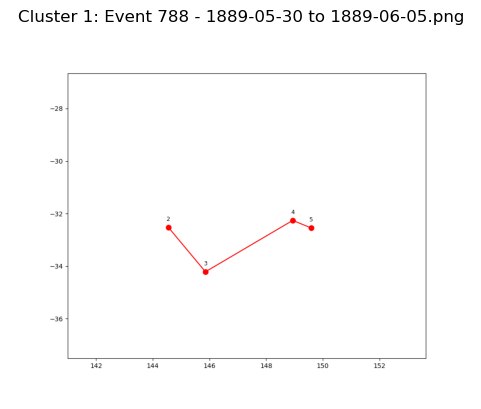

  Event 902 - 1881-11-12 to 1881-11-18.png


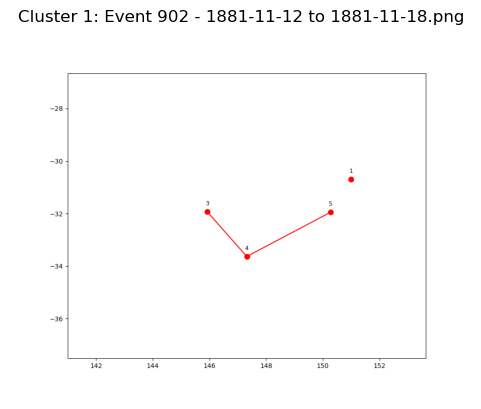

  Event 835 - 1886-01-12 to 1886-01-18.png


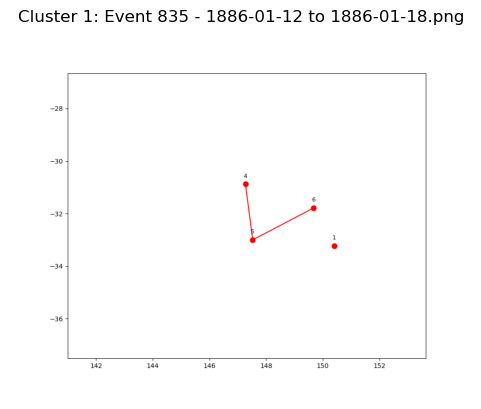

  Event 895 - 1892-10-10 to 1892-10-16.png


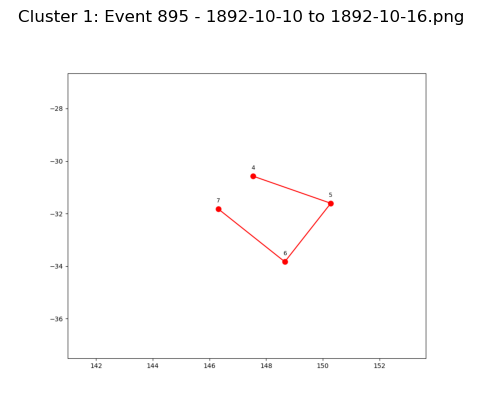

  Event 904 - 1897-11-16 to 1897-11-22.png


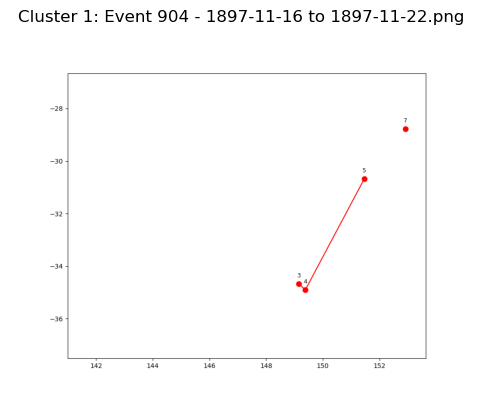

  Event 646 - 1895-11-24 to 1895-11-30.png


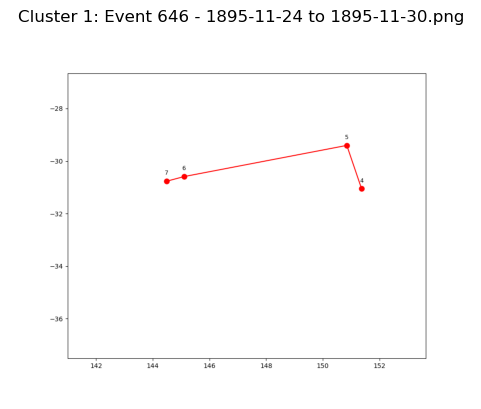

  Event 392 - 1869-11-18 to 1869-11-24.png


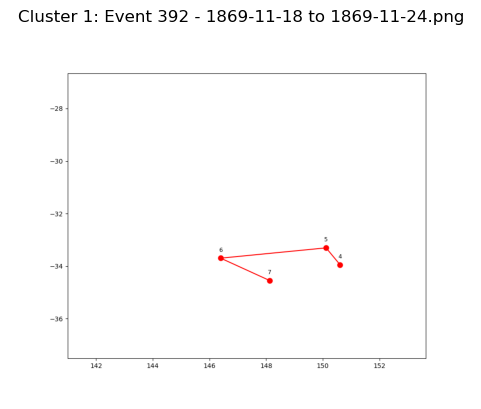

  Event 174 - 1898-06-29 to 1898-07-05.png


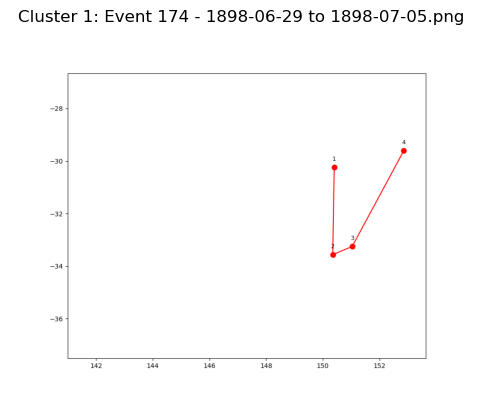

  Event 474 - 1883-05-03 to 1883-05-09.png


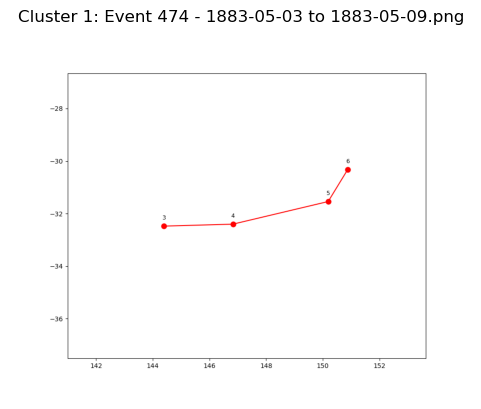

  Event 85 - 1892-11-09 to 1892-11-15.png


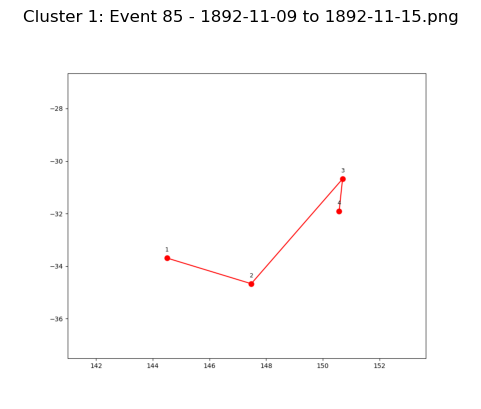

  Event 736 - 1900-01-17 to 1900-01-23.png


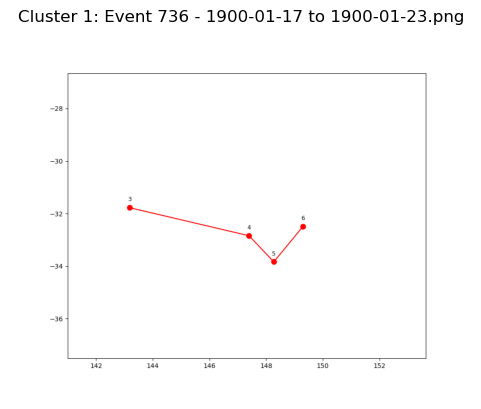

  Event 492 - 1873-07-31 to 1873-08-06.png


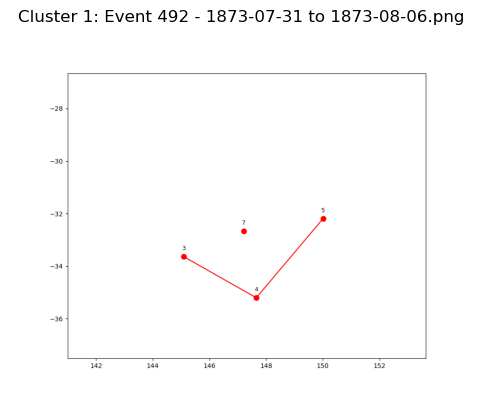

  Event 1062 - 1863-01-12 to 1863-01-18.png


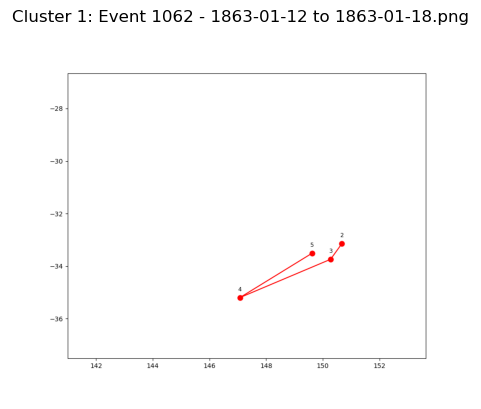

  Event 775 - 1897-07-06 to 1897-07-12.png


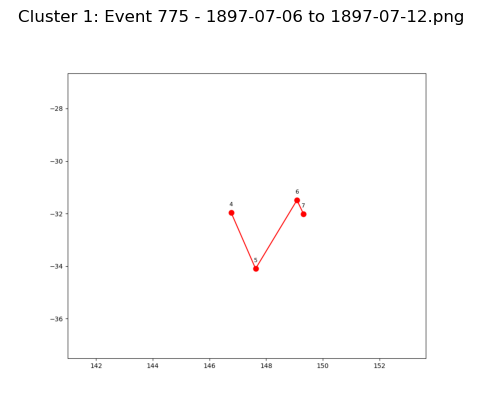

  Event 625 - 1879-05-20 to 1879-05-26.png


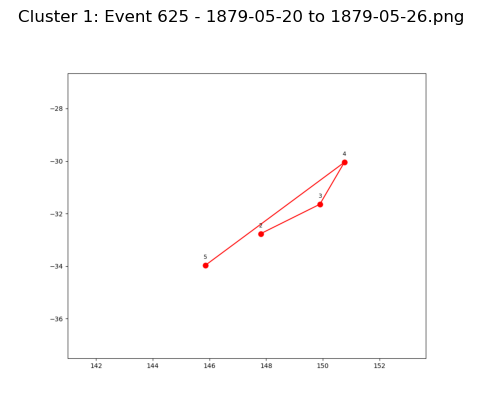

  Event 950 - 1897-12-22 to 1897-12-28.png


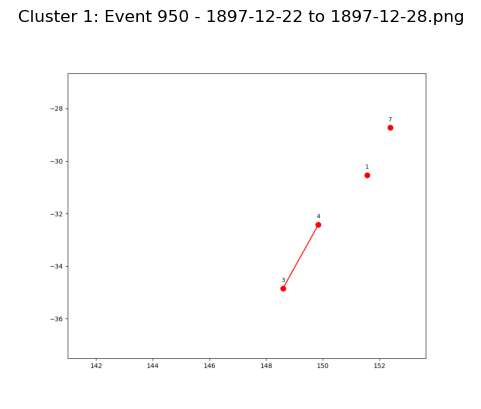

  Event 974 - 1890-06-21 to 1890-06-27.png


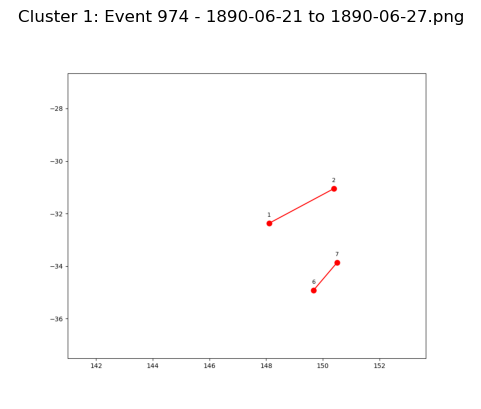

  Event 1039 - 1883-09-10 to 1883-09-16.png


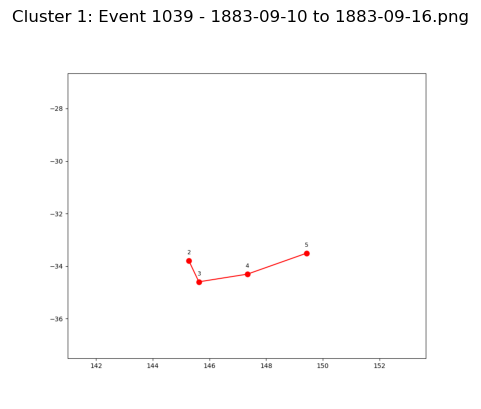

  Event 753 - 1888-12-31 to 1889-01-06.png


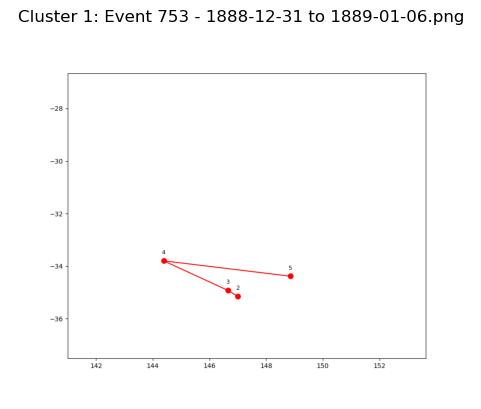

  Event 339 - 1864-06-14 to 1864-06-20.png


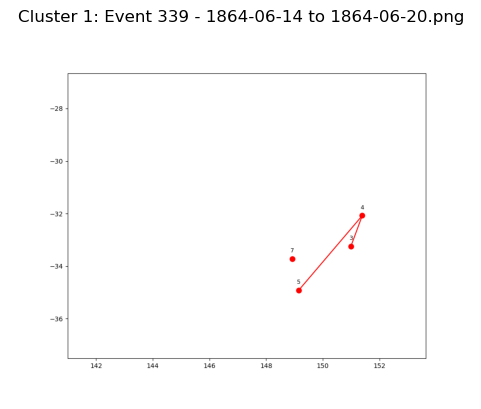

  Event 233 - 1890-12-06 to 1890-12-12.png


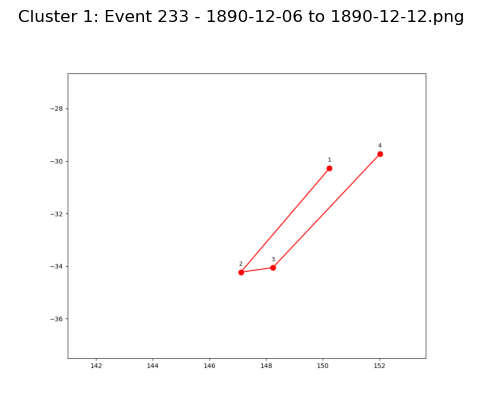

  Event 487 - 1871-02-05 to 1871-02-11.png


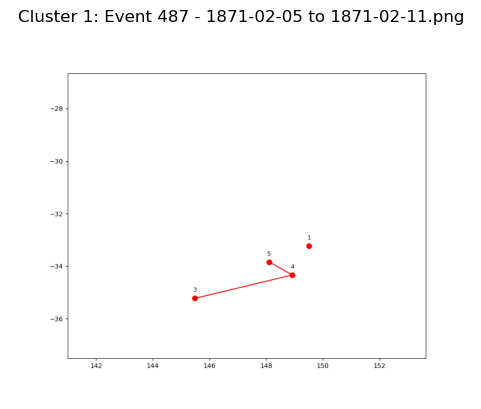

  Event 324 - 1886-07-05 to 1886-07-11.png


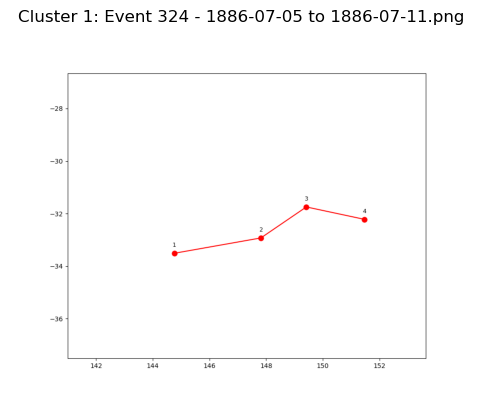

  Event 821 - 1886-01-04 to 1886-01-10.png


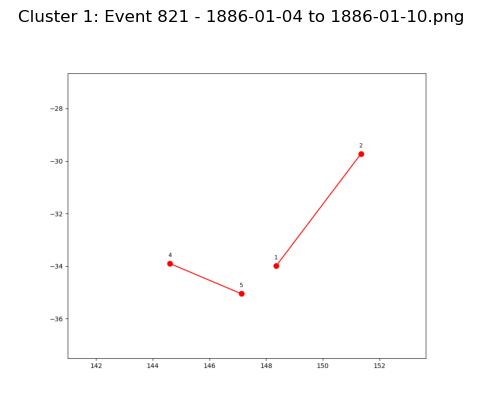

  Event 484 - 1870-06-15 to 1870-06-21.png


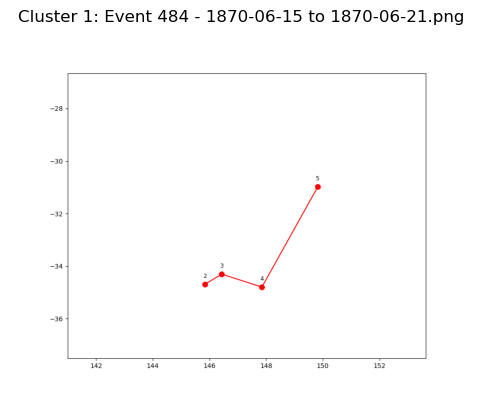

  Event 668 - 1896-01-25 to 1896-01-31.png


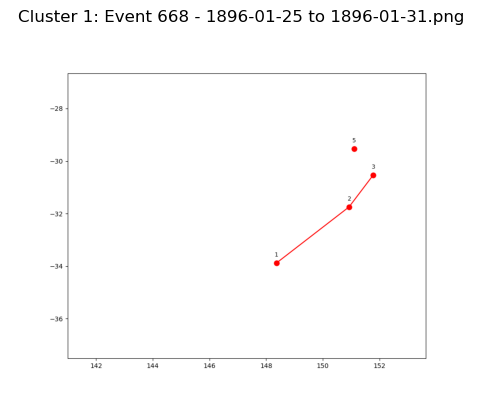

  Event 370 - 1893-04-16 to 1893-04-22.png


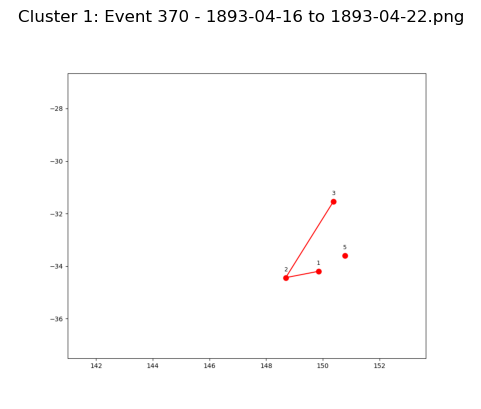

  Event 913 - 1879-11-02 to 1879-11-08.png


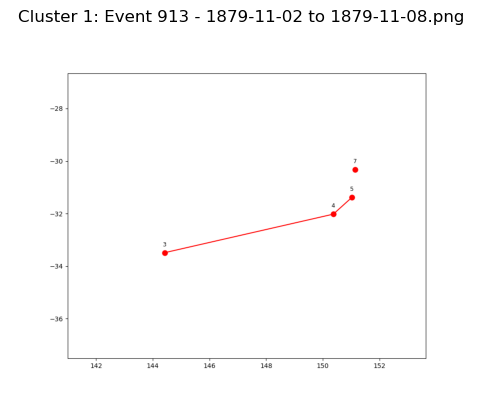

  Event 193 - 1895-01-05 to 1895-01-11.png


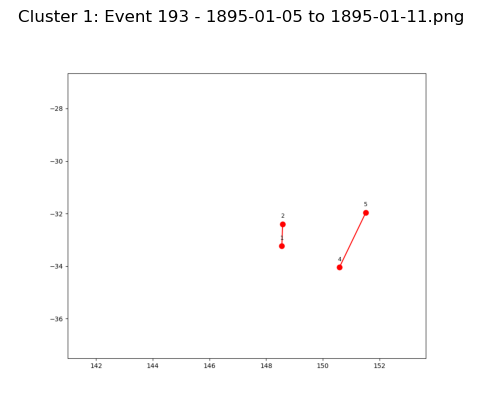

  Event 576 - 1891-01-27 to 1891-02-02.png


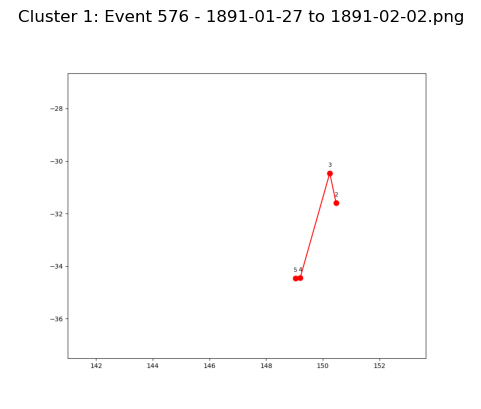

  Event 614 - 1870-01-13 to 1870-01-19.png


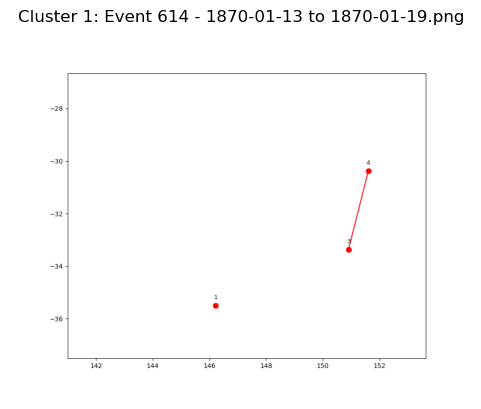

  Event 500 - 1881-09-02 to 1881-09-08.png


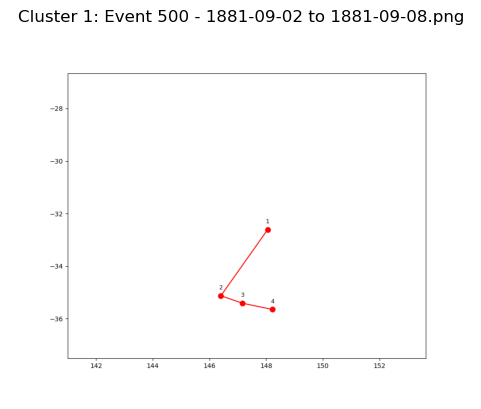

  Event 1096 - 1880-11-17 to 1880-11-23.png


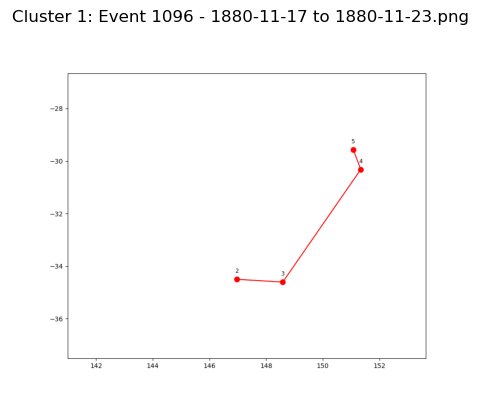

  Event 802 - 1886-11-18 to 1886-11-24.png


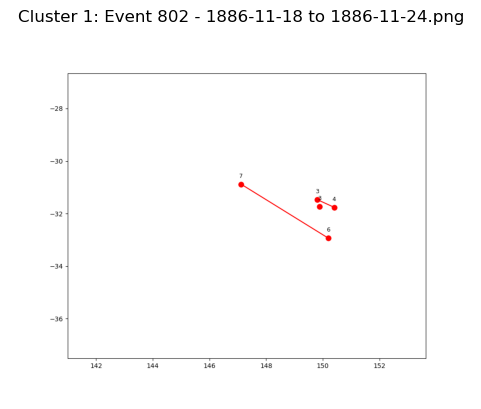

  Event 367 - 1886-03-04 to 1886-03-10.png


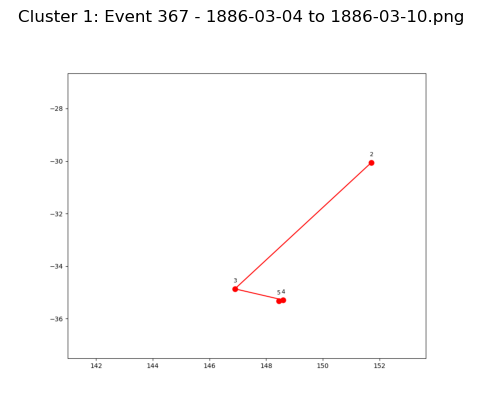

  Event 205 - 1874-06-24 to 1874-06-30.png


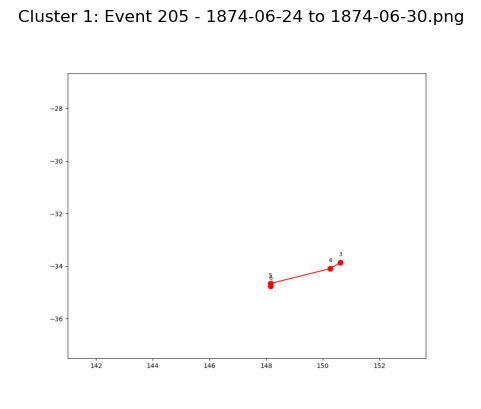

  Event 909 - 1873-09-30 to 1873-10-06.png


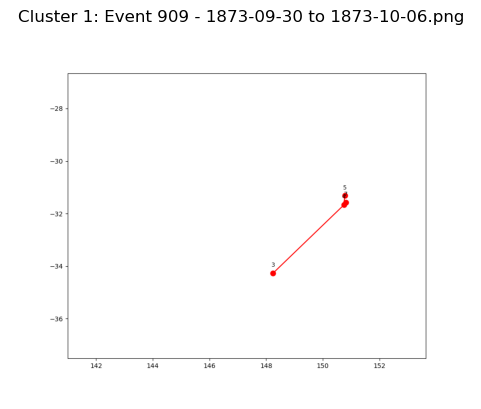

  Event 406 - 1886-06-16 to 1886-06-22.png


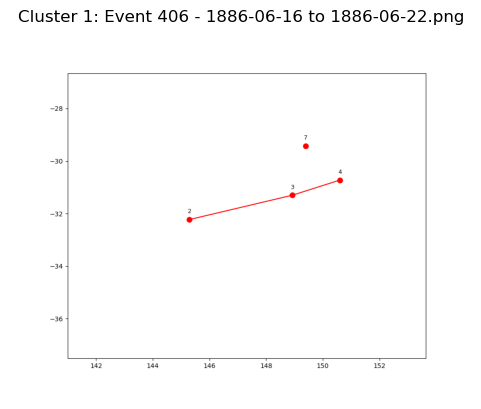

  Event 787 - 1872-02-01 to 1872-02-07.png


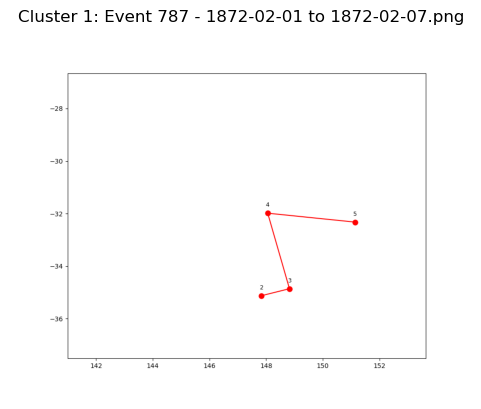

  Event 765 - 1884-01-30 to 1884-02-05.png


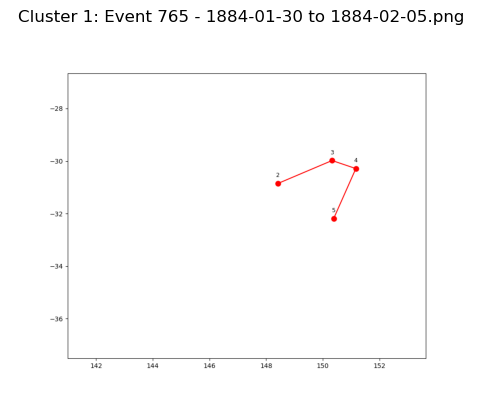

  Event 1003 - 1893-07-18 to 1893-07-24.png


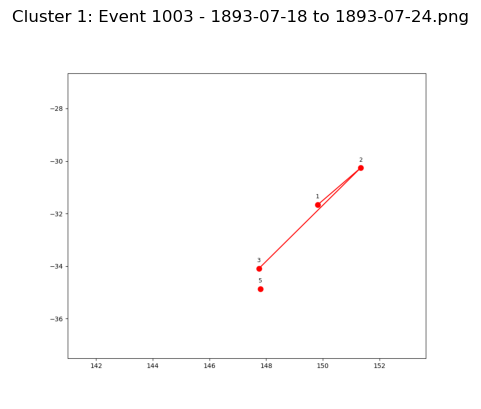

  Event 831 - 1885-03-01 to 1885-03-07.png


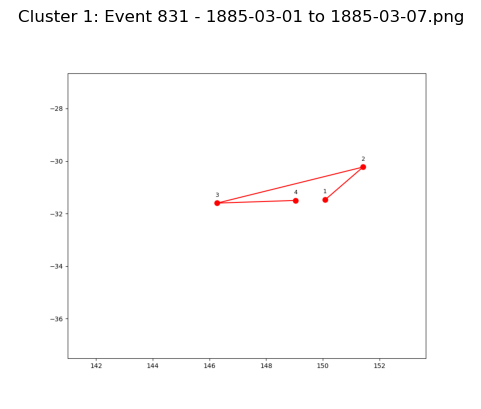

  Event 654 - 1899-03-23 to 1899-03-29.png


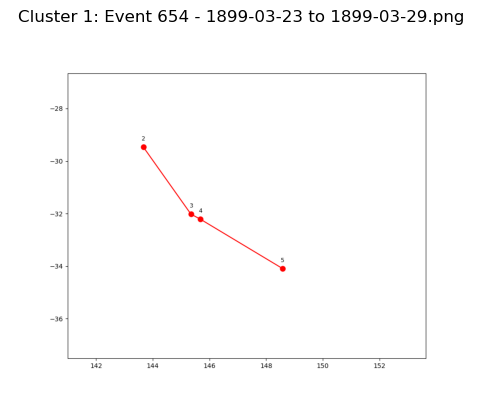

  Event 916 - 1887-07-27 to 1887-08-02.png


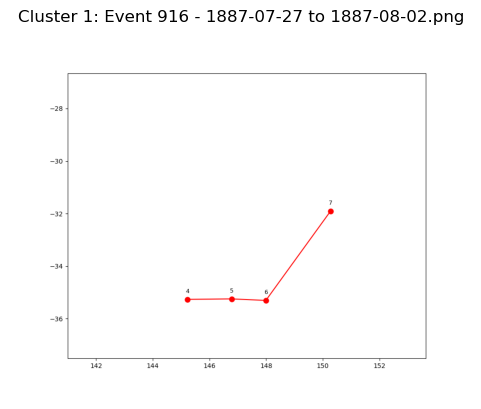

  Event 252 - 1880-09-13 to 1880-09-19.png


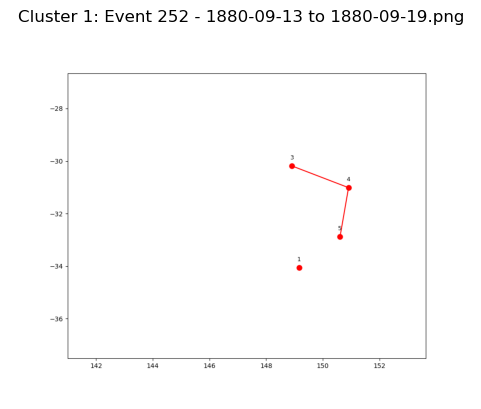

  Event 710 - 1880-10-20 to 1880-10-26.png


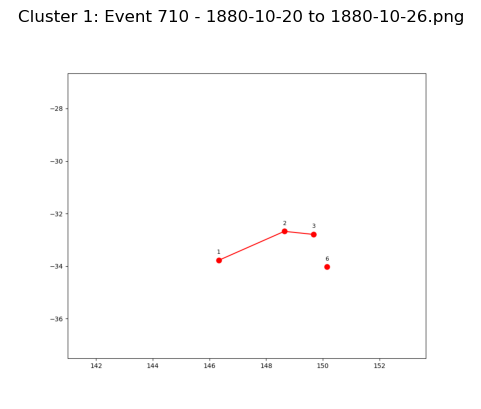

  Event 861 - 1900-06-19 to 1900-06-25.png


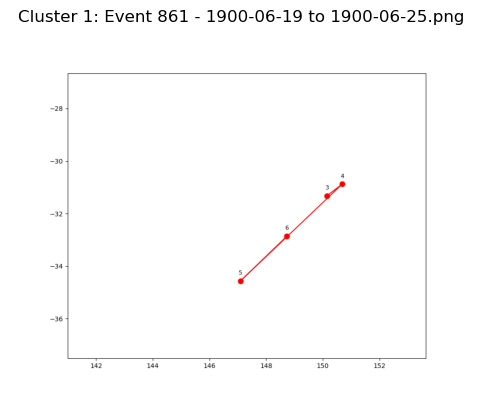

  Event 778 - 1893-09-01 to 1893-09-07.png


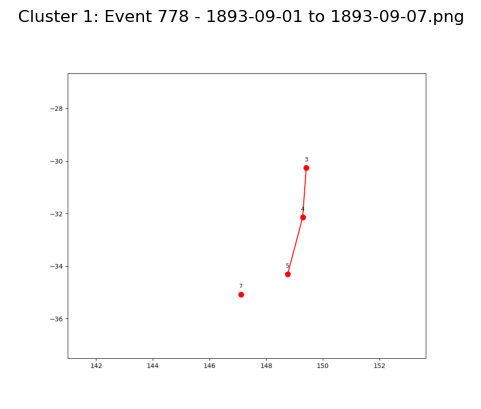

  Event 827 - 1896-10-12 to 1896-10-18.png


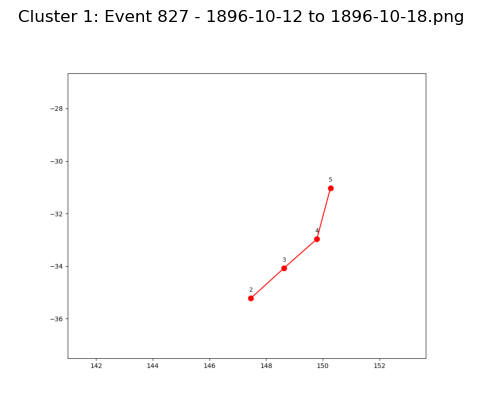

  Event 98 - 1894-12-14 to 1894-12-20.png


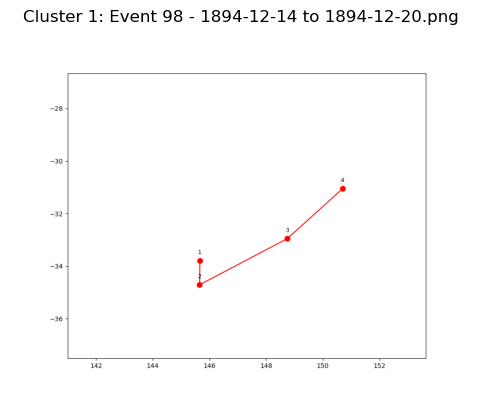

  Event 554 - 1887-12-28 to 1888-01-03.png


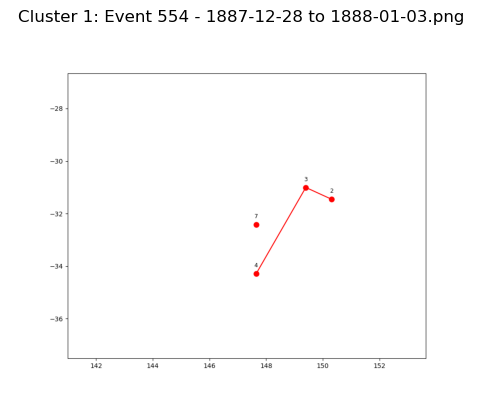

  Event 216 - 1886-10-12 to 1886-10-18.png


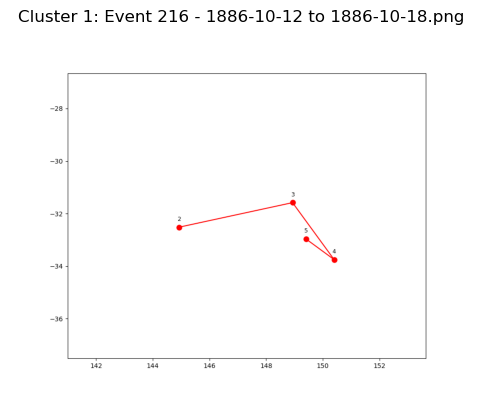

  Event 1063 - 1863-03-13 to 1863-03-19.png


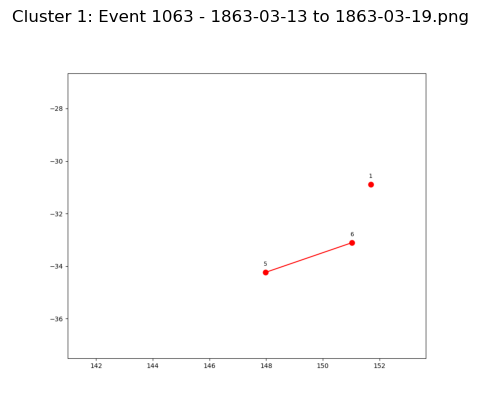

  Event 876 - 1882-08-25 to 1882-08-31.png


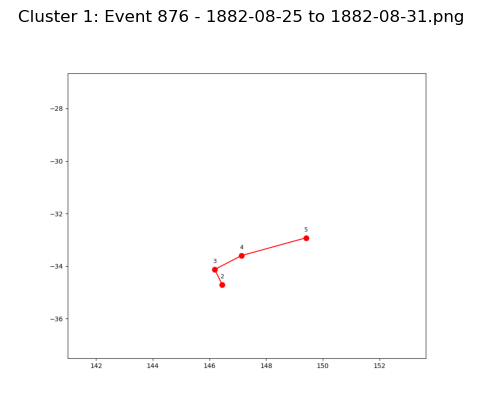

  Event 482 - 1869-11-22 to 1869-11-28.png


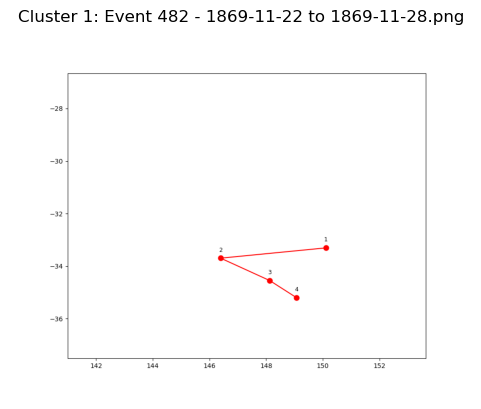

  Event 679 - 1875-02-02 to 1875-02-08.png


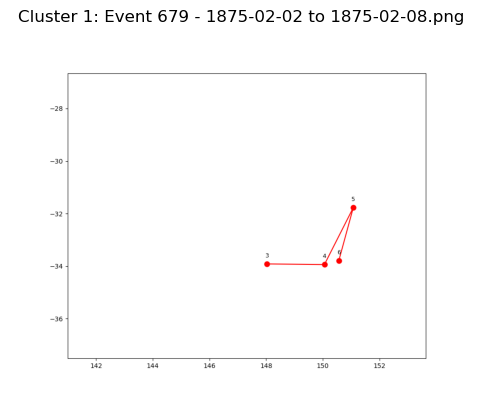

  Event 1060 - 1860-12-07 to 1860-12-13.png


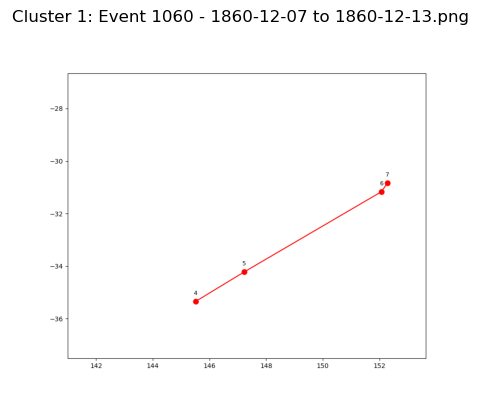

  Event 756 - 1880-04-17 to 1880-04-23.png


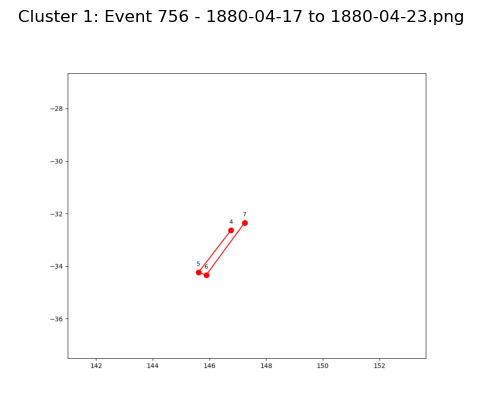

  Event 458 - 1893-12-30 to 1894-01-05.png


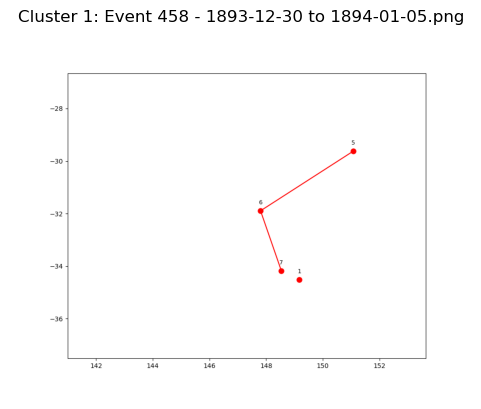

  Event 713 - 1900-04-27 to 1900-05-03.png


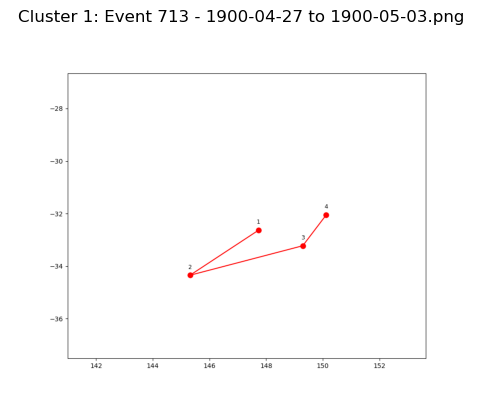

  Event 231 - 1888-07-01 to 1888-07-07.png


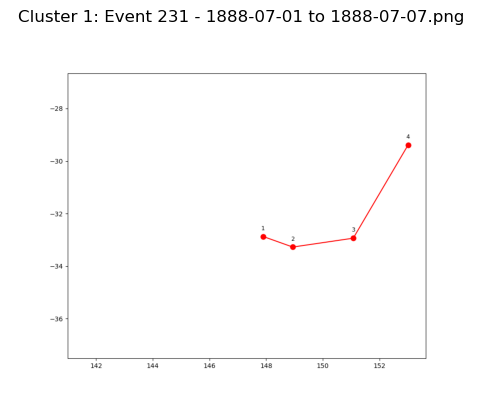

  Event 455 - 1896-08-25 to 1896-08-31.png


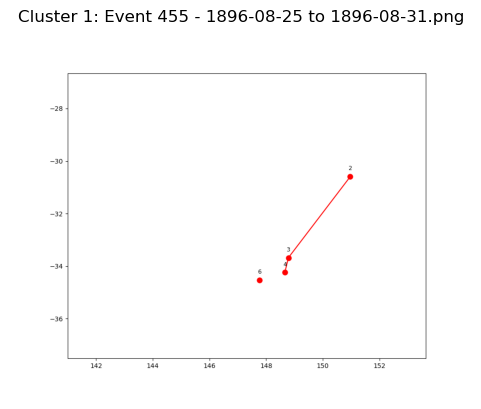

  Event 896 - 1890-10-22 to 1890-10-28.png


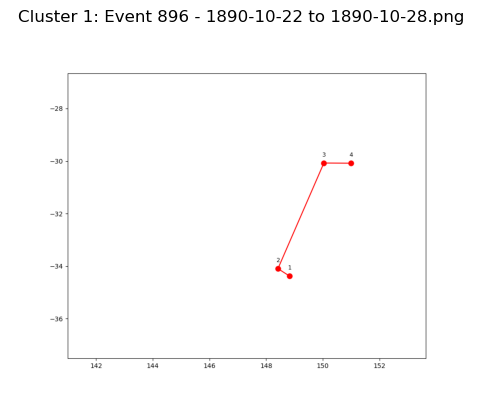

  Event 525 - 1888-08-29 to 1888-09-04.png


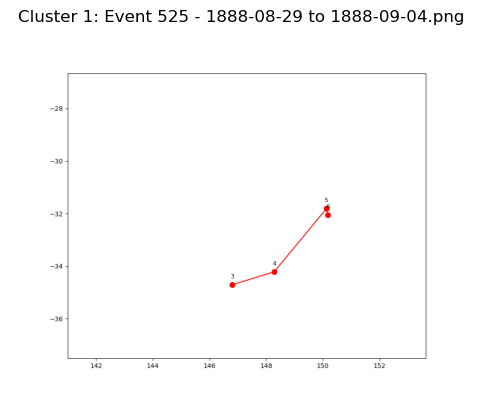

  Event 785 - 1894-10-12 to 1894-10-18.png


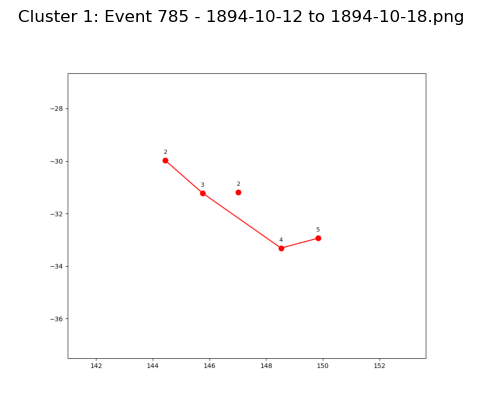

  Event 29 - 1894-03-17 to 1894-03-23.png


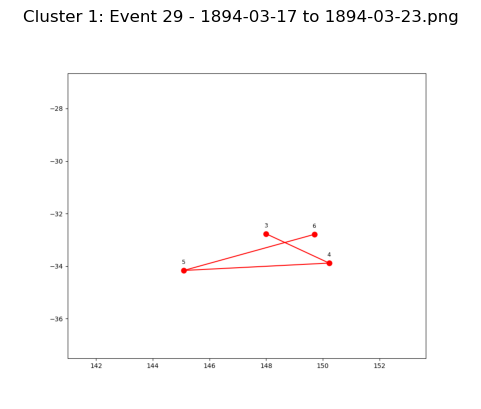

  Event 1100 - 1884-03-07 to 1884-03-13.png


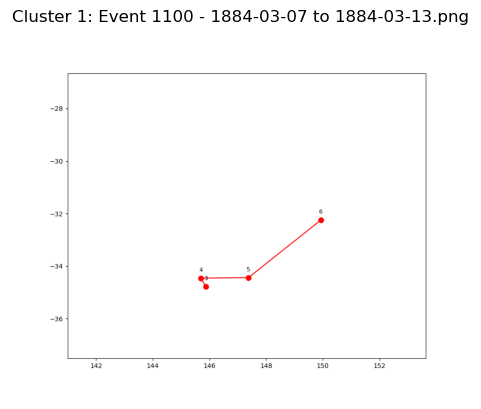

  Event 890 - 1894-10-04 to 1894-10-10.png


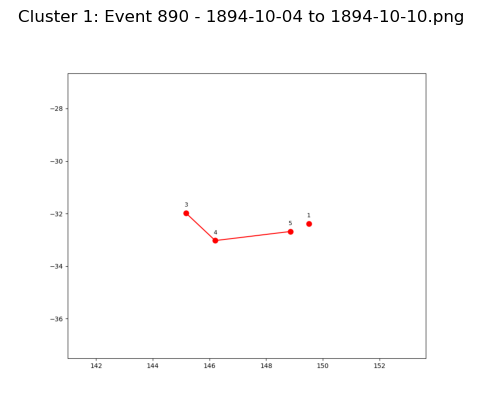

  Event 451 - 1889-05-18 to 1889-05-24.png


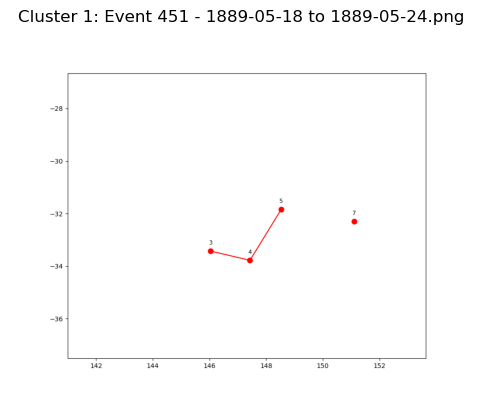

  Event 980 - 1887-04-30 to 1887-05-06.png


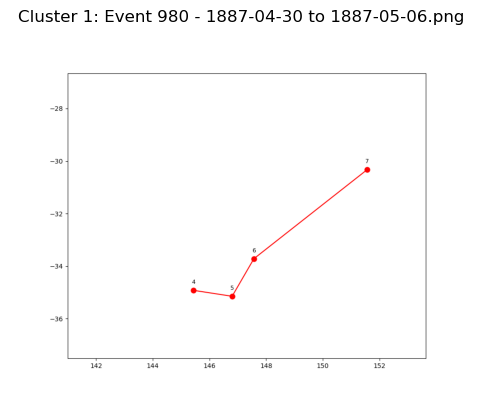

  Event 37 - 1899-04-02 to 1899-04-08.png


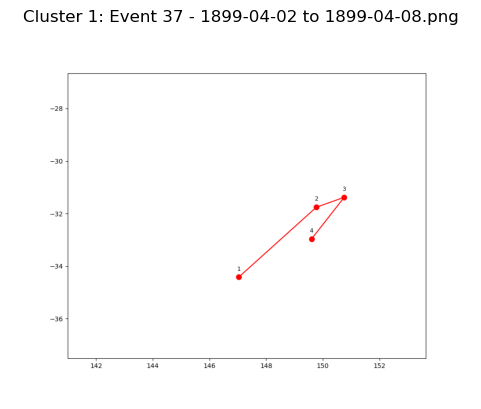

  Event 218 - 1890-04-25 to 1890-05-01.png


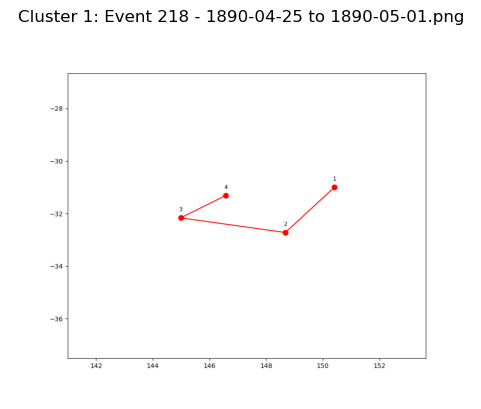

  Event 918 - 1888-11-15 to 1888-11-21.png


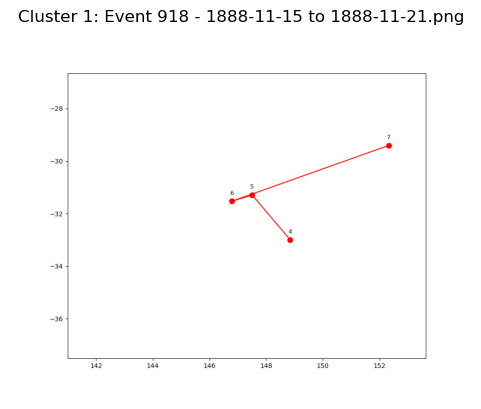

  Event 160 - 1887-11-30 to 1887-12-06.png


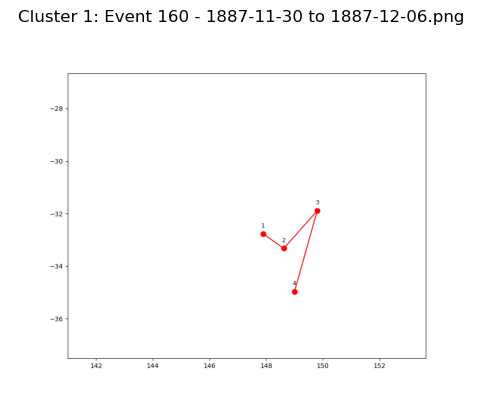

  Event 898 - 1886-10-01 to 1886-10-07.png


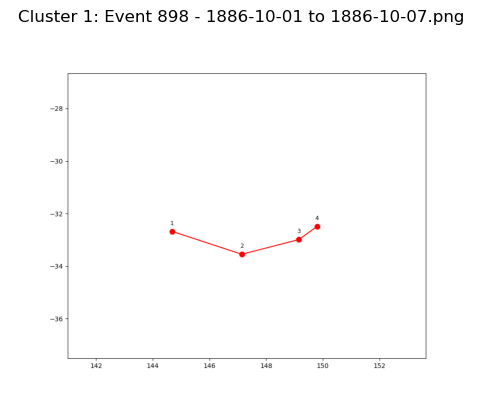

  Event 1094 - 1870-10-05 to 1870-10-11.png


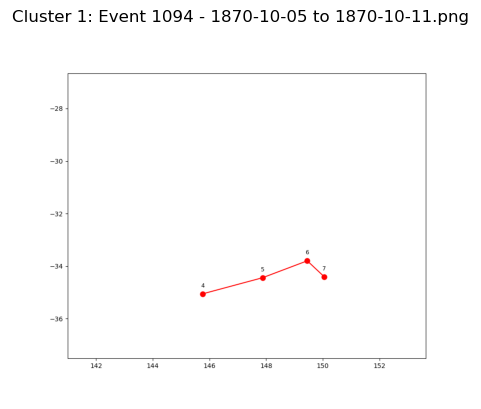

  Event 62 - 1890-04-21 to 1890-04-27.png


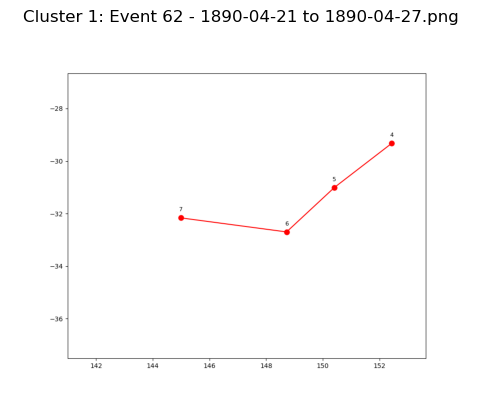

  Event 521 - 1887-08-22 to 1887-08-28.png


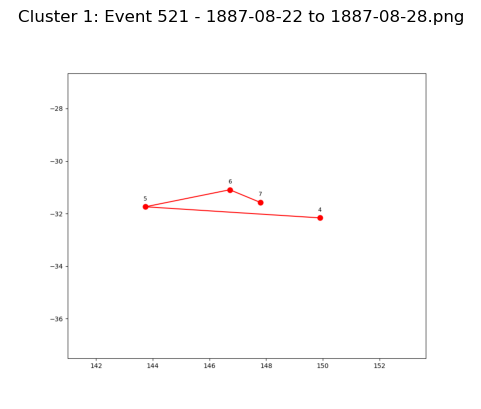

  Event 786 - 1871-12-29 to 1872-01-04.png


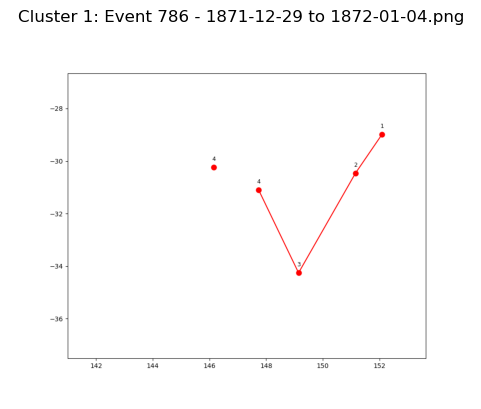

  Event 830 - 1885-03-27 to 1885-04-02.png


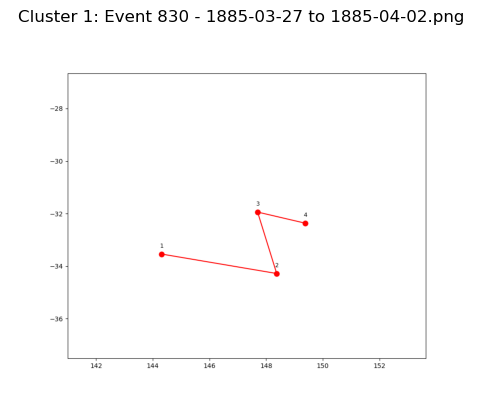

  Event 79 - 1887-01-31 to 1887-02-06.png


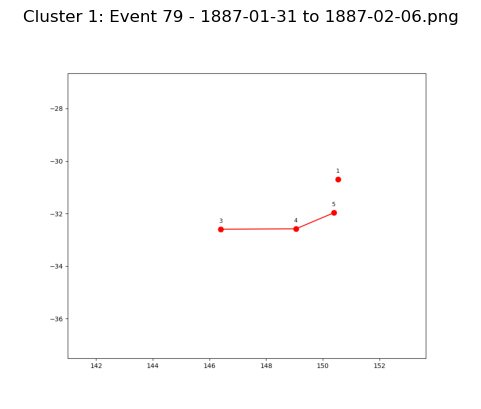

  Event 1025 - 1884-06-06 to 1884-06-12.png


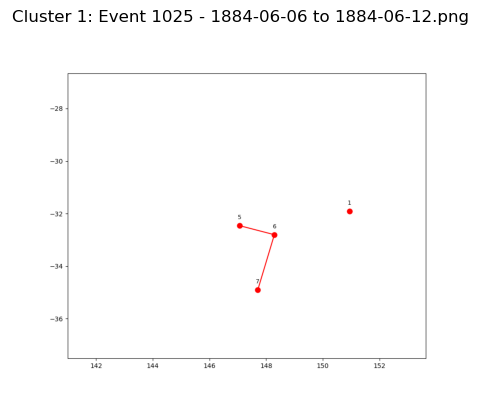

  Event 809 - 1873-09-02 to 1873-09-08.png


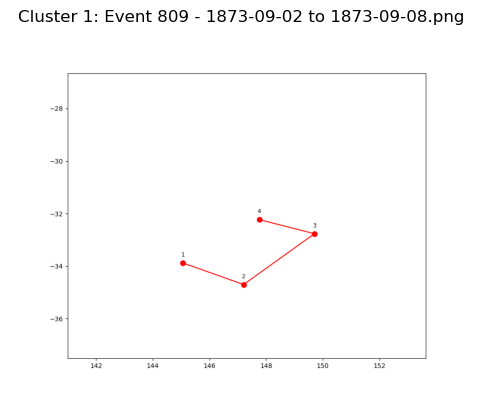

  Event 657 - 1889-08-26 to 1889-09-01.png


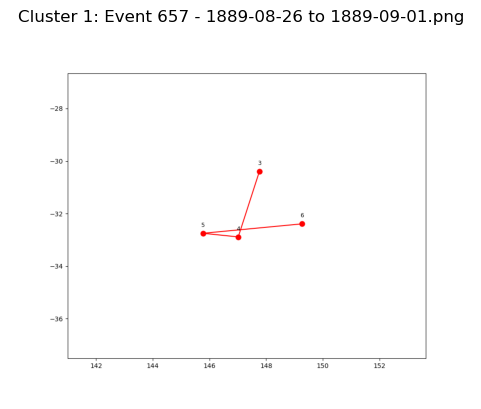

  Event 643 - 1885-02-14 to 1885-02-20.png


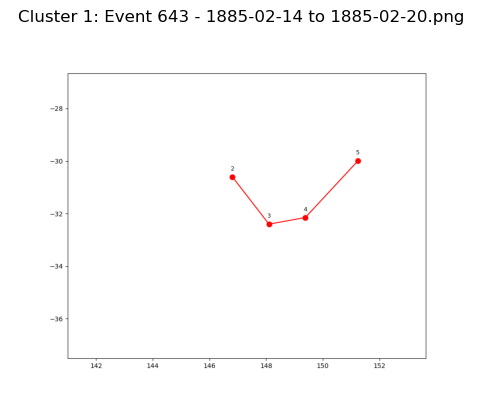

  Event 92 - 1899-05-26 to 1899-06-01.png


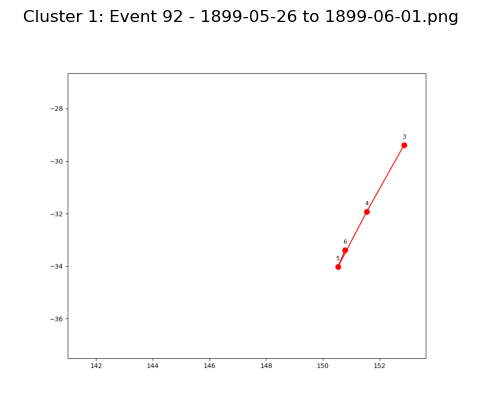

  Event 469 - 1897-10-08 to 1897-10-14.png


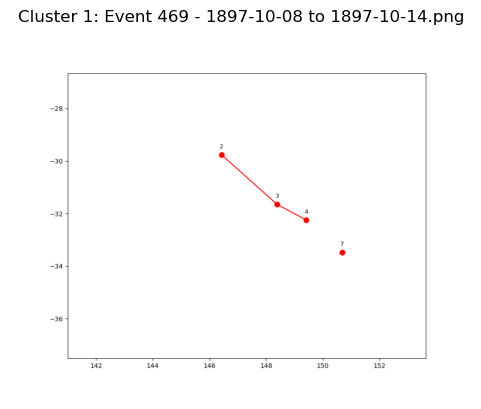

  Event 875 - 1892-01-05 to 1892-01-11.png


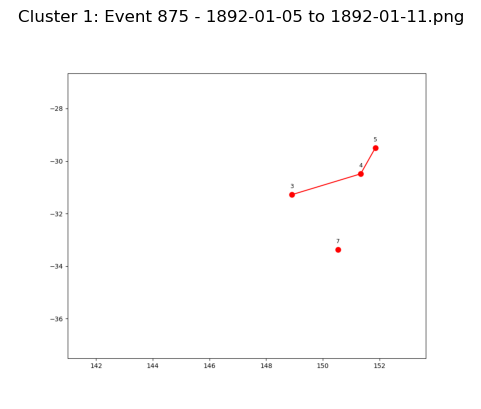

  Event 565 - 1884-04-22 to 1884-04-28.png


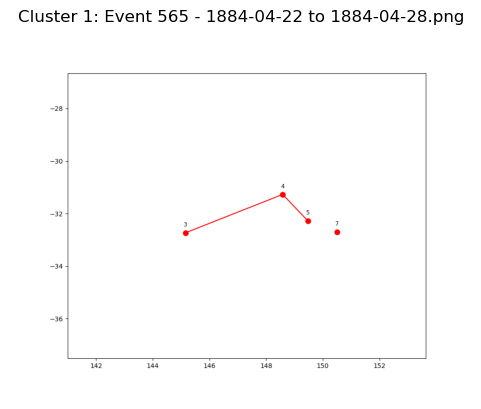

  Event 815 - 1877-06-07 to 1877-06-13.png


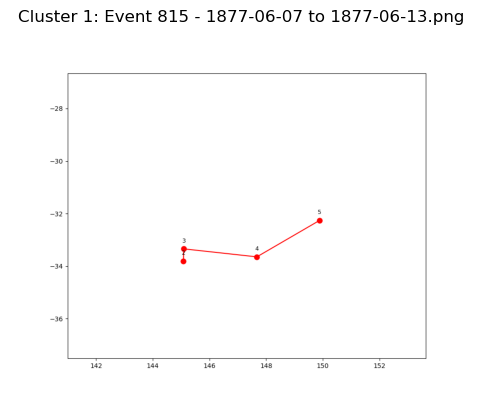

  Event 1028 - 1887-12-05 to 1887-12-11.png


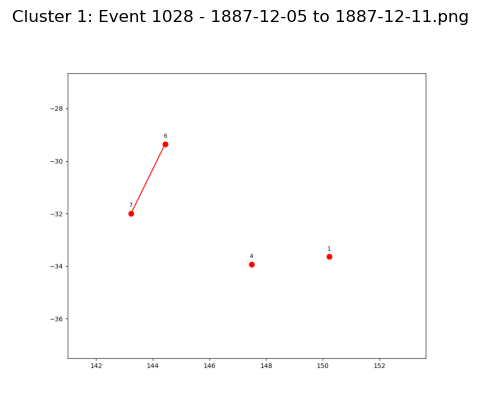

  Event 885 - 1871-06-16 to 1871-06-22.png


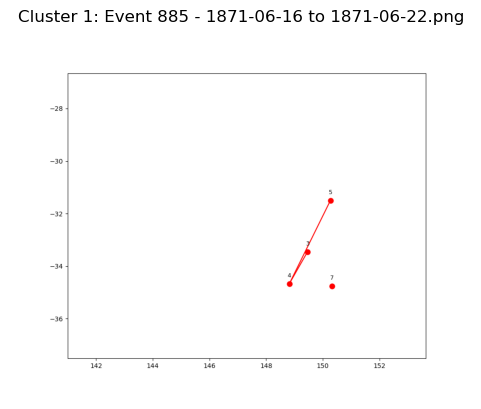

  Event 685 - 1897-06-16 to 1897-06-22.png


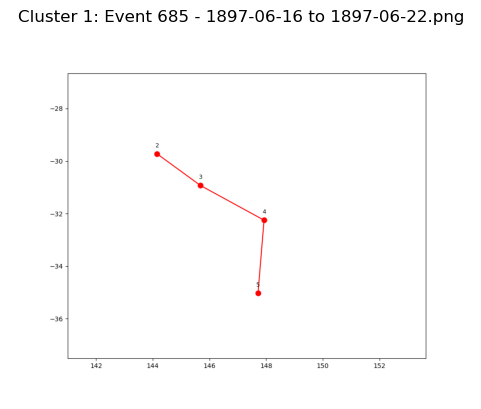

  Event 191 - 1894-07-20 to 1894-07-26.png


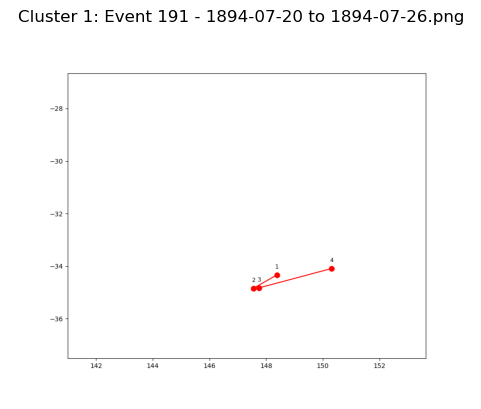

  Event 25 - 1892-03-02 to 1892-03-08.png


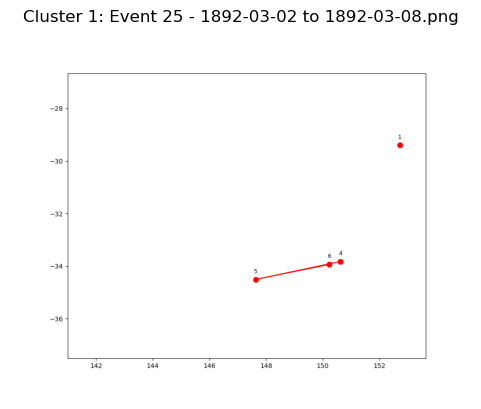

  Event 865 - 1895-01-10 to 1895-01-16.png


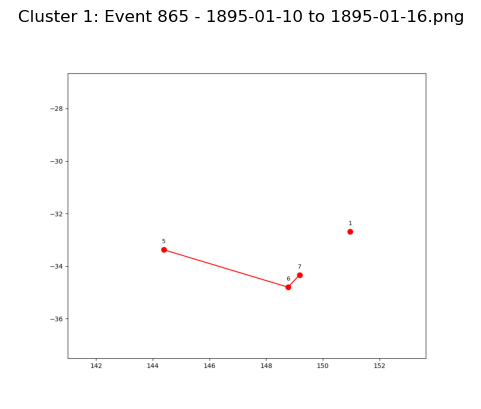

  Event 852 - 1886-12-06 to 1886-12-12.png


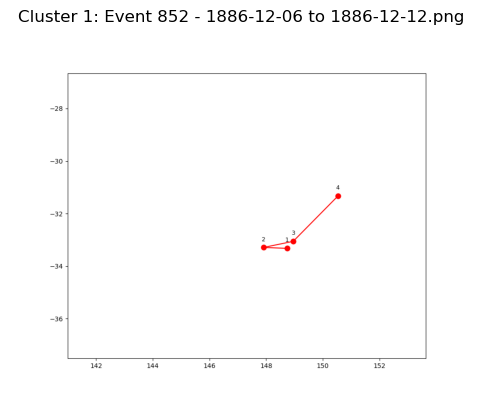

  Event 613 - 1869-05-16 to 1869-05-22.png


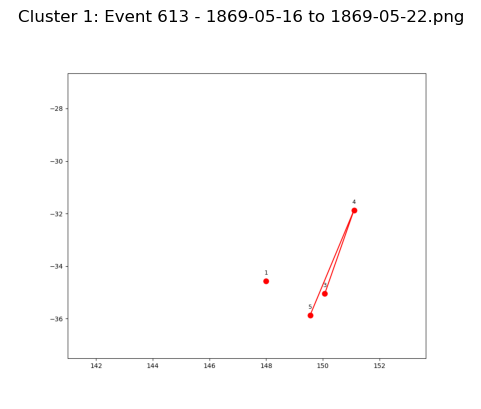

  Event 504 - 1883-06-20 to 1883-06-26.png


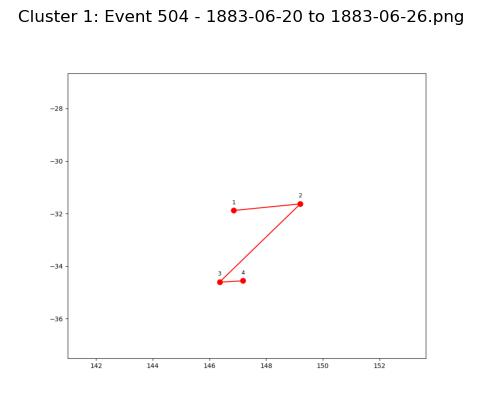

  Event 550 - 1879-11-17 to 1879-11-23.png


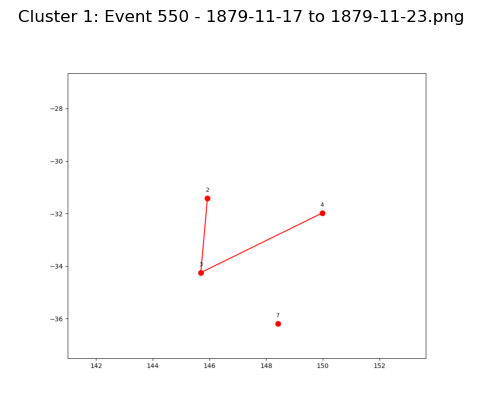

  Event 393 - 1882-12-05 to 1882-12-11.png


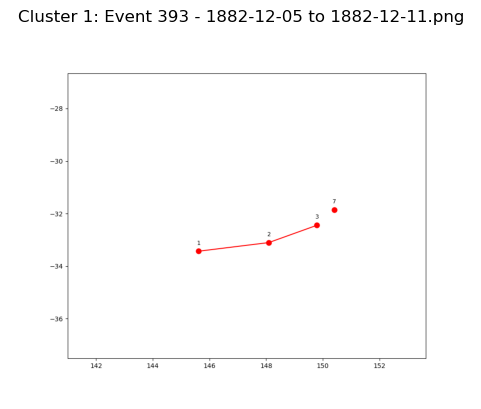

  Event 436 - 1899-10-12 to 1899-10-18.png


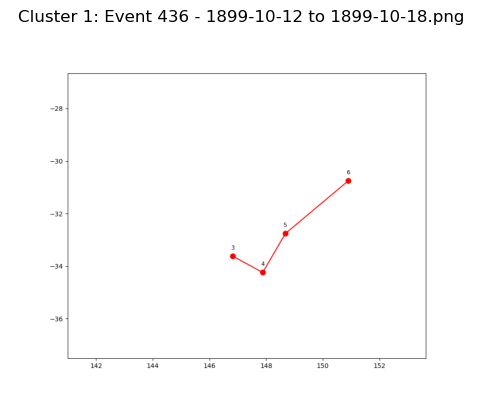

  Event 929 - 1891-07-23 to 1891-07-29.png


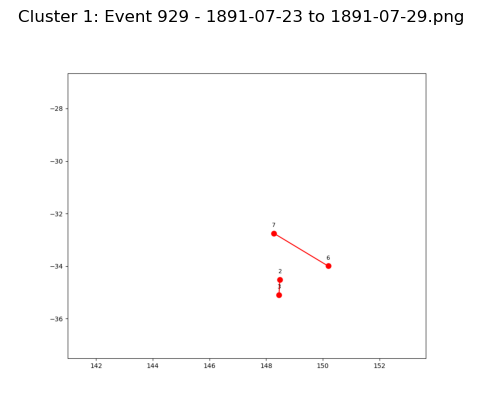

  Event 58 - 1887-07-10 to 1887-07-16.png


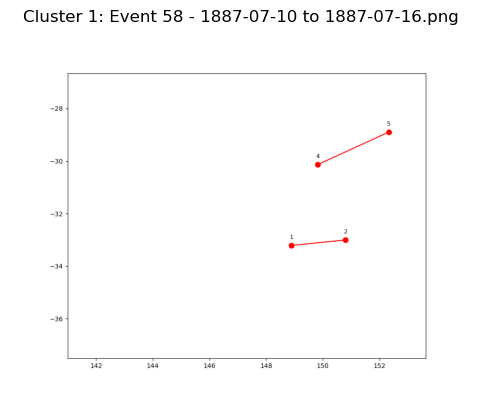

  Event 317 - 1884-05-22 to 1884-05-28.png


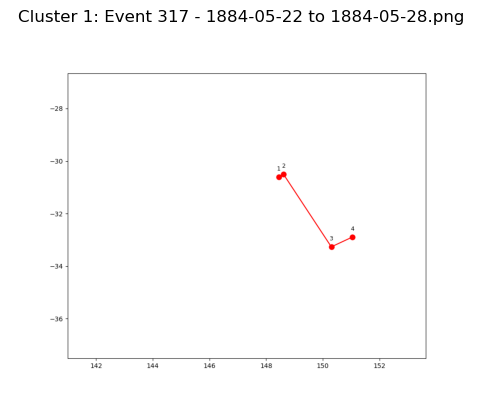

  Event 476 - 1890-10-18 to 1890-10-24.png


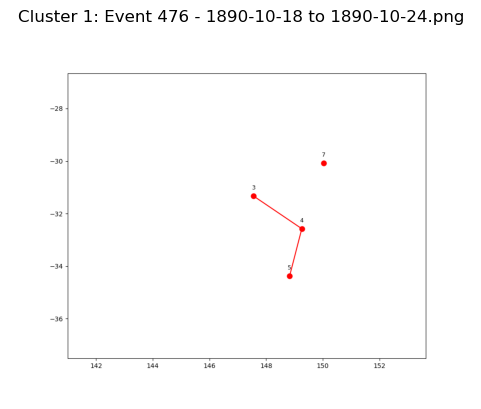

  Event 155 - 1878-02-03 to 1878-02-09.png


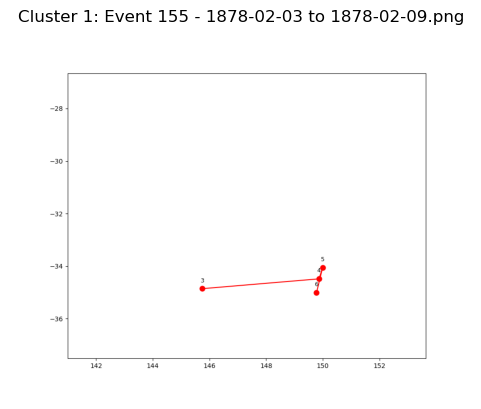

  Event 435 - 1893-05-25 to 1893-05-31.png


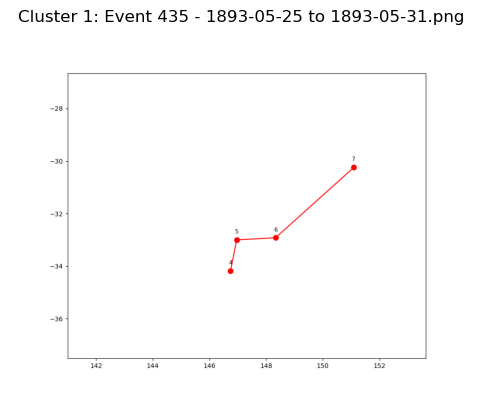

  Event 715 - 1890-06-04 to 1890-06-10.png


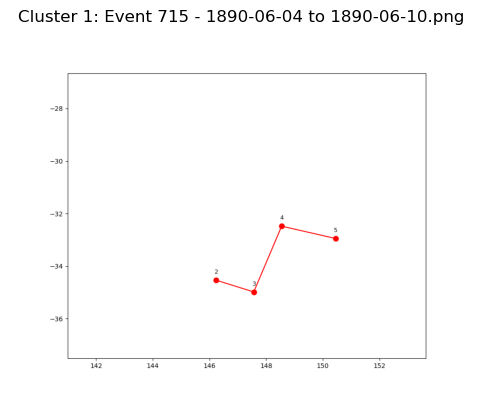

  Event 602 - 1899-02-25 to 1899-03-03.png


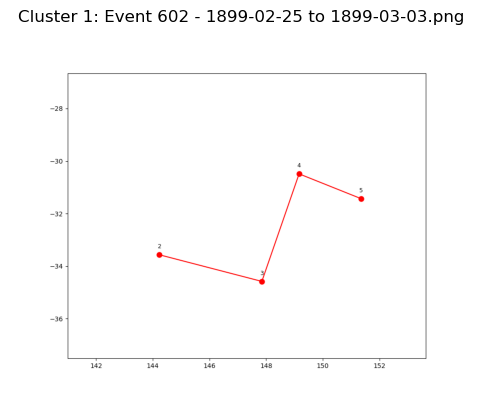

  Event 615 - 1870-08-10 to 1870-08-16.png


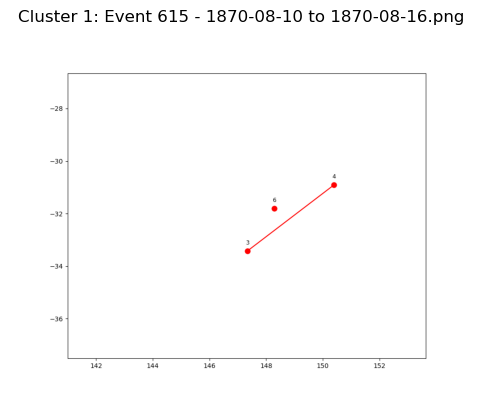

  Event 512 - 1884-11-14 to 1884-11-20.png


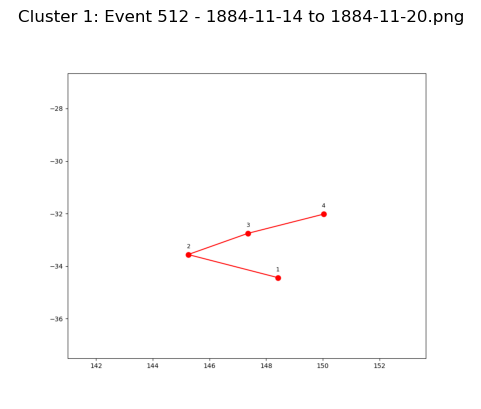

  Event 627 - 1883-10-25 to 1883-10-31.png


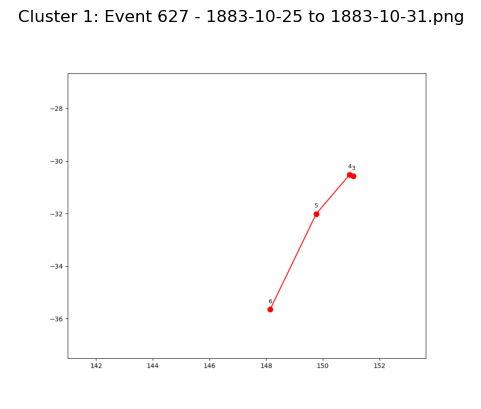

  Event 619 - 1875-02-11 to 1875-02-17.png


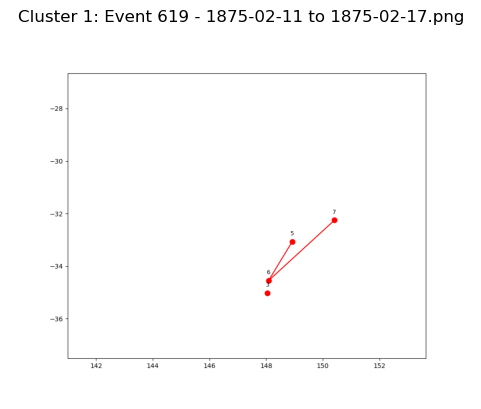

  Event 480 - 1868-05-16 to 1868-05-22.png


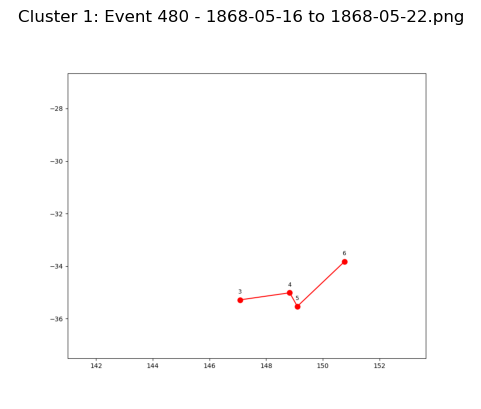

  Event 543 - 1877-03-25 to 1877-03-31.png


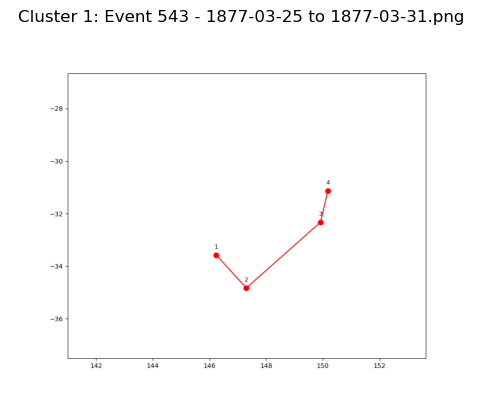

  Event 694 - 1875-03-26 to 1875-04-01.png


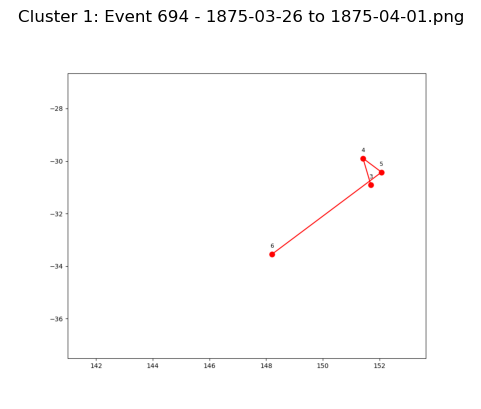

  Event 515 - 1885-09-11 to 1885-09-17.png


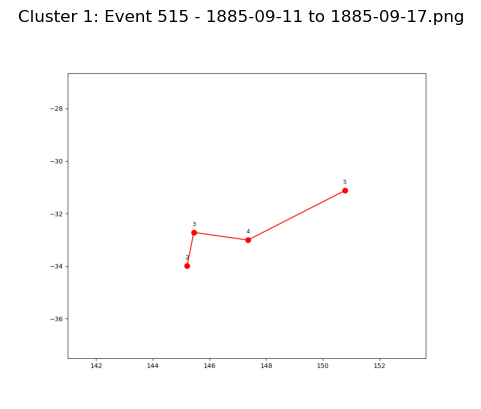

  Event 1088 - 1870-07-14 to 1870-07-20.png


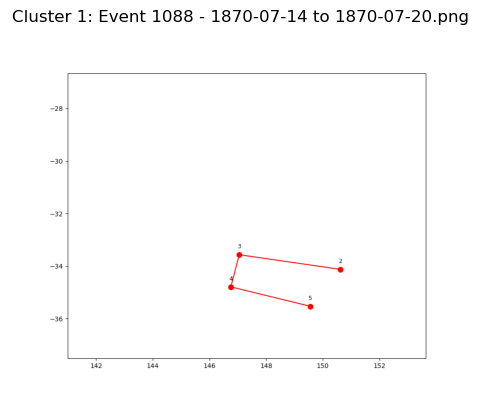

  Event 1036 - 1875-10-17 to 1875-10-23.png


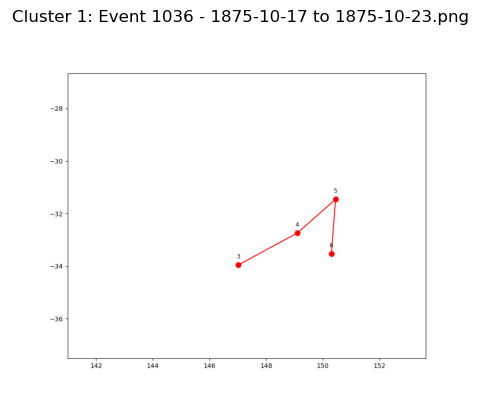

  Event 915 - 1887-06-27 to 1887-07-03.png


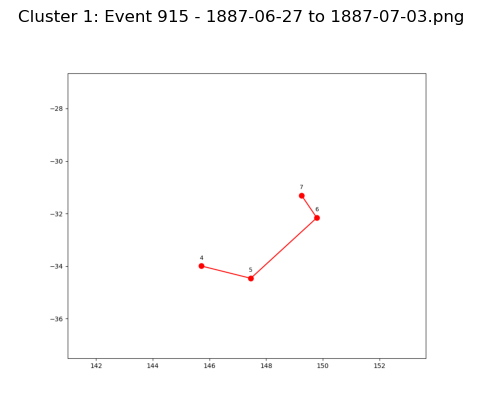

  Event 979 - 1887-01-01 to 1887-01-07.png


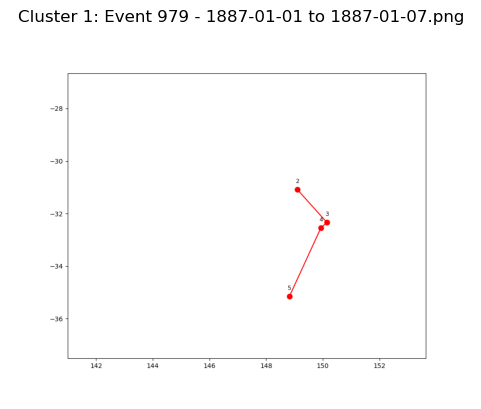

  Event 422 - 1880-04-21 to 1880-04-27.png


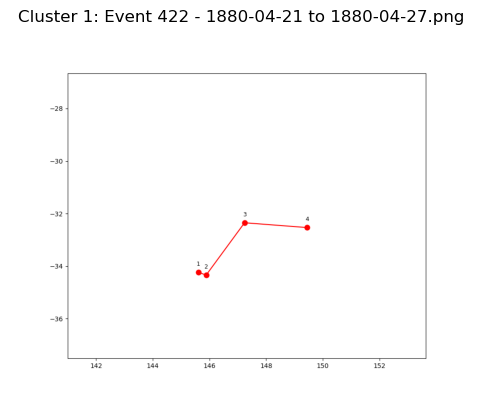

  Event 951 - 1859-06-06 to 1859-06-12.png


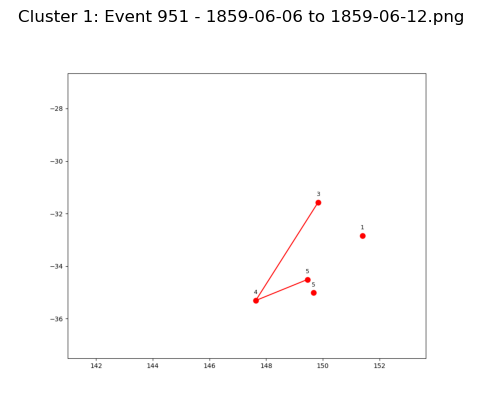

  Event 567 - 1883-03-17 to 1883-03-23.png


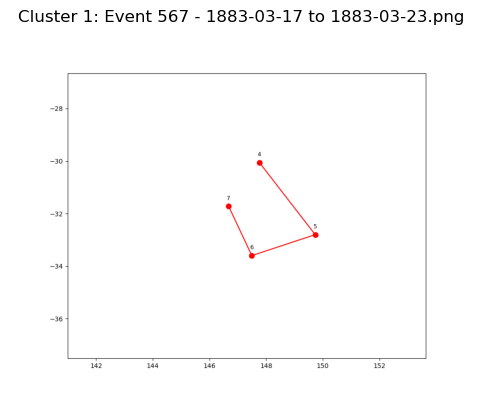

  Event 80 - 1887-03-13 to 1887-03-19.png


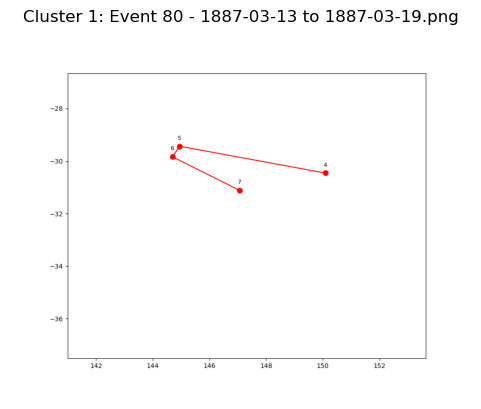

  Event 970 - 1896-01-19 to 1896-01-25.png


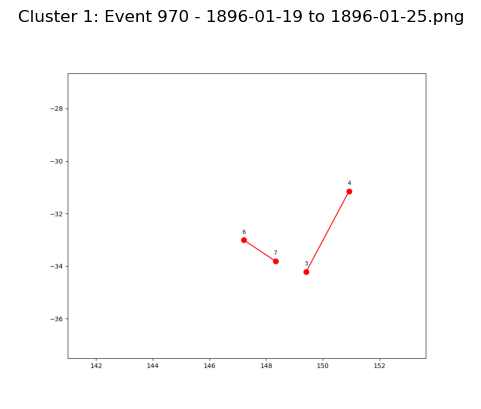

  Event 609 - 1882-07-05 to 1882-07-11.png


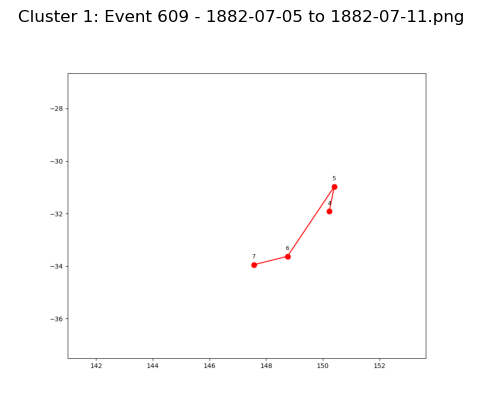

  Event 508 - 1883-11-09 to 1883-11-15.png


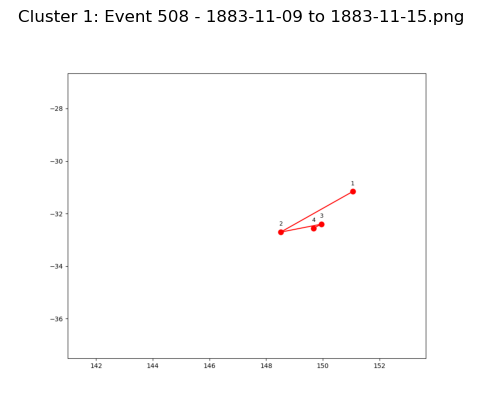

  Event 641 - 1883-10-12 to 1883-10-18.png


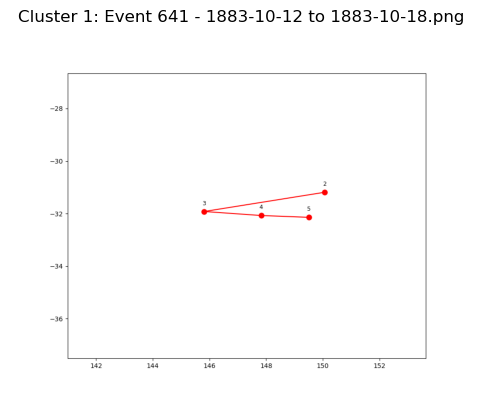

  Event 653 - 1894-06-19 to 1894-06-25.png


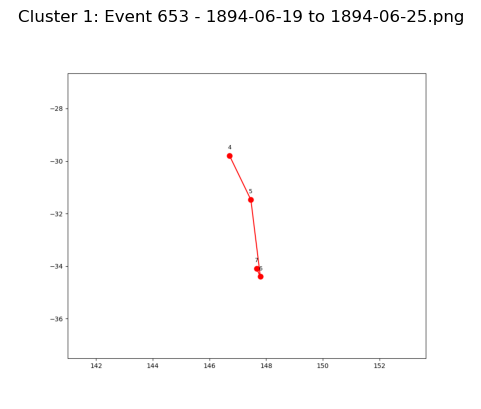

  Event 552 - 1884-07-18 to 1884-07-24.png


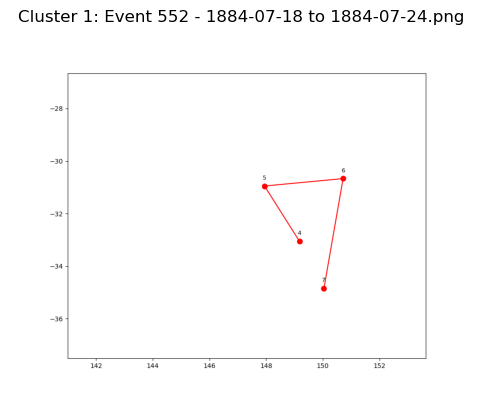

  Event 477 - 1894-02-05 to 1894-02-11.png


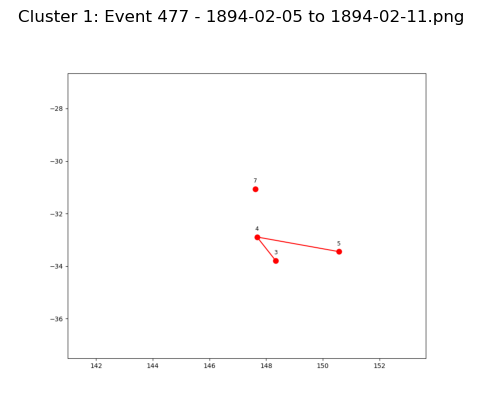

  Event 849 - 1882-11-24 to 1882-11-30.png


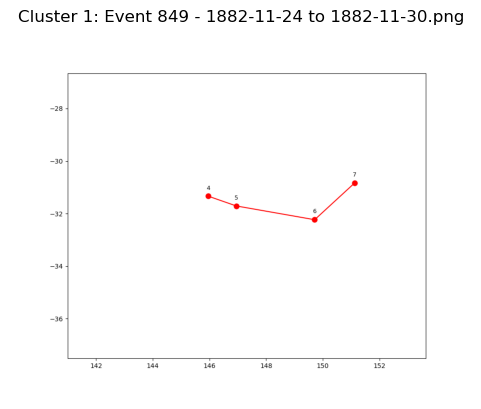

  Event 879 - 1894-08-18 to 1894-08-24.png


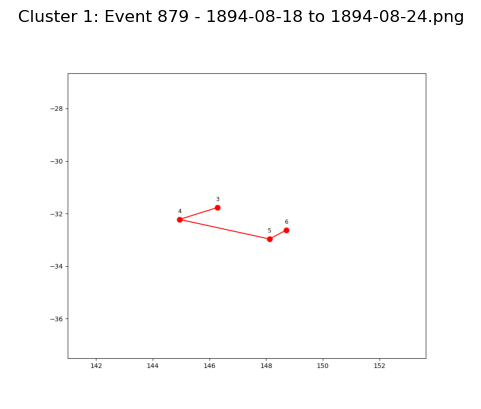

  Event 56 - 1887-01-18 to 1887-01-24.png


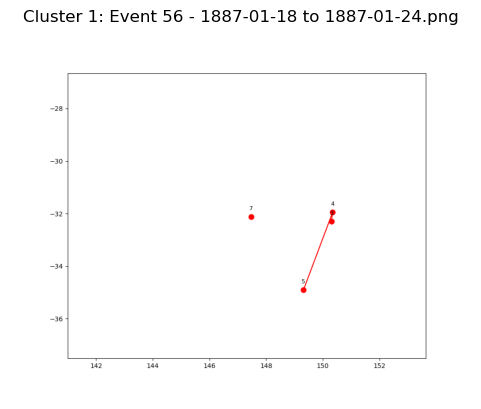

  Event 768 - 1893-06-12 to 1893-06-18.png


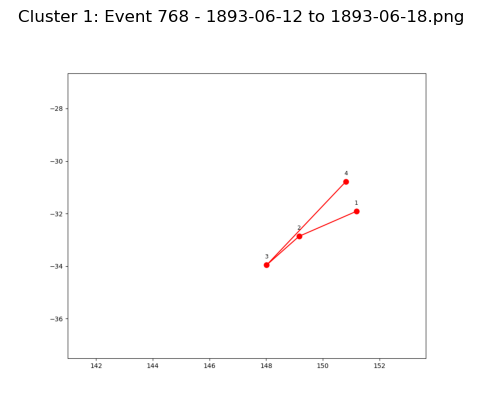

  Event 977 - 1892-08-20 to 1892-08-26.png


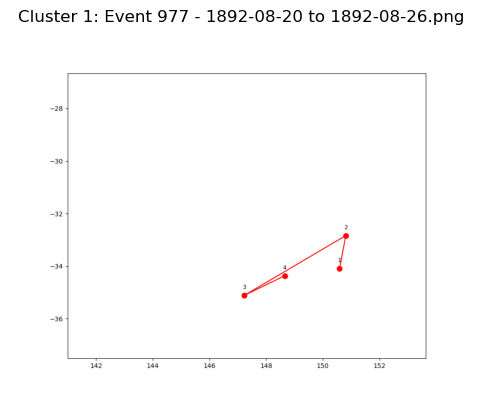

  Event 570 - 1887-03-17 to 1887-03-23.png


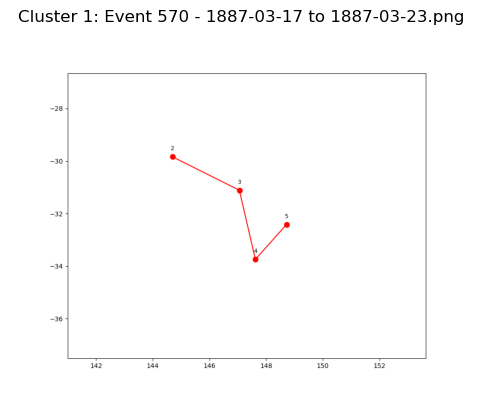

  Event 57 - 1887-03-24 to 1887-03-30.png


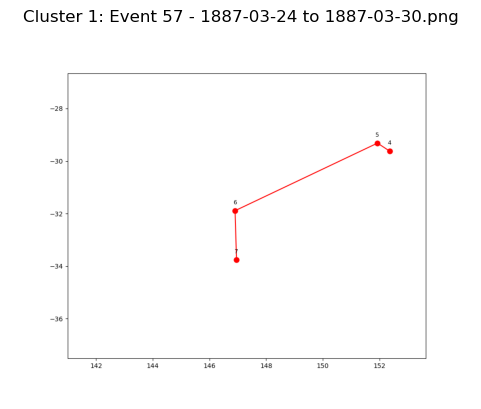

  Event 1014 - 1880-11-21 to 1880-11-27.png


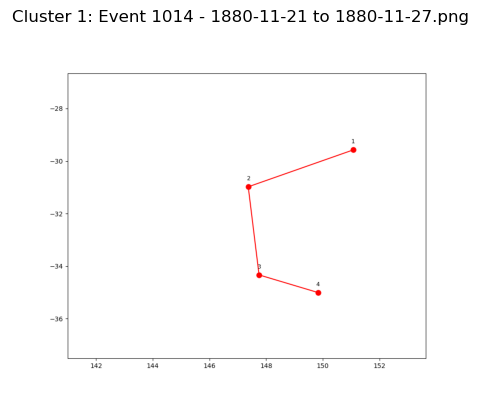

  Event 311 - 1881-02-22 to 1881-02-28.png


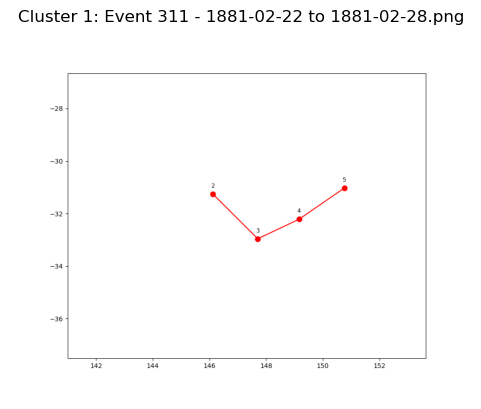

  Event 1005 - 1879-01-02 to 1879-01-08.png


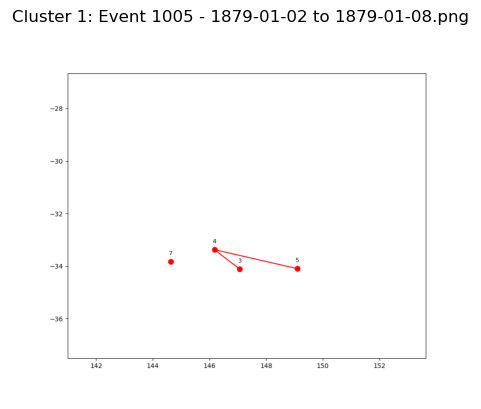

  Event 158 - 1880-07-16 to 1880-07-22.png


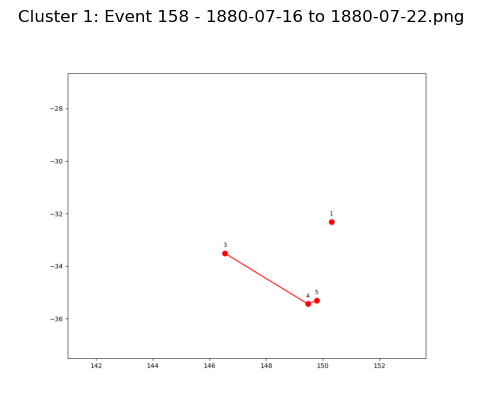

  Event 1064 - 1863-10-10 to 1863-10-16.png


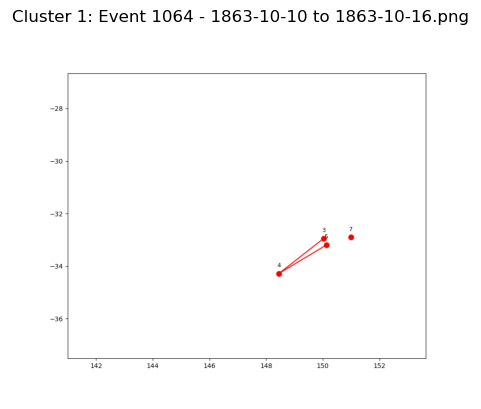

  Event 124 - 1879-06-22 to 1879-06-28.png


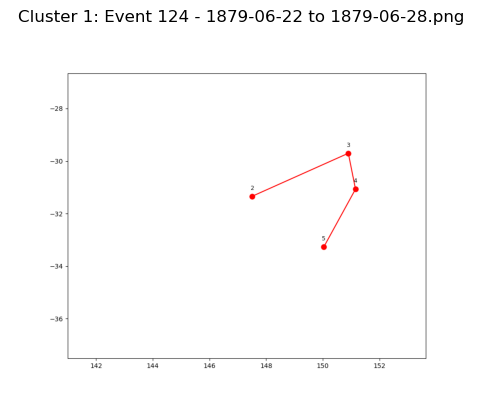

  Event 731 - 1870-10-27 to 1870-11-02.png


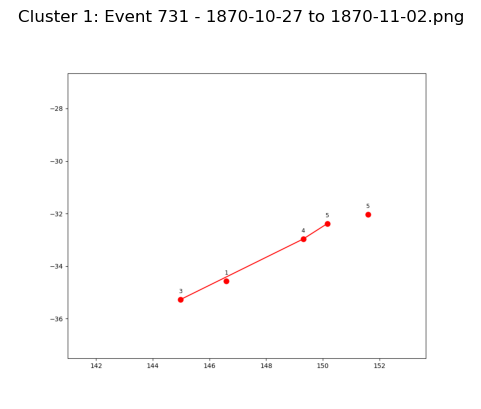

  Event 829 - 1880-05-23 to 1880-05-29.png


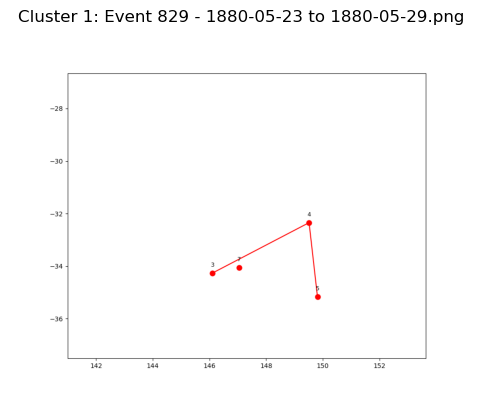

  Event 701 - 1870-10-17 to 1870-10-23.png


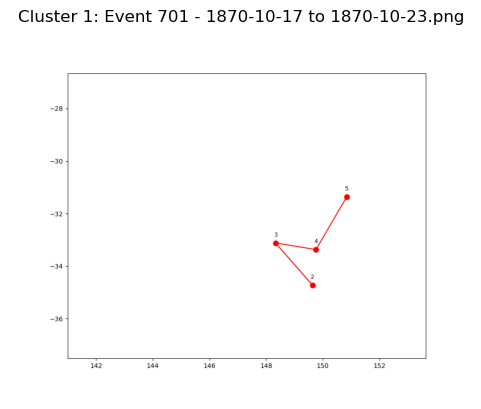

  Event 151 - 1897-02-02 to 1897-02-08.png


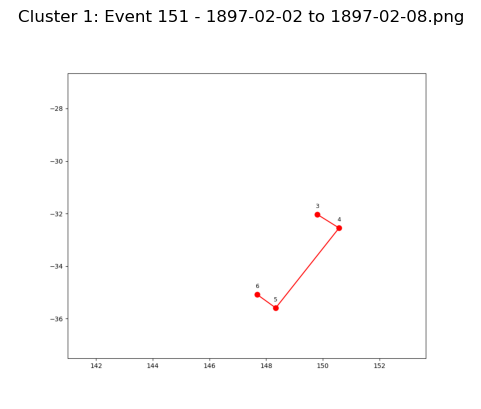

  Event 721 - 1884-01-18 to 1884-01-24.png


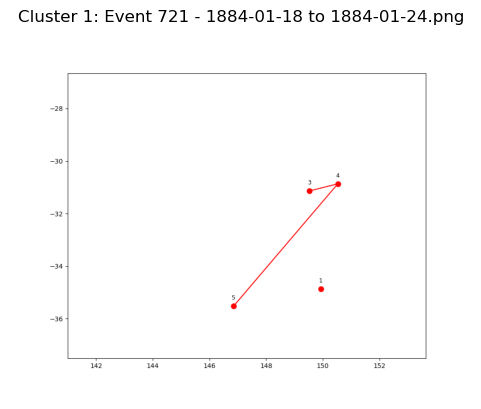

  Event 591 - 1882-11-16 to 1882-11-22.png


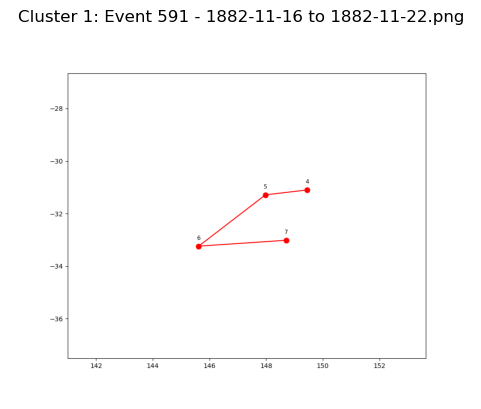

  Event 636 - 1891-09-10 to 1891-09-16.png


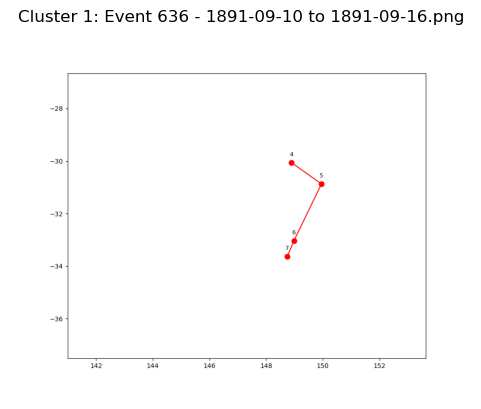

  Event 532 - 1894-09-07 to 1894-09-13.png


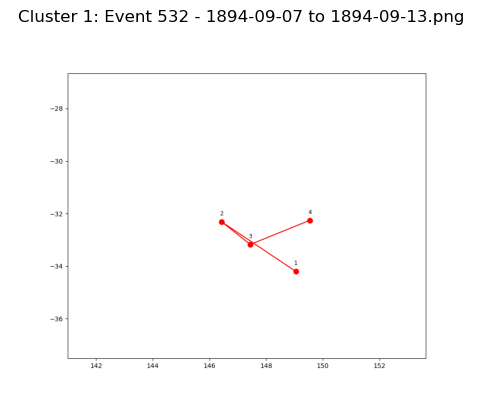

  Event 744 - 1878-12-20 to 1878-12-26.png


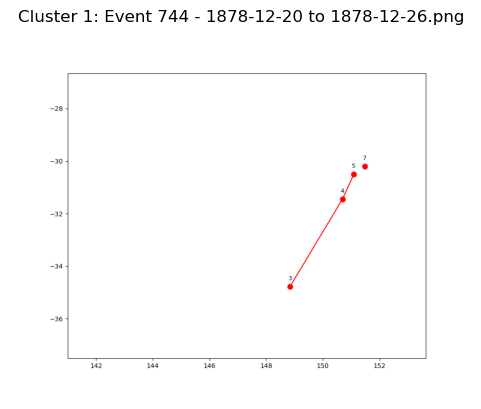

  Event 900 - 1896-05-01 to 1896-05-07.png


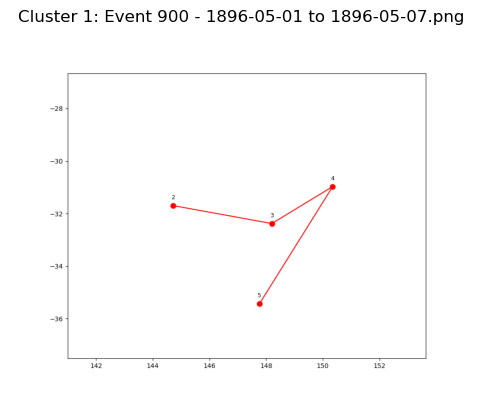

  Event 462 - 1891-01-07 to 1891-01-13.png


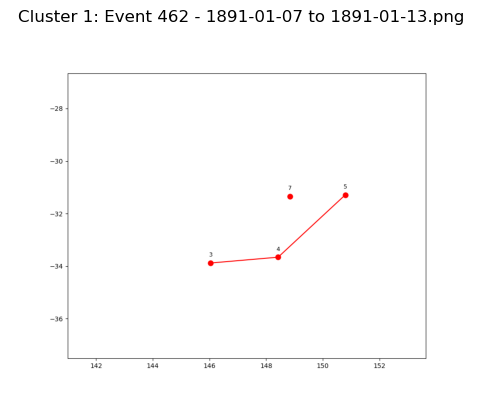

  Event 695 - 1877-03-01 to 1877-03-07.png


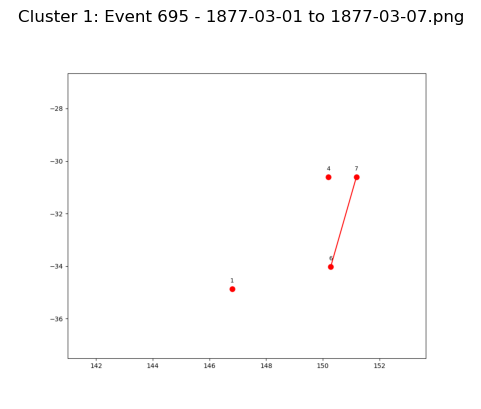

  Event 810 - 1874-02-07 to 1874-02-13.png


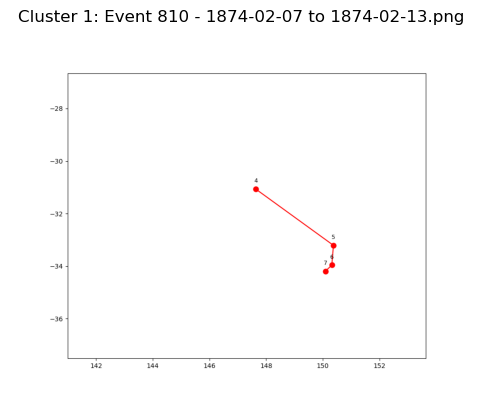

  Event 281 - 1867-06-17 to 1867-06-23.png


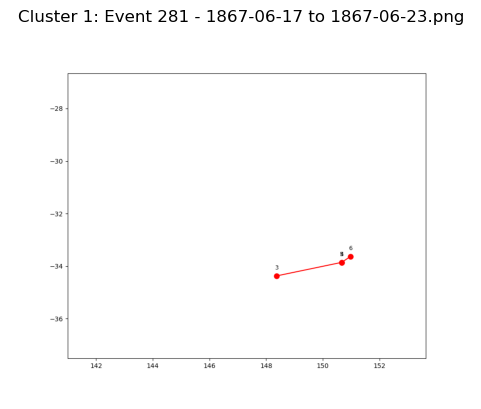

  Event 762 - 1894-05-12 to 1894-05-18.png


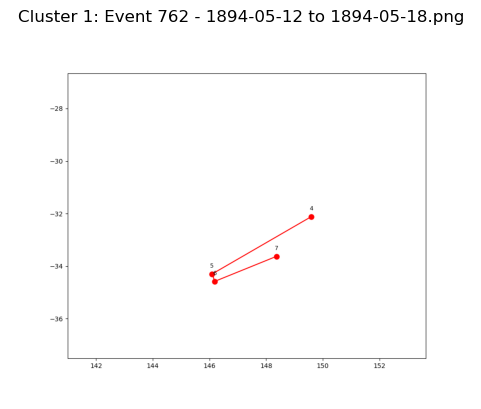

  Event 630 - 1888-01-28 to 1888-02-03.png


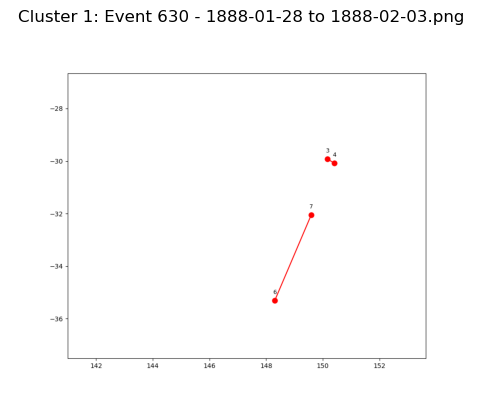

  Event 1040 - 1887-08-17 to 1887-08-23.png


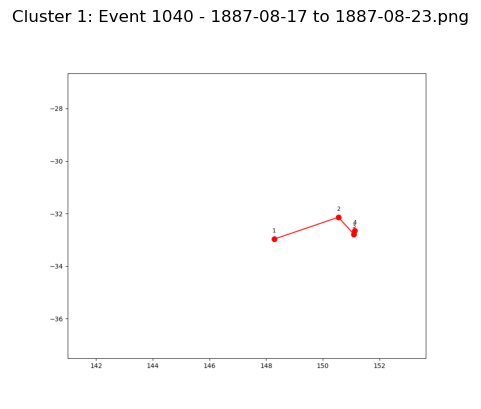

  Event 793 - 1872-11-10 to 1872-11-16.png


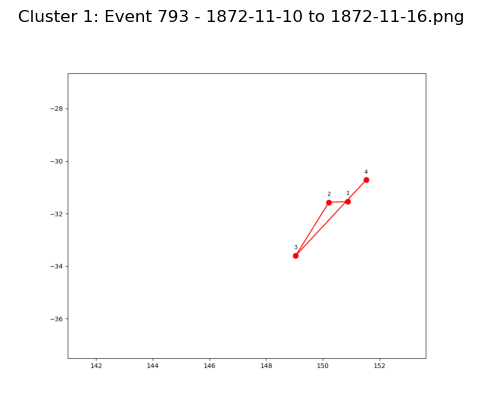

  Event 845 - 1897-10-04 to 1897-10-10.png


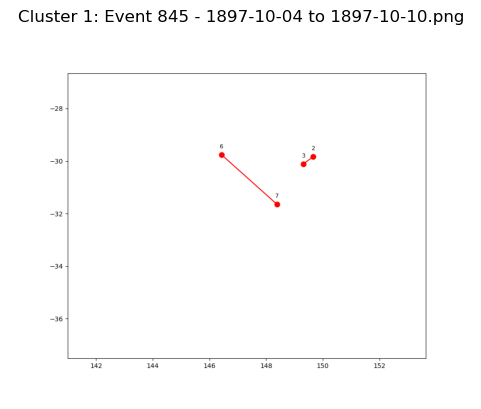

  Event 777 - 1892-07-01 to 1892-07-07.png


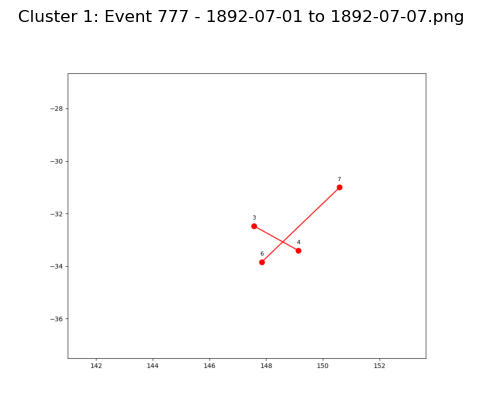

  Event 940 - 1863-10-21 to 1863-10-27.png


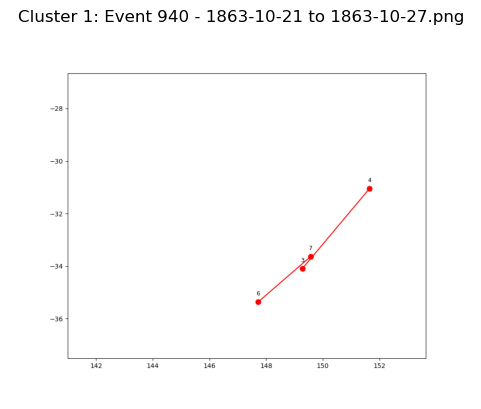

  Event 1008 - 1876-05-26 to 1876-06-01.png


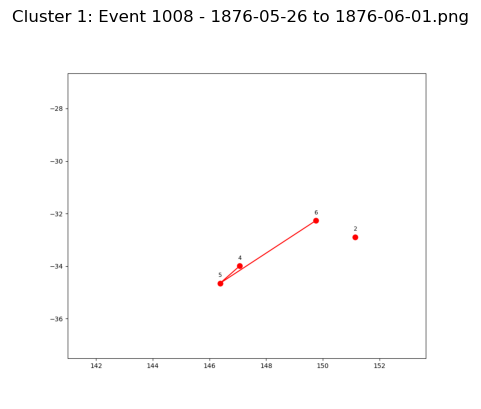

  Event 385 - 1900-10-26 to 1900-11-01.png


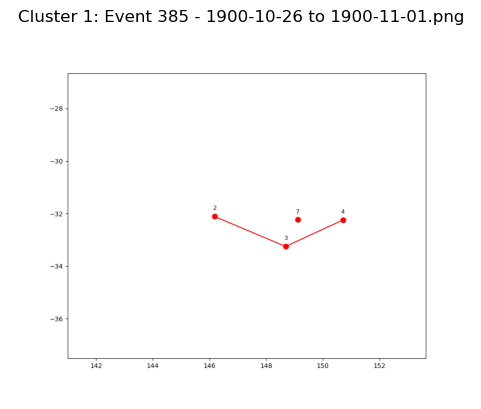

  Event 921 - 1876-11-12 to 1876-11-18.png


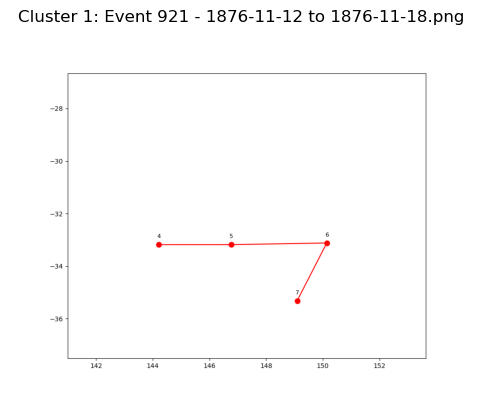

  Event 147 - 1892-05-20 to 1892-05-26.png


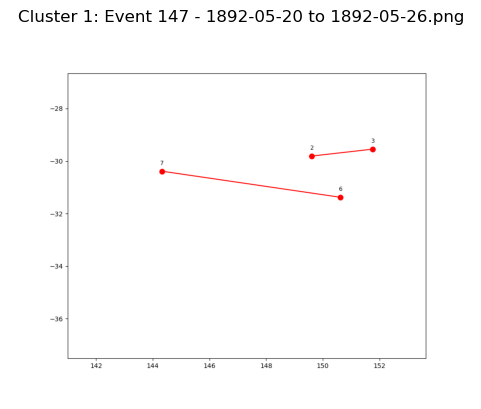

  Event 245 - 1879-09-01 to 1879-09-07.png


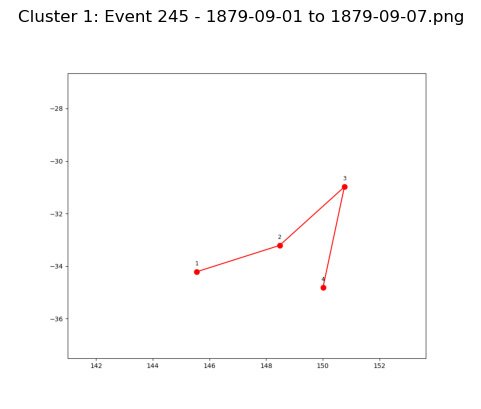

  Event 632 - 1889-04-20 to 1889-04-26.png


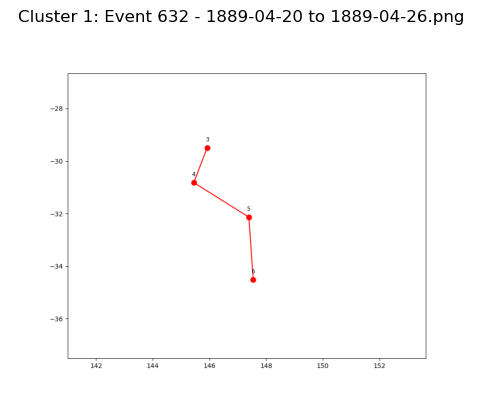

  Event 956 - 1860-10-17 to 1860-10-23.png


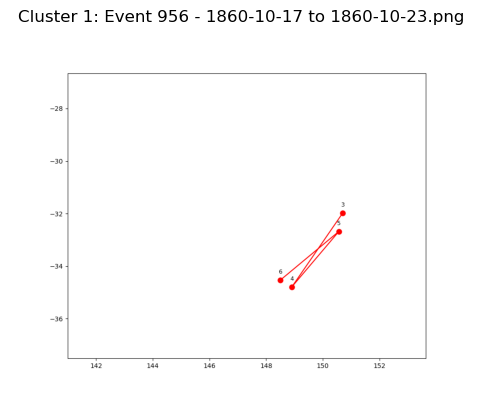

  Event 130 - 1882-11-28 to 1882-12-04.png


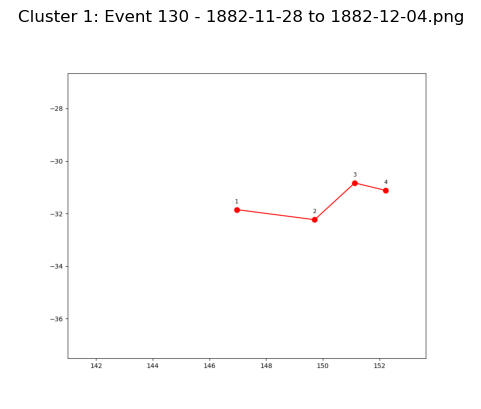

  Event 439 - 1890-03-16 to 1890-03-22.png


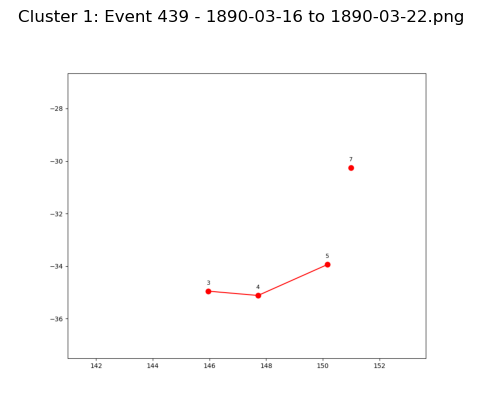

  Event 450 - 1895-01-24 to 1895-01-30.png


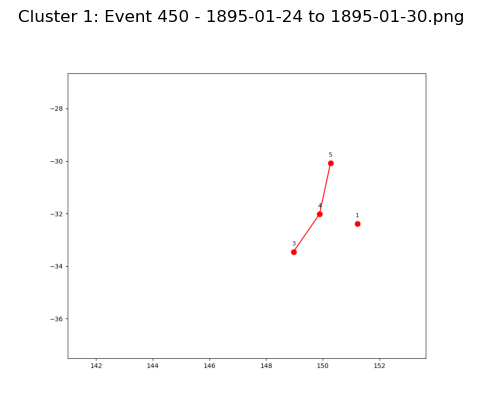

  Event 623 - 1893-11-11 to 1893-11-17.png


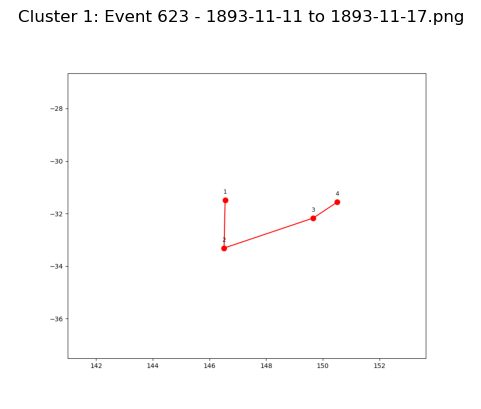

  Event 700 - 1899-01-16 to 1899-01-22.png


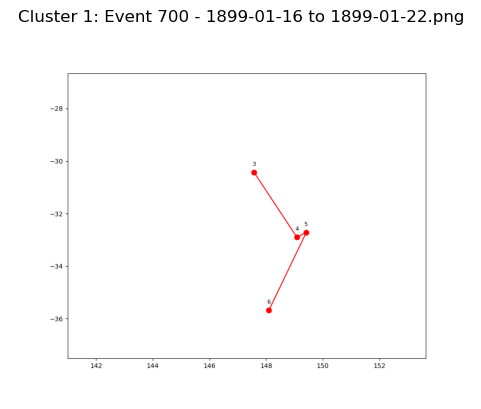

  Event 531 - 1892-11-04 to 1892-11-10.png


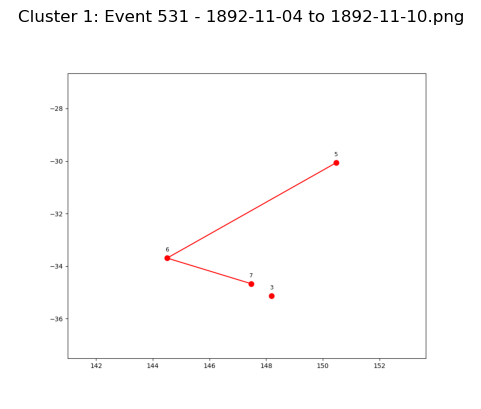

  Event 961 - 1875-08-28 to 1875-09-03.png


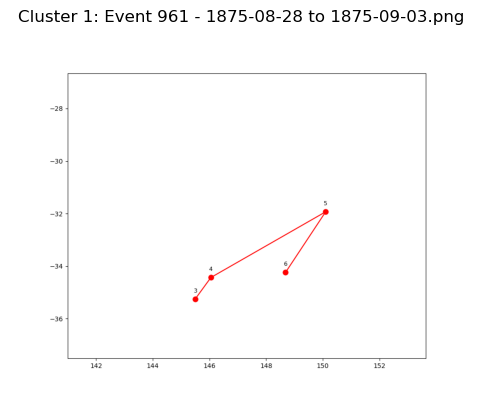

  Event 759 - 1879-02-10 to 1879-02-16.png


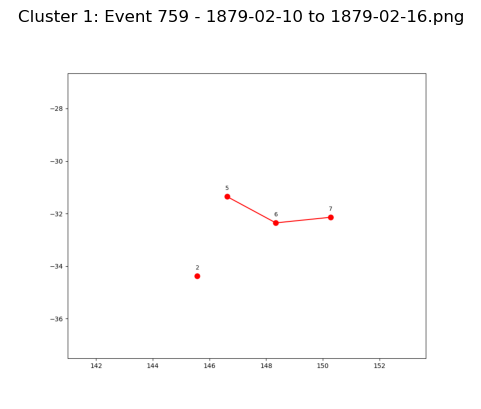

  Event 4 - 1890-03-04 to 1890-03-10.png


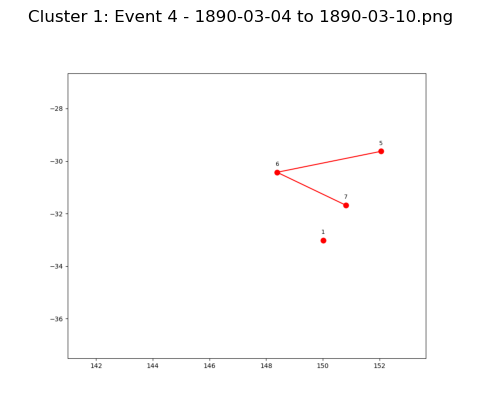

  Event 530 - 1891-07-10 to 1891-07-16.png


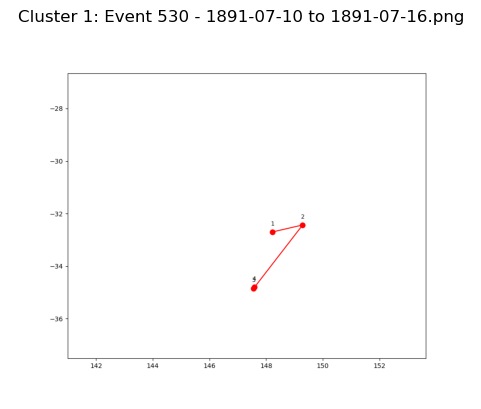

  Event 984 - 1891-08-23 to 1891-08-29.png


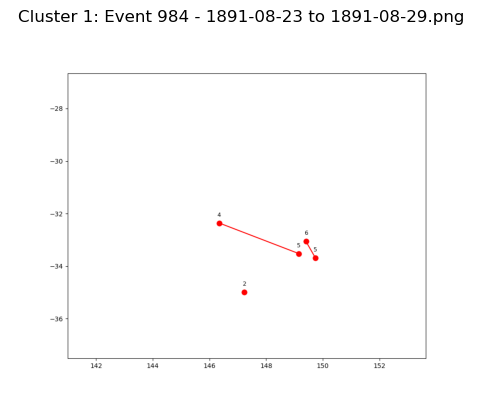

  Event 380 - 1894-12-06 to 1894-12-12.png


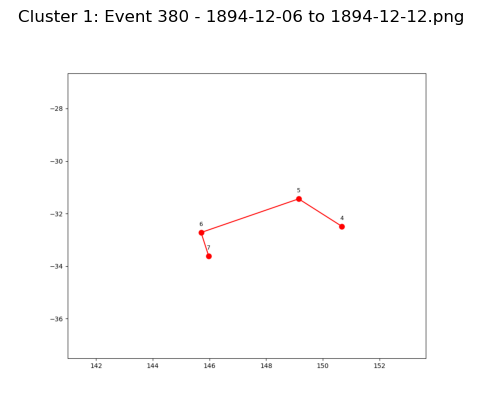

  Event 514 - 1885-06-12 to 1885-06-18.png


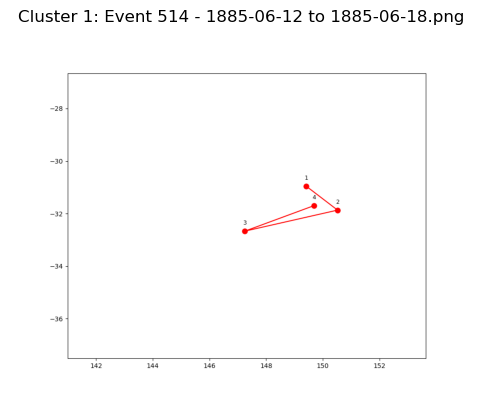

  Event 887 - 1897-02-12 to 1897-02-18.png


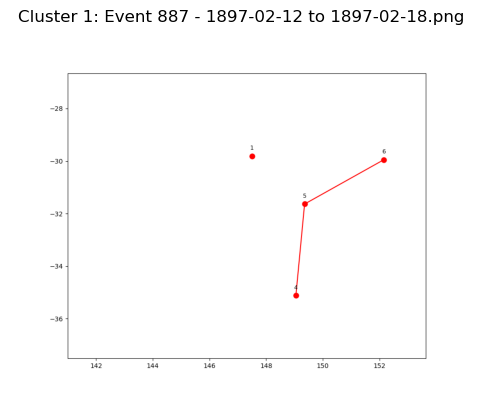

  Event 571 - 1894-01-03 to 1894-01-09.png


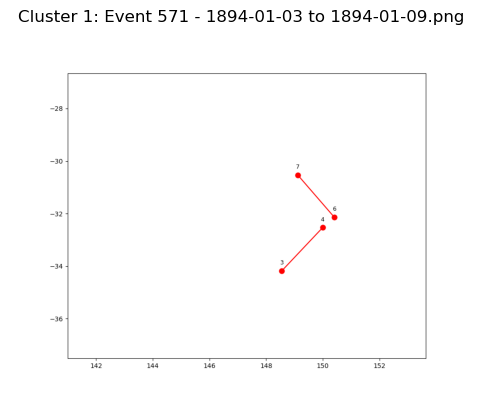

  Event 999 - 1882-06-15 to 1882-06-21.png


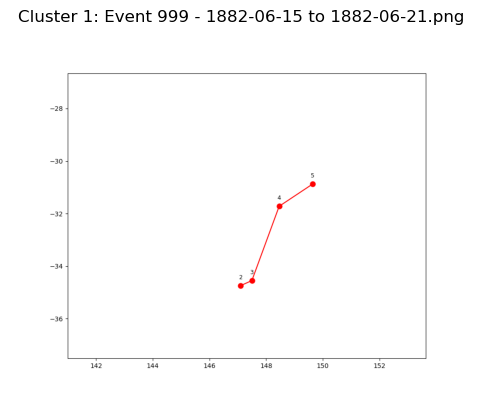

  Event 985 - 1886-09-18 to 1886-09-24.png


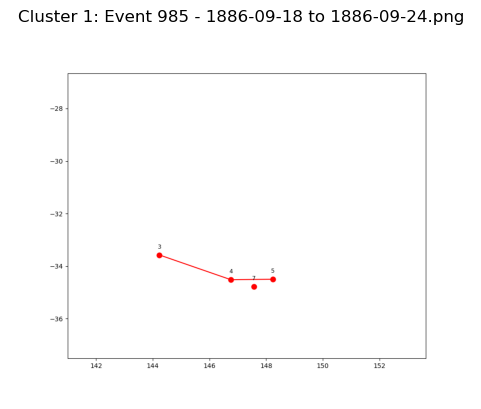

  Event 61 - 1892-06-12 to 1892-06-18.png


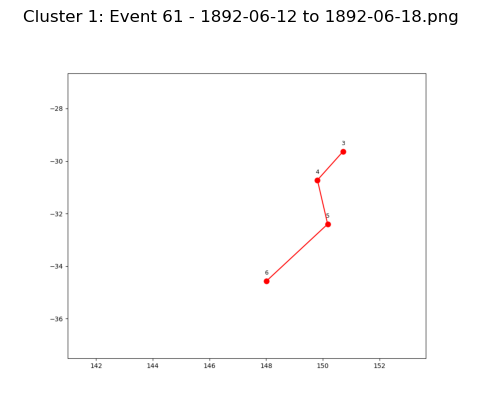

  Event 165 - 1884-04-18 to 1884-04-24.png


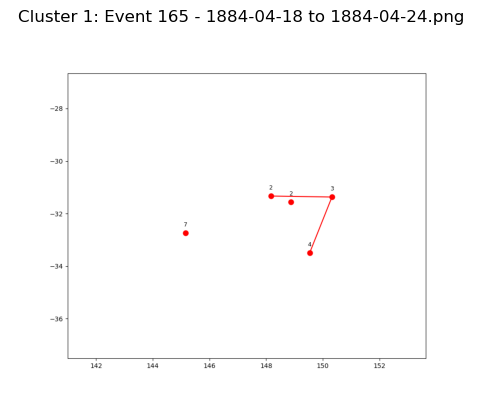

  Event 838 - 1886-11-26 to 1886-12-02.png


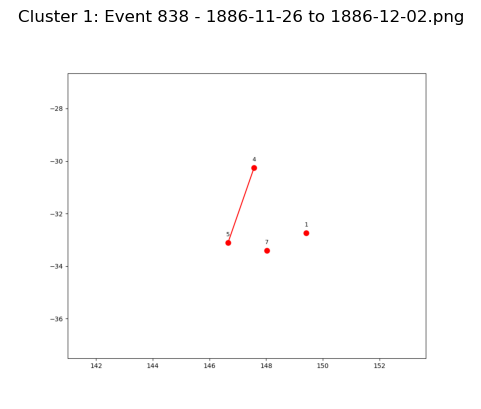

  Event 303 - 1879-04-07 to 1879-04-13.png


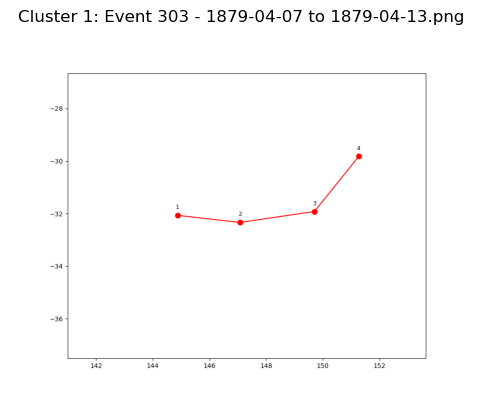

  Event 396 - 1881-01-09 to 1881-01-15.png


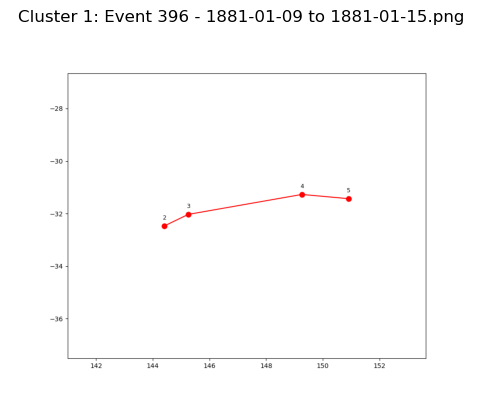

  Event 329 - 1891-08-03 to 1891-08-09.png


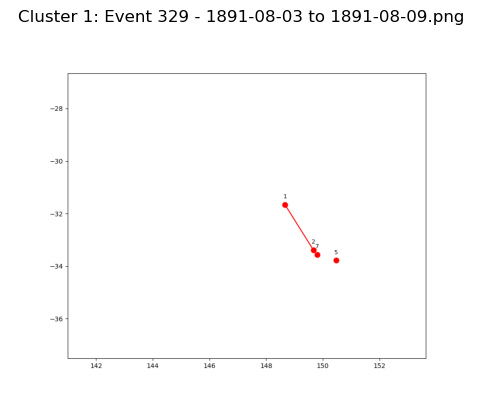

  Event 656 - 1895-12-01 to 1895-12-07.png


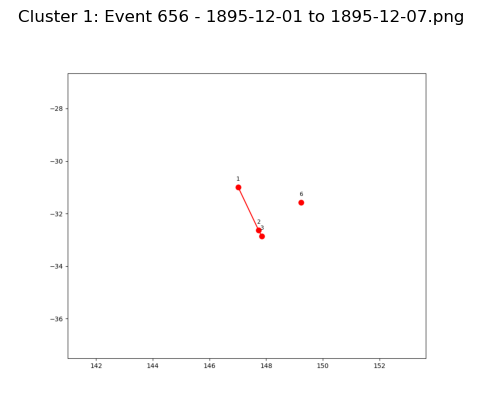

  Event 748 - 1900-02-02 to 1900-02-08.png


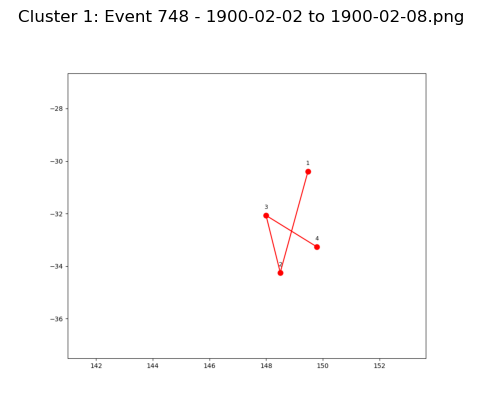

  Event 358 - 1871-10-04 to 1871-10-10.png


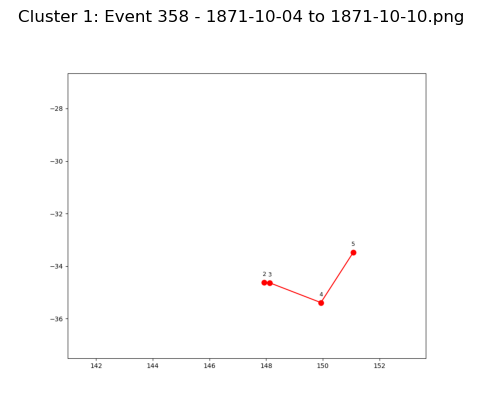

  Event 355 - 1886-10-30 to 1886-11-05.png


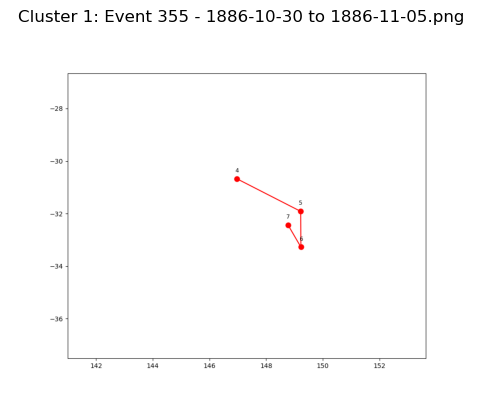

  Event 755 - 1898-03-11 to 1898-03-17.png


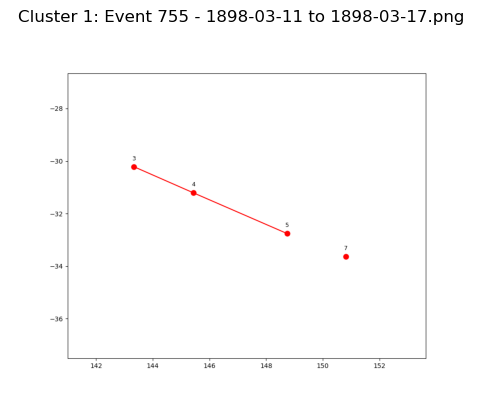

  Event 743 - 1878-04-25 to 1878-05-01.png


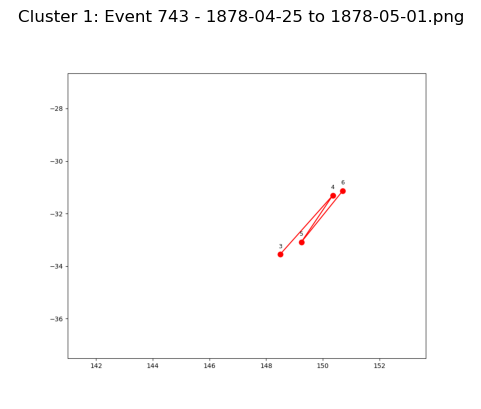

  Event 836 - 1894-04-07 to 1894-04-13.png


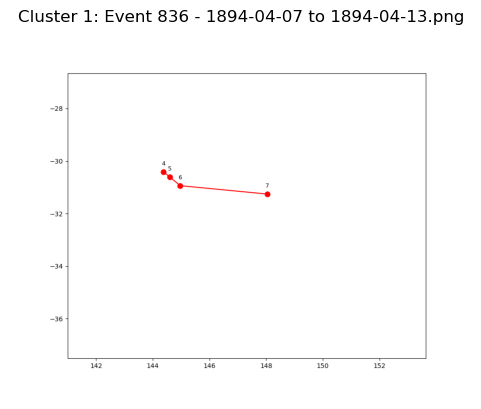

  Event 464 - 1888-02-22 to 1888-02-28.png


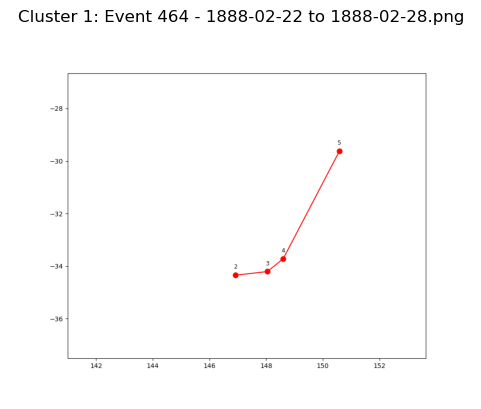

  Event 659 - 1876-12-27 to 1877-01-02.png


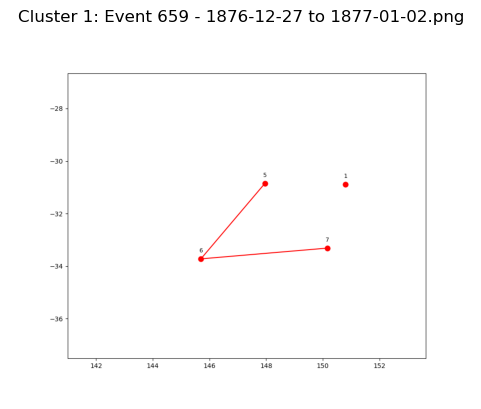

  Event 382 - 1893-02-17 to 1893-02-23.png


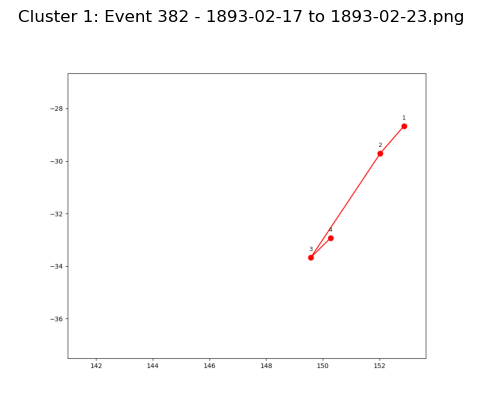

  Event 434 - 1891-03-28 to 1891-04-03.png


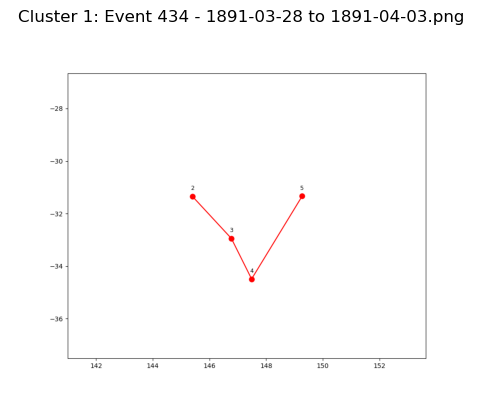

  Event 589 - 1890-10-13 to 1890-10-19.png


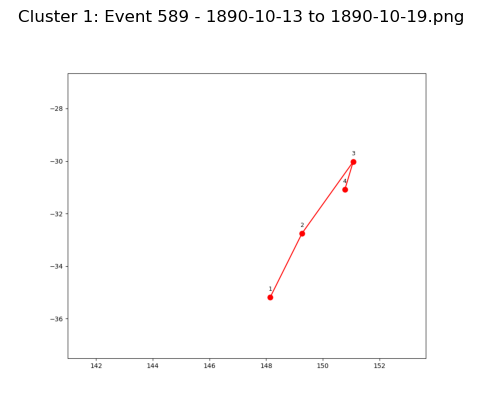

  Event 509 - 1884-05-16 to 1884-05-22.png


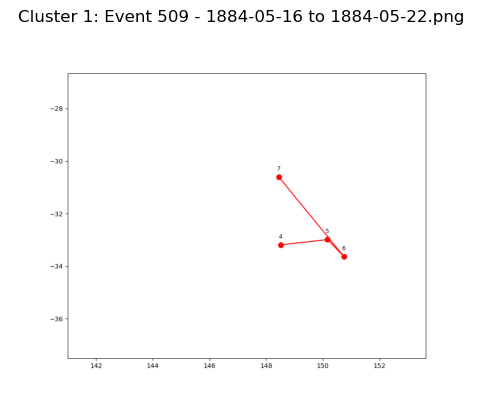

  Event 982 - 1889-03-17 to 1889-03-23.png


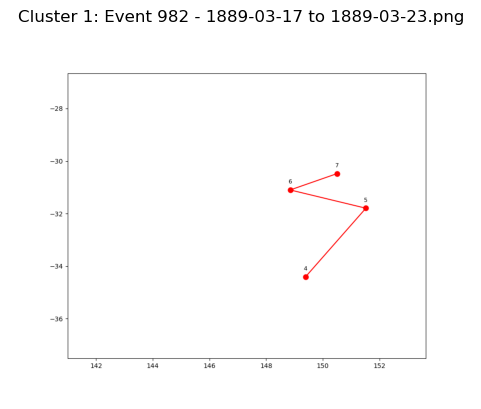

  Event 1082 - 1887-01-05 to 1887-01-11.png


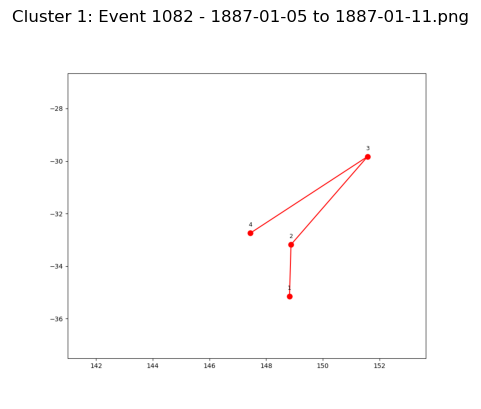

  Event 181 - 1873-04-10 to 1873-04-16.png


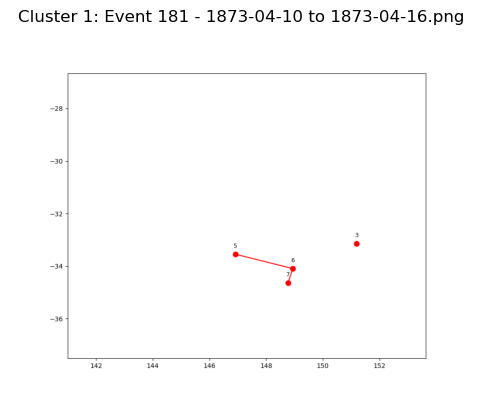

  Event 1022 - 1882-10-31 to 1882-11-06.png


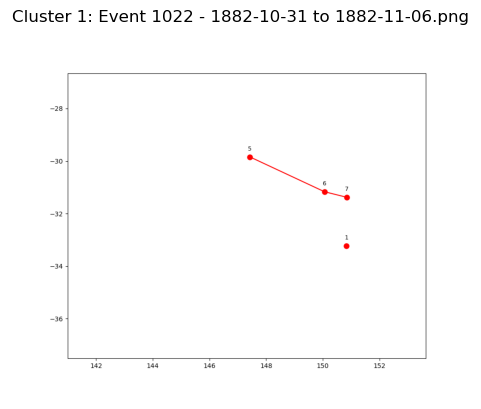

  Event 297 - 1874-03-21 to 1874-03-27.png


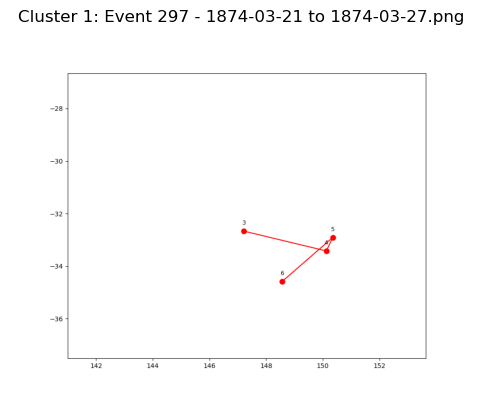

  Event 404 - 1895-12-06 to 1895-12-12.png


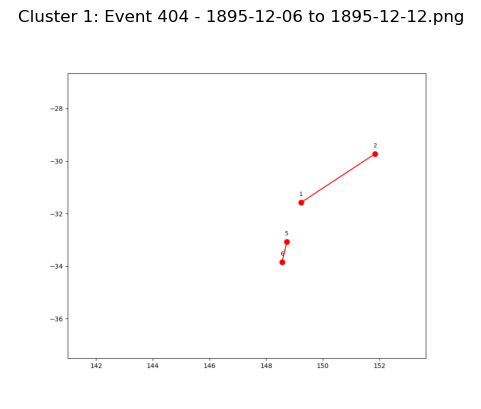

  Event 832 - 1885-04-11 to 1885-04-17.png


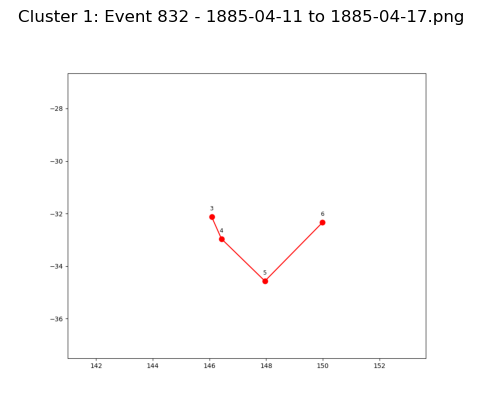

  Event 993 - 1890-12-01 to 1890-12-07.png


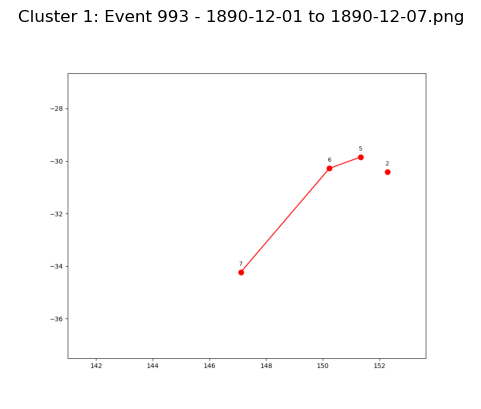

  Event 738 - 1892-06-19 to 1892-06-25.png


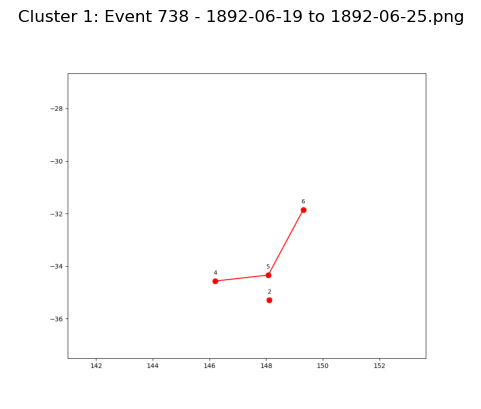

  Event 601 - 1896-11-29 to 1896-12-05.png


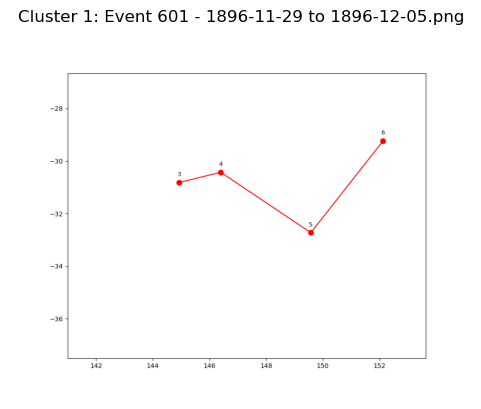

  Event 507 - 1883-10-03 to 1883-10-09.png


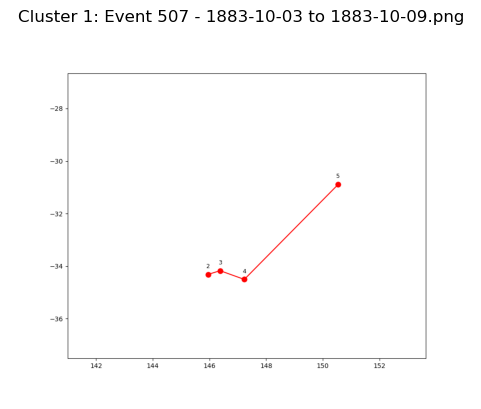

  Event 963 - 1878-03-13 to 1878-03-19.png


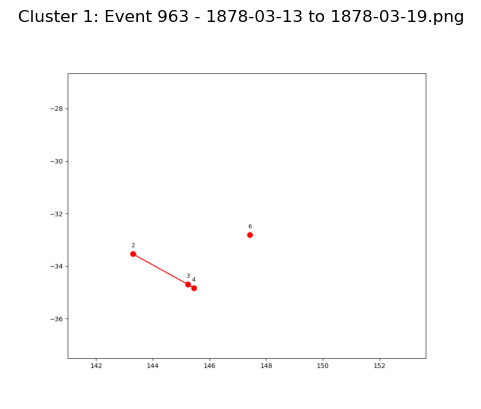

  Event 592 - 1891-02-20 to 1891-02-26.png


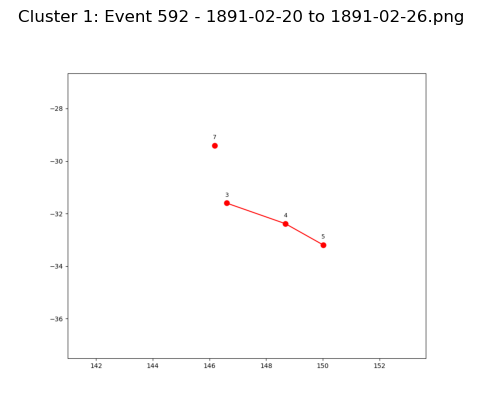

  Event 498 - 1881-05-05 to 1881-05-11.png


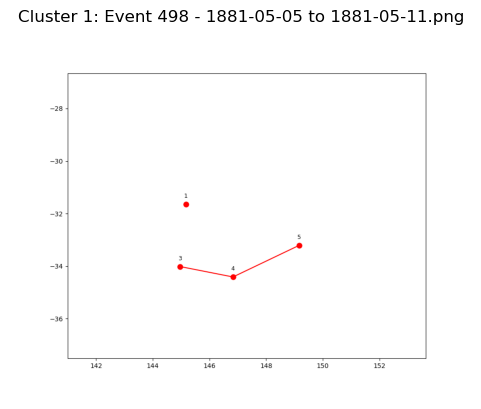

  Event 1052 - 1876-02-06 to 1876-02-12.png


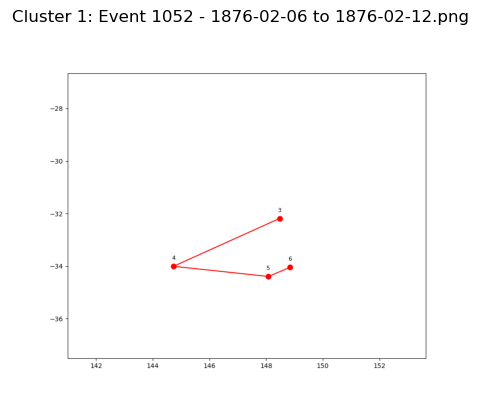

  Event 391 - 1868-07-17 to 1868-07-23.png


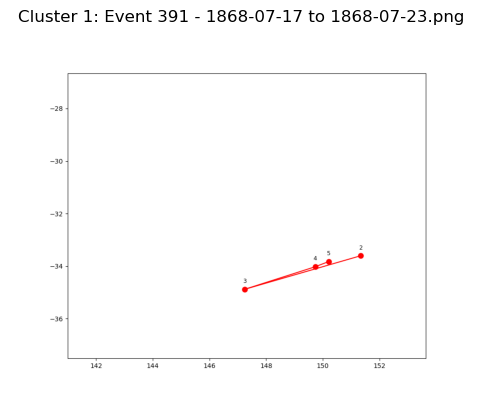

  Event 320 - 1885-06-16 to 1885-06-22.png


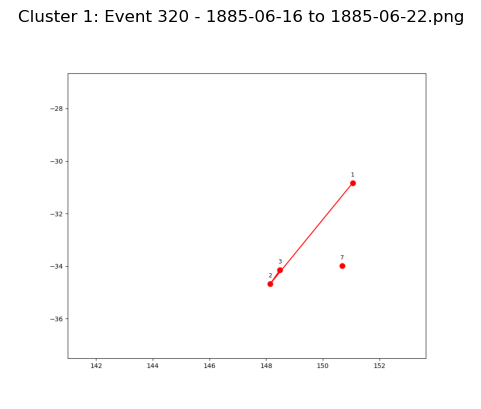

  Event 195 - 1895-05-22 to 1895-05-28.png


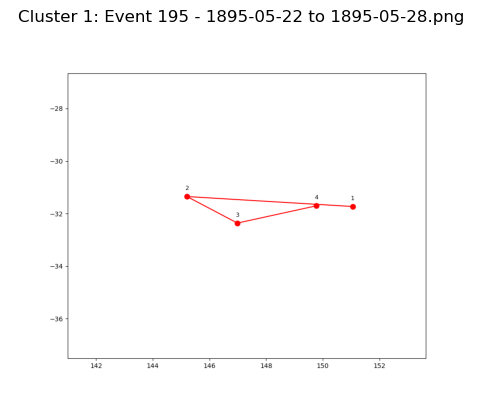

  Event 418 - 1885-01-23 to 1885-01-29.png


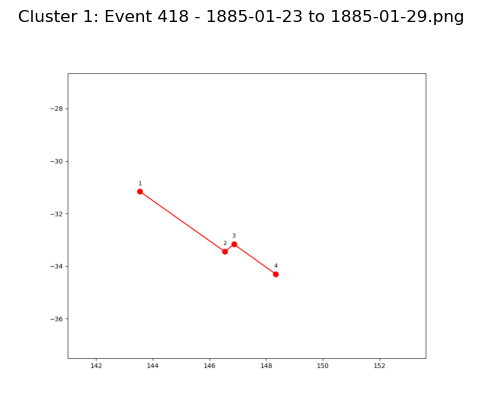

  Event 726 - 1887-10-21 to 1887-10-27.png


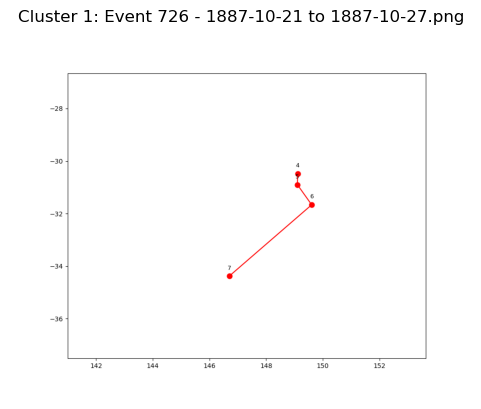

  Event 869 - 1890-03-27 to 1890-04-02.png


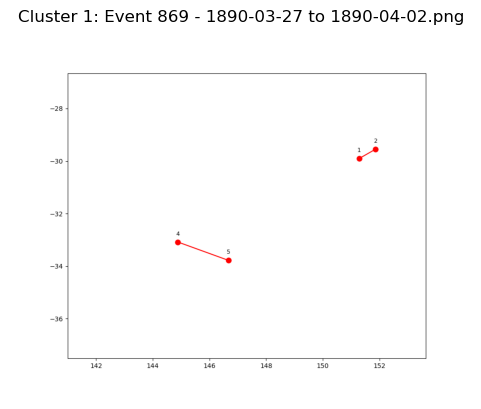

  Event 816 - 1877-09-07 to 1877-09-13.png


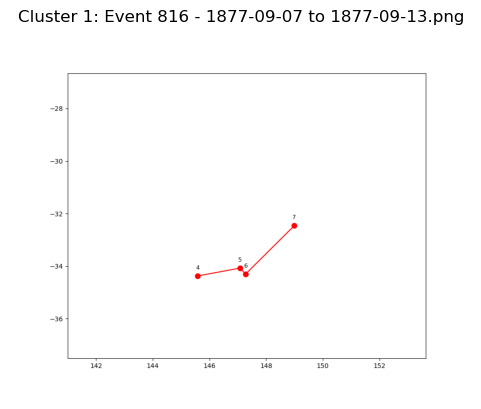

  Event 426 - 1887-02-25 to 1887-03-03.png


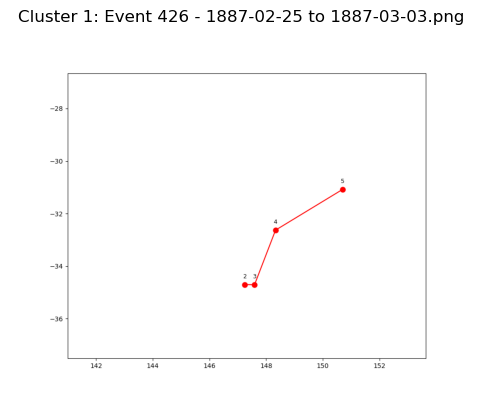

  Event 411 - 1891-01-15 to 1891-01-21.png


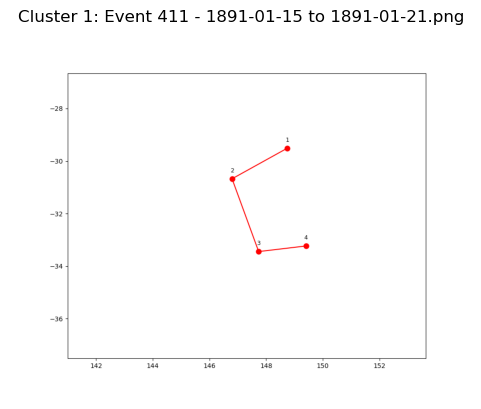

  Event 672 - 1881-02-11 to 1881-02-17.png


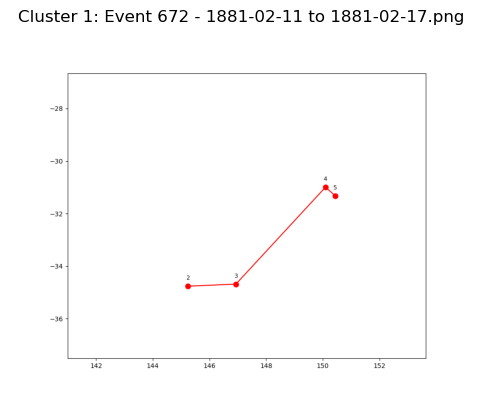

  Event 559 - 1878-09-07 to 1878-09-13.png


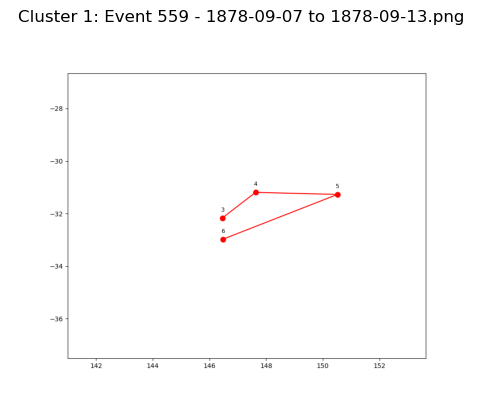

  Event 1080 - 1900-04-21 to 1900-04-27.png


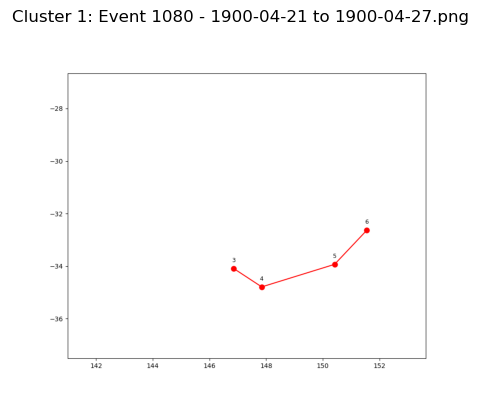

  Event 648 - 1887-12-18 to 1887-12-24.png


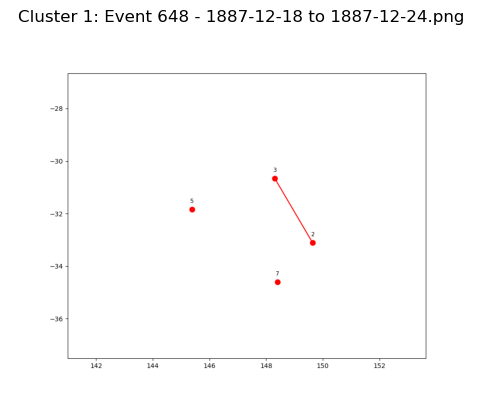

  Event 441 - 1895-06-18 to 1895-06-24.png


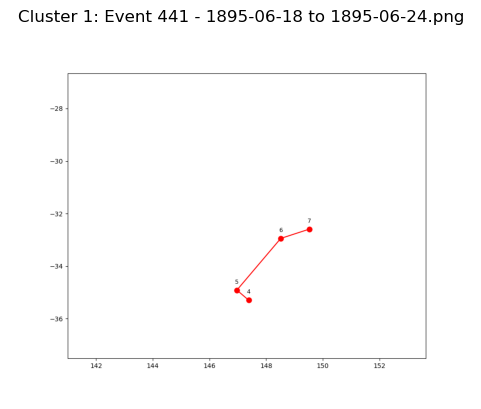

  Event 699 - 1886-06-08 to 1886-06-14.png


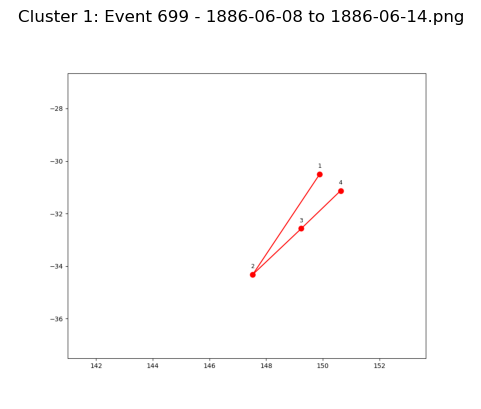

  Event 72 - 1891-03-20 to 1891-03-26.png


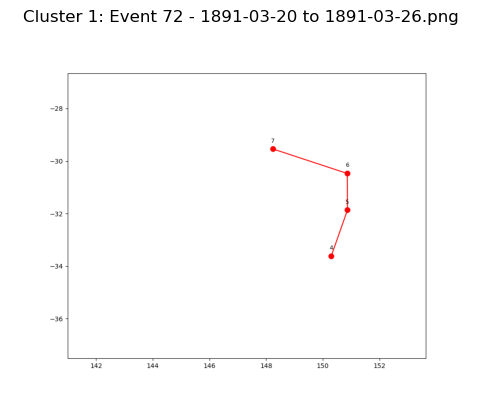

  Event 817 - 1877-09-15 to 1877-09-21.png


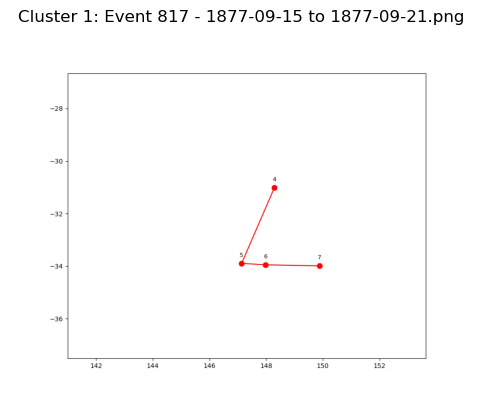

  Event 224 - 1899-06-02 to 1899-06-08.png


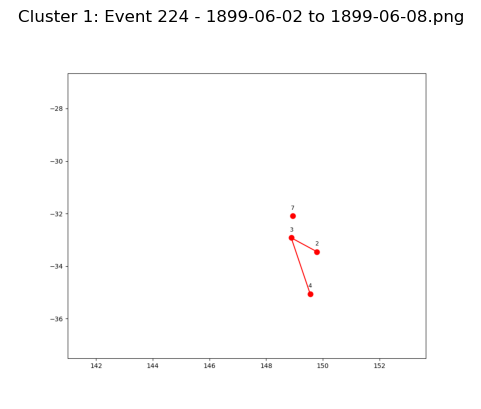

  Event 930 - 1858-03-20 to 1858-03-26.png


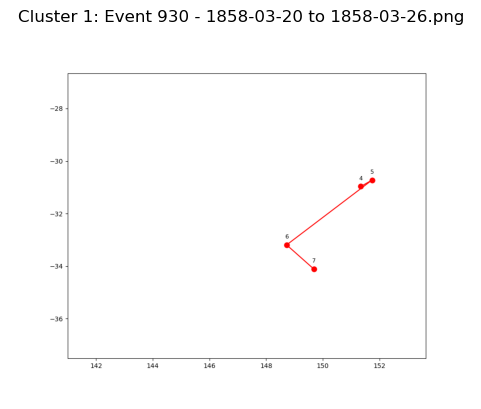

  Event 1092 - 1880-04-26 to 1880-05-02.png


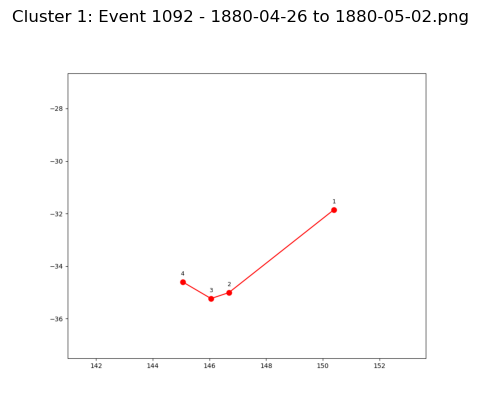

  Event 513 - 1884-12-12 to 1884-12-18.png


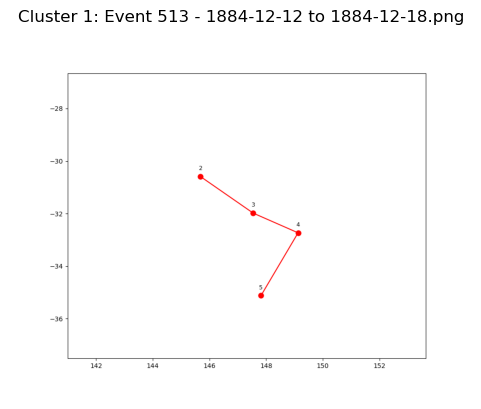

  Event 537 - 1898-08-13 to 1898-08-19.png


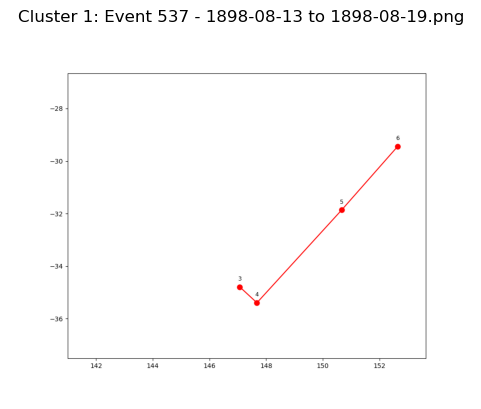

  Event 840 - 1889-04-11 to 1889-04-17.png


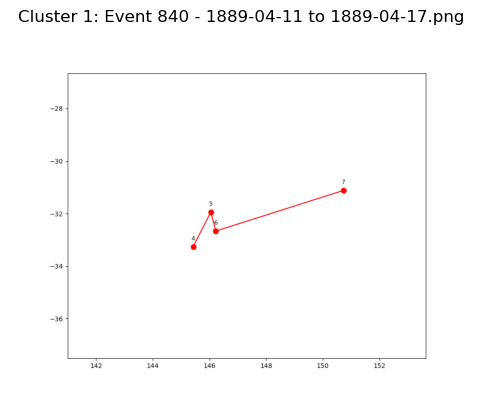

  Event 1020 - 1882-08-06 to 1882-08-12.png


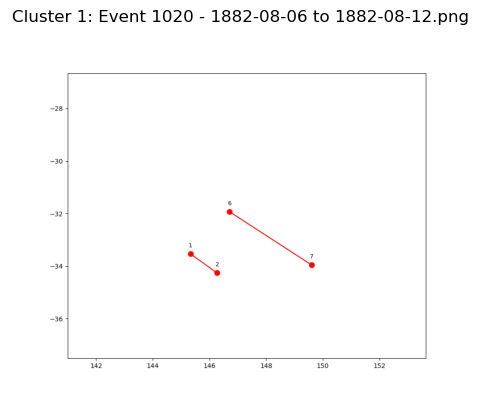

  Event 907 - 1894-12-10 to 1894-12-16.png


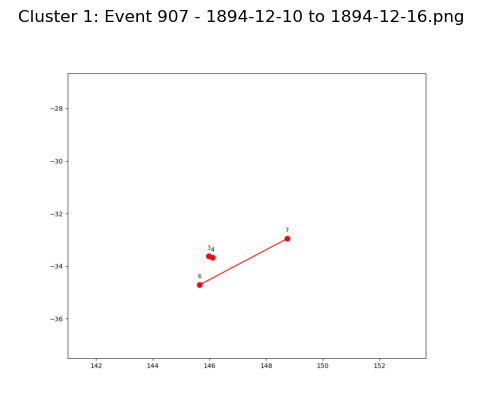

  Event 874 - 1887-06-08 to 1887-06-14.png


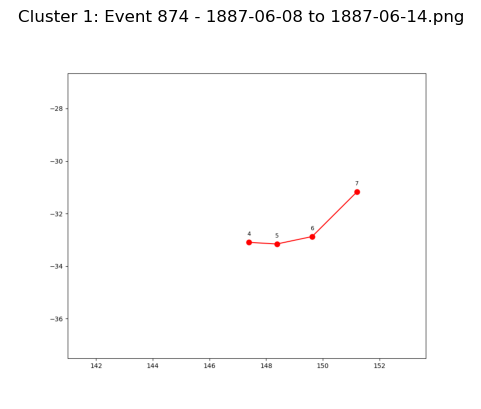

  Event 449 - 1898-01-10 to 1898-01-16.png


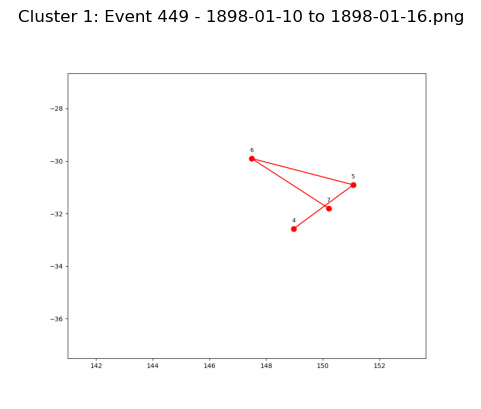

  Event 328 - 1891-02-28 to 1891-03-06.png


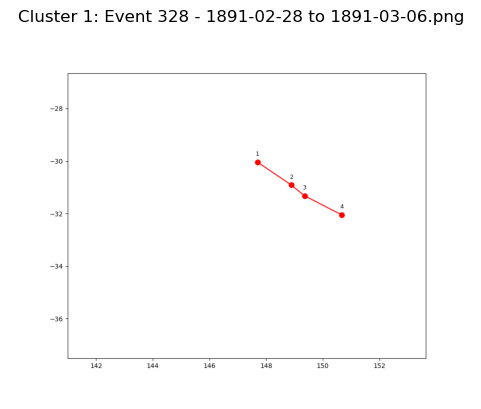

  Event 1037 - 1881-08-13 to 1881-08-19.png


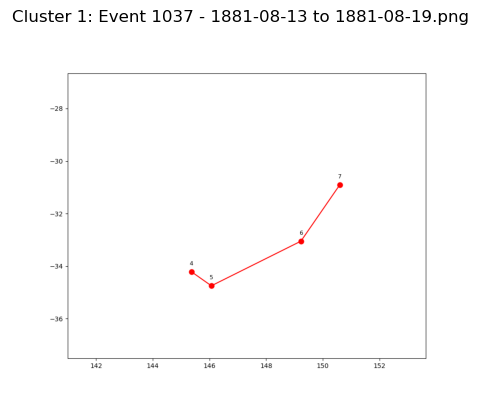

  Event 990 - 1886-11-22 to 1886-11-28.png


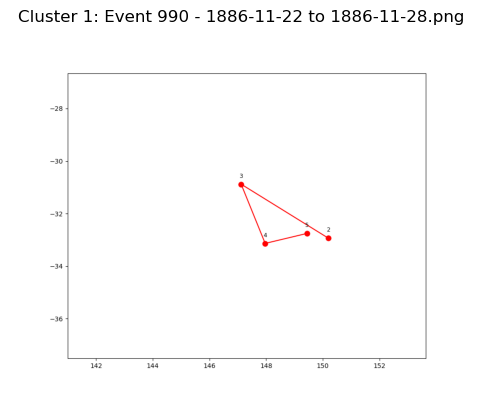

  Event 305 - 1894-10-24 to 1894-10-30.png


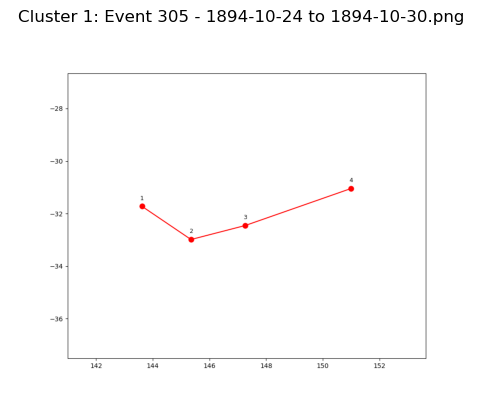

In [51]:
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import pickle
import numpy as np
import os
from keras.preprocessing.image import load_img

# Define the path to the features pickle file and images
features_path = '/Users/coolkarni/Documents/Documents/Documents/Master thesis Data/BoM Station Dataset/Map_features/tracks_features.pkl'
images_path = '/Users/coolkarni/Documents/Documents/Documents/Master thesis Data/BoM Station Dataset/Map_KDE_3plots'

# Load the extracted features
with open(features_path, 'rb') as file:
    data = pickle.load(file)

# Extract the feature vectors and corresponding filenames
features = []
filenames = []
for filename, feat in data.items():
    features.append(feat.flatten())
    filenames.append(filename)

# Convert the list of features to a numpy array
features = np.array(features)

# Apply t-SNE to reduce the features to 2D
tsne = TSNE(n_components=2, random_state=42)
features_2d = tsne.fit_transform(features)

# Apply KMeans clustering
num_clusters = 2  # Adjust the number of clusters as needed
kmeans = KMeans(n_clusters=num_clusters, random_state=42)
labels = kmeans.fit_predict(features_2d)

# Create a dictionary to store filenames by cluster
clusters = {i: [] for i in range(num_clusters)}
for label, filename in zip(labels, filenames):
    clusters[label].append(filename)

# Plot the clustered features
plt.figure(figsize=(10, 8))
scatter = plt.scatter(features_2d[:, 0], features_2d[:, 1], c=labels, cmap='viridis', marker='o')
plt.title('t-SNE Visualization of Image Features with KMeans Clustering')
plt.xlabel('t-SNE Component 1')
plt.ylabel('t-SNE Component 2')
plt.legend(handles=scatter.legend_elements()[0], labels=[f'Cluster {i}' for i in range(num_clusters)])
plt.show()

# Display filenames and images for each cluster
for cluster_id, cluster_filenames in clusters.items():
    print(f"Cluster {cluster_id}:")
    for filename in cluster_filenames:
        print(f"  {filename}")
        
        # Load and display the image
        img_path = os.path.join(images_path, filename)
        img = load_img(img_path)
        plt.figure()
        plt.imshow(img)
        plt.title(f"Cluster {cluster_id}: {filename}")
        plt.axis('off')
        plt.show()


Event 367 - 1886-03-04 to 1886-03-10 - Day 1 Mean Rainfall: 0.01 mm
Event 367 - 1886-03-04 to 1886-03-10 - Day 2 Mean Rainfall: 0.22 mm
Event 367 - 1886-03-04 to 1886-03-10 - Day 3 Mean Rainfall: 1.45 mm
Event 367 - 1886-03-04 to 1886-03-10 - Day 4 Mean Rainfall: 1.40 mm
Event 367 - 1886-03-04 to 1886-03-10 - Day 5 Mean Rainfall: 0.27 mm
Event 367 - 1886-03-04 to 1886-03-10 - Day 6 Mean Rainfall: 0.02 mm
Event 367 - 1886-03-04 to 1886-03-10 - Day 7 Mean Rainfall: 0.05 mm
Event 367 - 1886-03-04 to 1886-03-10 - Median Threshold: 0.22 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 368 - 1890-11-11 to 1890-11-17 - Day 1 Mean Rainfall: 0.38 mm
Event 368 - 1890-11-11 to 1890-11-17 - Day 2 Mean Rainfall: 0.73 mm
Event 368 - 1890-11-11 to 1890-11-17 - Day 3 Mean Rainfall: 4.98 mm
Event 368 - 1890-11-11 to 1890-11-17 - Day 4 Mean Rainfall: 15.73 mm
Event 368 - 1890-11-11 to 1890-11-17 - Day 5 Mean Rainfall: 1.20 mm
Event 368 - 1890-11-11 to 1890-11-17 - Day 6 Mean Rainfall: 0.38 mm
Event 368 - 1890-11-11 to 1890-11-17 - Day 7 Mean Rainfall: 1.52 mm
Event 368 - 1890-11-11 to 1890-11-17 - Median Threshold: 1.20 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 370 - 1893-04-16 to 1893-04-22 - Day 1 Mean Rainfall: 2.32 mm
Event 370 - 1893-04-16 to 1893-04-22 - Day 2 Mean Rainfall: 1.90 mm
Event 370 - 1893-04-16 to 1893-04-22 - Day 3 Mean Rainfall: 1.53 mm
Event 370 - 1893-04-16 to 1893-04-22 - Day 4 Mean Rainfall: 1.23 mm
Event 370 - 1893-04-16 to 1893-04-22 - Day 5 Mean Rainfall: 2.12 mm
Event 370 - 1893-04-16 to 1893-04-22 - Day 6 Mean Rainfall: 0.78 mm
Event 370 - 1893-04-16 to 1893-04-22 - Day 7 Mean Rainfall: 0.76 mm
Event 370 - 1893-04-16 to 1893-04-22 - Median Threshold: 1.53 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 371 - 1899-06-21 to 1899-06-27 - Day 1 Mean Rainfall: 0.85 mm
Event 371 - 1899-06-21 to 1899-06-27 - Day 2 Mean Rainfall: 3.87 mm
Event 371 - 1899-06-21 to 1899-06-27 - Day 3 Mean Rainfall: 8.42 mm
Event 371 - 1899-06-21 to 1899-06-27 - Day 4 Mean Rainfall: 1.93 mm
Event 371 - 1899-06-21 to 1899-06-27 - Day 5 Mean Rainfall: 1.29 mm
Event 371 - 1899-06-21 to 1899-06-27 - Day 6 Mean Rainfall: 1.10 mm
Event 371 - 1899-06-21 to 1899-06-27 - Day 7 Mean Rainfall: 2.68 mm
Event 371 - 1899-06-21 to 1899-06-27 - Median Threshold: 1.93 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 372 - 1899-07-12 to 1899-07-18 - Day 1 Mean Rainfall: 2.87 mm
Event 372 - 1899-07-12 to 1899-07-18 - Day 2 Mean Rainfall: 1.28 mm
Event 372 - 1899-07-12 to 1899-07-18 - Day 3 Mean Rainfall: 3.33 mm
Event 372 - 1899-07-12 to 1899-07-18 - Day 4 Mean Rainfall: 1.68 mm
Event 372 - 1899-07-12 to 1899-07-18 - Day 5 Mean Rainfall: 2.61 mm
Event 372 - 1899-07-12 to 1899-07-18 - Day 6 Mean Rainfall: 2.24 mm
Event 372 - 1899-07-12 to 1899-07-18 - Day 7 Mean Rainfall: 0.96 mm
Event 372 - 1899-07-12 to 1899-07-18 - Median Threshold: 2.24 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 373 - 1893-01-11 to 1893-01-17 - Day 1 Mean Rainfall: 0.63 mm
Event 373 - 1893-01-11 to 1893-01-17 - Day 2 Mean Rainfall: 0.09 mm
Event 373 - 1893-01-11 to 1893-01-17 - Day 3 Mean Rainfall: 0.93 mm
Event 373 - 1893-01-11 to 1893-01-17 - Day 4 Mean Rainfall: 1.78 mm
Event 373 - 1893-01-11 to 1893-01-17 - Day 5 Mean Rainfall: 0.30 mm
Event 373 - 1893-01-11 to 1893-01-17 - Day 6 Mean Rainfall: 0.27 mm
Event 373 - 1893-01-11 to 1893-01-17 - Day 7 Mean Rainfall: 2.16 mm
Event 373 - 1893-01-11 to 1893-01-17 - Median Threshold: 0.63 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 376 - 1889-04-15 to 1889-04-21 - Day 1 Mean Rainfall: 6.26 mm
Event 376 - 1889-04-15 to 1889-04-21 - Day 2 Mean Rainfall: 10.94 mm
Event 376 - 1889-04-15 to 1889-04-21 - Day 3 Mean Rainfall: 8.92 mm
Event 376 - 1889-04-15 to 1889-04-21 - Day 4 Mean Rainfall: 3.17 mm
Event 376 - 1889-04-15 to 1889-04-21 - Day 5 Mean Rainfall: 0.13 mm
Event 376 - 1889-04-15 to 1889-04-21 - Day 6 Mean Rainfall: 0.12 mm
Event 376 - 1889-04-15 to 1889-04-21 - Day 7 Mean Rainfall: 0.26 mm
Event 376 - 1889-04-15 to 1889-04-21 - Median Threshold: 3.17 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 377 - 1899-09-10 to 1899-09-16 - Day 1 Mean Rainfall: 0.29 mm
Event 377 - 1899-09-10 to 1899-09-16 - Day 2 Mean Rainfall: 3.27 mm
Event 377 - 1899-09-10 to 1899-09-16 - Day 3 Mean Rainfall: 6.97 mm
Event 377 - 1899-09-10 to 1899-09-16 - Day 4 Mean Rainfall: 0.87 mm
Event 377 - 1899-09-10 to 1899-09-16 - Day 5 Mean Rainfall: 0.43 mm
Event 377 - 1899-09-10 to 1899-09-16 - Day 6 Mean Rainfall: 0.03 mm
Event 377 - 1899-09-10 to 1899-09-16 - Day 7 Mean Rainfall: 0.23 mm
Event 377 - 1899-09-10 to 1899-09-16 - Median Threshold: 0.43 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 378 - 1891-11-26 to 1891-12-02 - Day 1 Mean Rainfall: 0.22 mm
Event 378 - 1891-11-26 to 1891-12-02 - Day 2 Mean Rainfall: 0.73 mm
Event 378 - 1891-11-26 to 1891-12-02 - Day 3 Mean Rainfall: 1.82 mm
Event 378 - 1891-11-26 to 1891-12-02 - Day 4 Mean Rainfall: 1.04 mm
Event 378 - 1891-11-26 to 1891-12-02 - Day 5 Mean Rainfall: 1.84 mm
Event 378 - 1891-11-26 to 1891-12-02 - Day 6 Mean Rainfall: 5.62 mm
Event 378 - 1891-11-26 to 1891-12-02 - Day 7 Mean Rainfall: 8.26 mm
Event 378 - 1891-11-26 to 1891-12-02 - Median Threshold: 1.82 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 380 - 1894-12-06 to 1894-12-12 - Day 1 Mean Rainfall: 0.27 mm
Event 380 - 1894-12-06 to 1894-12-12 - Day 2 Mean Rainfall: 1.10 mm
Event 380 - 1894-12-06 to 1894-12-12 - Day 3 Mean Rainfall: 2.47 mm
Event 380 - 1894-12-06 to 1894-12-12 - Day 4 Mean Rainfall: 3.54 mm
Event 380 - 1894-12-06 to 1894-12-12 - Day 5 Mean Rainfall: 3.26 mm
Event 380 - 1894-12-06 to 1894-12-12 - Day 6 Mean Rainfall: 3.10 mm
Event 380 - 1894-12-06 to 1894-12-12 - Day 7 Mean Rainfall: 5.27 mm
Event 380 - 1894-12-06 to 1894-12-12 - Median Threshold: 3.10 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 381 - 1896-03-07 to 1896-03-13 - Day 1 Mean Rainfall: 0.17 mm
Event 381 - 1896-03-07 to 1896-03-13 - Day 2 Mean Rainfall: 0.22 mm
Event 381 - 1896-03-07 to 1896-03-13 - Day 3 Mean Rainfall: 0.42 mm
Event 381 - 1896-03-07 to 1896-03-13 - Day 4 Mean Rainfall: 1.61 mm
Event 381 - 1896-03-07 to 1896-03-13 - Day 5 Mean Rainfall: 0.06 mm
Event 381 - 1896-03-07 to 1896-03-13 - Day 6 Mean Rainfall: 0.11 mm
Event 381 - 1896-03-07 to 1896-03-13 - Day 7 Mean Rainfall: 0.74 mm
Event 381 - 1896-03-07 to 1896-03-13 - Median Threshold: 0.22 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 382 - 1893-02-17 to 1893-02-23 - Day 1 Mean Rainfall: 3.07 mm
Event 382 - 1893-02-17 to 1893-02-23 - Day 2 Mean Rainfall: 7.74 mm
Event 382 - 1893-02-17 to 1893-02-23 - Day 3 Mean Rainfall: 6.54 mm
Event 382 - 1893-02-17 to 1893-02-23 - Day 4 Mean Rainfall: 2.85 mm
Event 382 - 1893-02-17 to 1893-02-23 - Day 5 Mean Rainfall: 2.41 mm
Event 382 - 1893-02-17 to 1893-02-23 - Day 6 Mean Rainfall: 0.46 mm
Event 382 - 1893-02-17 to 1893-02-23 - Day 7 Mean Rainfall: 0.68 mm
Event 382 - 1893-02-17 to 1893-02-23 - Median Threshold: 2.85 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 383 - 1890-02-21 to 1890-02-27 - Day 1 Mean Rainfall: 8.32 mm
Event 383 - 1890-02-21 to 1890-02-27 - Day 2 Mean Rainfall: 10.41 mm
Event 383 - 1890-02-21 to 1890-02-27 - Day 3 Mean Rainfall: 14.37 mm
Event 383 - 1890-02-21 to 1890-02-27 - Day 4 Mean Rainfall: 5.69 mm
Event 383 - 1890-02-21 to 1890-02-27 - Day 5 Mean Rainfall: 1.04 mm
Event 383 - 1890-02-21 to 1890-02-27 - Day 6 Mean Rainfall: 1.58 mm
Event 383 - 1890-02-21 to 1890-02-27 - Day 7 Mean Rainfall: 2.02 mm
Event 383 - 1890-02-21 to 1890-02-27 - Median Threshold: 5.69 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 384 - 1898-07-15 to 1898-07-21 - Day 1 Mean Rainfall: 0.27 mm
Event 384 - 1898-07-15 to 1898-07-21 - Day 2 Mean Rainfall: 1.77 mm
Event 384 - 1898-07-15 to 1898-07-21 - Day 3 Mean Rainfall: 1.35 mm
Event 384 - 1898-07-15 to 1898-07-21 - Day 4 Mean Rainfall: 1.76 mm
Event 384 - 1898-07-15 to 1898-07-21 - Day 5 Mean Rainfall: 0.09 mm
Event 384 - 1898-07-15 to 1898-07-21 - Day 6 Mean Rainfall: 0.14 mm
Event 384 - 1898-07-15 to 1898-07-21 - Day 7 Mean Rainfall: 1.10 mm
Event 384 - 1898-07-15 to 1898-07-21 - Median Threshold: 1.10 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 385 - 1900-10-26 to 1900-11-01 - Day 1 Mean Rainfall: 0.04 mm
Event 385 - 1900-10-26 to 1900-11-01 - Day 2 Mean Rainfall: 0.37 mm
Event 385 - 1900-10-26 to 1900-11-01 - Day 3 Mean Rainfall: 2.83 mm
Event 385 - 1900-10-26 to 1900-11-01 - Day 4 Mean Rainfall: 1.06 mm
Event 385 - 1900-10-26 to 1900-11-01 - Day 5 Mean Rainfall: 0.05 mm
Event 385 - 1900-10-26 to 1900-11-01 - Day 6 Mean Rainfall: 0.02 mm
Event 385 - 1900-10-26 to 1900-11-01 - Day 7 Mean Rainfall: 0.08 mm
Event 385 - 1900-10-26 to 1900-11-01 - Median Threshold: 0.08 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 388 - 1874-01-23 to 1874-01-29 - Day 1 Mean Rainfall: 6.48 mm
Event 388 - 1874-01-23 to 1874-01-29 - Day 2 Mean Rainfall: 7.65 mm
Event 388 - 1874-01-23 to 1874-01-29 - Day 3 Mean Rainfall: 22.18 mm
Event 388 - 1874-01-23 to 1874-01-29 - Day 4 Mean Rainfall: 20.93 mm
Event 388 - 1874-01-23 to 1874-01-29 - Day 5 Mean Rainfall: 1.70 mm
Event 388 - 1874-01-23 to 1874-01-29 - Day 6 Mean Rainfall: 0.40 mm
Event 388 - 1874-01-23 to 1874-01-29 - Day 7 Mean Rainfall: 1.66 mm
Event 388 - 1874-01-23 to 1874-01-29 - Median Threshold: 6.48 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 389 - 1881-08-20 to 1881-08-26 - Day 1 Mean Rainfall: 0.42 mm
Event 389 - 1881-08-20 to 1881-08-26 - Day 2 Mean Rainfall: 3.54 mm
Event 389 - 1881-08-20 to 1881-08-26 - Day 3 Mean Rainfall: 9.24 mm
Event 389 - 1881-08-20 to 1881-08-26 - Day 4 Mean Rainfall: 9.40 mm
Event 389 - 1881-08-20 to 1881-08-26 - Day 5 Mean Rainfall: 2.49 mm
Event 389 - 1881-08-20 to 1881-08-26 - Day 6 Mean Rainfall: 0.35 mm
Event 389 - 1881-08-20 to 1881-08-26 - Day 7 Mean Rainfall: 0.13 mm
Event 389 - 1881-08-20 to 1881-08-26 - Median Threshold: 2.49 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 390 - 1867-09-05 to 1867-09-11 - Day 1 Mean Rainfall: 7.40 mm
Event 390 - 1867-09-05 to 1867-09-11 - Day 2 Mean Rainfall: 1.07 mm
Event 390 - 1867-09-05 to 1867-09-11 - Day 3 Mean Rainfall: 4.67 mm
Event 390 - 1867-09-05 to 1867-09-11 - Day 4 Mean Rainfall: 17.52 mm
Event 390 - 1867-09-05 to 1867-09-11 - Day 5 Mean Rainfall: 2.42 mm
Event 390 - 1867-09-05 to 1867-09-11 - Day 6 Mean Rainfall: 2.32 mm
Event 390 - 1867-09-05 to 1867-09-11 - Day 7 Mean Rainfall: 3.39 mm
Event 390 - 1867-09-05 to 1867-09-11 - Median Threshold: 3.39 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 391 - 1868-07-17 to 1868-07-23 - Day 1 Mean Rainfall: 0.00 mm
Event 391 - 1868-07-17 to 1868-07-23 - Day 2 Mean Rainfall: 1.42 mm
Event 391 - 1868-07-17 to 1868-07-23 - Day 3 Mean Rainfall: 6.06 mm
Event 391 - 1868-07-17 to 1868-07-23 - Day 4 Mean Rainfall: 14.09 mm
Event 391 - 1868-07-17 to 1868-07-23 - Day 5 Mean Rainfall: 17.68 mm
Event 391 - 1868-07-17 to 1868-07-23 - Day 6 Mean Rainfall: 0.00 mm
Event 391 - 1868-07-17 to 1868-07-23 - Day 7 Mean Rainfall: 0.87 mm
Event 391 - 1868-07-17 to 1868-07-23 - Median Threshold: 1.42 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 392 - 1869-11-18 to 1869-11-24 - Day 1 Mean Rainfall: 0.00 mm
Event 392 - 1869-11-18 to 1869-11-24 - Day 2 Mean Rainfall: 0.75 mm
Event 392 - 1869-11-18 to 1869-11-24 - Day 3 Mean Rainfall: 4.26 mm
Event 392 - 1869-11-18 to 1869-11-24 - Day 4 Mean Rainfall: 11.00 mm
Event 392 - 1869-11-18 to 1869-11-24 - Day 5 Mean Rainfall: 9.58 mm
Event 392 - 1869-11-18 to 1869-11-24 - Day 6 Mean Rainfall: 9.39 mm
Event 392 - 1869-11-18 to 1869-11-24 - Day 7 Mean Rainfall: 12.99 mm
Event 392 - 1869-11-18 to 1869-11-24 - Median Threshold: 9.39 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 393 - 1882-12-05 to 1882-12-11 - Day 1 Mean Rainfall: 7.28 mm
Event 393 - 1882-12-05 to 1882-12-11 - Day 2 Mean Rainfall: 9.27 mm
Event 393 - 1882-12-05 to 1882-12-11 - Day 3 Mean Rainfall: 5.43 mm
Event 393 - 1882-12-05 to 1882-12-11 - Day 4 Mean Rainfall: 2.40 mm
Event 393 - 1882-12-05 to 1882-12-11 - Day 5 Mean Rainfall: 0.51 mm
Event 393 - 1882-12-05 to 1882-12-11 - Day 6 Mean Rainfall: 1.04 mm
Event 393 - 1882-12-05 to 1882-12-11 - Day 7 Mean Rainfall: 4.13 mm
Event 393 - 1882-12-05 to 1882-12-11 - Median Threshold: 4.13 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 394 - 1894-02-27 to 1894-03-05 - Day 1 Mean Rainfall: 0.85 mm
Event 394 - 1894-02-27 to 1894-03-05 - Day 2 Mean Rainfall: 2.95 mm
Event 394 - 1894-02-27 to 1894-03-05 - Day 3 Mean Rainfall: 7.79 mm
Event 394 - 1894-02-27 to 1894-03-05 - Day 4 Mean Rainfall: 3.45 mm
Event 394 - 1894-02-27 to 1894-03-05 - Day 5 Mean Rainfall: 2.76 mm
Event 394 - 1894-02-27 to 1894-03-05 - Day 6 Mean Rainfall: 3.17 mm
Event 394 - 1894-02-27 to 1894-03-05 - Day 7 Mean Rainfall: 4.34 mm
Event 394 - 1894-02-27 to 1894-03-05 - Median Threshold: 3.17 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 395 - 1893-08-20 to 1893-08-26 - Day 1 Mean Rainfall: 6.75 mm
Event 395 - 1893-08-20 to 1893-08-26 - Day 2 Mean Rainfall: 3.84 mm
Event 395 - 1893-08-20 to 1893-08-26 - Day 3 Mean Rainfall: 5.30 mm
Event 395 - 1893-08-20 to 1893-08-26 - Day 4 Mean Rainfall: 7.63 mm
Event 395 - 1893-08-20 to 1893-08-26 - Day 5 Mean Rainfall: 1.01 mm
Event 395 - 1893-08-20 to 1893-08-26 - Day 6 Mean Rainfall: 0.30 mm
Event 395 - 1893-08-20 to 1893-08-26 - Day 7 Mean Rainfall: 0.15 mm
Event 395 - 1893-08-20 to 1893-08-26 - Median Threshold: 3.84 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 396 - 1881-01-09 to 1881-01-15 - Day 1 Mean Rainfall: 0.78 mm
Event 396 - 1881-01-09 to 1881-01-15 - Day 2 Mean Rainfall: 4.38 mm
Event 396 - 1881-01-09 to 1881-01-15 - Day 3 Mean Rainfall: 11.96 mm
Event 396 - 1881-01-09 to 1881-01-15 - Day 4 Mean Rainfall: 8.67 mm
Event 396 - 1881-01-09 to 1881-01-15 - Day 5 Mean Rainfall: 3.59 mm
Event 396 - 1881-01-09 to 1881-01-15 - Day 6 Mean Rainfall: 1.73 mm
Event 396 - 1881-01-09 to 1881-01-15 - Day 7 Mean Rainfall: 1.32 mm
Event 396 - 1881-01-09 to 1881-01-15 - Median Threshold: 3.59 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 397 - 1890-02-06 to 1890-02-12 - Day 1 Mean Rainfall: 0.15 mm
Event 397 - 1890-02-06 to 1890-02-12 - Day 2 Mean Rainfall: 0.17 mm
Event 397 - 1890-02-06 to 1890-02-12 - Day 3 Mean Rainfall: 0.89 mm
Event 397 - 1890-02-06 to 1890-02-12 - Day 4 Mean Rainfall: 1.92 mm
Event 397 - 1890-02-06 to 1890-02-12 - Day 5 Mean Rainfall: 3.13 mm
Event 397 - 1890-02-06 to 1890-02-12 - Day 6 Mean Rainfall: 3.91 mm
Event 397 - 1890-02-06 to 1890-02-12 - Day 7 Mean Rainfall: 9.43 mm
Event 397 - 1890-02-06 to 1890-02-12 - Median Threshold: 1.92 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 398 - 1891-10-30 to 1891-11-05 - Day 1 Mean Rainfall: 3.41 mm
Event 398 - 1891-10-30 to 1891-11-05 - Day 2 Mean Rainfall: 0.29 mm
Event 398 - 1891-10-30 to 1891-11-05 - Day 3 Mean Rainfall: 0.20 mm
Event 398 - 1891-10-30 to 1891-11-05 - Day 4 Mean Rainfall: 0.44 mm
Event 398 - 1891-10-30 to 1891-11-05 - Day 5 Mean Rainfall: 0.12 mm
Event 398 - 1891-10-30 to 1891-11-05 - Day 6 Mean Rainfall: 0.15 mm
Event 398 - 1891-10-30 to 1891-11-05 - Day 7 Mean Rainfall: 0.22 mm
Event 398 - 1891-10-30 to 1891-11-05 - Median Threshold: 0.22 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 399 - 1891-12-18 to 1891-12-24 - Day 1 Mean Rainfall: 0.03 mm
Event 399 - 1891-12-18 to 1891-12-24 - Day 2 Mean Rainfall: 0.39 mm
Event 399 - 1891-12-18 to 1891-12-24 - Day 3 Mean Rainfall: 0.46 mm
Event 399 - 1891-12-18 to 1891-12-24 - Day 4 Mean Rainfall: 0.19 mm
Event 399 - 1891-12-18 to 1891-12-24 - Day 5 Mean Rainfall: 0.05 mm
Event 399 - 1891-12-18 to 1891-12-24 - Day 6 Mean Rainfall: 0.02 mm
Event 399 - 1891-12-18 to 1891-12-24 - Day 7 Mean Rainfall: 0.08 mm
Event 399 - 1891-12-18 to 1891-12-24 - Median Threshold: 0.08 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Error processing /Users/coolkarni/Documents/Documents/Documents/Master thesis Data/BoM Station Dataset/Rainfall Stored values for R1_99 Events/Event 401 - 1892-05-16 to 1892-05-22.csv: aweights cannot be negative
Event 402 - 1893-03-10 to 1893-03-16 - Day 1 Mean Rainfall: 9.02 mm
Event 402 - 1893-03-10 to 1893-03-16 - Day 2 Mean Rainfall: 1.74 mm
Event 402 - 1893-03-10 to 1893-03-16 - Day 3 Mean Rainfall: 0.24 mm
Event 402 - 1893-03-10 to 1893-03-16 - Day 4 Mean Rainfall: 0.26 mm
Event 402 - 1893-03-10 to 1893-03-16 - Day 5 Mean Rainfall: 0.13 mm
Event 402 - 1893-03-10 to 1893-03-16 - Day 6 Mean Rainfall: 0.11 mm
Event 402 - 1893-03-10 to 1893-03-16 - Day 7 Mean Rainfall: 0.44 mm
Event 402 - 1893-03-10 to 1893-03-16 - Median Threshold: 0.26 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 403 - 1895-11-07 to 1895-11-13 - Day 1 Mean Rainfall: 0.06 mm
Event 403 - 1895-11-07 to 1895-11-13 - Day 2 Mean Rainfall: 0.00 mm
Event 403 - 1895-11-07 to 1895-11-13 - Day 3 Mean Rainfall: 0.02 mm
Event 403 - 1895-11-07 to 1895-11-13 - Day 4 Mean Rainfall: 0.13 mm
Event 403 - 1895-11-07 to 1895-11-13 - Day 5 Mean Rainfall: 0.12 mm
Event 403 - 1895-11-07 to 1895-11-13 - Day 6 Mean Rainfall: 0.05 mm
Event 403 - 1895-11-07 to 1895-11-13 - Day 7 Mean Rainfall: 0.25 mm
Event 403 - 1895-11-07 to 1895-11-13 - Median Threshold: 0.06 mm
Error processing /Users/coolkarni/Documents/Documents/Documents/Master thesis Data/BoM Station Dataset/Rainfall Stored values for R1_99 Events/Event 403 - 1895-11-07 to 1895-11-13.csv: array must not contain infs or NaNs


/opt/anaconda3/lib/python3.12/site-packages/scipy/stats/_kde.py:583: RuntimeWarning: Degrees of freedom <= 0 for slice
  self._data_covariance = atleast_2d(cov(self.dataset, rowvar=1,
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/opt/anaconda3/lib/python3.12/site-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


Event 404 - 1895-12-06 to 1895-12-12 - Day 1 Mean Rainfall: 4.46 mm
Event 404 - 1895-12-06 to 1895-12-12 - Day 2 Mean Rainfall: 2.20 mm
Event 404 - 1895-12-06 to 1895-12-12 - Day 3 Mean Rainfall: 1.16 mm
Event 404 - 1895-12-06 to 1895-12-12 - Day 4 Mean Rainfall: 2.01 mm
Event 404 - 1895-12-06 to 1895-12-12 - Day 5 Mean Rainfall: 7.79 mm
Event 404 - 1895-12-06 to 1895-12-12 - Day 6 Mean Rainfall: 9.34 mm
Event 404 - 1895-12-06 to 1895-12-12 - Day 7 Mean Rainfall: 0.57 mm
Event 404 - 1895-12-06 to 1895-12-12 - Median Threshold: 2.20 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 405 - 1876-05-05 to 1876-05-11 - Day 1 Mean Rainfall: 1.90 mm
Event 405 - 1876-05-05 to 1876-05-11 - Day 2 Mean Rainfall: 9.69 mm
Event 405 - 1876-05-05 to 1876-05-11 - Day 3 Mean Rainfall: 11.14 mm
Event 405 - 1876-05-05 to 1876-05-11 - Day 4 Mean Rainfall: 17.98 mm
Event 405 - 1876-05-05 to 1876-05-11 - Day 5 Mean Rainfall: 1.86 mm
Event 405 - 1876-05-05 to 1876-05-11 - Day 6 Mean Rainfall: 1.10 mm
Event 405 - 1876-05-05 to 1876-05-11 - Day 7 Mean Rainfall: 3.79 mm
Event 405 - 1876-05-05 to 1876-05-11 - Median Threshold: 3.79 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 406 - 1886-06-16 to 1886-06-22 - Day 1 Mean Rainfall: 0.51 mm
Event 406 - 1886-06-16 to 1886-06-22 - Day 2 Mean Rainfall: 5.18 mm
Event 406 - 1886-06-16 to 1886-06-22 - Day 3 Mean Rainfall: 9.55 mm
Event 406 - 1886-06-16 to 1886-06-22 - Day 4 Mean Rainfall: 4.60 mm
Event 406 - 1886-06-16 to 1886-06-22 - Day 5 Mean Rainfall: 1.16 mm
Event 406 - 1886-06-16 to 1886-06-22 - Day 6 Mean Rainfall: 1.09 mm
Event 406 - 1886-06-16 to 1886-06-22 - Day 7 Mean Rainfall: 1.46 mm
Event 406 - 1886-06-16 to 1886-06-22 - Median Threshold: 1.46 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 407 - 1889-11-10 to 1889-11-16 - Day 1 Mean Rainfall: 3.38 mm
Event 407 - 1889-11-10 to 1889-11-16 - Day 2 Mean Rainfall: 4.87 mm
Event 407 - 1889-11-10 to 1889-11-16 - Day 3 Mean Rainfall: 5.60 mm
Event 407 - 1889-11-10 to 1889-11-16 - Day 4 Mean Rainfall: 8.14 mm
Event 407 - 1889-11-10 to 1889-11-16 - Day 5 Mean Rainfall: 4.61 mm
Event 407 - 1889-11-10 to 1889-11-16 - Day 6 Mean Rainfall: 1.95 mm
Event 407 - 1889-11-10 to 1889-11-16 - Day 7 Mean Rainfall: 5.35 mm
Event 407 - 1889-11-10 to 1889-11-16 - Median Threshold: 4.87 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 408 - 1890-05-20 to 1890-05-26 - Day 1 Mean Rainfall: 0.28 mm
Event 408 - 1890-05-20 to 1890-05-26 - Day 2 Mean Rainfall: 0.19 mm
Event 408 - 1890-05-20 to 1890-05-26 - Day 3 Mean Rainfall: 0.75 mm
Event 408 - 1890-05-20 to 1890-05-26 - Day 4 Mean Rainfall: 5.32 mm
Event 408 - 1890-05-20 to 1890-05-26 - Day 5 Mean Rainfall: 7.97 mm
Event 408 - 1890-05-20 to 1890-05-26 - Day 6 Mean Rainfall: 2.32 mm
Event 408 - 1890-05-20 to 1890-05-26 - Day 7 Mean Rainfall: 3.45 mm
Event 408 - 1890-05-20 to 1890-05-26 - Median Threshold: 2.32 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 409 - 1890-06-17 to 1890-06-23 - Day 1 Mean Rainfall: 0.86 mm
Event 409 - 1890-06-17 to 1890-06-23 - Day 2 Mean Rainfall: 1.30 mm
Event 409 - 1890-06-17 to 1890-06-23 - Day 3 Mean Rainfall: 0.21 mm
Event 409 - 1890-06-17 to 1890-06-23 - Day 4 Mean Rainfall: 0.92 mm
Event 409 - 1890-06-17 to 1890-06-23 - Day 5 Mean Rainfall: 5.19 mm
Event 409 - 1890-06-17 to 1890-06-23 - Day 6 Mean Rainfall: 8.40 mm
Event 409 - 1890-06-17 to 1890-06-23 - Day 7 Mean Rainfall: 1.92 mm
Event 409 - 1890-06-17 to 1890-06-23 - Median Threshold: 1.30 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 410 - 1890-09-19 to 1890-09-25 - Day 1 Mean Rainfall: 0.89 mm
Event 410 - 1890-09-19 to 1890-09-25 - Day 2 Mean Rainfall: 0.83 mm
Event 410 - 1890-09-19 to 1890-09-25 - Day 3 Mean Rainfall: 5.58 mm
Event 410 - 1890-09-19 to 1890-09-25 - Day 4 Mean Rainfall: 16.80 mm
Event 410 - 1890-09-19 to 1890-09-25 - Day 5 Mean Rainfall: 1.62 mm
Event 410 - 1890-09-19 to 1890-09-25 - Day 6 Mean Rainfall: 0.53 mm
Event 410 - 1890-09-19 to 1890-09-25 - Day 7 Mean Rainfall: 1.06 mm
Event 410 - 1890-09-19 to 1890-09-25 - Median Threshold: 1.06 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 411 - 1891-01-15 to 1891-01-21 - Day 1 Mean Rainfall: 7.75 mm
Event 411 - 1891-01-15 to 1891-01-21 - Day 2 Mean Rainfall: 21.72 mm
Event 411 - 1891-01-15 to 1891-01-21 - Day 3 Mean Rainfall: 39.22 mm
Event 411 - 1891-01-15 to 1891-01-21 - Day 4 Mean Rainfall: 12.61 mm
Event 411 - 1891-01-15 to 1891-01-21 - Day 5 Mean Rainfall: 1.72 mm
Event 411 - 1891-01-15 to 1891-01-21 - Day 6 Mean Rainfall: 0.23 mm
Event 411 - 1891-01-15 to 1891-01-21 - Day 7 Mean Rainfall: 1.66 mm
Event 411 - 1891-01-15 to 1891-01-21 - Median Threshold: 7.75 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 412 - 1894-05-16 to 1894-05-22 - Day 1 Mean Rainfall: 0.73 mm
Event 412 - 1894-05-16 to 1894-05-22 - Day 2 Mean Rainfall: 4.00 mm
Event 412 - 1894-05-16 to 1894-05-22 - Day 3 Mean Rainfall: 7.79 mm
Event 412 - 1894-05-16 to 1894-05-22 - Day 4 Mean Rainfall: 6.43 mm
Event 412 - 1894-05-16 to 1894-05-22 - Day 5 Mean Rainfall: 1.39 mm
Event 412 - 1894-05-16 to 1894-05-22 - Day 6 Mean Rainfall: 1.00 mm
Event 412 - 1894-05-16 to 1894-05-22 - Day 7 Mean Rainfall: 0.39 mm
Event 412 - 1894-05-16 to 1894-05-22 - Median Threshold: 1.39 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 415 - 1880-02-06 to 1880-02-12 - Day 1 Mean Rainfall: 1.30 mm
Event 415 - 1880-02-06 to 1880-02-12 - Day 2 Mean Rainfall: 5.57 mm
Event 415 - 1880-02-06 to 1880-02-12 - Day 3 Mean Rainfall: 10.07 mm
Event 415 - 1880-02-06 to 1880-02-12 - Day 4 Mean Rainfall: 8.18 mm
Event 415 - 1880-02-06 to 1880-02-12 - Day 5 Mean Rainfall: 8.56 mm
Event 415 - 1880-02-06 to 1880-02-12 - Day 6 Mean Rainfall: 2.97 mm
Event 415 - 1880-02-06 to 1880-02-12 - Day 7 Mean Rainfall: 1.02 mm
Event 415 - 1880-02-06 to 1880-02-12 - Median Threshold: 5.57 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 416 - 1890-02-10 to 1890-02-16 - Day 1 Mean Rainfall: 3.13 mm
Event 416 - 1890-02-10 to 1890-02-16 - Day 2 Mean Rainfall: 3.95 mm
Event 416 - 1890-02-10 to 1890-02-16 - Day 3 Mean Rainfall: 9.43 mm
Event 416 - 1890-02-10 to 1890-02-16 - Day 4 Mean Rainfall: 16.39 mm
Event 416 - 1890-02-10 to 1890-02-16 - Day 5 Mean Rainfall: 5.55 mm
Event 416 - 1890-02-10 to 1890-02-16 - Day 6 Mean Rainfall: 4.03 mm
Event 416 - 1890-02-10 to 1890-02-16 - Day 7 Mean Rainfall: 7.80 mm
Event 416 - 1890-02-10 to 1890-02-16 - Median Threshold: 5.55 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 417 - 1894-03-21 to 1894-03-27 - Day 1 Mean Rainfall: 12.14 mm
Event 417 - 1894-03-21 to 1894-03-27 - Day 2 Mean Rainfall: 14.15 mm
Event 417 - 1894-03-21 to 1894-03-27 - Day 3 Mean Rainfall: 1.78 mm
Event 417 - 1894-03-21 to 1894-03-27 - Day 4 Mean Rainfall: 8.44 mm
Event 417 - 1894-03-21 to 1894-03-27 - Day 5 Mean Rainfall: 13.28 mm
Event 417 - 1894-03-21 to 1894-03-27 - Day 6 Mean Rainfall: 2.46 mm
Event 417 - 1894-03-21 to 1894-03-27 - Day 7 Mean Rainfall: 0.80 mm
Event 417 - 1894-03-21 to 1894-03-27 - Median Threshold: 8.44 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 418 - 1885-01-23 to 1885-01-29 - Day 1 Mean Rainfall: 4.85 mm
Event 418 - 1885-01-23 to 1885-01-29 - Day 2 Mean Rainfall: 13.37 mm
Event 418 - 1885-01-23 to 1885-01-29 - Day 3 Mean Rainfall: 19.45 mm
Event 418 - 1885-01-23 to 1885-01-29 - Day 4 Mean Rainfall: 14.33 mm
Event 418 - 1885-01-23 to 1885-01-29 - Day 5 Mean Rainfall: 4.39 mm
Event 418 - 1885-01-23 to 1885-01-29 - Day 6 Mean Rainfall: 1.65 mm
Event 418 - 1885-01-23 to 1885-01-29 - Day 7 Mean Rainfall: 0.08 mm
Event 418 - 1885-01-23 to 1885-01-29 - Median Threshold: 4.85 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 419 - 1885-07-19 to 1885-07-25 - Day 1 Mean Rainfall: 0.01 mm
Event 419 - 1885-07-19 to 1885-07-25 - Day 2 Mean Rainfall: 0.09 mm
Event 419 - 1885-07-19 to 1885-07-25 - Day 3 Mean Rainfall: 0.28 mm
Event 419 - 1885-07-19 to 1885-07-25 - Day 4 Mean Rainfall: 1.83 mm
Event 419 - 1885-07-19 to 1885-07-25 - Day 5 Mean Rainfall: 2.21 mm
Event 419 - 1885-07-19 to 1885-07-25 - Day 6 Mean Rainfall: 0.56 mm
Event 419 - 1885-07-19 to 1885-07-25 - Day 7 Mean Rainfall: 0.05 mm
Event 419 - 1885-07-19 to 1885-07-25 - Median Threshold: 0.28 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 420 - 1890-07-26 to 1890-08-01 - Day 1 Mean Rainfall: 1.74 mm
Event 420 - 1890-07-26 to 1890-08-01 - Day 2 Mean Rainfall: 2.48 mm
Event 420 - 1890-07-26 to 1890-08-01 - Day 3 Mean Rainfall: 2.15 mm
Event 420 - 1890-07-26 to 1890-08-01 - Day 4 Mean Rainfall: 1.81 mm
Event 420 - 1890-07-26 to 1890-08-01 - Day 5 Mean Rainfall: 3.43 mm
Event 420 - 1890-07-26 to 1890-08-01 - Day 6 Mean Rainfall: 7.49 mm
Event 420 - 1890-07-26 to 1890-08-01 - Day 7 Mean Rainfall: 5.35 mm
Event 420 - 1890-07-26 to 1890-08-01 - Median Threshold: 2.48 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 421 - 1898-12-21 to 1898-12-27 - Day 1 Mean Rainfall: 0.86 mm
Event 421 - 1898-12-21 to 1898-12-27 - Day 2 Mean Rainfall: 1.53 mm
Event 421 - 1898-12-21 to 1898-12-27 - Day 3 Mean Rainfall: 6.33 mm
Event 421 - 1898-12-21 to 1898-12-27 - Day 4 Mean Rainfall: 12.32 mm
Event 421 - 1898-12-21 to 1898-12-27 - Day 5 Mean Rainfall: 3.55 mm
Event 421 - 1898-12-21 to 1898-12-27 - Day 6 Mean Rainfall: 0.58 mm
Event 421 - 1898-12-21 to 1898-12-27 - Day 7 Mean Rainfall: 0.05 mm
Event 421 - 1898-12-21 to 1898-12-27 - Median Threshold: 1.53 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 422 - 1880-04-21 to 1880-04-27 - Day 1 Mean Rainfall: 9.98 mm
Event 422 - 1880-04-21 to 1880-04-27 - Day 2 Mean Rainfall: 13.44 mm
Event 422 - 1880-04-21 to 1880-04-27 - Day 3 Mean Rainfall: 11.02 mm
Event 422 - 1880-04-21 to 1880-04-27 - Day 4 Mean Rainfall: 13.02 mm
Event 422 - 1880-04-21 to 1880-04-27 - Day 5 Mean Rainfall: 7.54 mm
Event 422 - 1880-04-21 to 1880-04-27 - Day 6 Mean Rainfall: 1.51 mm
Event 422 - 1880-04-21 to 1880-04-27 - Day 7 Mean Rainfall: 0.10 mm
Event 422 - 1880-04-21 to 1880-04-27 - Median Threshold: 9.98 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 423 - 1882-02-04 to 1882-02-10 - Day 1 Mean Rainfall: 1.53 mm
Event 423 - 1882-02-04 to 1882-02-10 - Day 2 Mean Rainfall: 5.57 mm
Event 423 - 1882-02-04 to 1882-02-10 - Day 3 Mean Rainfall: 14.44 mm
Event 423 - 1882-02-04 to 1882-02-10 - Day 4 Mean Rainfall: 11.45 mm
Event 423 - 1882-02-04 to 1882-02-10 - Day 5 Mean Rainfall: 5.28 mm
Event 423 - 1882-02-04 to 1882-02-10 - Day 6 Mean Rainfall: 2.83 mm
Event 423 - 1882-02-04 to 1882-02-10 - Day 7 Mean Rainfall: 0.93 mm
Event 423 - 1882-02-04 to 1882-02-10 - Median Threshold: 5.28 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 424 - 1882-05-28 to 1882-06-03 - Day 1 Mean Rainfall: 0.13 mm
Event 424 - 1882-05-28 to 1882-06-03 - Day 2 Mean Rainfall: 2.51 mm
Event 424 - 1882-05-28 to 1882-06-03 - Day 3 Mean Rainfall: 14.37 mm
Event 424 - 1882-05-28 to 1882-06-03 - Day 4 Mean Rainfall: 11.61 mm
Event 424 - 1882-05-28 to 1882-06-03 - Day 5 Mean Rainfall: 1.48 mm
Event 424 - 1882-05-28 to 1882-06-03 - Day 6 Mean Rainfall: 0.17 mm
Event 424 - 1882-05-28 to 1882-06-03 - Day 7 Mean Rainfall: 0.46 mm
Event 424 - 1882-05-28 to 1882-06-03 - Median Threshold: 1.48 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 425 - 1886-12-02 to 1886-12-08 - Day 1 Mean Rainfall: 0.99 mm
Event 425 - 1886-12-02 to 1886-12-08 - Day 2 Mean Rainfall: 3.43 mm
Event 425 - 1886-12-02 to 1886-12-08 - Day 3 Mean Rainfall: 14.38 mm
Event 425 - 1886-12-02 to 1886-12-08 - Day 4 Mean Rainfall: 14.23 mm
Event 425 - 1886-12-02 to 1886-12-08 - Day 5 Mean Rainfall: 10.10 mm
Event 425 - 1886-12-02 to 1886-12-08 - Day 6 Mean Rainfall: 11.86 mm
Event 425 - 1886-12-02 to 1886-12-08 - Day 7 Mean Rainfall: 9.33 mm
Event 425 - 1886-12-02 to 1886-12-08 - Median Threshold: 10.10 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 426 - 1887-02-25 to 1887-03-03 - Day 1 Mean Rainfall: 0.96 mm
Event 426 - 1887-02-25 to 1887-03-03 - Day 2 Mean Rainfall: 3.21 mm
Event 426 - 1887-02-25 to 1887-03-03 - Day 3 Mean Rainfall: 5.74 mm
Event 426 - 1887-02-25 to 1887-03-03 - Day 4 Mean Rainfall: 5.68 mm
Event 426 - 1887-02-25 to 1887-03-03 - Day 5 Mean Rainfall: 7.25 mm
Event 426 - 1887-02-25 to 1887-03-03 - Day 6 Mean Rainfall: 1.04 mm
Event 426 - 1887-02-25 to 1887-03-03 - Day 7 Mean Rainfall: 0.53 mm
Event 426 - 1887-02-25 to 1887-03-03 - Median Threshold: 3.21 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 427 - 1889-04-04 to 1889-04-10 - Day 1 Mean Rainfall: 2.25 mm
Event 427 - 1889-04-04 to 1889-04-10 - Day 2 Mean Rainfall: 2.40 mm
Event 427 - 1889-04-04 to 1889-04-10 - Day 3 Mean Rainfall: 9.08 mm
Event 427 - 1889-04-04 to 1889-04-10 - Day 4 Mean Rainfall: 19.82 mm
Event 427 - 1889-04-04 to 1889-04-10 - Day 5 Mean Rainfall: 8.73 mm
Event 427 - 1889-04-04 to 1889-04-10 - Day 6 Mean Rainfall: 0.68 mm
Event 427 - 1889-04-04 to 1889-04-10 - Day 7 Mean Rainfall: 0.14 mm
Event 427 - 1889-04-04 to 1889-04-10 - Median Threshold: 2.40 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 428 - 1896-12-31 to 1897-01-06 - Day 1 Mean Rainfall: 0.32 mm
Event 428 - 1896-12-31 to 1897-01-06 - Day 2 Mean Rainfall: 0.68 mm
Event 428 - 1896-12-31 to 1897-01-06 - Day 3 Mean Rainfall: 1.45 mm
Event 428 - 1896-12-31 to 1897-01-06 - Day 4 Mean Rainfall: 2.23 mm
Event 428 - 1896-12-31 to 1897-01-06 - Day 5 Mean Rainfall: 3.33 mm
Event 428 - 1896-12-31 to 1897-01-06 - Day 6 Mean Rainfall: 1.64 mm
Event 428 - 1896-12-31 to 1897-01-06 - Day 7 Mean Rainfall: 0.23 mm
Event 428 - 1896-12-31 to 1897-01-06 - Median Threshold: 1.45 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 430 - 1887-10-25 to 1887-10-31 - Day 1 Mean Rainfall: 4.68 mm
Event 430 - 1887-10-25 to 1887-10-31 - Day 2 Mean Rainfall: 2.32 mm
Event 430 - 1887-10-25 to 1887-10-31 - Day 3 Mean Rainfall: 4.88 mm
Event 430 - 1887-10-25 to 1887-10-31 - Day 4 Mean Rainfall: 8.30 mm
Event 430 - 1887-10-25 to 1887-10-31 - Day 5 Mean Rainfall: 4.67 mm
Event 430 - 1887-10-25 to 1887-10-31 - Day 6 Mean Rainfall: 0.20 mm
Event 430 - 1887-10-25 to 1887-10-31 - Day 7 Mean Rainfall: 0.05 mm
Event 430 - 1887-10-25 to 1887-10-31 - Median Threshold: 4.67 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 431 - 1888-01-01 to 1888-01-07 - Day 1 Mean Rainfall: 2.90 mm
Event 431 - 1888-01-01 to 1888-01-07 - Day 2 Mean Rainfall: 3.20 mm
Event 431 - 1888-01-01 to 1888-01-07 - Day 3 Mean Rainfall: 3.75 mm
Event 431 - 1888-01-01 to 1888-01-07 - Day 4 Mean Rainfall: 5.22 mm
Event 431 - 1888-01-01 to 1888-01-07 - Day 5 Mean Rainfall: 0.90 mm
Event 431 - 1888-01-01 to 1888-01-07 - Day 6 Mean Rainfall: 0.30 mm
Event 431 - 1888-01-01 to 1888-01-07 - Day 7 Mean Rainfall: 0.21 mm
Event 431 - 1888-01-01 to 1888-01-07 - Median Threshold: 2.90 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 432 - 1889-05-02 to 1889-05-08 - Day 1 Mean Rainfall: 0.74 mm
Event 432 - 1889-05-02 to 1889-05-08 - Day 2 Mean Rainfall: 1.24 mm
Event 432 - 1889-05-02 to 1889-05-08 - Day 3 Mean Rainfall: 5.58 mm
Event 432 - 1889-05-02 to 1889-05-08 - Day 4 Mean Rainfall: 16.84 mm
Event 432 - 1889-05-02 to 1889-05-08 - Day 5 Mean Rainfall: 10.75 mm
Event 432 - 1889-05-02 to 1889-05-08 - Day 6 Mean Rainfall: 1.48 mm
Event 432 - 1889-05-02 to 1889-05-08 - Day 7 Mean Rainfall: 1.68 mm
Event 432 - 1889-05-02 to 1889-05-08 - Median Threshold: 1.68 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 433 - 1891-01-03 to 1891-01-09 - Day 1 Mean Rainfall: 0.31 mm
Event 433 - 1891-01-03 to 1891-01-09 - Day 2 Mean Rainfall: 0.78 mm
Event 433 - 1891-01-03 to 1891-01-09 - Day 3 Mean Rainfall: 8.38 mm
Event 433 - 1891-01-03 to 1891-01-09 - Day 4 Mean Rainfall: 13.11 mm
Event 433 - 1891-01-03 to 1891-01-09 - Day 5 Mean Rainfall: 1.41 mm
Event 433 - 1891-01-03 to 1891-01-09 - Day 6 Mean Rainfall: 0.51 mm
Event 433 - 1891-01-03 to 1891-01-09 - Day 7 Mean Rainfall: 2.80 mm
Event 433 - 1891-01-03 to 1891-01-09 - Median Threshold: 1.41 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 434 - 1891-03-28 to 1891-04-03 - Day 1 Mean Rainfall: 2.65 mm
Event 434 - 1891-03-28 to 1891-04-03 - Day 2 Mean Rainfall: 4.29 mm
Event 434 - 1891-03-28 to 1891-04-03 - Day 3 Mean Rainfall: 4.76 mm
Event 434 - 1891-03-28 to 1891-04-03 - Day 4 Mean Rainfall: 10.88 mm
Event 434 - 1891-03-28 to 1891-04-03 - Day 5 Mean Rainfall: 3.92 mm
Event 434 - 1891-03-28 to 1891-04-03 - Day 6 Mean Rainfall: 1.57 mm
Event 434 - 1891-03-28 to 1891-04-03 - Day 7 Mean Rainfall: 1.49 mm
Event 434 - 1891-03-28 to 1891-04-03 - Median Threshold: 3.92 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 435 - 1893-05-25 to 1893-05-31 - Day 1 Mean Rainfall: 0.11 mm
Event 435 - 1893-05-25 to 1893-05-31 - Day 2 Mean Rainfall: 0.22 mm
Event 435 - 1893-05-25 to 1893-05-31 - Day 3 Mean Rainfall: 1.72 mm
Event 435 - 1893-05-25 to 1893-05-31 - Day 4 Mean Rainfall: 9.94 mm
Event 435 - 1893-05-25 to 1893-05-31 - Day 5 Mean Rainfall: 12.71 mm
Event 435 - 1893-05-25 to 1893-05-31 - Day 6 Mean Rainfall: 11.57 mm
Event 435 - 1893-05-25 to 1893-05-31 - Day 7 Mean Rainfall: 5.06 mm
Event 435 - 1893-05-25 to 1893-05-31 - Median Threshold: 5.06 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 436 - 1899-10-12 to 1899-10-18 - Day 1 Mean Rainfall: 0.08 mm
Event 436 - 1899-10-12 to 1899-10-18 - Day 2 Mean Rainfall: 0.09 mm
Event 436 - 1899-10-12 to 1899-10-18 - Day 3 Mean Rainfall: 2.05 mm
Event 436 - 1899-10-12 to 1899-10-18 - Day 4 Mean Rainfall: 9.73 mm
Event 436 - 1899-10-12 to 1899-10-18 - Day 5 Mean Rainfall: 2.64 mm
Event 436 - 1899-10-12 to 1899-10-18 - Day 6 Mean Rainfall: 1.37 mm
Event 436 - 1899-10-12 to 1899-10-18 - Day 7 Mean Rainfall: 0.04 mm
Event 436 - 1899-10-12 to 1899-10-18 - Median Threshold: 1.37 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 437 - 1886-10-24 to 1886-10-30 - Day 1 Mean Rainfall: 1.03 mm
Event 437 - 1886-10-24 to 1886-10-30 - Day 2 Mean Rainfall: 1.29 mm
Event 437 - 1886-10-24 to 1886-10-30 - Day 3 Mean Rainfall: 0.18 mm
Event 437 - 1886-10-24 to 1886-10-30 - Day 4 Mean Rainfall: 0.24 mm
Event 437 - 1886-10-24 to 1886-10-30 - Day 5 Mean Rainfall: 0.05 mm
Event 437 - 1886-10-24 to 1886-10-30 - Day 6 Mean Rainfall: 0.21 mm
Event 437 - 1886-10-24 to 1886-10-30 - Day 7 Mean Rainfall: 0.44 mm
Event 437 - 1886-10-24 to 1886-10-30 - Median Threshold: 0.24 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 438 - 1888-12-26 to 1889-01-01 - Day 1 Mean Rainfall: 0.69 mm
Event 438 - 1888-12-26 to 1889-01-01 - Day 2 Mean Rainfall: 0.23 mm
Event 438 - 1888-12-26 to 1889-01-01 - Day 3 Mean Rainfall: 1.06 mm
Event 438 - 1888-12-26 to 1889-01-01 - Day 4 Mean Rainfall: 2.16 mm
Event 438 - 1888-12-26 to 1889-01-01 - Day 5 Mean Rainfall: 3.92 mm
Event 438 - 1888-12-26 to 1889-01-01 - Day 6 Mean Rainfall: 1.98 mm
Event 438 - 1888-12-26 to 1889-01-01 - Day 7 Mean Rainfall: 2.79 mm
Event 438 - 1888-12-26 to 1889-01-01 - Median Threshold: 1.98 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 439 - 1890-03-16 to 1890-03-22 - Day 1 Mean Rainfall: 0.24 mm
Event 439 - 1890-03-16 to 1890-03-22 - Day 2 Mean Rainfall: 0.40 mm
Event 439 - 1890-03-16 to 1890-03-22 - Day 3 Mean Rainfall: 1.86 mm
Event 439 - 1890-03-16 to 1890-03-22 - Day 4 Mean Rainfall: 2.39 mm
Event 439 - 1890-03-16 to 1890-03-22 - Day 5 Mean Rainfall: 0.44 mm
Event 439 - 1890-03-16 to 1890-03-22 - Day 6 Mean Rainfall: 0.14 mm
Event 439 - 1890-03-16 to 1890-03-22 - Day 7 Mean Rainfall: 1.06 mm
Event 439 - 1890-03-16 to 1890-03-22 - Median Threshold: 0.44 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 440 - 1895-04-27 to 1895-05-03 - Day 1 Mean Rainfall: 0.09 mm
Event 440 - 1895-04-27 to 1895-05-03 - Day 2 Mean Rainfall: 0.16 mm
Event 440 - 1895-04-27 to 1895-05-03 - Day 3 Mean Rainfall: 1.40 mm
Event 440 - 1895-04-27 to 1895-05-03 - Day 4 Mean Rainfall: 5.17 mm
Event 440 - 1895-04-27 to 1895-05-03 - Day 5 Mean Rainfall: 0.15 mm
Event 440 - 1895-04-27 to 1895-05-03 - Day 6 Mean Rainfall: 0.06 mm
Event 440 - 1895-04-27 to 1895-05-03 - Day 7 Mean Rainfall: 0.16 mm
Event 440 - 1895-04-27 to 1895-05-03 - Median Threshold: 0.16 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 441 - 1895-06-18 to 1895-06-24 - Day 1 Mean Rainfall: 0.35 mm
Event 441 - 1895-06-18 to 1895-06-24 - Day 2 Mean Rainfall: 0.18 mm
Event 441 - 1895-06-18 to 1895-06-24 - Day 3 Mean Rainfall: 0.36 mm
Event 441 - 1895-06-18 to 1895-06-24 - Day 4 Mean Rainfall: 3.65 mm
Event 441 - 1895-06-18 to 1895-06-24 - Day 5 Mean Rainfall: 8.06 mm
Event 441 - 1895-06-18 to 1895-06-24 - Day 6 Mean Rainfall: 8.11 mm
Event 441 - 1895-06-18 to 1895-06-24 - Day 7 Mean Rainfall: 1.88 mm
Event 441 - 1895-06-18 to 1895-06-24 - Median Threshold: 1.88 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 442 - 1895-09-29 to 1895-10-05 - Day 1 Mean Rainfall: 0.10 mm
Event 442 - 1895-09-29 to 1895-10-05 - Day 2 Mean Rainfall: 0.44 mm
Event 442 - 1895-09-29 to 1895-10-05 - Day 3 Mean Rainfall: 5.42 mm
Event 442 - 1895-09-29 to 1895-10-05 - Day 4 Mean Rainfall: 13.80 mm
Event 442 - 1895-09-29 to 1895-10-05 - Day 5 Mean Rainfall: 1.84 mm
Event 442 - 1895-09-29 to 1895-10-05 - Day 6 Mean Rainfall: 0.62 mm
Event 442 - 1895-09-29 to 1895-10-05 - Day 7 Mean Rainfall: 1.02 mm
Event 442 - 1895-09-29 to 1895-10-05 - Median Threshold: 1.02 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 443 - 1897-08-26 to 1897-09-01 - Day 1 Mean Rainfall: 0.59 mm
Event 443 - 1897-08-26 to 1897-09-01 - Day 2 Mean Rainfall: 0.12 mm
Event 443 - 1897-08-26 to 1897-09-01 - Day 3 Mean Rainfall: 1.82 mm
Event 443 - 1897-08-26 to 1897-09-01 - Day 4 Mean Rainfall: 10.02 mm
Event 443 - 1897-08-26 to 1897-09-01 - Day 5 Mean Rainfall: 1.75 mm
Event 443 - 1897-08-26 to 1897-09-01 - Day 6 Mean Rainfall: 0.58 mm
Event 443 - 1897-08-26 to 1897-09-01 - Day 7 Mean Rainfall: 2.35 mm
Event 443 - 1897-08-26 to 1897-09-01 - Median Threshold: 1.75 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 444 - 1900-03-03 to 1900-03-09 - Day 1 Mean Rainfall: 4.68 mm
Event 444 - 1900-03-03 to 1900-03-09 - Day 2 Mean Rainfall: 0.18 mm
Event 444 - 1900-03-03 to 1900-03-09 - Day 3 Mean Rainfall: 0.59 mm
Event 444 - 1900-03-03 to 1900-03-09 - Day 4 Mean Rainfall: 6.77 mm
Event 444 - 1900-03-03 to 1900-03-09 - Day 5 Mean Rainfall: 11.71 mm
Event 444 - 1900-03-03 to 1900-03-09 - Day 6 Mean Rainfall: 0.19 mm
Event 444 - 1900-03-03 to 1900-03-09 - Day 7 Mean Rainfall: 0.10 mm
Event 444 - 1900-03-03 to 1900-03-09 - Median Threshold: 0.59 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 445 - 1900-03-18 to 1900-03-24 - Day 1 Mean Rainfall: 1.19 mm
Event 445 - 1900-03-18 to 1900-03-24 - Day 2 Mean Rainfall: 0.70 mm
Event 445 - 1900-03-18 to 1900-03-24 - Day 3 Mean Rainfall: 6.27 mm
Event 445 - 1900-03-18 to 1900-03-24 - Day 4 Mean Rainfall: 12.76 mm
Event 445 - 1900-03-18 to 1900-03-24 - Day 5 Mean Rainfall: 1.76 mm
Event 445 - 1900-03-18 to 1900-03-24 - Day 6 Mean Rainfall: 0.13 mm
Event 445 - 1900-03-18 to 1900-03-24 - Day 7 Mean Rainfall: 0.21 mm
Event 445 - 1900-03-18 to 1900-03-24 - Median Threshold: 1.19 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 446 - 1887-07-01 to 1887-07-07 - Day 1 Mean Rainfall: 8.73 mm
Event 446 - 1887-07-01 to 1887-07-07 - Day 2 Mean Rainfall: 5.08 mm
Event 446 - 1887-07-01 to 1887-07-07 - Day 3 Mean Rainfall: 4.98 mm
Event 446 - 1887-07-01 to 1887-07-07 - Day 4 Mean Rainfall: 9.85 mm
Event 446 - 1887-07-01 to 1887-07-07 - Day 5 Mean Rainfall: 5.91 mm
Event 446 - 1887-07-01 to 1887-07-07 - Day 6 Mean Rainfall: 1.77 mm
Event 446 - 1887-07-01 to 1887-07-07 - Day 7 Mean Rainfall: 0.54 mm
Event 446 - 1887-07-01 to 1887-07-07 - Median Threshold: 5.08 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Error processing /Users/coolkarni/Documents/Documents/Documents/Master thesis Data/BoM Station Dataset/Rainfall Stored values for R1_99 Events/Event 447 - 1887-08-28 to 1887-09-03.csv: aweights cannot be negative
Event 448 - 1889-12-17 to 1889-12-23 - Day 1 Mean Rainfall: 0.60 mm
Event 448 - 1889-12-17 to 1889-12-23 - Day 2 Mean Rainfall: 2.21 mm
Event 448 - 1889-12-17 to 1889-12-23 - Day 3 Mean Rainfall: 7.15 mm
Event 448 - 1889-12-17 to 1889-12-23 - Day 4 Mean Rainfall: 10.64 mm
Event 448 - 1889-12-17 to 1889-12-23 - Day 5 Mean Rainfall: 1.62 mm
Event 448 - 1889-12-17 to 1889-12-23 - Day 6 Mean Rainfall: 0.20 mm
Event 448 - 1889-12-17 to 1889-12-23 - Day 7 Mean Rainfall: 0.04 mm
Event 448 - 1889-12-17 to 1889-12-23 - Median Threshold: 1.62 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 449 - 1898-01-10 to 1898-01-16 - Day 1 Mean Rainfall: 1.20 mm
Event 449 - 1898-01-10 to 1898-01-16 - Day 2 Mean Rainfall: 1.44 mm
Event 449 - 1898-01-10 to 1898-01-16 - Day 3 Mean Rainfall: 2.66 mm
Event 449 - 1898-01-10 to 1898-01-16 - Day 4 Mean Rainfall: 13.47 mm
Event 449 - 1898-01-10 to 1898-01-16 - Day 5 Mean Rainfall: 4.23 mm
Event 449 - 1898-01-10 to 1898-01-16 - Day 6 Mean Rainfall: 3.79 mm
Event 449 - 1898-01-10 to 1898-01-16 - Day 7 Mean Rainfall: 9.93 mm
Event 449 - 1898-01-10 to 1898-01-16 - Median Threshold: 3.79 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 450 - 1895-01-24 to 1895-01-30 - Day 1 Mean Rainfall: 3.86 mm
Event 450 - 1895-01-24 to 1895-01-30 - Day 2 Mean Rainfall: 3.43 mm
Event 450 - 1895-01-24 to 1895-01-30 - Day 3 Mean Rainfall: 6.62 mm
Event 450 - 1895-01-24 to 1895-01-30 - Day 4 Mean Rainfall: 8.51 mm
Event 450 - 1895-01-24 to 1895-01-30 - Day 5 Mean Rainfall: 6.19 mm
Event 450 - 1895-01-24 to 1895-01-30 - Day 6 Mean Rainfall: 1.53 mm
Event 450 - 1895-01-24 to 1895-01-30 - Day 7 Mean Rainfall: 1.14 mm
Event 450 - 1895-01-24 to 1895-01-30 - Median Threshold: 3.86 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 451 - 1889-05-18 to 1889-05-24 - Day 1 Mean Rainfall: 0.26 mm
Event 451 - 1889-05-18 to 1889-05-24 - Day 2 Mean Rainfall: 0.90 mm
Event 451 - 1889-05-18 to 1889-05-24 - Day 3 Mean Rainfall: 7.22 mm
Event 451 - 1889-05-18 to 1889-05-24 - Day 4 Mean Rainfall: 10.39 mm
Event 451 - 1889-05-18 to 1889-05-24 - Day 5 Mean Rainfall: 1.17 mm
Event 451 - 1889-05-18 to 1889-05-24 - Day 6 Mean Rainfall: 0.06 mm
Event 451 - 1889-05-18 to 1889-05-24 - Day 7 Mean Rainfall: 1.03 mm
Event 451 - 1889-05-18 to 1889-05-24 - Median Threshold: 1.03 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 452 - 1890-06-12 to 1890-06-18 - Day 1 Mean Rainfall: 2.38 mm
Event 452 - 1890-06-12 to 1890-06-18 - Day 2 Mean Rainfall: 5.52 mm
Event 452 - 1890-06-12 to 1890-06-18 - Day 3 Mean Rainfall: 7.31 mm
Event 452 - 1890-06-12 to 1890-06-18 - Day 4 Mean Rainfall: 1.51 mm
Event 452 - 1890-06-12 to 1890-06-18 - Day 5 Mean Rainfall: 0.59 mm
Event 452 - 1890-06-12 to 1890-06-18 - Day 6 Mean Rainfall: 0.86 mm
Event 452 - 1890-06-12 to 1890-06-18 - Day 7 Mean Rainfall: 1.30 mm
Event 452 - 1890-06-12 to 1890-06-18 - Median Threshold: 1.51 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 453 - 1894-06-23 to 1894-06-29 - Day 1 Mean Rainfall: 13.74 mm
Event 453 - 1894-06-23 to 1894-06-29 - Day 2 Mean Rainfall: 8.57 mm
Event 453 - 1894-06-23 to 1894-06-29 - Day 3 Mean Rainfall: 4.13 mm
Event 453 - 1894-06-23 to 1894-06-29 - Day 4 Mean Rainfall: 3.02 mm
Event 453 - 1894-06-23 to 1894-06-29 - Day 5 Mean Rainfall: 0.58 mm
Event 453 - 1894-06-23 to 1894-06-29 - Day 6 Mean Rainfall: 0.14 mm
Event 453 - 1894-06-23 to 1894-06-29 - Day 7 Mean Rainfall: 0.06 mm
Event 453 - 1894-06-23 to 1894-06-29 - Median Threshold: 3.02 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 454 - 1894-07-12 to 1894-07-18 - Day 1 Mean Rainfall: 0.44 mm
Event 454 - 1894-07-12 to 1894-07-18 - Day 2 Mean Rainfall: 0.92 mm
Event 454 - 1894-07-12 to 1894-07-18 - Day 3 Mean Rainfall: 0.70 mm
Event 454 - 1894-07-12 to 1894-07-18 - Day 4 Mean Rainfall: 2.76 mm
Event 454 - 1894-07-12 to 1894-07-18 - Day 5 Mean Rainfall: 3.45 mm
Event 454 - 1894-07-12 to 1894-07-18 - Day 6 Mean Rainfall: 2.89 mm
Event 454 - 1894-07-12 to 1894-07-18 - Day 7 Mean Rainfall: 2.33 mm
Event 454 - 1894-07-12 to 1894-07-18 - Median Threshold: 2.33 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 455 - 1896-08-25 to 1896-08-31 - Day 1 Mean Rainfall: 0.83 mm
Event 455 - 1896-08-25 to 1896-08-31 - Day 2 Mean Rainfall: 4.40 mm
Event 455 - 1896-08-25 to 1896-08-31 - Day 3 Mean Rainfall: 2.22 mm
Event 455 - 1896-08-25 to 1896-08-31 - Day 4 Mean Rainfall: 3.99 mm
Event 455 - 1896-08-25 to 1896-08-31 - Day 5 Mean Rainfall: 0.93 mm
Event 455 - 1896-08-25 to 1896-08-31 - Day 6 Mean Rainfall: 1.28 mm
Event 455 - 1896-08-25 to 1896-08-31 - Day 7 Mean Rainfall: 0.97 mm
Event 455 - 1896-08-25 to 1896-08-31 - Median Threshold: 1.28 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 456 - 1900-03-12 to 1900-03-18 - Day 1 Mean Rainfall: 0.74 mm
Event 456 - 1900-03-12 to 1900-03-18 - Day 2 Mean Rainfall: 0.34 mm
Event 456 - 1900-03-12 to 1900-03-18 - Day 3 Mean Rainfall: 0.62 mm
Event 456 - 1900-03-12 to 1900-03-18 - Day 4 Mean Rainfall: 3.12 mm
Event 456 - 1900-03-12 to 1900-03-18 - Day 5 Mean Rainfall: 0.84 mm
Event 456 - 1900-03-12 to 1900-03-18 - Day 6 Mean Rainfall: 0.73 mm
Event 456 - 1900-03-12 to 1900-03-18 - Day 7 Mean Rainfall: 1.19 mm
Event 456 - 1900-03-12 to 1900-03-18 - Median Threshold: 0.74 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 458 - 1893-12-30 to 1894-01-05 - Day 1 Mean Rainfall: 1.82 mm
Event 458 - 1893-12-30 to 1894-01-05 - Day 2 Mean Rainfall: 0.55 mm
Event 458 - 1893-12-30 to 1894-01-05 - Day 3 Mean Rainfall: 0.25 mm
Event 458 - 1893-12-30 to 1894-01-05 - Day 4 Mean Rainfall: 0.98 mm
Event 458 - 1893-12-30 to 1894-01-05 - Day 5 Mean Rainfall: 1.19 mm
Event 458 - 1893-12-30 to 1894-01-05 - Day 6 Mean Rainfall: 2.16 mm
Event 458 - 1893-12-30 to 1894-01-05 - Day 7 Mean Rainfall: 4.92 mm
Event 458 - 1893-12-30 to 1894-01-05 - Median Threshold: 1.19 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Error processing /Users/coolkarni/Documents/Documents/Documents/Master thesis Data/BoM Station Dataset/Rainfall Stored values for R1_99 Events/Event 460 - 1892-04-03 to 1892-04-09.csv: aweights cannot be negative
Event 461 - 1892-05-26 to 1892-06-01 - Day 1 Mean Rainfall: 2.32 mm
Event 461 - 1892-05-26 to 1892-06-01 - Day 2 Mean Rainfall: 7.20 mm
Event 461 - 1892-05-26 to 1892-06-01 - Day 3 Mean Rainfall: 7.01 mm
Event 461 - 1892-05-26 to 1892-06-01 - Day 4 Mean Rainfall: 8.64 mm
Event 461 - 1892-05-26 to 1892-06-01 - Day 5 Mean Rainfall: 7.03 mm
Event 461 - 1892-05-26 to 1892-06-01 - Day 6 Mean Rainfall: 6.88 mm
Event 461 - 1892-05-26 to 1892-06-01 - Day 7 Mean Rainfall: 1.80 mm
Event 461 - 1892-05-26 to 1892-06-01 - Median Threshold: 7.01 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 462 - 1891-01-07 to 1891-01-13 - Day 1 Mean Rainfall: 1.39 mm
Event 462 - 1891-01-07 to 1891-01-13 - Day 2 Mean Rainfall: 0.51 mm
Event 462 - 1891-01-07 to 1891-01-13 - Day 3 Mean Rainfall: 2.81 mm
Event 462 - 1891-01-07 to 1891-01-13 - Day 4 Mean Rainfall: 11.33 mm
Event 462 - 1891-01-07 to 1891-01-13 - Day 5 Mean Rainfall: 9.94 mm
Event 462 - 1891-01-07 to 1891-01-13 - Day 6 Mean Rainfall: 2.76 mm
Event 462 - 1891-01-07 to 1891-01-13 - Day 7 Mean Rainfall: 3.84 mm
Event 462 - 1891-01-07 to 1891-01-13 - Median Threshold: 2.81 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 464 - 1888-02-22 to 1888-02-28 - Day 1 Mean Rainfall: 0.15 mm
Event 464 - 1888-02-22 to 1888-02-28 - Day 2 Mean Rainfall: 1.95 mm
Event 464 - 1888-02-22 to 1888-02-28 - Day 3 Mean Rainfall: 7.19 mm
Event 464 - 1888-02-22 to 1888-02-28 - Day 4 Mean Rainfall: 7.36 mm
Event 464 - 1888-02-22 to 1888-02-28 - Day 5 Mean Rainfall: 3.58 mm
Event 464 - 1888-02-22 to 1888-02-28 - Day 6 Mean Rainfall: 1.84 mm
Event 464 - 1888-02-22 to 1888-02-28 - Day 7 Mean Rainfall: 0.70 mm
Event 464 - 1888-02-22 to 1888-02-28 - Median Threshold: 1.95 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 466 - 1881-11-08 to 1881-11-14 - Day 1 Mean Rainfall: 0.62 mm
Event 466 - 1881-11-08 to 1881-11-14 - Day 2 Mean Rainfall: 2.91 mm
Event 466 - 1881-11-08 to 1881-11-14 - Day 3 Mean Rainfall: 6.47 mm
Event 466 - 1881-11-08 to 1881-11-14 - Day 4 Mean Rainfall: 5.86 mm
Event 466 - 1881-11-08 to 1881-11-14 - Day 5 Mean Rainfall: 2.26 mm
Event 466 - 1881-11-08 to 1881-11-14 - Day 6 Mean Rainfall: 0.66 mm
Event 466 - 1881-11-08 to 1881-11-14 - Day 7 Mean Rainfall: 5.01 mm
Event 466 - 1881-11-08 to 1881-11-14 - Median Threshold: 2.91 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 467 - 1889-11-06 to 1889-11-12 - Day 1 Mean Rainfall: 0.13 mm
Event 467 - 1889-11-06 to 1889-11-12 - Day 2 Mean Rainfall: 0.35 mm
Event 467 - 1889-11-06 to 1889-11-12 - Day 3 Mean Rainfall: 0.10 mm
Event 467 - 1889-11-06 to 1889-11-12 - Day 4 Mean Rainfall: 0.85 mm
Event 467 - 1889-11-06 to 1889-11-12 - Day 5 Mean Rainfall: 3.38 mm
Event 467 - 1889-11-06 to 1889-11-12 - Day 6 Mean Rainfall: 4.87 mm
Event 467 - 1889-11-06 to 1889-11-12 - Day 7 Mean Rainfall: 5.60 mm
Event 467 - 1889-11-06 to 1889-11-12 - Median Threshold: 0.85 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 469 - 1897-10-08 to 1897-10-14 - Day 1 Mean Rainfall: 0.07 mm
Event 469 - 1897-10-08 to 1897-10-14 - Day 2 Mean Rainfall: 2.32 mm
Event 469 - 1897-10-08 to 1897-10-14 - Day 3 Mean Rainfall: 8.85 mm
Event 469 - 1897-10-08 to 1897-10-14 - Day 4 Mean Rainfall: 5.67 mm
Event 469 - 1897-10-08 to 1897-10-14 - Day 5 Mean Rainfall: 0.69 mm
Event 469 - 1897-10-08 to 1897-10-14 - Day 6 Mean Rainfall: 0.24 mm
Event 469 - 1897-10-08 to 1897-10-14 - Day 7 Mean Rainfall: 1.09 mm
Event 469 - 1897-10-08 to 1897-10-14 - Median Threshold: 1.09 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 470 - 1888-01-23 to 1888-01-29 - Day 1 Mean Rainfall: 0.40 mm
Event 470 - 1888-01-23 to 1888-01-29 - Day 2 Mean Rainfall: 0.94 mm
Event 470 - 1888-01-23 to 1888-01-29 - Day 3 Mean Rainfall: 2.30 mm
Event 470 - 1888-01-23 to 1888-01-29 - Day 4 Mean Rainfall: 2.12 mm
Event 470 - 1888-01-23 to 1888-01-29 - Day 5 Mean Rainfall: 0.72 mm
Event 470 - 1888-01-23 to 1888-01-29 - Day 6 Mean Rainfall: 0.41 mm
Event 470 - 1888-01-23 to 1888-01-29 - Day 7 Mean Rainfall: 0.34 mm
Event 470 - 1888-01-23 to 1888-01-29 - Median Threshold: 0.72 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 471 - 1896-03-24 to 1896-03-30 - Day 1 Mean Rainfall: 1.20 mm
Event 471 - 1896-03-24 to 1896-03-30 - Day 2 Mean Rainfall: 1.78 mm
Event 471 - 1896-03-24 to 1896-03-30 - Day 3 Mean Rainfall: 2.55 mm
Event 471 - 1896-03-24 to 1896-03-30 - Day 4 Mean Rainfall: 5.02 mm
Event 471 - 1896-03-24 to 1896-03-30 - Day 5 Mean Rainfall: 0.76 mm
Event 471 - 1896-03-24 to 1896-03-30 - Day 6 Mean Rainfall: 0.22 mm
Event 471 - 1896-03-24 to 1896-03-30 - Day 7 Mean Rainfall: 0.45 mm
Event 471 - 1896-03-24 to 1896-03-30 - Median Threshold: 1.20 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 472 - 1897-12-01 to 1897-12-07 - Day 1 Mean Rainfall: 0.04 mm
Event 472 - 1897-12-01 to 1897-12-07 - Day 2 Mean Rainfall: 0.73 mm
Event 472 - 1897-12-01 to 1897-12-07 - Day 3 Mean Rainfall: 3.74 mm
Event 472 - 1897-12-01 to 1897-12-07 - Day 4 Mean Rainfall: 4.37 mm
Event 472 - 1897-12-01 to 1897-12-07 - Day 5 Mean Rainfall: 2.15 mm
Event 472 - 1897-12-01 to 1897-12-07 - Day 6 Mean Rainfall: 3.47 mm
Event 472 - 1897-12-01 to 1897-12-07 - Day 7 Mean Rainfall: 5.93 mm
Event 472 - 1897-12-01 to 1897-12-07 - Median Threshold: 3.47 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 473 - 1899-02-04 to 1899-02-10 - Day 1 Mean Rainfall: 0.22 mm
Event 473 - 1899-02-04 to 1899-02-10 - Day 2 Mean Rainfall: 0.37 mm
Event 473 - 1899-02-04 to 1899-02-10 - Day 3 Mean Rainfall: 0.32 mm
Event 473 - 1899-02-04 to 1899-02-10 - Day 4 Mean Rainfall: 0.88 mm
Event 473 - 1899-02-04 to 1899-02-10 - Day 5 Mean Rainfall: 1.92 mm
Event 473 - 1899-02-04 to 1899-02-10 - Day 6 Mean Rainfall: 0.77 mm
Event 473 - 1899-02-04 to 1899-02-10 - Day 7 Mean Rainfall: 0.11 mm
Event 473 - 1899-02-04 to 1899-02-10 - Median Threshold: 0.37 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 474 - 1883-05-03 to 1883-05-09 - Day 1 Mean Rainfall: 0.39 mm
Event 474 - 1883-05-03 to 1883-05-09 - Day 2 Mean Rainfall: 0.25 mm
Event 474 - 1883-05-03 to 1883-05-09 - Day 3 Mean Rainfall: 3.93 mm
Event 474 - 1883-05-03 to 1883-05-09 - Day 4 Mean Rainfall: 7.47 mm
Event 474 - 1883-05-03 to 1883-05-09 - Day 5 Mean Rainfall: 5.93 mm
Event 474 - 1883-05-03 to 1883-05-09 - Day 6 Mean Rainfall: 1.61 mm
Event 474 - 1883-05-03 to 1883-05-09 - Day 7 Mean Rainfall: 0.30 mm
Event 474 - 1883-05-03 to 1883-05-09 - Median Threshold: 1.61 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 475 - 1887-11-26 to 1887-12-02 - Day 1 Mean Rainfall: 2.02 mm
Event 475 - 1887-11-26 to 1887-12-02 - Day 2 Mean Rainfall: 2.31 mm
Event 475 - 1887-11-26 to 1887-12-02 - Day 3 Mean Rainfall: 2.62 mm
Event 475 - 1887-11-26 to 1887-12-02 - Day 4 Mean Rainfall: 8.23 mm
Event 475 - 1887-11-26 to 1887-12-02 - Day 5 Mean Rainfall: 11.07 mm
Event 475 - 1887-11-26 to 1887-12-02 - Day 6 Mean Rainfall: 8.73 mm
Event 475 - 1887-11-26 to 1887-12-02 - Day 7 Mean Rainfall: 9.36 mm
Event 475 - 1887-11-26 to 1887-12-02 - Median Threshold: 8.23 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 476 - 1890-10-18 to 1890-10-24 - Day 1 Mean Rainfall: 0.11 mm
Event 476 - 1890-10-18 to 1890-10-24 - Day 2 Mean Rainfall: 0.61 mm
Event 476 - 1890-10-18 to 1890-10-24 - Day 3 Mean Rainfall: 5.20 mm
Event 476 - 1890-10-18 to 1890-10-24 - Day 4 Mean Rainfall: 15.43 mm
Event 476 - 1890-10-18 to 1890-10-24 - Day 5 Mean Rainfall: 5.72 mm
Event 476 - 1890-10-18 to 1890-10-24 - Day 6 Mean Rainfall: 1.18 mm
Event 476 - 1890-10-18 to 1890-10-24 - Day 7 Mean Rainfall: 1.50 mm
Event 476 - 1890-10-18 to 1890-10-24 - Median Threshold: 1.50 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 477 - 1894-02-05 to 1894-02-11 - Day 1 Mean Rainfall: 0.22 mm
Event 477 - 1894-02-05 to 1894-02-11 - Day 2 Mean Rainfall: 0.51 mm
Event 477 - 1894-02-05 to 1894-02-11 - Day 3 Mean Rainfall: 4.51 mm
Event 477 - 1894-02-05 to 1894-02-11 - Day 4 Mean Rainfall: 7.34 mm
Event 477 - 1894-02-05 to 1894-02-11 - Day 5 Mean Rainfall: 4.36 mm
Event 477 - 1894-02-05 to 1894-02-11 - Day 6 Mean Rainfall: 0.82 mm
Event 477 - 1894-02-05 to 1894-02-11 - Day 7 Mean Rainfall: 1.20 mm
Event 477 - 1894-02-05 to 1894-02-11 - Median Threshold: 1.20 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 478 - 1900-12-22 to 1900-12-28 - Day 1 Mean Rainfall: 2.49 mm
Event 478 - 1900-12-22 to 1900-12-28 - Day 2 Mean Rainfall: 0.83 mm
Event 478 - 1900-12-22 to 1900-12-28 - Day 3 Mean Rainfall: 1.62 mm
Event 478 - 1900-12-22 to 1900-12-28 - Day 4 Mean Rainfall: 1.03 mm
Event 478 - 1900-12-22 to 1900-12-28 - Day 5 Mean Rainfall: 0.44 mm
Event 478 - 1900-12-22 to 1900-12-28 - Day 6 Mean Rainfall: 0.34 mm
Event 478 - 1900-12-22 to 1900-12-28 - Day 7 Mean Rainfall: 0.74 mm
Event 478 - 1900-12-22 to 1900-12-28 - Median Threshold: 0.83 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 479 - 1867-10-22 to 1867-10-28 - Day 1 Mean Rainfall: 2.21 mm
Event 479 - 1867-10-22 to 1867-10-28 - Day 2 Mean Rainfall: 3.72 mm
Event 479 - 1867-10-22 to 1867-10-28 - Day 3 Mean Rainfall: 1.84 mm
Event 479 - 1867-10-22 to 1867-10-28 - Day 4 Mean Rainfall: 6.49 mm
Event 479 - 1867-10-22 to 1867-10-28 - Day 5 Mean Rainfall: 0.99 mm
Event 479 - 1867-10-22 to 1867-10-28 - Day 6 Mean Rainfall: 0.28 mm
Event 479 - 1867-10-22 to 1867-10-28 - Day 7 Mean Rainfall: 0.84 mm
Event 479 - 1867-10-22 to 1867-10-28 - Median Threshold: 1.84 mm
Error processing /Users/coolkarni/Documents/Documents/Documents/Master thesis Data/BoM Station Dataset/Rainfall Stored values for R1_99 Events/Event 479 - 1867-10-22 to 1867-10-28.csv: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysi

/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 481 - 1869-03-28 to 1869-04-03 - Day 1 Mean Rainfall: 5.58 mm
Event 481 - 1869-03-28 to 1869-04-03 - Day 2 Mean Rainfall: 8.95 mm
Event 481 - 1869-03-28 to 1869-04-03 - Day 3 Mean Rainfall: 18.32 mm
Event 481 - 1869-03-28 to 1869-04-03 - Day 4 Mean Rainfall: 9.97 mm
Event 481 - 1869-03-28 to 1869-04-03 - Day 5 Mean Rainfall: 1.08 mm
Event 481 - 1869-03-28 to 1869-04-03 - Day 6 Mean Rainfall: 2.24 mm
Event 481 - 1869-03-28 to 1869-04-03 - Day 7 Mean Rainfall: 1.63 mm
Event 481 - 1869-03-28 to 1869-04-03 - Median Threshold: 5.58 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 482 - 1869-11-22 to 1869-11-28 - Day 1 Mean Rainfall: 9.58 mm
Event 482 - 1869-11-22 to 1869-11-28 - Day 2 Mean Rainfall: 9.39 mm
Event 482 - 1869-11-22 to 1869-11-28 - Day 3 Mean Rainfall: 12.99 mm
Event 482 - 1869-11-22 to 1869-11-28 - Day 4 Mean Rainfall: 7.05 mm
Event 482 - 1869-11-22 to 1869-11-28 - Day 5 Mean Rainfall: 3.56 mm
Event 482 - 1869-11-22 to 1869-11-28 - Day 6 Mean Rainfall: 0.90 mm
Event 482 - 1869-11-22 to 1869-11-28 - Day 7 Mean Rainfall: 0.04 mm
Event 482 - 1869-11-22 to 1869-11-28 - Median Threshold: 7.05 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 483 - 1870-06-01 to 1870-06-07 - Day 1 Mean Rainfall: 10.06 mm
Event 483 - 1870-06-01 to 1870-06-07 - Day 2 Mean Rainfall: 9.74 mm
Event 483 - 1870-06-01 to 1870-06-07 - Day 3 Mean Rainfall: 10.89 mm
Event 483 - 1870-06-01 to 1870-06-07 - Day 4 Mean Rainfall: 4.59 mm
Event 483 - 1870-06-01 to 1870-06-07 - Day 5 Mean Rainfall: 0.26 mm
Event 483 - 1870-06-01 to 1870-06-07 - Day 6 Mean Rainfall: 4.56 mm
Event 483 - 1870-06-01 to 1870-06-07 - Day 7 Mean Rainfall: 0.08 mm
Event 483 - 1870-06-01 to 1870-06-07 - Median Threshold: 4.59 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 484 - 1870-06-15 to 1870-06-21 - Day 1 Mean Rainfall: 0.85 mm
Event 484 - 1870-06-15 to 1870-06-21 - Day 2 Mean Rainfall: 7.76 mm
Event 484 - 1870-06-15 to 1870-06-21 - Day 3 Mean Rainfall: 7.22 mm
Event 484 - 1870-06-15 to 1870-06-21 - Day 4 Mean Rainfall: 12.54 mm
Event 484 - 1870-06-15 to 1870-06-21 - Day 5 Mean Rainfall: 3.74 mm
Event 484 - 1870-06-15 to 1870-06-21 - Day 6 Mean Rainfall: 1.11 mm
Event 484 - 1870-06-15 to 1870-06-21 - Day 7 Mean Rainfall: 1.02 mm
Event 484 - 1870-06-15 to 1870-06-21 - Median Threshold: 3.74 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 485 - 1870-09-17 to 1870-09-23 - Day 1 Mean Rainfall: 1.86 mm
Event 485 - 1870-09-17 to 1870-09-23 - Day 2 Mean Rainfall: 1.70 mm
Event 485 - 1870-09-17 to 1870-09-23 - Day 3 Mean Rainfall: 0.98 mm
Event 485 - 1870-09-17 to 1870-09-23 - Day 4 Mean Rainfall: 8.52 mm
Event 485 - 1870-09-17 to 1870-09-23 - Day 5 Mean Rainfall: 1.76 mm
Event 485 - 1870-09-17 to 1870-09-23 - Day 6 Mean Rainfall: 0.42 mm
Event 485 - 1870-09-17 to 1870-09-23 - Day 7 Mean Rainfall: 2.99 mm
Event 485 - 1870-09-17 to 1870-09-23 - Median Threshold: 1.76 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 486 - 1871-01-28 to 1871-02-03 - Day 1 Mean Rainfall: 2.38 mm
Event 486 - 1871-01-28 to 1871-02-03 - Day 2 Mean Rainfall: 0.77 mm
Event 486 - 1871-01-28 to 1871-02-03 - Day 3 Mean Rainfall: 5.76 mm
Event 486 - 1871-01-28 to 1871-02-03 - Day 4 Mean Rainfall: 9.87 mm
Event 486 - 1871-01-28 to 1871-02-03 - Day 5 Mean Rainfall: 3.27 mm
Event 486 - 1871-01-28 to 1871-02-03 - Day 6 Mean Rainfall: 6.84 mm
Event 486 - 1871-01-28 to 1871-02-03 - Day 7 Mean Rainfall: 5.19 mm
Event 486 - 1871-01-28 to 1871-02-03 - Median Threshold: 5.19 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 487 - 1871-02-05 to 1871-02-11 - Day 1 Mean Rainfall: 5.26 mm
Event 487 - 1871-02-05 to 1871-02-11 - Day 2 Mean Rainfall: 1.76 mm
Event 487 - 1871-02-05 to 1871-02-11 - Day 3 Mean Rainfall: 6.18 mm
Event 487 - 1871-02-05 to 1871-02-11 - Day 4 Mean Rainfall: 15.10 mm
Event 487 - 1871-02-05 to 1871-02-11 - Day 5 Mean Rainfall: 2.29 mm
Event 487 - 1871-02-05 to 1871-02-11 - Day 6 Mean Rainfall: 1.87 mm
Event 487 - 1871-02-05 to 1871-02-11 - Day 7 Mean Rainfall: 0.92 mm
Event 487 - 1871-02-05 to 1871-02-11 - Median Threshold: 2.29 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 489 - 1871-06-24 to 1871-06-30 - Day 1 Mean Rainfall: 2.41 mm
Event 489 - 1871-06-24 to 1871-06-30 - Day 2 Mean Rainfall: 3.11 mm
Event 489 - 1871-06-24 to 1871-06-30 - Day 3 Mean Rainfall: 1.16 mm
Event 489 - 1871-06-24 to 1871-06-30 - Day 4 Mean Rainfall: 2.19 mm
Event 489 - 1871-06-24 to 1871-06-30 - Day 5 Mean Rainfall: 0.44 mm
Event 489 - 1871-06-24 to 1871-06-30 - Day 6 Mean Rainfall: 0.31 mm
Event 489 - 1871-06-24 to 1871-06-30 - Day 7 Mean Rainfall: 0.35 mm
Event 489 - 1871-06-24 to 1871-06-30 - Median Threshold: 1.16 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 490 - 1871-12-08 to 1871-12-14 - Day 1 Mean Rainfall: 2.95 mm
Event 490 - 1871-12-08 to 1871-12-14 - Day 2 Mean Rainfall: 2.49 mm
Event 490 - 1871-12-08 to 1871-12-14 - Day 3 Mean Rainfall: 0.98 mm
Event 490 - 1871-12-08 to 1871-12-14 - Day 4 Mean Rainfall: 3.23 mm
Event 490 - 1871-12-08 to 1871-12-14 - Day 5 Mean Rainfall: 3.94 mm
Event 490 - 1871-12-08 to 1871-12-14 - Day 6 Mean Rainfall: 1.13 mm
Event 490 - 1871-12-08 to 1871-12-14 - Day 7 Mean Rainfall: 0.01 mm
Event 490 - 1871-12-08 to 1871-12-14 - Median Threshold: 2.49 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 491 - 1872-05-15 to 1872-05-21 - Day 1 Mean Rainfall: 1.42 mm
Event 491 - 1872-05-15 to 1872-05-21 - Day 2 Mean Rainfall: 2.42 mm
Event 491 - 1872-05-15 to 1872-05-21 - Day 3 Mean Rainfall: 2.27 mm
Event 491 - 1872-05-15 to 1872-05-21 - Day 4 Mean Rainfall: 6.00 mm
Event 491 - 1872-05-15 to 1872-05-21 - Day 5 Mean Rainfall: 3.75 mm
Event 491 - 1872-05-15 to 1872-05-21 - Day 6 Mean Rainfall: 1.10 mm
Event 491 - 1872-05-15 to 1872-05-21 - Day 7 Mean Rainfall: 0.18 mm
Event 491 - 1872-05-15 to 1872-05-21 - Median Threshold: 2.27 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 492 - 1873-07-31 to 1873-08-06 - Day 1 Mean Rainfall: 0.03 mm
Event 492 - 1873-07-31 to 1873-08-06 - Day 2 Mean Rainfall: 1.06 mm
Event 492 - 1873-07-31 to 1873-08-06 - Day 3 Mean Rainfall: 2.82 mm
Event 492 - 1873-07-31 to 1873-08-06 - Day 4 Mean Rainfall: 6.75 mm
Event 492 - 1873-07-31 to 1873-08-06 - Day 5 Mean Rainfall: 2.94 mm
Event 492 - 1873-07-31 to 1873-08-06 - Day 6 Mean Rainfall: 1.00 mm
Event 492 - 1873-07-31 to 1873-08-06 - Day 7 Mean Rainfall: 3.84 mm
Event 492 - 1873-07-31 to 1873-08-06 - Median Threshold: 2.82 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 493 - 1873-08-14 to 1873-08-20 - Day 1 Mean Rainfall: 1.27 mm
Event 493 - 1873-08-14 to 1873-08-20 - Day 2 Mean Rainfall: 0.99 mm
Event 493 - 1873-08-14 to 1873-08-20 - Day 3 Mean Rainfall: 2.19 mm
Event 493 - 1873-08-14 to 1873-08-20 - Day 4 Mean Rainfall: 3.48 mm
Event 493 - 1873-08-14 to 1873-08-20 - Day 5 Mean Rainfall: 1.38 mm
Event 493 - 1873-08-14 to 1873-08-20 - Day 6 Mean Rainfall: 0.01 mm
Event 493 - 1873-08-14 to 1873-08-20 - Day 7 Mean Rainfall: 0.06 mm
Event 493 - 1873-08-14 to 1873-08-20 - Median Threshold: 1.27 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 494 - 1873-11-03 to 1873-11-09 - Day 1 Mean Rainfall: 0.20 mm
Event 494 - 1873-11-03 to 1873-11-09 - Day 2 Mean Rainfall: 0.31 mm
Event 494 - 1873-11-03 to 1873-11-09 - Day 3 Mean Rainfall: 1.38 mm
Event 494 - 1873-11-03 to 1873-11-09 - Day 4 Mean Rainfall: 10.46 mm
Event 494 - 1873-11-03 to 1873-11-09 - Day 5 Mean Rainfall: 4.17 mm
Event 494 - 1873-11-03 to 1873-11-09 - Day 6 Mean Rainfall: 0.45 mm
Event 494 - 1873-11-03 to 1873-11-09 - Day 7 Mean Rainfall: 0.15 mm
Event 494 - 1873-11-03 to 1873-11-09 - Median Threshold: 0.45 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 495 - 1874-01-15 to 1874-01-21 - Day 1 Mean Rainfall: 2.55 mm
Event 495 - 1874-01-15 to 1874-01-21 - Day 2 Mean Rainfall: 3.39 mm
Event 495 - 1874-01-15 to 1874-01-21 - Day 3 Mean Rainfall: 7.86 mm
Event 495 - 1874-01-15 to 1874-01-21 - Day 4 Mean Rainfall: 14.78 mm
Event 495 - 1874-01-15 to 1874-01-21 - Day 5 Mean Rainfall: 9.53 mm
Event 495 - 1874-01-15 to 1874-01-21 - Day 6 Mean Rainfall: 3.21 mm
Event 495 - 1874-01-15 to 1874-01-21 - Day 7 Mean Rainfall: 0.63 mm
Event 495 - 1874-01-15 to 1874-01-21 - Median Threshold: 3.39 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 496 - 1880-08-08 to 1880-08-14 - Day 1 Mean Rainfall: 0.14 mm
Event 496 - 1880-08-08 to 1880-08-14 - Day 2 Mean Rainfall: 0.44 mm
Event 496 - 1880-08-08 to 1880-08-14 - Day 3 Mean Rainfall: 0.69 mm
Event 496 - 1880-08-08 to 1880-08-14 - Day 4 Mean Rainfall: 2.00 mm
Event 496 - 1880-08-08 to 1880-08-14 - Day 5 Mean Rainfall: 0.24 mm
Event 496 - 1880-08-08 to 1880-08-14 - Day 6 Mean Rainfall: 0.00 mm
Event 496 - 1880-08-08 to 1880-08-14 - Day 7 Mean Rainfall: 0.00 mm
Event 496 - 1880-08-08 to 1880-08-14 - Median Threshold: 0.24 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 497 - 1881-03-29 to 1881-04-04 - Day 1 Mean Rainfall: 16.70 mm
Event 497 - 1881-03-29 to 1881-04-04 - Day 2 Mean Rainfall: 5.24 mm
Event 497 - 1881-03-29 to 1881-04-04 - Day 3 Mean Rainfall: 0.44 mm
Event 497 - 1881-03-29 to 1881-04-04 - Day 4 Mean Rainfall: 0.88 mm
Event 497 - 1881-03-29 to 1881-04-04 - Day 5 Mean Rainfall: 0.48 mm
Event 497 - 1881-03-29 to 1881-04-04 - Day 6 Mean Rainfall: 0.11 mm
Event 497 - 1881-03-29 to 1881-04-04 - Day 7 Mean Rainfall: 0.01 mm
Event 497 - 1881-03-29 to 1881-04-04 - Median Threshold: 0.48 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 498 - 1881-05-05 to 1881-05-11 - Day 1 Mean Rainfall: 4.91 mm
Event 498 - 1881-05-05 to 1881-05-11 - Day 2 Mean Rainfall: 3.57 mm
Event 498 - 1881-05-05 to 1881-05-11 - Day 3 Mean Rainfall: 7.57 mm
Event 498 - 1881-05-05 to 1881-05-11 - Day 4 Mean Rainfall: 9.99 mm
Event 498 - 1881-05-05 to 1881-05-11 - Day 5 Mean Rainfall: 3.61 mm
Event 498 - 1881-05-05 to 1881-05-11 - Day 6 Mean Rainfall: 0.21 mm
Event 498 - 1881-05-05 to 1881-05-11 - Day 7 Mean Rainfall: 0.19 mm
Event 498 - 1881-05-05 to 1881-05-11 - Median Threshold: 3.61 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 499 - 1881-06-12 to 1881-06-18 - Day 1 Mean Rainfall: 0.99 mm
Event 499 - 1881-06-12 to 1881-06-18 - Day 2 Mean Rainfall: 0.76 mm
Event 499 - 1881-06-12 to 1881-06-18 - Day 3 Mean Rainfall: 1.02 mm
Event 499 - 1881-06-12 to 1881-06-18 - Day 4 Mean Rainfall: 2.95 mm
Event 499 - 1881-06-12 to 1881-06-18 - Day 5 Mean Rainfall: 0.72 mm
Event 499 - 1881-06-12 to 1881-06-18 - Day 6 Mean Rainfall: 0.16 mm
Event 499 - 1881-06-12 to 1881-06-18 - Day 7 Mean Rainfall: 1.53 mm
Event 499 - 1881-06-12 to 1881-06-18 - Median Threshold: 0.99 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 500 - 1881-09-02 to 1881-09-08 - Day 1 Mean Rainfall: 0.40 mm
Event 500 - 1881-09-02 to 1881-09-08 - Day 2 Mean Rainfall: 0.25 mm
Event 500 - 1881-09-02 to 1881-09-08 - Day 3 Mean Rainfall: 0.35 mm
Event 500 - 1881-09-02 to 1881-09-08 - Day 4 Mean Rainfall: 0.78 mm
Event 500 - 1881-09-02 to 1881-09-08 - Day 5 Mean Rainfall: 0.18 mm
Event 500 - 1881-09-02 to 1881-09-08 - Day 6 Mean Rainfall: 0.13 mm
Event 500 - 1881-09-02 to 1881-09-08 - Day 7 Mean Rainfall: 0.18 mm
Event 500 - 1881-09-02 to 1881-09-08 - Median Threshold: 0.25 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 501 - 1882-04-20 to 1882-04-26 - Day 1 Mean Rainfall: 0.04 mm
Event 501 - 1882-04-20 to 1882-04-26 - Day 2 Mean Rainfall: 0.65 mm
Event 501 - 1882-04-20 to 1882-04-26 - Day 3 Mean Rainfall: 6.15 mm
Event 501 - 1882-04-20 to 1882-04-26 - Day 4 Mean Rainfall: 6.13 mm
Event 501 - 1882-04-20 to 1882-04-26 - Day 5 Mean Rainfall: 3.91 mm
Event 501 - 1882-04-20 to 1882-04-26 - Day 6 Mean Rainfall: 2.34 mm
Event 501 - 1882-04-20 to 1882-04-26 - Day 7 Mean Rainfall: 5.45 mm
Event 501 - 1882-04-20 to 1882-04-26 - Median Threshold: 3.91 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 502 - 1882-10-07 to 1882-10-13 - Day 1 Mean Rainfall: 0.05 mm
Event 502 - 1882-10-07 to 1882-10-13 - Day 2 Mean Rainfall: 0.24 mm
Event 502 - 1882-10-07 to 1882-10-13 - Day 3 Mean Rainfall: 1.43 mm
Event 502 - 1882-10-07 to 1882-10-13 - Day 4 Mean Rainfall: 3.81 mm
Event 502 - 1882-10-07 to 1882-10-13 - Day 5 Mean Rainfall: 0.53 mm
Event 502 - 1882-10-07 to 1882-10-13 - Day 6 Mean Rainfall: 0.05 mm
Event 502 - 1882-10-07 to 1882-10-13 - Day 7 Mean Rainfall: 0.43 mm
Event 502 - 1882-10-07 to 1882-10-13 - Median Threshold: 0.43 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 503 - 1883-03-25 to 1883-03-31 - Day 1 Mean Rainfall: 1.14 mm
Event 503 - 1883-03-25 to 1883-03-31 - Day 2 Mean Rainfall: 1.63 mm
Event 503 - 1883-03-25 to 1883-03-31 - Day 3 Mean Rainfall: 4.84 mm
Event 503 - 1883-03-25 to 1883-03-31 - Day 4 Mean Rainfall: 3.23 mm
Event 503 - 1883-03-25 to 1883-03-31 - Day 5 Mean Rainfall: 0.50 mm
Event 503 - 1883-03-25 to 1883-03-31 - Day 6 Mean Rainfall: 0.25 mm
Event 503 - 1883-03-25 to 1883-03-31 - Day 7 Mean Rainfall: 0.56 mm
Event 503 - 1883-03-25 to 1883-03-31 - Median Threshold: 1.14 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 504 - 1883-06-20 to 1883-06-26 - Day 1 Mean Rainfall: 1.12 mm
Event 504 - 1883-06-20 to 1883-06-26 - Day 2 Mean Rainfall: 2.06 mm
Event 504 - 1883-06-20 to 1883-06-26 - Day 3 Mean Rainfall: 2.20 mm
Event 504 - 1883-06-20 to 1883-06-26 - Day 4 Mean Rainfall: 3.73 mm
Event 504 - 1883-06-20 to 1883-06-26 - Day 5 Mean Rainfall: 0.51 mm
Event 504 - 1883-06-20 to 1883-06-26 - Day 6 Mean Rainfall: 0.32 mm
Event 504 - 1883-06-20 to 1883-06-26 - Day 7 Mean Rainfall: 0.01 mm
Event 504 - 1883-06-20 to 1883-06-26 - Median Threshold: 1.12 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 505 - 1883-06-30 to 1883-07-06 - Day 1 Mean Rainfall: 0.10 mm
Event 505 - 1883-06-30 to 1883-07-06 - Day 2 Mean Rainfall: 0.75 mm
Event 505 - 1883-06-30 to 1883-07-06 - Day 3 Mean Rainfall: 2.08 mm
Event 505 - 1883-06-30 to 1883-07-06 - Day 4 Mean Rainfall: 2.74 mm
Event 505 - 1883-06-30 to 1883-07-06 - Day 5 Mean Rainfall: 0.55 mm
Event 505 - 1883-06-30 to 1883-07-06 - Day 6 Mean Rainfall: 0.14 mm
Event 505 - 1883-06-30 to 1883-07-06 - Day 7 Mean Rainfall: 0.03 mm
Event 505 - 1883-06-30 to 1883-07-06 - Median Threshold: 0.55 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 506 - 1883-08-10 to 1883-08-16 - Day 1 Mean Rainfall: 0.51 mm
Event 506 - 1883-08-10 to 1883-08-16 - Day 2 Mean Rainfall: 4.36 mm
Event 506 - 1883-08-10 to 1883-08-16 - Day 3 Mean Rainfall: 4.63 mm
Event 506 - 1883-08-10 to 1883-08-16 - Day 4 Mean Rainfall: 2.85 mm
Event 506 - 1883-08-10 to 1883-08-16 - Day 5 Mean Rainfall: 0.28 mm
Event 506 - 1883-08-10 to 1883-08-16 - Day 6 Mean Rainfall: 0.23 mm
Event 506 - 1883-08-10 to 1883-08-16 - Day 7 Mean Rainfall: 0.08 mm
Event 506 - 1883-08-10 to 1883-08-16 - Median Threshold: 0.51 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 507 - 1883-10-03 to 1883-10-09 - Day 1 Mean Rainfall: 0.12 mm
Event 507 - 1883-10-03 to 1883-10-09 - Day 2 Mean Rainfall: 1.53 mm
Event 507 - 1883-10-03 to 1883-10-09 - Day 3 Mean Rainfall: 5.53 mm
Event 507 - 1883-10-03 to 1883-10-09 - Day 4 Mean Rainfall: 7.41 mm
Event 507 - 1883-10-03 to 1883-10-09 - Day 5 Mean Rainfall: 1.60 mm
Event 507 - 1883-10-03 to 1883-10-09 - Day 6 Mean Rainfall: 0.33 mm
Event 507 - 1883-10-03 to 1883-10-09 - Day 7 Mean Rainfall: 0.47 mm
Event 507 - 1883-10-03 to 1883-10-09 - Median Threshold: 1.53 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 508 - 1883-11-09 to 1883-11-15 - Day 1 Mean Rainfall: 3.20 mm
Event 508 - 1883-11-09 to 1883-11-15 - Day 2 Mean Rainfall: 3.91 mm
Event 508 - 1883-11-09 to 1883-11-15 - Day 3 Mean Rainfall: 3.02 mm
Event 508 - 1883-11-09 to 1883-11-15 - Day 4 Mean Rainfall: 1.74 mm
Event 508 - 1883-11-09 to 1883-11-15 - Day 5 Mean Rainfall: 1.69 mm
Event 508 - 1883-11-09 to 1883-11-15 - Day 6 Mean Rainfall: 1.34 mm
Event 508 - 1883-11-09 to 1883-11-15 - Day 7 Mean Rainfall: 0.11 mm
Event 508 - 1883-11-09 to 1883-11-15 - Median Threshold: 1.74 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 509 - 1884-05-16 to 1884-05-22 - Day 1 Mean Rainfall: 0.02 mm
Event 509 - 1884-05-16 to 1884-05-22 - Day 2 Mean Rainfall: 0.04 mm
Event 509 - 1884-05-16 to 1884-05-22 - Day 3 Mean Rainfall: 0.04 mm
Event 509 - 1884-05-16 to 1884-05-22 - Day 4 Mean Rainfall: 0.35 mm
Event 509 - 1884-05-16 to 1884-05-22 - Day 5 Mean Rainfall: 0.09 mm
Event 509 - 1884-05-16 to 1884-05-22 - Day 6 Mean Rainfall: 0.40 mm
Event 509 - 1884-05-16 to 1884-05-22 - Day 7 Mean Rainfall: 0.76 mm
Event 509 - 1884-05-16 to 1884-05-22 - Median Threshold: 0.09 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 510 - 1884-08-22 to 1884-08-28 - Day 1 Mean Rainfall: 0.12 mm
Event 510 - 1884-08-22 to 1884-08-28 - Day 2 Mean Rainfall: 0.05 mm
Event 510 - 1884-08-22 to 1884-08-28 - Day 3 Mean Rainfall: 0.01 mm
Event 510 - 1884-08-22 to 1884-08-28 - Day 4 Mean Rainfall: 0.41 mm
Event 510 - 1884-08-22 to 1884-08-28 - Day 5 Mean Rainfall: 0.25 mm
Event 510 - 1884-08-22 to 1884-08-28 - Day 6 Mean Rainfall: 0.15 mm
Event 510 - 1884-08-22 to 1884-08-28 - Day 7 Mean Rainfall: 0.06 mm
Event 510 - 1884-08-22 to 1884-08-28 - Median Threshold: 0.12 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 511 - 1884-09-19 to 1884-09-25 - Day 1 Mean Rainfall: 0.09 mm
Event 511 - 1884-09-19 to 1884-09-25 - Day 2 Mean Rainfall: 0.80 mm
Event 511 - 1884-09-19 to 1884-09-25 - Day 3 Mean Rainfall: 0.90 mm
Event 511 - 1884-09-19 to 1884-09-25 - Day 4 Mean Rainfall: 0.47 mm
Event 511 - 1884-09-19 to 1884-09-25 - Day 5 Mean Rainfall: 0.06 mm
Event 511 - 1884-09-19 to 1884-09-25 - Day 6 Mean Rainfall: 0.35 mm
Event 511 - 1884-09-19 to 1884-09-25 - Day 7 Mean Rainfall: 2.94 mm
Event 511 - 1884-09-19 to 1884-09-25 - Median Threshold: 0.47 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 512 - 1884-11-14 to 1884-11-20 - Day 1 Mean Rainfall: 0.76 mm
Event 512 - 1884-11-14 to 1884-11-20 - Day 2 Mean Rainfall: 6.45 mm
Event 512 - 1884-11-14 to 1884-11-20 - Day 3 Mean Rainfall: 8.15 mm
Event 512 - 1884-11-14 to 1884-11-20 - Day 4 Mean Rainfall: 4.14 mm
Event 512 - 1884-11-14 to 1884-11-20 - Day 5 Mean Rainfall: 0.16 mm
Event 512 - 1884-11-14 to 1884-11-20 - Day 6 Mean Rainfall: 0.01 mm
Event 512 - 1884-11-14 to 1884-11-20 - Day 7 Mean Rainfall: 0.20 mm
Event 512 - 1884-11-14 to 1884-11-20 - Median Threshold: 0.76 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 513 - 1884-12-12 to 1884-12-18 - Day 1 Mean Rainfall: 0.13 mm
Event 513 - 1884-12-12 to 1884-12-18 - Day 2 Mean Rainfall: 1.68 mm
Event 513 - 1884-12-12 to 1884-12-18 - Day 3 Mean Rainfall: 5.91 mm
Event 513 - 1884-12-12 to 1884-12-18 - Day 4 Mean Rainfall: 5.25 mm
Event 513 - 1884-12-12 to 1884-12-18 - Day 5 Mean Rainfall: 0.57 mm
Event 513 - 1884-12-12 to 1884-12-18 - Day 6 Mean Rainfall: 0.13 mm
Event 513 - 1884-12-12 to 1884-12-18 - Day 7 Mean Rainfall: 0.07 mm
Event 513 - 1884-12-12 to 1884-12-18 - Median Threshold: 0.57 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 514 - 1885-06-12 to 1885-06-18 - Day 1 Mean Rainfall: 7.98 mm
Event 514 - 1885-06-12 to 1885-06-18 - Day 2 Mean Rainfall: 9.37 mm
Event 514 - 1885-06-12 to 1885-06-18 - Day 3 Mean Rainfall: 4.53 mm
Event 514 - 1885-06-12 to 1885-06-18 - Day 4 Mean Rainfall: 8.47 mm
Event 514 - 1885-06-12 to 1885-06-18 - Day 5 Mean Rainfall: 2.37 mm
Event 514 - 1885-06-12 to 1885-06-18 - Day 6 Mean Rainfall: 1.82 mm
Event 514 - 1885-06-12 to 1885-06-18 - Day 7 Mean Rainfall: 1.61 mm
Event 514 - 1885-06-12 to 1885-06-18 - Median Threshold: 4.53 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 515 - 1885-09-11 to 1885-09-17 - Day 1 Mean Rainfall: 1.14 mm
Event 515 - 1885-09-11 to 1885-09-17 - Day 2 Mean Rainfall: 4.21 mm
Event 515 - 1885-09-11 to 1885-09-17 - Day 3 Mean Rainfall: 6.86 mm
Event 515 - 1885-09-11 to 1885-09-17 - Day 4 Mean Rainfall: 5.35 mm
Event 515 - 1885-09-11 to 1885-09-17 - Day 5 Mean Rainfall: 3.02 mm
Event 515 - 1885-09-11 to 1885-09-17 - Day 6 Mean Rainfall: 1.85 mm
Event 515 - 1885-09-11 to 1885-09-17 - Day 7 Mean Rainfall: 0.24 mm
Event 515 - 1885-09-11 to 1885-09-17 - Median Threshold: 3.02 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 516 - 1885-10-30 to 1885-11-05 - Day 1 Mean Rainfall: 0.53 mm
Event 516 - 1885-10-30 to 1885-11-05 - Day 2 Mean Rainfall: 5.58 mm
Event 516 - 1885-10-30 to 1885-11-05 - Day 3 Mean Rainfall: 4.21 mm
Event 516 - 1885-10-30 to 1885-11-05 - Day 4 Mean Rainfall: 0.98 mm
Event 516 - 1885-10-30 to 1885-11-05 - Day 5 Mean Rainfall: 0.02 mm
Event 516 - 1885-10-30 to 1885-11-05 - Day 6 Mean Rainfall: 0.14 mm
Event 516 - 1885-10-30 to 1885-11-05 - Day 7 Mean Rainfall: 0.22 mm
Event 516 - 1885-10-30 to 1885-11-05 - Median Threshold: 0.53 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 517 - 1886-08-17 to 1886-08-23 - Day 1 Mean Rainfall: 0.70 mm
Event 517 - 1886-08-17 to 1886-08-23 - Day 2 Mean Rainfall: 2.23 mm
Event 517 - 1886-08-17 to 1886-08-23 - Day 3 Mean Rainfall: 9.00 mm
Event 517 - 1886-08-17 to 1886-08-23 - Day 4 Mean Rainfall: 10.60 mm
Event 517 - 1886-08-17 to 1886-08-23 - Day 5 Mean Rainfall: 6.02 mm
Event 517 - 1886-08-17 to 1886-08-23 - Day 6 Mean Rainfall: 2.63 mm
Event 517 - 1886-08-17 to 1886-08-23 - Day 7 Mean Rainfall: 2.41 mm
Event 517 - 1886-08-17 to 1886-08-23 - Median Threshold: 2.63 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 518 - 1886-09-04 to 1886-09-10 - Day 1 Mean Rainfall: 0.87 mm
Event 518 - 1886-09-04 to 1886-09-10 - Day 2 Mean Rainfall: 1.47 mm
Event 518 - 1886-09-04 to 1886-09-10 - Day 3 Mean Rainfall: 1.80 mm
Event 518 - 1886-09-04 to 1886-09-10 - Day 4 Mean Rainfall: 1.82 mm
Event 518 - 1886-09-04 to 1886-09-10 - Day 5 Mean Rainfall: 0.35 mm
Event 518 - 1886-09-04 to 1886-09-10 - Day 6 Mean Rainfall: 0.12 mm
Event 518 - 1886-09-04 to 1886-09-10 - Day 7 Mean Rainfall: 0.01 mm
Event 518 - 1886-09-04 to 1886-09-10 - Median Threshold: 0.87 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 519 - 1887-03-09 to 1887-03-15 - Day 1 Mean Rainfall: 1.38 mm
Event 519 - 1887-03-09 to 1887-03-15 - Day 2 Mean Rainfall: 4.14 mm
Event 519 - 1887-03-09 to 1887-03-15 - Day 3 Mean Rainfall: 7.04 mm
Event 519 - 1887-03-09 to 1887-03-15 - Day 4 Mean Rainfall: 6.68 mm
Event 519 - 1887-03-09 to 1887-03-15 - Day 5 Mean Rainfall: 1.33 mm
Event 519 - 1887-03-09 to 1887-03-15 - Day 6 Mean Rainfall: 2.00 mm
Event 519 - 1887-03-09 to 1887-03-15 - Day 7 Mean Rainfall: 3.04 mm
Event 519 - 1887-03-09 to 1887-03-15 - Median Threshold: 3.04 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 520 - 1887-07-15 to 1887-07-21 - Day 1 Mean Rainfall: 0.42 mm
Event 520 - 1887-07-15 to 1887-07-21 - Day 2 Mean Rainfall: 0.13 mm
Event 520 - 1887-07-15 to 1887-07-21 - Day 3 Mean Rainfall: 0.29 mm
Event 520 - 1887-07-15 to 1887-07-21 - Day 4 Mean Rainfall: 0.65 mm
Event 520 - 1887-07-15 to 1887-07-21 - Day 5 Mean Rainfall: 0.42 mm
Event 520 - 1887-07-15 to 1887-07-21 - Day 6 Mean Rainfall: 1.17 mm
Event 520 - 1887-07-15 to 1887-07-21 - Day 7 Mean Rainfall: 0.25 mm
Event 520 - 1887-07-15 to 1887-07-21 - Median Threshold: 0.42 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 521 - 1887-08-22 to 1887-08-28 - Day 1 Mean Rainfall: 0.20 mm
Event 521 - 1887-08-22 to 1887-08-28 - Day 2 Mean Rainfall: 0.06 mm
Event 521 - 1887-08-22 to 1887-08-28 - Day 3 Mean Rainfall: 0.24 mm
Event 521 - 1887-08-22 to 1887-08-28 - Day 4 Mean Rainfall: 0.53 mm
Event 521 - 1887-08-22 to 1887-08-28 - Day 5 Mean Rainfall: 0.92 mm
Event 521 - 1887-08-22 to 1887-08-28 - Day 6 Mean Rainfall: 4.17 mm
Event 521 - 1887-08-22 to 1887-08-28 - Day 7 Mean Rainfall: 5.48 mm
Event 521 - 1887-08-22 to 1887-08-28 - Median Threshold: 0.53 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 522 - 1887-09-21 to 1887-09-27 - Day 1 Mean Rainfall: 0.42 mm
Event 522 - 1887-09-21 to 1887-09-27 - Day 2 Mean Rainfall: 0.61 mm
Event 522 - 1887-09-21 to 1887-09-27 - Day 3 Mean Rainfall: 0.35 mm
Event 522 - 1887-09-21 to 1887-09-27 - Day 4 Mean Rainfall: 0.82 mm
Event 522 - 1887-09-21 to 1887-09-27 - Day 5 Mean Rainfall: 1.05 mm
Event 522 - 1887-09-21 to 1887-09-27 - Day 6 Mean Rainfall: 0.38 mm
Event 522 - 1887-09-21 to 1887-09-27 - Day 7 Mean Rainfall: 0.02 mm
Event 522 - 1887-09-21 to 1887-09-27 - Median Threshold: 0.42 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 523 - 1888-05-11 to 1888-05-17 - Day 1 Mean Rainfall: 1.59 mm
Event 523 - 1888-05-11 to 1888-05-17 - Day 2 Mean Rainfall: 8.37 mm
Event 523 - 1888-05-11 to 1888-05-17 - Day 3 Mean Rainfall: 9.25 mm
Event 523 - 1888-05-11 to 1888-05-17 - Day 4 Mean Rainfall: 1.68 mm
Event 523 - 1888-05-11 to 1888-05-17 - Day 5 Mean Rainfall: 0.23 mm
Event 523 - 1888-05-11 to 1888-05-17 - Day 6 Mean Rainfall: 0.09 mm
Event 523 - 1888-05-11 to 1888-05-17 - Day 7 Mean Rainfall: 0.15 mm
Event 523 - 1888-05-11 to 1888-05-17 - Median Threshold: 1.59 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 524 - 1888-06-08 to 1888-06-14 - Day 1 Mean Rainfall: 0.80 mm
Event 524 - 1888-06-08 to 1888-06-14 - Day 2 Mean Rainfall: 0.49 mm
Event 524 - 1888-06-08 to 1888-06-14 - Day 3 Mean Rainfall: 1.34 mm
Event 524 - 1888-06-08 to 1888-06-14 - Day 4 Mean Rainfall: 0.96 mm
Event 524 - 1888-06-08 to 1888-06-14 - Day 5 Mean Rainfall: 0.29 mm
Event 524 - 1888-06-08 to 1888-06-14 - Day 6 Mean Rainfall: 0.15 mm
Event 524 - 1888-06-08 to 1888-06-14 - Day 7 Mean Rainfall: 0.30 mm
Event 524 - 1888-06-08 to 1888-06-14 - Median Threshold: 0.49 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 525 - 1888-08-29 to 1888-09-04 - Day 1 Mean Rainfall: 0.34 mm
Event 525 - 1888-08-29 to 1888-09-04 - Day 2 Mean Rainfall: 0.28 mm
Event 525 - 1888-08-29 to 1888-09-04 - Day 3 Mean Rainfall: 1.64 mm
Event 525 - 1888-08-29 to 1888-09-04 - Day 4 Mean Rainfall: 7.41 mm
Event 525 - 1888-08-29 to 1888-09-04 - Day 5 Mean Rainfall: 3.26 mm
Event 525 - 1888-08-29 to 1888-09-04 - Day 6 Mean Rainfall: 0.37 mm
Event 525 - 1888-08-29 to 1888-09-04 - Day 7 Mean Rainfall: 0.05 mm
Event 525 - 1888-08-29 to 1888-09-04 - Median Threshold: 0.37 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 526 - 1889-06-07 to 1889-06-13 - Day 1 Mean Rainfall: 6.89 mm
Event 526 - 1889-06-07 to 1889-06-13 - Day 2 Mean Rainfall: 1.23 mm
Event 526 - 1889-06-07 to 1889-06-13 - Day 3 Mean Rainfall: 0.37 mm
Event 526 - 1889-06-07 to 1889-06-13 - Day 4 Mean Rainfall: 0.36 mm
Event 526 - 1889-06-07 to 1889-06-13 - Day 5 Mean Rainfall: 0.27 mm
Event 526 - 1889-06-07 to 1889-06-13 - Day 6 Mean Rainfall: 2.28 mm
Event 526 - 1889-06-07 to 1889-06-13 - Day 7 Mean Rainfall: 8.35 mm
Event 526 - 1889-06-07 to 1889-06-13 - Median Threshold: 1.23 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 527 - 1889-06-26 to 1889-07-02 - Day 1 Mean Rainfall: 0.30 mm
Event 527 - 1889-06-26 to 1889-07-02 - Day 2 Mean Rainfall: 0.19 mm
Event 527 - 1889-06-26 to 1889-07-02 - Day 3 Mean Rainfall: 0.08 mm
Event 527 - 1889-06-26 to 1889-07-02 - Day 4 Mean Rainfall: 0.47 mm
Event 527 - 1889-06-26 to 1889-07-02 - Day 5 Mean Rainfall: 1.24 mm
Event 527 - 1889-06-26 to 1889-07-02 - Day 6 Mean Rainfall: 0.94 mm
Event 527 - 1889-06-26 to 1889-07-02 - Day 7 Mean Rainfall: 0.65 mm
Event 527 - 1889-06-26 to 1889-07-02 - Median Threshold: 0.47 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 528 - 1889-11-22 to 1889-11-28 - Day 1 Mean Rainfall: 1.58 mm
Event 528 - 1889-11-22 to 1889-11-28 - Day 2 Mean Rainfall: 3.14 mm
Event 528 - 1889-11-22 to 1889-11-28 - Day 3 Mean Rainfall: 6.75 mm
Event 528 - 1889-11-22 to 1889-11-28 - Day 4 Mean Rainfall: 5.41 mm
Event 528 - 1889-11-22 to 1889-11-28 - Day 5 Mean Rainfall: 3.52 mm
Event 528 - 1889-11-22 to 1889-11-28 - Day 6 Mean Rainfall: 3.56 mm
Event 528 - 1889-11-22 to 1889-11-28 - Day 7 Mean Rainfall: 1.19 mm
Event 528 - 1889-11-22 to 1889-11-28 - Median Threshold: 3.52 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 529 - 1891-07-03 to 1891-07-09 - Day 1 Mean Rainfall: 0.82 mm
Event 529 - 1891-07-03 to 1891-07-09 - Day 2 Mean Rainfall: 0.77 mm
Event 529 - 1891-07-03 to 1891-07-09 - Day 3 Mean Rainfall: 0.96 mm
Event 529 - 1891-07-03 to 1891-07-09 - Day 4 Mean Rainfall: 1.29 mm
Event 529 - 1891-07-03 to 1891-07-09 - Day 5 Mean Rainfall: 0.14 mm
Event 529 - 1891-07-03 to 1891-07-09 - Day 6 Mean Rainfall: 0.29 mm
Event 529 - 1891-07-03 to 1891-07-09 - Day 7 Mean Rainfall: 1.40 mm
Event 529 - 1891-07-03 to 1891-07-09 - Median Threshold: 0.82 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 530 - 1891-07-10 to 1891-07-16 - Day 1 Mean Rainfall: 5.97 mm
Event 530 - 1891-07-10 to 1891-07-16 - Day 2 Mean Rainfall: 13.17 mm
Event 530 - 1891-07-10 to 1891-07-16 - Day 3 Mean Rainfall: 4.72 mm
Event 530 - 1891-07-10 to 1891-07-16 - Day 4 Mean Rainfall: 6.28 mm
Event 530 - 1891-07-10 to 1891-07-16 - Day 5 Mean Rainfall: 1.41 mm
Event 530 - 1891-07-10 to 1891-07-16 - Day 6 Mean Rainfall: 0.80 mm
Event 530 - 1891-07-10 to 1891-07-16 - Day 7 Mean Rainfall: 1.32 mm
Event 530 - 1891-07-10 to 1891-07-16 - Median Threshold: 4.72 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 531 - 1892-11-04 to 1892-11-10 - Day 1 Mean Rainfall: 1.17 mm
Event 531 - 1892-11-04 to 1892-11-10 - Day 2 Mean Rainfall: 0.80 mm
Event 531 - 1892-11-04 to 1892-11-10 - Day 3 Mean Rainfall: 2.44 mm
Event 531 - 1892-11-04 to 1892-11-10 - Day 4 Mean Rainfall: 1.44 mm
Event 531 - 1892-11-04 to 1892-11-10 - Day 5 Mean Rainfall: 1.59 mm
Event 531 - 1892-11-04 to 1892-11-10 - Day 6 Mean Rainfall: 6.44 mm
Event 531 - 1892-11-04 to 1892-11-10 - Day 7 Mean Rainfall: 7.98 mm
Event 531 - 1892-11-04 to 1892-11-10 - Median Threshold: 1.59 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 532 - 1894-09-07 to 1894-09-13 - Day 1 Mean Rainfall: 1.39 mm
Event 532 - 1894-09-07 to 1894-09-13 - Day 2 Mean Rainfall: 1.70 mm
Event 532 - 1894-09-07 to 1894-09-13 - Day 3 Mean Rainfall: 10.02 mm
Event 532 - 1894-09-07 to 1894-09-13 - Day 4 Mean Rainfall: 7.08 mm
Event 532 - 1894-09-07 to 1894-09-13 - Day 5 Mean Rainfall: 0.54 mm
Event 532 - 1894-09-07 to 1894-09-13 - Day 6 Mean Rainfall: 0.17 mm
Event 532 - 1894-09-07 to 1894-09-13 - Day 7 Mean Rainfall: 0.96 mm
Event 532 - 1894-09-07 to 1894-09-13 - Median Threshold: 1.39 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 533 - 1895-09-02 to 1895-09-08 - Day 1 Mean Rainfall: 0.09 mm
Event 533 - 1895-09-02 to 1895-09-08 - Day 2 Mean Rainfall: 0.71 mm
Event 533 - 1895-09-02 to 1895-09-08 - Day 3 Mean Rainfall: 0.78 mm
Event 533 - 1895-09-02 to 1895-09-08 - Day 4 Mean Rainfall: 0.69 mm
Event 533 - 1895-09-02 to 1895-09-08 - Day 5 Mean Rainfall: 0.18 mm
Event 533 - 1895-09-02 to 1895-09-08 - Day 6 Mean Rainfall: 0.06 mm
Event 533 - 1895-09-02 to 1895-09-08 - Day 7 Mean Rainfall: 0.03 mm
Event 533 - 1895-09-02 to 1895-09-08 - Median Threshold: 0.18 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 534 - 1896-04-08 to 1896-04-14 - Day 1 Mean Rainfall: 0.38 mm
Event 534 - 1896-04-08 to 1896-04-14 - Day 2 Mean Rainfall: 0.75 mm
Event 534 - 1896-04-08 to 1896-04-14 - Day 3 Mean Rainfall: 1.35 mm
Event 534 - 1896-04-08 to 1896-04-14 - Day 4 Mean Rainfall: 4.74 mm
Event 534 - 1896-04-08 to 1896-04-14 - Day 5 Mean Rainfall: 0.07 mm
Event 534 - 1896-04-08 to 1896-04-14 - Day 6 Mean Rainfall: 0.03 mm
Event 534 - 1896-04-08 to 1896-04-14 - Day 7 Mean Rainfall: 0.05 mm
Event 534 - 1896-04-08 to 1896-04-14 - Median Threshold: 0.38 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 535 - 1896-06-26 to 1896-07-02 - Day 1 Mean Rainfall: 0.15 mm
Event 535 - 1896-06-26 to 1896-07-02 - Day 2 Mean Rainfall: 0.42 mm
Event 535 - 1896-06-26 to 1896-07-02 - Day 3 Mean Rainfall: 1.97 mm
Event 535 - 1896-06-26 to 1896-07-02 - Day 4 Mean Rainfall: 0.68 mm
Event 535 - 1896-06-26 to 1896-07-02 - Day 5 Mean Rainfall: 0.48 mm
Event 535 - 1896-06-26 to 1896-07-02 - Day 6 Mean Rainfall: 0.03 mm
Event 535 - 1896-06-26 to 1896-07-02 - Day 7 Mean Rainfall: 0.05 mm
Event 535 - 1896-06-26 to 1896-07-02 - Median Threshold: 0.42 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 536 - 1898-05-20 to 1898-05-26 - Day 1 Mean Rainfall: 0.02 mm
Event 536 - 1898-05-20 to 1898-05-26 - Day 2 Mean Rainfall: 0.12 mm
Event 536 - 1898-05-20 to 1898-05-26 - Day 3 Mean Rainfall: 0.20 mm
Event 536 - 1898-05-20 to 1898-05-26 - Day 4 Mean Rainfall: 0.40 mm
Event 536 - 1898-05-20 to 1898-05-26 - Day 5 Mean Rainfall: 1.18 mm
Event 536 - 1898-05-20 to 1898-05-26 - Day 6 Mean Rainfall: 0.11 mm
Event 536 - 1898-05-20 to 1898-05-26 - Day 7 Mean Rainfall: 0.14 mm
Event 536 - 1898-05-20 to 1898-05-26 - Median Threshold: 0.14 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 537 - 1898-08-13 to 1898-08-19 - Day 1 Mean Rainfall: 0.31 mm
Event 537 - 1898-08-13 to 1898-08-19 - Day 2 Mean Rainfall: 0.32 mm
Event 537 - 1898-08-13 to 1898-08-19 - Day 3 Mean Rainfall: 0.67 mm
Event 537 - 1898-08-13 to 1898-08-19 - Day 4 Mean Rainfall: 2.33 mm
Event 537 - 1898-08-13 to 1898-08-19 - Day 5 Mean Rainfall: 0.32 mm
Event 537 - 1898-08-13 to 1898-08-19 - Day 6 Mean Rainfall: 0.42 mm
Event 537 - 1898-08-13 to 1898-08-19 - Day 7 Mean Rainfall: 0.24 mm
Event 537 - 1898-08-13 to 1898-08-19 - Median Threshold: 0.32 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 538 - 1898-11-19 to 1898-11-25 - Day 1 Mean Rainfall: 0.06 mm
Event 538 - 1898-11-19 to 1898-11-25 - Day 2 Mean Rainfall: 0.25 mm
Event 538 - 1898-11-19 to 1898-11-25 - Day 3 Mean Rainfall: 1.18 mm
Event 538 - 1898-11-19 to 1898-11-25 - Day 4 Mean Rainfall: 2.31 mm
Event 538 - 1898-11-19 to 1898-11-25 - Day 5 Mean Rainfall: 0.08 mm
Event 538 - 1898-11-19 to 1898-11-25 - Day 6 Mean Rainfall: 0.69 mm
Event 538 - 1898-11-19 to 1898-11-25 - Day 7 Mean Rainfall: 2.76 mm
Event 538 - 1898-11-19 to 1898-11-25 - Median Threshold: 0.69 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 539 - 1899-05-18 to 1899-05-24 - Day 1 Mean Rainfall: 0.90 mm
Event 539 - 1899-05-18 to 1899-05-24 - Day 2 Mean Rainfall: 0.06 mm
Event 539 - 1899-05-18 to 1899-05-24 - Day 3 Mean Rainfall: 0.15 mm
Event 539 - 1899-05-18 to 1899-05-24 - Day 4 Mean Rainfall: 0.40 mm
Event 539 - 1899-05-18 to 1899-05-24 - Day 5 Mean Rainfall: 0.87 mm
Event 539 - 1899-05-18 to 1899-05-24 - Day 6 Mean Rainfall: 0.05 mm
Event 539 - 1899-05-18 to 1899-05-24 - Day 7 Mean Rainfall: 0.01 mm
Event 539 - 1899-05-18 to 1899-05-24 - Median Threshold: 0.15 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 540 - 1900-02-27 to 1900-03-05 - Day 1 Mean Rainfall: 0.24 mm
Event 540 - 1900-02-27 to 1900-03-05 - Day 2 Mean Rainfall: 1.67 mm
Event 540 - 1900-02-27 to 1900-03-05 - Day 3 Mean Rainfall: 0.96 mm
Event 540 - 1900-02-27 to 1900-03-05 - Day 4 Mean Rainfall: 2.25 mm
Event 540 - 1900-02-27 to 1900-03-05 - Day 5 Mean Rainfall: 4.68 mm
Event 540 - 1900-02-27 to 1900-03-05 - Day 6 Mean Rainfall: 0.18 mm
Event 540 - 1900-02-27 to 1900-03-05 - Day 7 Mean Rainfall: 0.57 mm
Event 540 - 1900-02-27 to 1900-03-05 - Median Threshold: 0.96 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 542 - 1873-06-07 to 1873-06-13 - Day 1 Mean Rainfall: 3.34 mm
Event 542 - 1873-06-07 to 1873-06-13 - Day 2 Mean Rainfall: 0.57 mm
Event 542 - 1873-06-07 to 1873-06-13 - Day 3 Mean Rainfall: 4.35 mm
Event 542 - 1873-06-07 to 1873-06-13 - Day 4 Mean Rainfall: 6.66 mm
Event 542 - 1873-06-07 to 1873-06-13 - Day 5 Mean Rainfall: 7.10 mm
Event 542 - 1873-06-07 to 1873-06-13 - Day 6 Mean Rainfall: 16.15 mm
Event 542 - 1873-06-07 to 1873-06-13 - Day 7 Mean Rainfall: 8.71 mm
Event 542 - 1873-06-07 to 1873-06-13 - Median Threshold: 6.66 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 543 - 1877-03-25 to 1877-03-31 - Day 1 Mean Rainfall: 5.86 mm
Event 543 - 1877-03-25 to 1877-03-31 - Day 2 Mean Rainfall: 4.82 mm
Event 543 - 1877-03-25 to 1877-03-31 - Day 3 Mean Rainfall: 5.17 mm
Event 543 - 1877-03-25 to 1877-03-31 - Day 4 Mean Rainfall: 3.09 mm
Event 543 - 1877-03-25 to 1877-03-31 - Day 5 Mean Rainfall: 1.19 mm
Event 543 - 1877-03-25 to 1877-03-31 - Day 6 Mean Rainfall: 0.53 mm
Event 543 - 1877-03-25 to 1877-03-31 - Day 7 Mean Rainfall: 1.71 mm
Event 543 - 1877-03-25 to 1877-03-31 - Median Threshold: 3.09 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 544 - 1878-02-08 to 1878-02-14 - Day 1 Mean Rainfall: 13.28 mm
Event 544 - 1878-02-08 to 1878-02-14 - Day 2 Mean Rainfall: 11.35 mm
Event 544 - 1878-02-08 to 1878-02-14 - Day 3 Mean Rainfall: 8.63 mm
Event 544 - 1878-02-08 to 1878-02-14 - Day 4 Mean Rainfall: 9.99 mm
Event 544 - 1878-02-08 to 1878-02-14 - Day 5 Mean Rainfall: 2.71 mm
Event 544 - 1878-02-08 to 1878-02-14 - Day 6 Mean Rainfall: 1.79 mm
Event 544 - 1878-02-08 to 1878-02-14 - Day 7 Mean Rainfall: 2.80 mm
Event 544 - 1878-02-08 to 1878-02-14 - Median Threshold: 8.63 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 545 - 1890-05-24 to 1890-05-30 - Day 1 Mean Rainfall: 8.03 mm
Event 545 - 1890-05-24 to 1890-05-30 - Day 2 Mean Rainfall: 2.34 mm
Event 545 - 1890-05-24 to 1890-05-30 - Day 3 Mean Rainfall: 3.45 mm
Event 545 - 1890-05-24 to 1890-05-30 - Day 4 Mean Rainfall: 8.60 mm
Event 545 - 1890-05-24 to 1890-05-30 - Day 5 Mean Rainfall: 6.20 mm
Event 545 - 1890-05-24 to 1890-05-30 - Day 6 Mean Rainfall: 1.15 mm
Event 545 - 1890-05-24 to 1890-05-30 - Day 7 Mean Rainfall: 0.27 mm
Event 545 - 1890-05-24 to 1890-05-30 - Median Threshold: 3.45 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 546 - 1896-05-18 to 1896-05-24 - Day 1 Mean Rainfall: 0.27 mm
Event 546 - 1896-05-18 to 1896-05-24 - Day 2 Mean Rainfall: 1.50 mm
Event 546 - 1896-05-18 to 1896-05-24 - Day 3 Mean Rainfall: 6.02 mm
Event 546 - 1896-05-18 to 1896-05-24 - Day 4 Mean Rainfall: 13.66 mm
Event 546 - 1896-05-18 to 1896-05-24 - Day 5 Mean Rainfall: 8.79 mm
Event 546 - 1896-05-18 to 1896-05-24 - Day 6 Mean Rainfall: 2.12 mm
Event 546 - 1896-05-18 to 1896-05-24 - Day 7 Mean Rainfall: 3.68 mm
Event 546 - 1896-05-18 to 1896-05-24 - Median Threshold: 3.68 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:


Event 547 - 1898-01-14 to 1898-01-20 - Day 1 Mean Rainfall: 4.23 mm
Event 547 - 1898-01-14 to 1898-01-20 - Day 2 Mean Rainfall: 3.79 mm
Event 547 - 1898-01-14 to 1898-01-20 - Day 3 Mean Rainfall: 9.93 mm
Event 547 - 1898-01-14 to 1898-01-20 - Day 4 Mean Rainfall: 3.03 mm
Event 547 - 1898-01-14 to 1898-01-20 - Day 5 Mean Rainfall: 0.34 mm
Event 547 - 1898-01-14 to 1898-01-20 - Day 6 Mean Rainfall: 0.14 mm
Event 547 - 1898-01-14 to 1898-01-20 - Day 7 Mean Rainfall: 0.25 mm
Event 547 - 1898-01-14 to 1898-01-20 - Median Threshold: 3.03 mm


/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:73: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  if daily_contour.collections:
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:74: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  paths = [c.get_paths() for c in daily_contour.collections]
/var/folders/1_/_3k8kb7n5vz43s2kfx69bp0c0000gn/T/ipykernel_8115/3935717552.py:81: MatplotlibDeprecationWarning: The collections attribute was deprecated in Matplotlib 3.8 and will be removed two minor releases later.
  for c in daily_contour.collections:
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


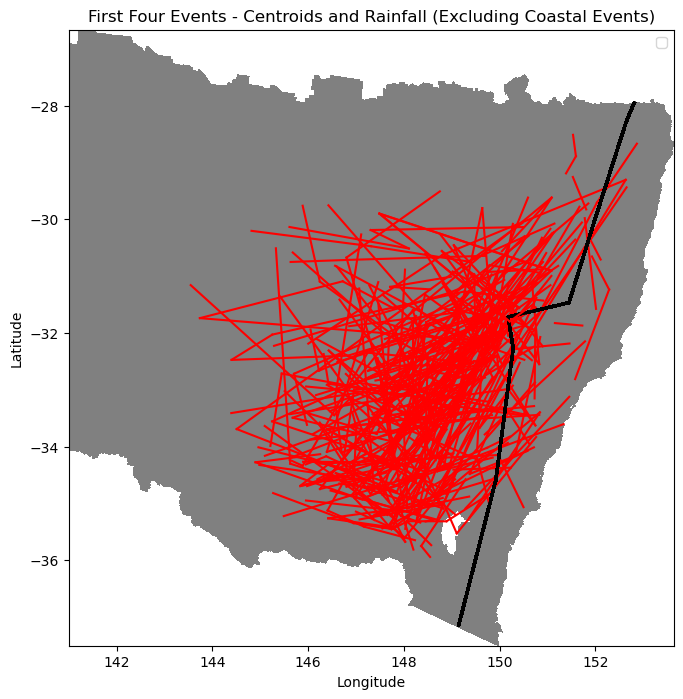

In [33]:
import os
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import geopandas as gpd
from shapely.geometry import Point
from scipy.stats import gaussian_kde

# Define a minimum threshold for KDE values
kde_threshold = 1e-4

def plot_event_centroids(ax, csv_file, polygons_data, linestrings_data, xi, yi, positions, mask, event_label):
    try:
        # Load the CSV file
        df = pd.read_csv(csv_file)

        # Filter out NaN values in latitude and longitude
        x_cleaned = df[['Latitude', 'Longitude'] + [col for col in df.columns if col.startswith('Rainfall')]].dropna()

        # Sum up the rainfall values for the 7 days
        x_cleaned['7_day_accumulated_rainfall'] = x_cleaned[[col for col in x_cleaned.columns if col.startswith('Rainfall')]].sum(axis=1)

        # Perform Gaussian KDE on the accumulated rainfall data
        values = np.vstack([x_cleaned['Longitude'], x_cleaned['Latitude']])
        rainfall = x_cleaned['7_day_accumulated_rainfall']
        kde = gaussian_kde(values, weights=rainfall, bw_method='scott')
        zi = kde(positions).reshape(xi.shape)

        # Mask the grid to include only points inside the polygons geometry
        zi = np.where(mask, zi, np.nan)

        # Plot the polygons and linestrings
        polygons_data.plot(ax=ax, color='gray', edgecolor='none')
        linestrings_data.plot(ax=ax, color='black', linewidth=2)  # Adjust color and linewidth as needed

        # Plot the 2D contour plot with accumulated rainfall as contours
        daily_means = []  # List to store daily mean rainfall
        centroids = []  # List to store retained centroids
        retained_days = []  # List to store retained days

        # Perform KDE for each day and calculate centroids based on threshold
        rainfall_columns = [col for col in x_cleaned.columns if col.startswith('Rainfall')]
        colors = sns.color_palette("husl", len(rainfall_columns))

        for i, col in enumerate(rainfall_columns):
            daily_rainfall = x_cleaned[col]
            daily_mean_rainfall = daily_rainfall.mean()
            daily_means.append(daily_mean_rainfall)
            print(f"{event_label} - Day {i+1} Mean Rainfall: {daily_mean_rainfall:.2f} mm")

        # Calculate the median of the daily mean rainfall
        median_threshold = np.median(daily_means)
        print(f"{event_label} - Median Threshold: {median_threshold:.2f} mm")

        # Track centroids and joined lines
        all_centroids = []
        all_joined_lines = []
        joined_centroids = set()

        for i, col in enumerate(rainfall_columns):
            daily_rainfall = x_cleaned[col]
            daily_mean_rainfall = daily_means[i]

            if daily_mean_rainfall >= median_threshold:
                daily_kde = gaussian_kde(values, weights=daily_rainfall, bw_method='scott')
                daily_zi = daily_kde(positions).reshape(xi.shape)
                daily_zi = np.where(mask, daily_zi, np.nan)
                # Apply the threshold to filter out negligible KDE values
                daily_zi = np.where(daily_zi >= kde_threshold, daily_zi, np.nan)
                daily_contour = ax.contour(xi, yi, daily_zi, levels=1, colors=[colors[i]], linewidths=1.5)

                if daily_contour.collections:
                    paths = [c.get_paths() for c in daily_contour.collections]
                    for path in paths:
                        for p in path:
                            centroid = p.vertices.mean(axis=0)  # Calculate the centroid
                            all_centroids.append(centroid)
                            retained_days.append(i)

                for c in daily_contour.collections:
                    c.remove()  # Remove the contour lines

        if all_centroids:
            all_centroids = np.array(all_centroids)
            centroids_set = set(tuple(c) for c in all_centroids)
            joined_centroids = set()
            joined_lines = []

            for j in range(len(all_centroids)):
                centroid = all_centroids[j]
                ax.plot(centroid[0], centroid[1], marker='', markersize=8, color='red', linestyle='')
                joined_centroids.add(tuple(centroid))

                if j > 0 and retained_days[j] == retained_days[j - 1] + 1:
                    ax.plot([all_centroids[j - 1, 0], centroid[0]], [all_centroids[j - 1, 1], centroid[1]], color='red', linestyle='-', linewidth=1.5)
                    joined_lines.append((all_centroids[j - 1], centroid))

            unjoined_centroids = [c for c in all_centroids if tuple(c) not in joined_centroids]
            for centroid in unjoined_centroids:
                ax.plot(centroid[0], centroid[1], 'o', color='blue', markersize=8, label=f'{event_label} - Unjoined')

            return np.array(all_centroids), joined_lines
    except Exception as e:
        print(f"Error processing {csv_file}: {e}")
        return np.array([]), []

# Load the GeoPackage layers
gpkg_path = '/Users/coolkarni/Documents/Documents/Documents/Master thesis Data/combined_layers.gpkg'
polygons_data = gpd.read_file(gpkg_path, layer='polygons')  # Adjust layer name if necessary
linestrings_data = gpd.read_file(gpkg_path, layer='linestrings')  # Adjust layer name if necessary

# Get the bounds of the polygons
minx, miny, maxx, maxy = polygons_data.total_bounds

# Create a grid of points within the bounds
xi, yi = np.meshgrid(np.linspace(minx, maxx, 100), np.linspace(miny, maxy, 100))

# Flatten the grid to pass into the KDE function
positions = np.vstack([xi.ravel(), yi.ravel()])

# Mask the grid to include only points inside the polygons geometry
points = np.vstack((xi.flatten(), yi.flatten())).T
mask = np.array([polygons_data.contains(Point(point)).any() for point in points])
mask = mask.reshape(xi.shape)

# Load the Excel file and extract unique event names
excel_file = '/Users/coolkarni/Desktop/OneDrive - The University of Melbourne/R1_99_New Events.xlsx'
df_events = pd.read_excel(excel_file, sheet_name='Sheet4')
event_names = df_events['Event'].dropna().unique()

# Load the Coastal Events Excel file and extract event names to exclude
coastal_events_file = '/Users/coolkarni/Documents/Documents/Documents/Master thesis Data/BoM Station Dataset/BoM Station list 4.xlsx'
df_coastal = pd.read_excel(coastal_events_file, sheet_name='Coastal Events')
coastal_events = df_coastal['Coastal Events'].dropna().unique()

# Filter out the coastal events from the event names
filtered_event_names = [event for event in event_names if event not in coastal_events]

# Find the CSV files for each event
csv_dir = '/Users/coolkarni/Documents/Documents/Documents/Master thesis Data/BoM Station Dataset/Rainfall Stored values for R1_99 Events/'
event_files = [os.path.join(csv_dir, f'{event}.csv') for event in filtered_event_names]

# Slice to include only the first four events
event_files = event_files[:-1]  # Changed to only the first four events

# Initialize a list to store the joined lines and centroids for each event
all_joined_lines = []
all_centroids = []

# Plotting
fig, ax = plt.subplots(figsize=(10, 8))
for event_file in event_files:
    event_label = os.path.basename(event_file).replace('.csv', '')
    centroids, joined_lines = plot_event_centroids(ax, event_file, polygons_data, linestrings_data, xi, yi, positions, mask, event_label)
    if centroids.size > 0:
        all_centroids.append({'event': event_label, 'centroids': centroids})
    if joined_lines:
        all_joined_lines.append({'event': event_label, 'joined_lines': joined_lines})

ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.set_title('First Four Events - Centroids and Rainfall (Excluding Coastal Events)')
plt.legend()
plt.show()

# Load existing data if available
existing_joined_lines_file = '/Users/coolkarni/Documents/Documents/Documents/Master thesis Data/joined_lines2.csv'
existing_centroids_file = '/Users/coolkarni/Documents/Documents/Documents/Master thesis Data/centroids2.csv'

if os.path.exists(existing_joined_lines_file):
    df_existing_joined_lines = pd.read_csv(existing_joined_lines_file)
else:
    df_existing_joined_lines = pd.DataFrame(columns=['event', 'start_lon', 'start_lat', 'end_lon', 'end_lat'])

if os.path.exists(existing_centroids_file):
    df_existing_centroids = pd.read_csv(existing_centroids_file)
else:
    df_existing_centroids = pd.DataFrame(columns=['event', 'longitude', 'latitude'])

# Append new data to existing data
new_joined_lines_data = []
for item in all_joined_lines:
    event = item['event']
    for line in item['joined_lines']:
        new_joined_lines_data.append({'event': event, 'start_lon': line[0][0], 'start_lat': line[0][1], 'end_lon': line[1][0], 'end_lat': line[1][1]})

df_new_joined_lines = pd.DataFrame(new_joined_lines_data)
df_combined_joined_lines = pd.concat([df_existing_joined_lines, df_new_joined_lines], ignore_index=True)
df_combined_joined_lines.to_csv(existing_joined_lines_file, index=False)

new_centroids_data = []
for item in all_centroids:
    event = item['event']
    for centroid in item['centroids']:
        new_centroids_data.append({'event': event, 'longitude': centroid[0], 'latitude': centroid[1]})

df_new_centroids = pd.DataFrame(new_centroids_data)
df_combined_centroids = pd.concat([df_existing_centroids, df_new_centroids], ignore_index=True)
df_combined_centroids.to_csv(existing_centroids_file, index=False)
